<a href="https://colab.research.google.com/github/rayeeed/UFP_Project/blob/main/UFP_feature_selection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
#from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score,cross_val_predict
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeCV
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import SelectFromModel
from time import time
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import seaborn as sns
from sklearn.preprocessing import Normalizer,MinMaxScaler,StandardScaler,RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, Lasso, BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.feature_selection import RFE,RFECV
from sklearn.linear_model import (HuberRegressor,
                              	RANSACRegressor, TheilSenRegressor)

In [ ]:
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=49f38833ef6b38ca8156b1fdedf6e56fe84bab9d7cb34417a9a4f9896ba30ca6
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
!pip install optuna
import optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.3 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import KBinsDiscretizer

# Load the dataset
df = pd.read_excel('/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/model_35.xlsx', index_col='site_name')

# Drop unnecessary columns
df.drop(['Site_type', 'OID'], inplace=True, axis=1)

# Separate the target variable and features
y = df['Mean PNC (# / cm3)']
X = df.drop(['Mean PNC (# / cm3)', 'Mean PM2.5 (µg/m3)'], axis=1)

In [ ]:

# # Discretize the target variable into bins
# binner = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform')
# y_binned = binner.fit_transform(y.values.reshape(-1, 1)).flatten()

# # Perform stratified train-test split
# split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42) #added random state
# for train_index, test_index in split.split(X, y_binned):
#     X_train, X_test = X.iloc[train_index], X.iloc[test_index]
#     y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# # Check the distribution of bins in the train and test sets
# print("Train bin distribution:\n", pd.value_counts(y_binned[train_index], sort=False))
# print("Test bin distribution:\n", pd.value_counts(y_binned[test_index], sort=False))

# # Output the resulting dataframes
# print("X_train:\n", X_train.head())
# print("y_train:\n", y_train.head())
# print("X_test:\n", X_test.head())
# print("y_test:\n", y_test.head())


ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

In [ ]:
y_test

site_name
Mirpur_Milk Vita       83200
Dhanmondi_lake_park    30200
Eskaton                67600
Farmgate               77200
Niketan_park           30000
Mirpur_DOHS            47600
Mirpur_1               68600
Name: Mean PNC (# / cm3), dtype: int64

In [ ]:
# Discretize the target variable into bins using 'quantile' strategy
binner = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
y_binned = binner.fit_transform(y.values.reshape(-1, 1)).flatten()

# Perform stratified train-test split
split = StratifiedShuffleSplit(n_splits=1, test_size=.2, random_state=42)
for train_index, test_index in split.split(X, y_binned):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Check the distribution of bins in the train and test sets
print("Train bin distribution:\n", pd.value_counts(y_binned[train_index], sort=False))
print("Test bin distribution:\n", pd.value_counts(y_binned[test_index], sort=False))

# Output the resulting dataframes
print("X_train:\n", X_train.head())
print("y_train:\n", y_train.head())
print("X_test:\n", X_test.head())
print("y_test:\n", y_test.head())

Train bin distribution:
 0.0    5
1.0    6
3.0    5
4.0    6
2.0    6
Name: count, dtype: int64
Test bin distribution:
 0.0    2
1.0    1
3.0    2
2.0    1
4.0    1
Name: count, dtype: int64
X_train:
                  gsv_wall_p100  gsv_building_p100  gsv_house_p100  \
site_name                                                           
Uttara_Sector1        6.797307          32.993471        0.232041   
Azimpur               0.000000           0.000000        0.000000   
US_Embassy            3.237500           2.430000        0.000000   
Elephant_road         0.070000          42.007500        0.000000   
Square_hospital      59.247500           0.000000        0.000000   

                 gsv_awning_p100  gsv_sky_p100  gsv_earth_p100  gsv_tree_p100  \
site_name                                                                       
Uttara_Sector1           0.09694     19.991354         3.48166      15.913745   
Azimpur                  0.00000      0.000000         0.00000       0.0

<ipython-input-4-a1486702b7a8>:12: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  print("Train bin distribution:\n", pd.value_counts(y_binned[train_index], sort=False))
<ipython-input-4-a1486702b7a8>:13: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  print("Test bin distribution:\n", pd.value_counts(y_binned[test_index], sort=False))


In [ ]:
y_train

site_name
Uttara_Sector1         35100
Azimpur                48400
US_Embassy             65700
Elephant_road          69000
Square_hospital        52600
Shimanto_square        49100
Eskaton                67600
Mirpur_DOHS            47600
Airport                56900
Mirpur_Milk Vita       83200
Gulisthan              84800
Farmgate               77200
Agashadek_road         60800
Dhanmondi_lake_park    30200
BUET                   24900
TSC_DU                 65900
Mohammadpur            47600
Baridhara              46000
Rampura                83100
Chandrima_park         23800
Niketan_park           30000
Mirpur_1               68600
Aftabnagar             60300
Mohakhali              65100
Technical              92000
Romna_park             57700
Jamuna_future_park     64000
Khilgaon               51400
Name: Mean PNC (# / cm3), dtype: int64

In [ ]:
y_test

site_name
Tejgaon             43300
Uttara_Sector7      27500
Hatirjhil           43600
New_market          67500
Shangsad_bhaban     68000
Lalbag              58100
Mouchak            109800
Name: Mean PNC (# / cm3), dtype: int64

In [ ]:
from scipy.stats import ks_2samp
ks_statistic, p_value = ks_2samp(y_train, y_test)

print(f"K-S statistic: {ks_statistic}")
print(f"P-value: {p_value}")

# Interpretation
alpha = 0.05
if p_value < alpha:
    print("The null hypothesis is rejected. The distributions of the train and test sets are different.")
else:
    print("The null hypothesis cannot be rejected. The distributions of the train and test sets are the same.")

K-S statistic: 0.25
P-value: 0.842454033893869
The null hypothesis cannot be rejected. The distributions of the train and test sets are the same.


In [ ]:
# Apply Kolmogorov-Smirnov test for each feature
ks_results = {}
failed_features = []
alpha = 0.05
for feature in X.columns:
    ks_statistic, p_value = ks_2samp(X_train[feature], X_test[feature])
    ks_results[feature] = {'ks_statistic': ks_statistic, 'p_value': p_value}
    if p_value < alpha:
        failed_features.append(feature)

# Print K-S test results for each feature
for feature, result in ks_results.items():
    print(f"Feature: {feature}")
    print(f"K-S statistic: {result['ks_statistic']}")
    print(f"P-value: {result['p_value']}")
    if result['p_value'] < alpha:
        print("The null hypothesis is rejected. The distributions of the train and test sets are different for this feature.\n")
    else:
        print("The null hypothesis cannot be rejected. The distributions of the train and test sets are the same for this feature.\n")

# Print features that failed the K-S test
if failed_features:
    print("Features that failed the K-S test (null hypothesis rejected):")
    for feature in failed_features:
        print(f"- {feature}")
else:
    print("All features passed the K-S test (null hypothesis not rejected).")

Feature: gsv_wall_p100
K-S statistic: 0.32142857142857145
P-value: 0.5556032252116138
The null hypothesis cannot be rejected. The distributions of the train and test sets are the same for this feature.

Feature: gsv_building_p100
K-S statistic: 0.17857142857142858
P-value: 0.9883820703931286
The null hypothesis cannot be rejected. The distributions of the train and test sets are the same for this feature.

Feature: gsv_house_p100
K-S statistic: 0.10714285714285714
P-value: 0.9999998512905011
The null hypothesis cannot be rejected. The distributions of the train and test sets are the same for this feature.

Feature: gsv_awning_p100
K-S statistic: 0.21428571428571427
P-value: 0.9411846496106786
The null hypothesis cannot be rejected. The distributions of the train and test sets are the same for this feature.

Feature: gsv_sky_p100
K-S statistic: 0.2857142857142857
P-value: 0.7050303962215889
The null hypothesis cannot be rejected. The distributions of the train and test sets are the same

In [ ]:
X_train_dropped = X_train.drop(columns=failed_features)
X_test_dropped = X_test.drop(columns=failed_features)

In [ ]:
trans = StandardScaler()
X_st = trans.fit_transform(X_train_dropped)
X_st = pd.DataFrame(X_st, columns=X_train_dropped.columns, index=X_train_dropped.index)

In [ ]:
X_test_st = trans.transform(X_test_dropped)
X_test_st = pd.DataFrame(X_test_st, columns=X_test_dropped.columns, index=X_test_dropped.index)

# ***OLS***

selected features: 2
selected features: 3
selected features: 4
selected features: 5
selected features: 6
selected features: 7
selected features: 8
selected features: 9
selected features: 10
Done in 7.341s
RMSE score for train data in LR: 18994.745397580537
cross validation RMSE score: 37126.307569988356
RMSE score for train data in LR: 16420.29072558387
cross validation RMSE score: 23461.72306523826
RMSE score for train data in LR: 16413.537415406565
cross validation RMSE score: 24098.362318449737
RMSE score for train data in LR: 15036.227385312488
cross validation RMSE score: 29402.09333694351
RMSE score for train data in LR: 15036.22738531249
cross validation RMSE score: 29407.819006539492
RMSE score for train data in LR: 10791.732783201543
cross validation RMSE score: 26390.505020626773
RMSE score for train data in LR: 9784.048882291796
cross validation RMSE score: 20785.83602230276
RMSE score for train data in LR: 8445.707739973901
cross validation RMSE score: 18573.478475415544
RM

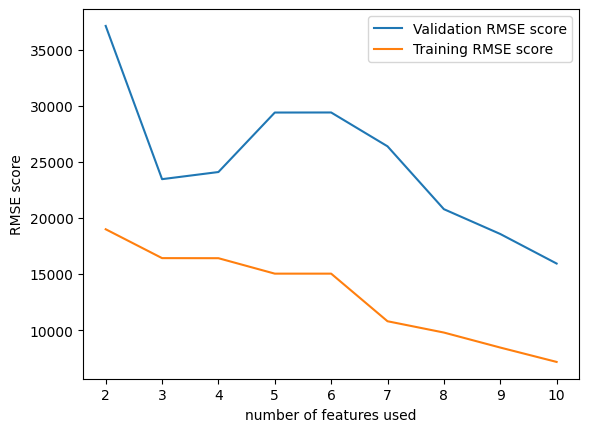

In [ ]:
lstfeature=[]
lsttrainr=[]
lsttrainrmse=[]
lstcvr=[]
lstcvrmse=[]
lst2=[]
tic_fwd = time()
lst2 = []
tic_fwd = time()
for x in range(2, 11):
    lst1 = []
    LR = LinearRegression()
    feature_names = np.array(X_st.columns)

    selector = RFE(LR, n_features_to_select=x, step=1)
    selector.fit(X_st, y_train)
    print(f"selected features: {x}")
    selected_features = X_st.columns[selector.support_]

    for i in selected_features:
        lst1.append(i)
    lst2.append(lst1)

toc_fwd = time()
print(f"Done in {toc_fwd - tic_fwd:.3f}s")

lstfeature = []
lsttrainrmse = []
lstcvrmse = []
for i in lst2:
    featurs = i
    X_Train = X_st[featurs]
    model = LinearRegression()
    model.fit(X_Train, y_train)
    pred_train = model.predict(X_Train)

    rmse_per = mean_squared_error(y_train, pred_train, squared=False)
    print("RMSE score for train data in LR:", rmse_per)
    lsttrainrmse.append(rmse_per)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    print("cross validation RMSE score:", rmse_cv)
    lstfeature.append(len(featurs))
    lstcvrmse.append(rmse_cv)

plt.plot(lstfeature, lstcvrmse, label="Validation RMSE score")
plt.plot(lstfeature, lsttrainrmse, label="Training RMSE score")
plt.xlabel("number of features used")
plt.ylabel("RMSE score")
plt.legend()
plt.show()

In [ ]:
lst2

[['gsv_awning_p100', 'gsv_awning_p150'],
 ['gsv_awning_p100', 'gsv_awning_p150', 'gsv_grass_p150'],
 ['gsv_awning_p100', 'gsv_grass_p100', 'gsv_awning_p150', 'gsv_grass_p150'],
 ['gsv_awning_p100',
  'gsv_grass_p100',
  'gsv_awning_p150',
  'gsv_grass_p150',
  'gsv_bus_p150'],
 ['gsv_awning_p100',
  'gsv_grass_p100',
  'gsv_bus_p100',
  'gsv_awning_p150',
  'gsv_grass_p150',
  'gsv_bus_p150'],
 ['gsv_awning_p100',
  'gsv_grass_p100',
  'gsv_bus_p100',
  'gsv_awning_p150',
  'gsv_grass_p150',
  'gsv_bus_p150',
  'RdL3_500'],
 ['gsv_awning_p100',
  'gsv_grass_p100',
  'gsv_bus_p100',
  'gsv_awning_p150',
  'gsv_grass_p150',
  'gsv_bus_p150',
  'gsv_house_p750',
  'RdL3_500'],
 ['gsv_awning_p100',
  'gsv_grass_p100',
  'gsv_bus_p100',
  'gsv_awning_p150',
  'gsv_grass_p150',
  'gsv_bus_p150',
  'gsv_house_p750',
  'RdclS_250',
  'RdL3_500'],
 ['gsv_awning_p100',
  'gsv_grass_p100',
  'gsv_bus_p100',
  'gsv_awning_p150',
  'gsv_grass_p150',
  'gsv_bus_p150',
  'gsv_signboard_p250',
  'gsv_

In [ ]:
lst1 = ['gsv_house_p750', 'RdAll_150']
model = LinearRegression()

X_train = X_st[lst1]
X_test = X_test_st[lst1]

model.fit(X_train, y_train)
pred_train = model.predict(X_train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

RMSE for train data in LR: 11921.247121555998
R2 for train data in LR: 0.6279389756544946
RMSE for test data in LR: 18342.814732107465
R2 for test data in LR: 0.047081213064093186

Training dataset:
                actual     predicted
site_name                           
BUET             24900  44321.217456
Niketan_park     30000  37218.514811
TSC_DU           65900  71372.773645
Agashadek_road   60800  54133.099966
US_Embassy       65700  66054.124708

Test dataset:
                  actual     predicted
site_name                             
Mirpur_DOHS        47600  42619.647760
Mirpur_Milk Vita   83200  57908.838466
Airport            56900  51242.682287
Uttara_Sector7     27500  57992.264854
Shangsad_bhaban    68000  60512.407484


In [ ]:
new_test

,actual,predicted
site_name,,
Mirpur_DOHS,47600,42619.647760
Mirpur_Milk Vita,83200,57908.838466
Airport,56900,51242.682287
Uttara_Sector7,27500,57992.264854
Shangsad_bhaban,68000,60512.407484


In [ ]:
import itertools
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict

# Mandatory features
mandatory_features = ['RdAll_150', 'gsv_house_p750']

# Additional features to choose from
additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000',
                       'RdL3_1000', 'RdclP_150', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']

# Function to run the evaluation and train the model
def evaluate_model(features):
    X_Train = X_st[features]
    X_test = X_test_st[features]

    model = LinearRegression()
    model.fit(X_Train, y_train)

    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    r2_train = r2_score(y_train, pred_train)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    r2_cv = r2_score(y_train, predicted)

    predicted_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
    r2_test = r2_score(y_test, predicted_test)

    return {
        "features": features,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "rmse_cv": rmse_cv,
        "r2_cv": r2_cv,
        "rmse_test": rmse_test,
        "r2_test": r2_test
    }

# Generate combinations of features including mandatory features and 1, 2, or 3 additional features
results = []
for r in range(1, 4):  # Select 1, 2, or 3 additional features
    for combo in itertools.combinations(additional_features, r):
        feature_set = list(mandatory_features) + list(combo)
        if all(feature in X_st.columns for feature in feature_set):
            print(f"Evaluating combination: {feature_set}")
            try:
                result = evaluate_model(feature_set)
                results.append(result)
            except ValueError as e:
                if "Input contains NaN" in str(e):
                    print(f"Skipping combination due to NaN values: {feature_set}")
                else:
                    raise e  # Raise the error if it's not due to NaN values
        else:
            print(f"Skipping combination due to missing feature: {feature_set}")

# Create a DataFrame to store the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df.head())

# Save the results to a CSV file
results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results_linear_regression.csv", index=False)


Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150']
Evaluating combination: ['RdAll_150', 'gsv

# ***XGBoost***

In [ ]:
import xgboost as xgb
dtrain = xgb.DMatrix(X_st, label=y_train)

In [ ]:
lstfeature=[]
lsttrainr=[]
lsttrainrmse=[]
lstcvr=[]
lstcvrmse=[]
lst2=[]
tic_fwd = time()
for x in range(2,11):
  lst1=[]

  feature_names = np.array(X_st.columns)

  estimator = XGBRegressor(booster='gblinear',objective= "reg:squarederror")

  selector = RFE(estimator, n_features_to_select=x)
  selector.fit(X_st, y_train)
  print(f"selected features: {x}")
  selected_features = X_st.columns[selector.get_support()]

  for i in selected_features:
    lst1.append(i)
  lst2.append(lst1)

toc_fwd = time()
print(f"Done in {toc_fwd - tic_fwd:.3f}s")

selected features: 2
selected features: 3
selected features: 4
selected features: 5
selected features: 6
selected features: 7
selected features: 8
selected features: 9
selected features: 10
Done in 73.905s


In [ ]:
lst2

[['gsv_grass_p100', 'RdAll_150'],
 ['gsv_grass_p100', 'gsv_road_p100', 'gsv_streetligh_p100'],
 ['gsv_plant_p100', 'gsv_tree_p150', 'RdAll_100', 'rest_s150'],
 ['gsv_tree_p150', 'gsv_poster_p250', 'RdAll_100', 'RdAll_150', 'rest_s250'],
 ['gsv_plant_p100',
  'gsv_grass_p100',
  'gsv_pole_p100',
  'gsv_tree_p150',
  'RdAll_100',
  'rest_s100'],
 ['gsv_house_p100',
  'gsv_tree_p150',
  'gsv_water_p500',
  'gsv_awning_p1250',
  'gsv_path_p1500',
  'gsv_minibike_p1500',
  'RdAll_150'],
 ['gsv_grass_p100',
  'gsv_road_p100',
  'gsv_streetligh_p100',
  'gsv_sidewalk_p150',
  'gsv_water_p500',
  'gsv_house_p1250',
  'gsv_minibike_p1500',
  'RdAll_150'],
 ['gsv_grass_p100',
  'gsv_bus_p100',
  'gsv_wall_p250',
  'gsv_streetligh_p250',
  'gsv_poster_p250',
  'gsv_awning_p1000',
  'gsv_house_p1250',
  'gsv_streetligh_p1500',
  'RdAll_150'],
 ['gsv_tree_p100',
  'gsv_plant_p100',
  'gsv_grass_p100',
  'gsv_road_p100',
  'gsv_plant_p150',
  'gsv_poster_p250',
  'gsv_house_p1250',
  'RdAll_100',
  

In [ ]:
X_Train = X_st[lst2[1]]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=50)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

[I 2024-07-04 19:08:59,680] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 19:09:00,184] Trial 0 finished with value: 15900.397498339746 and parameters: {'learning_rate': 0.017820768483507984, 'n_estimators': 598, 'reg_alpha': 73.65141242903267, 'reg_lambda': 1.1570888386529625}. Best is trial 0 with value: 15900.397498339746.
[I 2024-07-04 19:09:00,317] Trial 1 finished with value: 17338.002263341485 and parameters: {'learning_rate': 1.0704820892302311, 'n_estimators': 50, 'reg_alpha': 13.277452311852645, 'reg_lambda': 2.8482304367598434}. Best is trial 0 with value: 15900.397498339746.
[I 2024-07-04 19:09:00,519] Trial 2 finished with value: 16940.839903546774 and parameters: {'learning_rate': 0.8108015298638265, 'n_estimators': 106, 'reg_alpha': 81.07380499635178, 'reg_lambda': 2.1059192253608816}. Best is trial 0 with value: 15900.397498339746.
[I 2024-07-04 19:09:00,719] Trial 3 finished with value: 17282.642461089752 and parameters: {'learning_rate': 0.2042256322

Best RMSE: 12729.057516188153
Best parameters: {'learning_rate': 1.2682881591453126, 'n_estimators': 285, 'reg_alpha': 0.5717396436034292, 'reg_lambda': 0.1281712359528966}


In [ ]:
study.optimize(objective, n_trials=500)

[I 2024-07-04 18:33:12,282] Trial 50 finished with value: 16247.96436779467 and parameters: {'learning_rate': 0.541768954702521, 'n_estimators': 594, 'reg_alpha': 68.83882489293849, 'reg_lambda': 0.5650192556889407}. Best is trial 11 with value: 15410.400799911335.
[I 2024-07-04 18:33:12,687] Trial 51 finished with value: 15430.60996784743 and parameters: {'learning_rate': 0.13677549046886492, 'n_estimators': 422, 'reg_alpha': 70.04571724386749, 'reg_lambda': 0.1170746163398551}. Best is trial 11 with value: 15410.400799911335.
[I 2024-07-04 18:33:12,965] Trial 52 finished with value: 15412.90735022796 and parameters: {'learning_rate': 0.21754516860515943, 'n_estimators': 272, 'reg_alpha': 63.82395317714181, 'reg_lambda': 0.1018436342343651}. Best is trial 11 with value: 15410.400799911335.
[I 2024-07-04 18:33:13,281] Trial 53 finished with value: 15881.83921056549 and parameters: {'learning_rate': 0.21681297345035866, 'n_estimators': 260, 'reg_alpha': 34.82420954093367, 'reg_lambda': 

In [ ]:
X_Train = X_st[lst2[1]]
X_test = X_test_st[lst2[1]]
best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

best parameters: {'learning_rate': 1.2682881591453126, 'n_estimators': 285, 'reg_alpha': 0.5717396436034292, 'reg_lambda': 0.1281712359528966}
RMSE for train data in LR: 11293.512881828388
R2 for train data in LR: 0.6031289758394893
RMSE for test data in LR: 22479.386840301555
R2 for test data in LR: 0.1592582837796469

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  57609.441406
Azimpur           48400  56353.101562
US_Embassy        65700  65239.683594
Elephant_road     69000  74436.203125
Square_hospital   52600  56353.101562

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  64539.730469
Uttara_Sector7    27500  57600.945312
Hatirjhil         43600  67148.187500
New_market        67500  60051.535156
Shangsad_bhaban   68000  63754.894531


In [ ]:
new_test

,actual,predicted
site_name,,
Tejgaon,43300,64539.730469
Uttara_Sector7,27500,57600.945312
Hatirjhil,43600,67148.187500
New_market,67500,60051.535156
Shangsad_bhaban,68000,63754.894531
Lalbag,58100,56353.101562
Mouchak,109800,70442.695312


In [ ]:
lstfeature=[]
lsttrainr=[]
lsttrainrmse=[]
lstcvr=[]
lstcvrmse=[]
lst2=[]
tic_fwd = time()
for x in range(2,11):
  lst1=[]

  feature_names = np.array(X_st.columns)

  estimator = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)

  selector = RFE(estimator, n_features_to_select=x)
  selector.fit(X_st, y_train)
  print(f"selected features: {x}")
  selected_features = X_st.columns[selector.get_support()]

  for i in selected_features:
    lst1.append(i)
  lst2.append(lst1)

toc_fwd = time()
print(f"Done in {toc_fwd - tic_fwd:.3f}s")

selected features: 2
selected features: 3
selected features: 4
selected features: 5
selected features: 6
selected features: 7
selected features: 8
selected features: 9
selected features: 10
Done in 128.136s


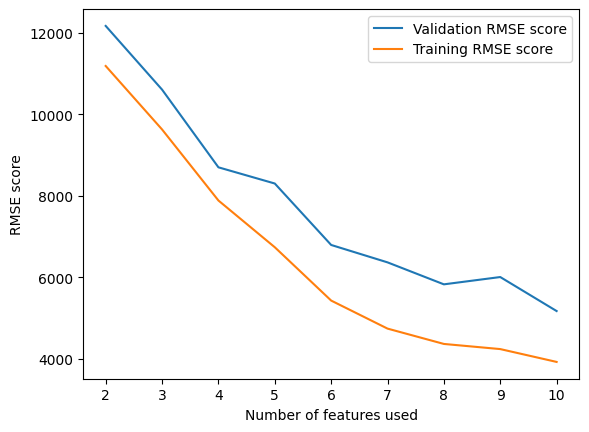

In [ ]:
lstfeature=[]
lsttrainrmse=[]
lstcvrmse=[]
for i in lst2:
    features = i
    X_Train = X_st[features]
    model = XGBRegressor(booster='gblinear',
                          learning_rate=best_params['learning_rate'],
                          n_estimators=best_params['n_estimators'],
                          reg_alpha=best_params['reg_alpha'],
                          reg_lambda=best_params['reg_lambda'],
                          objective="reg:squarederror",
                          seed=42)
    model.fit(X_Train, y_train)

    # Training RMSE
    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    lsttrainrmse.append(rmse_train)

    # Cross-validation RMSE
    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    lstcvrmse.append(rmse_cv)

    lstfeature.append(len(features))

plt.plot(lstfeature, lstcvrmse, label="Validation RMSE score")
plt.plot(lstfeature, lsttrainrmse, label="Training RMSE score")
plt.xlabel("Number of features used")
plt.ylabel("RMSE score")
plt.legend()
plt.show()


In [ ]:
lst2

[['gsv_house_p250', 'RdAll_150'],
 ['gsv_house_p250', 'gsv_fence_p250', 'RdAll_150'],
 ['gsv_grass_p100', 'gsv_house_p250', 'gsv_fence_p250', 'RdAll_150'],
 ['gsv_grass_p100',
  'gsv_house_p250',
  'gsv_fence_p250',
  'RdAll_150',
  'RdL3_750'],
 ['gsv_grass_p100',
  'gsv_house_p250',
  'gsv_fence_p250',
  'gsv_house_p750',
  'RdAll_150',
  'RdL3_750'],
 ['gsv_grass_p100',
  'gsv_house_p250',
  'gsv_fence_p250',
  'gsv_signboard_p500',
  'gsv_house_p750',
  'RdAll_150',
  'RdL3_750'],
 ['gsv_grass_p100',
  'gsv_house_p250',
  'gsv_fence_p250',
  'gsv_signboard_p500',
  'gsv_house_p750',
  'RdAll_150',
  'RdclS_500',
  'RdL3_750'],
 ['gsv_grass_p100',
  'gsv_house_p250',
  'gsv_fence_p250',
  'gsv_signboard_p500',
  'gsv_house_p750',
  'RdAll_150',
  'RdclS_500',
  'RdL3_100',
  'RdL3_750'],
 ['gsv_grass_p100',
  'gsv_house_p250',
  'gsv_fence_p250',
  'gsv_signboard_p500',
  'gsv_house_p750',
  'gsv_field_p1500',
  'RdAll_150',
  'RdclS_500',
  'RdL3_100',
  'RdL3_750']]

In [ ]:
lstcvrmse

[11130.421802038027,
 9036.034141828392,
 8127.776874062785,
 7843.392601368104,
 6927.014735910101,
 6660.21437345685,
 6591.423992637584,
 5611.418913422564,
 5084.761603350575]

In [ ]:
lsttrainrmse

[9965.919930901144,
 7809.856582078347,
 6800.8159704057125,
 6337.455127425737,
 5600.262862514598,
 5208.093497972301,
 4949.827931732768,
 4003.224895100302,
 3552.436710550704]

In [ ]:
X_Train = X_st[lst2[2]]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

[I 2024-07-04 18:44:36,529] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 18:44:39,930] Trial 0 finished with value: 12873.354763450097 and parameters: {'learning_rate': 1.3894148853418644, 'n_estimators': 784, 'reg_alpha': 85.6552210889403, 'reg_lambda': 1.0891765312937245}. Best is trial 0 with value: 12873.354763450097.
[I 2024-07-04 18:44:42,993] Trial 1 finished with value: 9871.544028408063 and parameters: {'learning_rate': 0.6385702587389362, 'n_estimators': 930, 'reg_alpha': 53.45100023237782, 'reg_lambda': 0.3397219367610818}. Best is trial 1 with value: 9871.544028408063.
[I 2024-07-04 18:44:45,255] Trial 2 finished with value: 11855.906967341089 and parameters: {'learning_rate': 0.29485825782497294, 'n_estimators': 568, 'reg_alpha': 73.01069253784271, 'reg_lambda': 0.7754845924847065}. Best is trial 1 with value: 9871.544028408063.
[I 2024-07-04 18:44:45,821] Trial 3 finished with value: 12361.14137518843 and parameters: {'learning_rate': 1.1521683147845931

Best RMSE: 8699.259746349806
Best parameters: {'learning_rate': 0.5336185364001925, 'n_estimators': 967, 'reg_alpha': 1.9010851442231576, 'reg_lambda': 0.1003966927963696}


In [ ]:
X_Train = X_st[lst2[1]]
X_test = X_test_st[lst2[1]]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

best parameters: {'learning_rate': 0.5336185364001925, 'n_estimators': 967, 'reg_alpha': 1.9010851442231576, 'reg_lambda': 0.1003966927963696}
RMSE for train data in LR: 9628.298173265397
R2 for train data in LR: 0.7572999541849504
RMSE for test data in LR: 23253.951069396455
R2 for test data in LR: -0.5315015428066778

Training dataset:
                actual     predicted
site_name                           
BUET             24900  34032.097656
Niketan_park     30000  29896.935547
TSC_DU           65900  75658.828125
Agashadek_road   60800  58003.886719
US_Embassy       65700  57860.441406

Test dataset:
                  actual     predicted
site_name                             
Mirpur_DOHS        47600  43423.023438
Mirpur_Milk Vita   83200  43916.429688
Airport            56900  40610.210938
Uttara_Sector7     27500  56649.277344
Shangsad_bhaban    68000  62704.003906


In [ ]:
new_test

,actual,predicted
site_name,,
Mirpur_DOHS,47600,47142.859375
Mirpur_Milk Vita,83200,46839.195312
Airport,56900,41558.109375
Uttara_Sector7,27500,56453.175781
Shangsad_bhaban,68000,60205.007812


In [ ]:
X_Train = X_st[lst2[2]]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=1000)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

[I 2024-06-24 02:53:52,216] A new study created in memory with name: XGB_RMSE
[I 2024-06-24 02:53:53,256] Trial 0 finished with value: 13881.843498103368 and parameters: {'learning_rate': 0.9697747744679048, 'n_estimators': 345, 'reg_alpha': 85.74133664625693, 'reg_lambda': 2.166820498334524}. Best is trial 0 with value: 13881.843498103368.
[I 2024-06-24 02:53:54,214] Trial 1 finished with value: 10276.598693296319 and parameters: {'learning_rate': 1.0587971815174364, 'n_estimators': 625, 'reg_alpha': 57.51587829954032, 'reg_lambda': 0.6818493601309735}. Best is trial 1 with value: 10276.598693296319.
[I 2024-06-24 02:53:54,608] Trial 2 finished with value: 11200.874418405272 and parameters: {'learning_rate': 0.31306181972529235, 'n_estimators': 114, 'reg_alpha': 69.36066169945535, 'reg_lambda': 0.9352245219283695}. Best is trial 1 with value: 10276.598693296319.
[I 2024-06-24 02:53:55,871] Trial 3 finished with value: 13680.161147028837 and parameters: {'learning_rate': 0.945057799391

Best RMSE: 8113.8713190841945
Best parameters: {'learning_rate': 0.6097706965205906, 'n_estimators': 735, 'reg_alpha': 0.3776349003471635, 'reg_lambda': 0.14321917414817611}


In [ ]:
X_Train = X_st[lst2[2]]
X_test = X_test_st[lst2[2]]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

best parameters: {'learning_rate': 0.6097706965205906, 'n_estimators': 735, 'reg_alpha': 0.3776349003471635, 'reg_lambda': 0.14321917414817611}
RMSE for train data in LR: 6880.913328564091
R2 for train data in LR: 0.85267262060316
RMSE for test data in LR: 21871.923232956207
R2 for test data in LR: 0.20408329351006393

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  43833.648438
Azimpur           48400  42110.296875
US_Embassy        65700  58515.421875
Elephant_road     69000  55987.945312
Square_hospital   52600  59399.230469

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  48271.835938
Uttara_Sector7    27500  58854.640625
Hatirjhil         43600  67715.625000
New_market        67500  64677.957031
Shangsad_bhaban   68000  55988.164062


In [ ]:
new_test

,actual,predicted
site_name,,
Tejgaon,43300,48271.835938
Uttara_Sector7,27500,58854.640625
Hatirjhil,43600,67715.625000
New_market,67500,64677.957031
Shangsad_bhaban,68000,55988.164062
Lalbag,58100,62162.199219
Mouchak,109800,69918.656250


In [ ]:
X_Train = X_st[lst2[4]]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

[I 2024-06-24 04:04:52,884] A new study created in memory with name: XGB_RMSE
[I 2024-06-24 04:04:53,563] Trial 0 finished with value: 13171.458179772135 and parameters: {'learning_rate': 0.031113231299013264, 'n_estimators': 750, 'reg_alpha': 61.55255921793427, 'reg_lambda': 2.29312627673793}. Best is trial 0 with value: 13171.458179772135.
[I 2024-06-24 04:04:54,197] Trial 1 finished with value: 13114.534686170942 and parameters: {'learning_rate': 0.8570297785573048, 'n_estimators': 685, 'reg_alpha': 33.30142600180868, 'reg_lambda': 2.2702808431092665}. Best is trial 1 with value: 13114.534686170942.
[I 2024-06-24 04:04:54,673] Trial 2 finished with value: 10009.467362856112 and parameters: {'learning_rate': 1.0491075726357113, 'n_estimators': 553, 'reg_alpha': 26.66524255588642, 'reg_lambda': 0.8785753788522064}. Best is trial 2 with value: 10009.467362856112.
[I 2024-06-24 04:04:55,171] Trial 3 finished with value: 12769.117417509775 and parameters: {'learning_rate': 0.329544299001

Best RMSE: 6927.04202642887
Best parameters: {'learning_rate': 0.057619471342588754, 'n_estimators': 746, 'reg_alpha': 0.19009785420084463, 'reg_lambda': 0.10003608447979814}


In [ ]:
X_Train = X_st[lst2[4]]
X_test = X_test_st[lst2[4]]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

best parameters: {'learning_rate': 0.057619471342588754, 'n_estimators': 746, 'reg_alpha': 0.19009785420084463, 'reg_lambda': 0.10003608447979814}
RMSE for train data in LR: 5600.267674569075
R2 for train data in LR: 0.902409204188836
RMSE for test data in LR: 22110.192102714267
R2 for test data in LR: 0.18664768565559098

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  43101.421875
Azimpur           48400  43501.250000
US_Embassy        65700  57435.835938
Elephant_road     69000  61534.167969
Square_hospital   52600  57938.734375

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  48751.773438
Uttara_Sector7    27500  57560.437500
Hatirjhil         43600  66243.687500
New_market        67500  61069.210938
Shangsad_bhaban   68000  58192.957031


SFS out RF in

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from tqdm import tqdm

# Assuming X_st is the standardized feature matrix and y_train is the target variable
# Example: X_st = pd.DataFrame(np.random.randn(100, 461)) and y_train = np.random.randn(100)

# Initialize a dataframe to store cumulative feature importances
cumulative_importances = np.zeros(X_st.shape[1])

# Repeat the process 100 times
for _ in tqdm(range(100)):
    # Train a Random Forest model
    rf = RandomForestRegressor(n_estimators=1000, random_state=None)  # random_state=None to ensure different randomizations
    rf.fit(X_st, y_train)

    # Accumulate feature importances
    cumulative_importances += rf.feature_importances_

# Calculate average importances
average_importances = cumulative_importances / 100

# Create a DataFrame for the feature importances
feature_importances_df = pd.DataFrame({'Feature': X_st.columns, 'Importance': average_importances})

# Sort the DataFrame based on importance
feature_importances_df.sort_values(by='Importance', ascending=False, inplace=True)

# Display the top 10 features
print(feature_importances_df.head(10))

100%|██████████| 100/100 [05:20<00:00,  3.21s/it]

                Feature  Importance
263           RdAll_150    0.196380
110      gsv_house_p750    0.168790
264           RdAll_250    0.027355
78   gsv_signboard_p250    0.020197
95    gsv_sidewalk_p500    0.019553
153       gsv_bus_p1000    0.019175
126        gsv_bus_p750    0.017561
311           RdL3_1000    0.017347
273           RdclP_150    0.014987
317            RdL3_750    0.012623


In [ ]:
X_Train = X_st[['RdAll_150','gsv_house_p750']]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

[I 2024-07-04 19:37:41,762] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 19:37:41,980] Trial 0 finished with value: 14517.937802976647 and parameters: {'learning_rate': 0.32119736619708117, 'n_estimators': 205, 'reg_alpha': 50.60664062280002, 'reg_lambda': 1.7957094243407778}. Best is trial 0 with value: 14517.937802976647.
[I 2024-07-04 19:37:42,561] Trial 1 finished with value: 15727.552575276799 and parameters: {'learning_rate': 0.9383591110546887, 'n_estimators': 776, 'reg_alpha': 54.915460720087424, 'reg_lambda': 2.995768817123274}. Best is trial 0 with value: 14517.937802976647.
[I 2024-07-04 19:37:42,860] Trial 2 finished with value: 14350.856970056966 and parameters: {'learning_rate': 1.2597820741647108, 'n_estimators': 349, 'reg_alpha': 53.70294855423283, 'reg_lambda': 1.6774402849261003}. Best is trial 2 with value: 14350.856970056966.
[I 2024-07-04 19:37:43,087] Trial 3 finished with value: 15515.194692102705 and parameters: {'learning_rate': 1.11941868917

Best RMSE: 11078.197582925235
Best parameters: {'learning_rate': 1.2159692070421897, 'n_estimators': 114, 'reg_alpha': 0.19729011768797466, 'reg_lambda': 0.1556052826952066}


In [ ]:
X_Train = X_st[['RdAll_150','gsv_house_p750']]
X_test = X_test_st[['RdAll_150','gsv_house_p750']]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

best parameters: {'learning_rate': 1.2159692070421897, 'n_estimators': 114, 'reg_alpha': 0.19729011768797466, 'reg_lambda': 0.1556052826952066}
RMSE for train data in LR: 10042.210370768968
R2 for train data in LR: 0.6862021824182847
RMSE for test data in LR: 21203.878275461877
R2 for test data in LR: 0.25196093321588686

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  42117.507812
Azimpur           48400  40150.144531
US_Embassy        65700  63343.691406
Elephant_road     69000  55103.875000
Square_hospital   52600  56327.902344

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  42613.085938
Uttara_Sector7    27500  57202.269531
Hatirjhil         43600  68436.554688
New_market        67500  61122.609375
Shangsad_bhaban   68000  60294.531250


In [ ]:
new_test

,actual,predicted
site_name,,
Tejgaon,43300,42613.085938
Uttara_Sector7,27500,57202.269531
Hatirjhil,43600,68436.554688
New_market,67500,61122.609375
Shangsad_bhaban,68000,60294.531250
Lalbag,58100,56095.101562
Mouchak,109800,70511.132812


In [ ]:
fs = ['RdAll_150','gsv_house_p750','gsv_signboard_p250']
X_Train = X_st[fs]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

[I 2024-07-04 19:45:52,434] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 19:45:52,844] Trial 0 finished with value: 15420.69774408256 and parameters: {'learning_rate': 0.2116157093172374, 'n_estimators': 483, 'reg_alpha': 75.58882150219762, 'reg_lambda': 2.7800494917096077}. Best is trial 0 with value: 15420.69774408256.
[I 2024-07-04 19:45:53,363] Trial 1 finished with value: 14798.950090255046 and parameters: {'learning_rate': 0.5417648978318349, 'n_estimators': 599, 'reg_alpha': 78.25144061454928, 'reg_lambda': 2.1448266283088233}. Best is trial 1 with value: 14798.950090255046.
[I 2024-07-04 19:45:53,750] Trial 2 finished with value: 15552.274063212275 and parameters: {'learning_rate': 1.46525331074087, 'n_estimators': 390, 'reg_alpha': 29.77538730366067, 'reg_lambda': 2.966470096947198}. Best is trial 1 with value: 14798.950090255046.
[I 2024-07-04 19:45:54,267] Trial 3 finished with value: 13281.066044442641 and parameters: {'learning_rate': 0.9231545518336675,

Best RMSE: 10516.630641228801
Best parameters: {'learning_rate': 0.6861053636600878, 'n_estimators': 983, 'reg_alpha': 5.171071947145206, 'reg_lambda': 0.10823139757120252}


In [ ]:
X_Train = X_st[fs]
X_test = X_test_st[fs]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

best parameters: {'learning_rate': 0.6861053636600878, 'n_estimators': 983, 'reg_alpha': 5.171071947145206, 'reg_lambda': 0.10823139757120252}
RMSE for train data in LR: 9151.314104215693
R2 for train data in LR: 0.7394097197675062
RMSE for test data in LR: 20595.847029950663
R2 for test data in LR: 0.2942465821660252

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  40119.597656
Azimpur           48400  39495.058594
US_Embassy        65700  60559.011719
Elephant_road     69000  65650.078125
Square_hospital   52600  60211.238281

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  40219.839844
Uttara_Sector7    27500  55964.835938
Hatirjhil         43600  64498.914062
New_market        67500  58862.378906
Shangsad_bhaban   68000  57109.128906


In [ ]:
new_test

,actual,predicted
site_name,,
Tejgaon,43300,40219.839844
Uttara_Sector7,27500,55964.835938
Hatirjhil,43600,64498.914062
New_market,67500,58862.378906
Shangsad_bhaban,68000,57109.128906
Lalbag,58100,59401.671875
Mouchak,109800,70839.640625


In [ ]:
fs = ['RdAll_150','gsv_house_p750','gsv_signboard_p250','gsv_sidewalk_p500']
X_Train = X_st[fs]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

X_Train = X_st[fs]
X_test = X_test_st[fs]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

new_test

[I 2024-07-04 19:55:29,585] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 19:55:30,481] Trial 0 finished with value: 13843.383231535367 and parameters: {'learning_rate': 0.5543001768138209, 'n_estimators': 540, 'reg_alpha': 39.42987518878383, 'reg_lambda': 1.5787322125071923}. Best is trial 0 with value: 13843.383231535367.
[I 2024-07-04 19:55:32,877] Trial 1 finished with value: 13328.698353433036 and parameters: {'learning_rate': 0.06806258986850817, 'n_estimators': 673, 'reg_alpha': 12.567990877048098, 'reg_lambda': 1.2848548070640957}. Best is trial 1 with value: 13328.698353433036.
[I 2024-07-04 19:55:34,037] Trial 2 finished with value: 13788.131861160287 and parameters: {'learning_rate': 0.5542105797238386, 'n_estimators': 628, 'reg_alpha': 58.24639017239877, 'reg_lambda': 1.5361472956857105}. Best is trial 1 with value: 13328.698353433036.
[I 2024-07-04 19:55:34,428] Trial 3 finished with value: 12273.088504659456 and parameters: {'learning_rate': 1.0650366699

Best RMSE: 10540.513529576327
Best parameters: {'learning_rate': 0.4389148993351894, 'n_estimators': 210, 'reg_alpha': 0.13896916005586601, 'reg_lambda': 0.10028097969233295}
best parameters: {'learning_rate': 0.4389148993351894, 'n_estimators': 210, 'reg_alpha': 0.13896916005586601, 'reg_lambda': 0.10028097969233295}
RMSE for train data in LR: 8938.078229022542
R2 for train data in LR: 0.7514123254848292
RMSE for test data in LR: 20911.93275729156
R2 for test data in LR: 0.2724178724835047

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  39561.519531
Azimpur           48400  38365.917969
US_Embassy        65700  61514.402344
Elephant_road     69000  65892.914062
Square_hospital   52600  61322.976562

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  42925.921875
Uttara_Sector7    27500  54364.015625
Hatirjhil         43600  68122.765625
New_market    

,actual,predicted
site_name,,
Tejgaon,43300,42925.921875
Uttara_Sector7,27500,54364.015625
Hatirjhil,43600,68122.765625
New_market,67500,57840.960938
Shangsad_bhaban,68000,57372.191406
Lalbag,58100,57733.562500
Mouchak,109800,70664.343750


In [ ]:
fs = ['RdAll_150','gsv_house_p750','gsv_signboard_p250','gsv_sidewalk_p500','gsv_bus_p1000']
X_Train = X_st[fs]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

X_Train = X_st[fs]
X_test = X_test_st[fs]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

new_test

[I 2024-07-04 20:03:56,412] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 20:03:56,805] Trial 0 finished with value: 12370.220379685894 and parameters: {'learning_rate': 0.6596157361632794, 'n_estimators': 401, 'reg_alpha': 21.601006443399864, 'reg_lambda': 0.6769103354487693}. Best is trial 0 with value: 12370.220379685894.
[I 2024-07-04 20:03:57,562] Trial 1 finished with value: 11515.511851858395 and parameters: {'learning_rate': 0.15587749106282983, 'n_estimators': 922, 'reg_alpha': 6.68293140491754, 'reg_lambda': 0.26905829800089776}. Best is trial 1 with value: 11515.511851858395.
[I 2024-07-04 20:03:57,826] Trial 2 finished with value: 15052.046848217262 and parameters: {'learning_rate': 0.025620136657143598, 'n_estimators': 206, 'reg_alpha': 16.55199531246237, 'reg_lambda': 2.7260708332933272}. Best is trial 1 with value: 11515.511851858395.
[I 2024-07-04 20:03:58,638] Trial 3 finished with value: 15093.184661057543 and parameters: {'learning_rate': 1.29728019

Best RMSE: 11264.358650435674
Best parameters: {'learning_rate': 0.19815263607386505, 'n_estimators': 547, 'reg_alpha': 99.90396873039877, 'reg_lambda': 0.10043881802521193}
best parameters: {'learning_rate': 0.19815263607386505, 'n_estimators': 547, 'reg_alpha': 99.90396873039877, 'reg_lambda': 0.10043881802521193}
RMSE for train data in LR: 8954.220955348976
R2 for train data in LR: 0.750513584960721
RMSE for test data in LR: 20929.79024243446
R2 for test data in LR: 0.2711747224889297

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  39735.628906
Azimpur           48400  38545.058594
US_Embassy        65700  61507.996094
Elephant_road     69000  65694.921875
Square_hospital   52600  61224.460938

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  43016.320312
Uttara_Sector7    27500  54439.609375
Hatirjhil         43600  68026.726562
New_market       

,actual,predicted
site_name,,
Tejgaon,43300,43016.320312
Uttara_Sector7,27500,54439.609375
Hatirjhil,43600,68026.726562
New_market,67500,57892.921875
Shangsad_bhaban,68000,57408.933594
Lalbag,58100,57714.500000
Mouchak,109800,70566.218750


In [ ]:
fs = ['RdAll_150','gsv_house_p750','gsv_signboard_p250','gsv_sidewalk_p500','RdL3_1000']
X_Train = X_st[fs]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

X_Train = X_st[fs]
X_test = X_test_st[fs]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data in LR:", rmse_train)
print("R2 for train data in LR:", r2_train)
print("RMSE for test data in LR:", rmse_test)
print("R2 for test data in LR:", r2_test)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

new_test

[I 2024-07-04 20:11:33,219] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 20:11:33,639] Trial 0 finished with value: 11765.551112314715 and parameters: {'learning_rate': 0.74514543823426, 'n_estimators': 409, 'reg_alpha': 2.8313344249516295, 'reg_lambda': 0.7472317277696232}. Best is trial 0 with value: 11765.551112314715.
[I 2024-07-04 20:11:33,867] Trial 1 finished with value: 12015.169628789336 and parameters: {'learning_rate': 0.172501720195184, 'n_estimators': 172, 'reg_alpha': 89.77621760355542, 'reg_lambda': 0.8244323295579066}. Best is trial 0 with value: 11765.551112314715.
[I 2024-07-04 20:11:34,235] Trial 2 finished with value: 15012.908936039887 and parameters: {'learning_rate': 0.3780080935196033, 'n_estimators': 374, 'reg_alpha': 89.96632942491063, 'reg_lambda': 2.964231709348233}. Best is trial 0 with value: 11765.551112314715.
[I 2024-07-04 20:11:34,370] Trial 3 finished with value: 12169.75442187082 and parameters: {'learning_rate': 0.6437727569113819

Best RMSE: 10431.568913872174
Best parameters: {'learning_rate': 0.7666430115004431, 'n_estimators': 200, 'reg_alpha': 3.19569830498821, 'reg_lambda': 0.13849047231941194}
best parameters: {'learning_rate': 0.7666430115004431, 'n_estimators': 200, 'reg_alpha': 3.19569830498821, 'reg_lambda': 0.13849047231941194}
RMSE for train data in LR: 8633.025155922825
R2 for train data in LR: 0.7680911610582849
RMSE for test data in LR: 19014.33174770553
R2 for test data in LR: 0.3984720541133755

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  38450.289062
Azimpur           48400  38375.105469
US_Embassy        65700  64082.218750
Elephant_road     69000  66755.007812
Square_hospital   52600  59844.183594

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  41916.082031
Uttara_Sector7    27500  53107.519531
Hatirjhil         43600  64840.156250
New_market        67

,actual,predicted
site_name,,
Tejgaon,43300,41916.082031
Uttara_Sector7,27500,53107.519531
Hatirjhil,43600,64840.156250
New_market,67500,55386.332031
Shangsad_bhaban,68000,56875.535156
Lalbag,58100,55360.976562
Mouchak,109800,75976.750000


In [ ]:
fs = ['RdAll_150','gsv_house_p750','gsv_signboard_p250','RdL3_1000']
X_Train = X_st[fs]

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
    n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
    reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
    reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

    XGB = XGBRegressor(booster='gblinear',
                       n_estimators=n_estimators,
                       learning_rate=learning_rate,
                       reg_alpha=reg_alpha,
                       reg_lambda=reg_lambda,
                       objective="reg:squarederror",
                       seed=42)

    predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
    return mean_squared_error(y_train, predicted, squared=False)

study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
study.optimize(objective, n_trials=500)

print("Best RMSE:", study.best_value)
print("Best parameters:", study.best_params)

X_Train = X_st[fs]
X_test = X_test_st[fs]

best_trial = study.best_trial
best_params = best_trial.params
print(f"best parameters: {best_params}")
model = XGBRegressor(booster='gblinear',
                     #gamma=best_params['gamma'],
                     learning_rate=best_params['learning_rate'],
                     #max_depth=best_params['max_depth'],
                     #min_child_weight=best_params['min_child_weight'],
                     n_estimators=best_params['n_estimators'],
                     reg_alpha=best_params['reg_alpha'],
                     reg_lambda=best_params['reg_lambda'],
                     #subsample=best_params['subsample'],
                     objective= "reg:squarederror",
                     seed=42)
model.fit(X_Train, y_train)
pred_train = model.predict(X_Train)

rmse_train = mean_squared_error(y_train, pred_train, squared=False)
r2_train = r2_score(y_train, pred_train)

predicted= cross_val_predict(model, X_Train, y, cv=10)
r2_cv = r2_score(y_train, predicted)
rmse_cv = mean_squared_error(y_train, predicted, squared=False)

predicted_test = model.predict(X_test)
rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
r2_test = r2_score(y_test, predicted_test)

print("RMSE for train data:", rmse_train)
print("R2 for train data :", r2_train)
print("RMSE for test data:", rmse_test)
print("R2 for test data:", r2_test)
print("RMSE for cv data:", rmse_cv)
print("R2 for cv data:", r2_cv)

new_train = pd.DataFrame()
new_train["actual"] = y_train
new_train["predicted"] = pred_train

new_test = pd.DataFrame()
new_test["actual"] = y_test
new_test["predicted"] = predicted_test

print("\nTraining dataset:")
print(new_train.head())
print("\nTest dataset:")
print(new_test.head())

new_test

[I 2024-07-04 20:21:17,305] A new study created in memory with name: XGB_RMSE
[I 2024-07-04 20:21:18,377] Trial 0 finished with value: 13498.515380306988 and parameters: {'learning_rate': 1.0962364027538527, 'n_estimators': 194, 'reg_alpha': 84.6046383225425, 'reg_lambda': 1.4749818913539878}. Best is trial 0 with value: 13498.515380306988.
[I 2024-07-04 20:21:19,580] Trial 1 finished with value: 11084.278788177216 and parameters: {'learning_rate': 0.19264042556506072, 'n_estimators': 408, 'reg_alpha': 72.31960896443482, 'reg_lambda': 0.4377690675951248}. Best is trial 1 with value: 11084.278788177216.
[I 2024-07-04 20:21:20,050] Trial 2 finished with value: 11260.186751961284 and parameters: {'learning_rate': 1.2676746703894626, 'n_estimators': 567, 'reg_alpha': 31.018523547055064, 'reg_lambda': 0.5092137276847131}. Best is trial 1 with value: 11084.278788177216.
[I 2024-07-04 20:21:20,626] Trial 3 finished with value: 14723.919204593261 and parameters: {'learning_rate': 0.74954427745

Best RMSE: 10461.185877655505
Best parameters: {'learning_rate': 1.0027784416951928, 'n_estimators': 410, 'reg_alpha': 0.21623050438642633, 'reg_lambda': 0.1460296834070735}
best parameters: {'learning_rate': 1.0027784416951928, 'n_estimators': 410, 'reg_alpha': 0.21623050438642633, 'reg_lambda': 0.1460296834070735}
RMSE for train data in LR: 8864.090411101324
R2 for train data in LR: 0.7555108205705887
RMSE for test data in LR: 18730.611734394435
R2 for test data in LR: 0.4162893759944568

Training dataset:
                 actual     predicted
site_name                            
Uttara_Sector1    35100  39009.953125
Azimpur           48400  39515.878906
US_Embassy        65700  63118.558594
Elephant_road     69000  66521.476562
Square_hospital   52600  58724.968750

Test dataset:
                 actual     predicted
site_name                            
Tejgaon           43300  39123.078125
Uttara_Sector7    27500  54785.621094
Hatirjhil         43600  61191.503906
New_market     

,actual,predicted
site_name,,
Tejgaon,43300,39123.078125
Uttara_Sector7,27500,54785.621094
Hatirjhil,43600,61191.503906
New_market,67500,56492.425781
Shangsad_bhaban,68000,56616.792969
Lalbag,58100,57066.089844
Mouchak,109800,76145.507812


In [ ]:
feature_importances_df.head(20)

,Feature,Importance
263,RdAll_150,0.196380
110,gsv_house_p750,0.168790
264,RdAll_250,0.027355
78,gsv_signboard_p250,0.020197
95,gsv_sidewalk_p500,0.019553
153,gsv_bus_p1000,0.019175
126,gsv_bus_p750,0.017561
311,RdL3_1000,0.017347
273,RdclP_150,0.014987
317,RdL3_750,0.012623


In [ ]:
top_10_features = ['RdAll_150','gsv_house_p750','gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000','RdL3_1000','RdclP_150','RdclT_150','gsv_path_p100','gsv_plant_p250']

In [ ]:
# import itertools
# import optuna
# import pandas as pd
# from sklearn.metrics import mean_squared_error, r2_score
# from sklearn.model_selection import cross_val_predict
# from xgboost import XGBRegressor
# # Mandatory features
# mandatory_features = ['RdAll_150', 'gsv_house_p750']

# # Additional features to choose from
# additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000',
#                        'RdL3_1000', 'RdclP_150', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']

# # Function to run the optimization and evaluate the model
# def evaluate_model(features):
#     X_Train = X_st[features]
#     X_test = X_test_st[features]

#     def objective(trial):
#         learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
#         n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
#         reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
#         reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

#         XGB = XGBRegressor(booster='gblinear',
#                            n_estimators=n_estimators,
#                            learning_rate=learning_rate,
#                            reg_alpha=reg_alpha,
#                            reg_lambda=reg_lambda,
#                            objective="reg:squarederror",
#                            seed=42)

#         predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
#         return mean_squared_error(y_train, predicted, squared=False)

#     study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
#     study.optimize(objective, n_trials=100)  # Reduced n_trials for faster execution

#     best_params = study.best_params
#     model = XGBRegressor(booster='gblinear',
#                          learning_rate=best_params['learning_rate'],
#                          n_estimators=best_params['n_estimators'],
#                          reg_alpha=best_params['reg_alpha'],
#                          reg_lambda=best_params['reg_lambda'],
#                          objective="reg:squarederror",
#                          seed=42)
#     model.fit(X_Train, y_train)

#     pred_train = model.predict(X_Train)
#     rmse_train = mean_squared_error(y_train, pred_train, squared=False)
#     r2_train = r2_score(y_train, pred_train)

#     predicted = cross_val_predict(model, X_Train, y_train, cv=10)
#     rmse_cv = mean_squared_error(y_train, predicted, squared=False)
#     r2_cv = r2_score(y_train, predicted)

#     predicted_test = model.predict(X_test)
#     rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
#     r2_test = r2_score(y_test, predicted_test)

#     return {
#         "features": features,
#         "rmse_train": rmse_train,
#         "r2_train": r2_train,
#         "rmse_cv": rmse_cv,
#         "r2_cv": r2_cv,
#         "rmse_test": rmse_test,
#         "r2_test": r2_test
#     }

# # Generate combinations of features including mandatory features and 1, 2, or 3 additional features
# results = []
# for r in range(1, 4):  # Select 1, 2, or 3 additional features
#     for combo in itertools.combinations(additional_features, r):
#         feature_set = list(mandatory_features) + list(combo)
#         if all(feature in X_st.columns for feature in feature_set):
#             print(f"Evaluating combination: {feature_set}")
#             result = evaluate_model(feature_set)
#             results.append(result)
#         else:
#             print(f"Skipping combination due to missing feature: {feature_set}")

# # Create a DataFrame to store the results
# results_df = pd.DataFrame(results)

# # Display the results
# print(results_df.head())


# # Save the results to a CSV file
# results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results.csv", index=False)


[I 2024-07-05 17:39:57,573] A new study created in memory with name: XGB_RMSE


Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250']


[I 2024-07-05 17:39:59,533] Trial 0 finished with value: 12478.55394720536 and parameters: {'learning_rate': 1.452983107372666, 'n_estimators': 684, 'reg_alpha': 97.51523391031046, 'reg_lambda': 0.8298318794478918}. Best is trial 0 with value: 12478.55394720536.
[I 2024-07-05 17:40:00,289] Trial 1 finished with value: 15027.557048179651 and parameters: {'learning_rate': 0.08836352819107762, 'n_estimators': 548, 'reg_alpha': 92.73722437275617, 'reg_lambda': 2.3485705780875605}. Best is trial 0 with value: 12478.55394720536.
[I 2024-07-05 17:40:00,477] Trial 2 finished with value: 15130.148833016325 and parameters: {'learning_rate': 1.2770277607264262, 'n_estimators': 130, 'reg_alpha': 19.93045297280077, 'reg_lambda': 2.482336817434675}. Best is trial 0 with value: 12478.55394720536.
[I 2024-07-05 17:40:00,817] Trial 3 finished with value: 13980.531079442424 and parameters: {'learning_rate': 1.3461166276837593, 'n_estimators': 381, 'reg_alpha': 6.745288209744825, 'reg_lambda': 1.57301422

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500']


[I 2024-07-05 17:41:25,641] Trial 0 finished with value: 11464.208505307104 and parameters: {'learning_rate': 0.5233947013922194, 'n_estimators': 954, 'reg_alpha': 99.51607888803579, 'reg_lambda': 0.34595564062299516}. Best is trial 0 with value: 11464.208505307104.
[I 2024-07-05 17:41:26,672] Trial 1 finished with value: 14246.605553704578 and parameters: {'learning_rate': 0.3972593807401817, 'n_estimators': 84, 'reg_alpha': 30.68822199822597, 'reg_lambda': 1.720748564387545}. Best is trial 0 with value: 11464.208505307104.
[I 2024-07-05 17:41:27,402] Trial 2 finished with value: 15543.029472367134 and parameters: {'learning_rate': 0.9730297990795541, 'n_estimators': 985, 'reg_alpha': 72.70847043439974, 'reg_lambda': 2.9827077809963263}. Best is trial 0 with value: 11464.208505307104.
[I 2024-07-05 17:41:27,752] Trial 3 finished with value: 11208.389595447385 and parameters: {'learning_rate': 0.6971364123292624, 'n_estimators': 409, 'reg_alpha': 63.54571954252184, 'reg_lambda': 0.2333

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000']


[I 2024-07-05 17:42:32,593] Trial 0 finished with value: 12633.698118773355 and parameters: {'learning_rate': 0.617854861910267, 'n_estimators': 816, 'reg_alpha': 11.11621280617592, 'reg_lambda': 0.6945711204101679}. Best is trial 0 with value: 12633.698118773355.
[I 2024-07-05 17:42:33,129] Trial 1 finished with value: 15020.977327197088 and parameters: {'learning_rate': 1.0212518158603519, 'n_estimators': 693, 'reg_alpha': 81.28697336948075, 'reg_lambda': 2.3088620036505874}. Best is trial 0 with value: 12633.698118773355.
[I 2024-07-05 17:42:33,548] Trial 2 finished with value: 15405.830987385421 and parameters: {'learning_rate': 0.3961433897229975, 'n_estimators': 490, 'reg_alpha': 3.347533563943211, 'reg_lambda': 2.802208684350255}. Best is trial 0 with value: 12633.698118773355.
[I 2024-07-05 17:42:34,176] Trial 3 finished with value: 14102.88917134285 and parameters: {'learning_rate': 1.2611533696929833, 'n_estimators': 840, 'reg_alpha': 50.45189763471913, 'reg_lambda': 1.518617

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000']


[I 2024-07-05 17:43:09,393] Trial 0 finished with value: 15336.402140991891 and parameters: {'learning_rate': 0.5453394843155388, 'n_estimators': 702, 'reg_alpha': 21.654414212827596, 'reg_lambda': 2.962849126114028}. Best is trial 0 with value: 15336.402140991891.
[I 2024-07-05 17:43:11,179] Trial 1 finished with value: 14874.784503508708 and parameters: {'learning_rate': 1.0854099121902536, 'n_estimators': 629, 'reg_alpha': 90.44590999389956, 'reg_lambda': 2.409056073416331}. Best is trial 1 with value: 14874.784503508708.
[I 2024-07-05 17:43:11,302] Trial 2 finished with value: 10946.340340561992 and parameters: {'learning_rate': 1.3288862085729767, 'n_estimators': 54, 'reg_alpha': 10.658699863919642, 'reg_lambda': 0.1705932936603283}. Best is trial 2 with value: 10946.340340561992.
[I 2024-07-05 17:43:11,901] Trial 3 finished with value: 14017.547051116739 and parameters: {'learning_rate': 0.8832506390301834, 'n_estimators': 796, 'reg_alpha': 60.23132636215052, 'reg_lambda': 1.7074

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150']


[I 2024-07-05 17:43:53,223] Trial 0 finished with value: 13780.098487446212 and parameters: {'learning_rate': 0.06700492928687556, 'n_estimators': 457, 'reg_alpha': 49.156231557679625, 'reg_lambda': 1.6262958670495467}. Best is trial 0 with value: 13780.098487446212.
[I 2024-07-05 17:43:53,468] Trial 1 finished with value: 12748.667758217685 and parameters: {'learning_rate': 0.8228080132773825, 'n_estimators': 242, 'reg_alpha': 71.41614310876766, 'reg_lambda': 0.959435034454669}. Best is trial 1 with value: 12748.667758217685.
[I 2024-07-05 17:43:53,990] Trial 2 finished with value: 14398.92648247985 and parameters: {'learning_rate': 0.6828256977801203, 'n_estimators': 620, 'reg_alpha': 50.115903491215, 'reg_lambda': 2.154483424930071}. Best is trial 1 with value: 12748.667758217685.
[I 2024-07-05 17:43:54,680] Trial 3 finished with value: 15116.088645470703 and parameters: {'learning_rate': 0.44018695462094337, 'n_estimators': 935, 'reg_alpha': 6.78746553638571, 'reg_lambda': 2.994484

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150']


[I 2024-07-05 17:44:53,925] Trial 0 finished with value: 14795.64164100268 and parameters: {'learning_rate': 0.9368829390748747, 'n_estimators': 948, 'reg_alpha': 65.87032953626525, 'reg_lambda': 2.285315069358029}. Best is trial 0 with value: 14795.64164100268.
[I 2024-07-05 17:44:54,163] Trial 1 finished with value: 11283.272141327721 and parameters: {'learning_rate': 0.9781411033379954, 'n_estimators': 225, 'reg_alpha': 61.53230993334431, 'reg_lambda': 0.2743927574486675}. Best is trial 1 with value: 11283.272141327721.
[I 2024-07-05 17:44:54,843] Trial 2 finished with value: 14881.166773337949 and parameters: {'learning_rate': 1.0830208679785964, 'n_estimators': 920, 'reg_alpha': 17.50284073055153, 'reg_lambda': 2.3869597997243512}. Best is trial 1 with value: 11283.272141327721.
[I 2024-07-05 17:44:55,444] Trial 3 finished with value: 13351.203098742737 and parameters: {'learning_rate': 0.4581334849567905, 'n_estimators': 831, 'reg_alpha': 4.878318892310657, 'reg_lambda': 1.278461

KeyboardInterrupt: 

In [ ]:
results

NameError: name 'results' is not defined

In [ ]:
import itertools
import optuna
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from xgboost import XGBRegressor

# Mandatory features
mandatory_features = ['RdAll_150', 'gsv_house_p750']

# Additional features to choose from
additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000',
                       'RdL3_1000', 'RdclP_150', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']

# Function to run the optimization and evaluate the model
def evaluate_model(features):
    X_Train = X_st[features]
    X_test = X_test_st[features]

    def objective(trial):
        learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
        n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
        reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
        reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

        XGB = XGBRegressor(booster='gblinear',
                           n_estimators=n_estimators,
                           learning_rate=learning_rate,
                           reg_alpha=reg_alpha,
                           reg_lambda=reg_lambda,
                           objective="reg:squarederror",
                           seed=42)

        predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
        return mean_squared_error(y_train, predicted, squared=False)

    study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
    study.optimize(objective, n_trials=100)  # Reduced n_trials for faster execution

    best_params = study.best_params
    model = XGBRegressor(booster='gblinear',
                         learning_rate=best_params['learning_rate'],
                         n_estimators=best_params['n_estimators'],
                         reg_alpha=best_params['reg_alpha'],
                         reg_lambda=best_params['reg_lambda'],
                         objective="reg:squarederror",
                         seed=42)
    model.fit(X_Train, y_train)

    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    r2_train = r2_score(y_train, pred_train)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    r2_cv = r2_score(y_train, predicted)

    predicted_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
    r2_test = r2_score(y_test, predicted_test)

    return {
        "features": features,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "rmse_cv": rmse_cv,
        "r2_cv": r2_cv,
        "rmse_test": rmse_test,
        "r2_test": r2_test
    }

# Generate combinations of features including mandatory features and 1, 2, or 3 additional features
results = []
for r in range(1, 4):  # Select 1, 2, or 3 additional features
    for combo in itertools.combinations(additional_features, r):
        feature_set = list(mandatory_features) + list(combo)
        if all(feature in X_st.columns for feature in feature_set):
            print(f"Evaluating combination: {feature_set}")
            try:
                result = evaluate_model(feature_set)
                results.append(result)
            except ValueError as e:
                if "Input contains NaN" in str(e):
                    print(f"Skipping combination due to NaN values: {feature_set}")
                else:
                    raise e  # Raise the error if it's not due to NaN values
        else:
            print(f"Skipping combination due to missing feature: {feature_set}")

# Create a DataFrame to store the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df.head())

# Save the results to a CSV file
results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results.csv", index=False)


[I 2024-07-05 17:46:45,410] A new study created in memory with name: XGB_RMSE


Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250']


[I 2024-07-05 17:46:49,987] Trial 0 finished with value: 14273.688175601086 and parameters: {'learning_rate': 0.6037210401170463, 'n_estimators': 847, 'reg_alpha': 85.44057935789917, 'reg_lambda': 1.7369343035377343}. Best is trial 0 with value: 14273.688175601086.
[I 2024-07-05 17:46:50,400] Trial 1 finished with value: 15285.985814593007 and parameters: {'learning_rate': 0.5905205071561823, 'n_estimators': 496, 'reg_alpha': 44.71018301403915, 'reg_lambda': 2.6385032576526575}. Best is trial 0 with value: 14273.688175601086.
[I 2024-07-05 17:46:50,595] Trial 2 finished with value: 14587.898212330747 and parameters: {'learning_rate': 0.5247536223322364, 'n_estimators': 149, 'reg_alpha': 39.60964936244498, 'reg_lambda': 1.9849609773848842}. Best is trial 0 with value: 14273.688175601086.
[I 2024-07-05 17:46:51,990] Trial 3 finished with value: 14094.944878584412 and parameters: {'learning_rate': 1.3958827715427067, 'n_estimators': 182, 'reg_alpha': 70.65605430817999, 'reg_lambda': 1.623

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500']


[I 2024-07-05 17:48:04,233] Trial 0 finished with value: 15280.992726527096 and parameters: {'learning_rate': 1.3152523130012004, 'n_estimators': 571, 'reg_alpha': 41.90674698998318, 'reg_lambda': 2.667603501358202}. Best is trial 0 with value: 15280.992726527096.
[I 2024-07-05 17:48:04,808] Trial 1 finished with value: 14880.793622451074 and parameters: {'learning_rate': 0.5995264135863504, 'n_estimators': 755, 'reg_alpha': 93.15875402425608, 'reg_lambda': 2.2220257468806537}. Best is trial 1 with value: 14880.793622451074.
[I 2024-07-05 17:48:04,974] Trial 2 finished with value: 14937.599630830045 and parameters: {'learning_rate': 0.021722658150139438, 'n_estimators': 114, 'reg_alpha': 65.23657693983341, 'reg_lambda': 2.026516489031775}. Best is trial 1 with value: 14880.793622451074.
[I 2024-07-05 17:48:05,659] Trial 3 finished with value: 12641.49598861002 and parameters: {'learning_rate': 0.637649563055849, 'n_estimators': 927, 'reg_alpha': 52.03079874635041, 'reg_lambda': 0.82806

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000']


[I 2024-07-05 17:48:51,059] Trial 0 finished with value: 13895.527944823043 and parameters: {'learning_rate': 0.12424037074142719, 'n_estimators': 412, 'reg_alpha': 79.22955400947507, 'reg_lambda': 1.3672263381848675}. Best is trial 0 with value: 13895.527944823043.
[I 2024-07-05 17:48:51,297] Trial 1 finished with value: 12142.211997032675 and parameters: {'learning_rate': 0.03548707230199906, 'n_estimators': 231, 'reg_alpha': 49.909075183928806, 'reg_lambda': 0.4581666477532301}. Best is trial 1 with value: 12142.211997032675.
[I 2024-07-05 17:48:51,445] Trial 2 finished with value: 14704.126176885578 and parameters: {'learning_rate': 1.4518508849750187, 'n_estimators': 75, 'reg_alpha': 47.682593245474706, 'reg_lambda': 2.0076865005391658}. Best is trial 1 with value: 12142.211997032675.
[I 2024-07-05 17:48:52,048] Trial 3 finished with value: 14188.362616015747 and parameters: {'learning_rate': 1.4601155096687526, 'n_estimators': 761, 'reg_alpha': 67.68971688372552, 'reg_lambda': 1.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000']


[I 2024-07-05 17:49:45,966] Trial 1 finished with value: 10963.292997942533 and parameters: {'learning_rate': 0.35726123790183334, 'n_estimators': 949, 'reg_alpha': 26.618988291818688, 'reg_lambda': 0.2191326558742393}. Best is trial 1 with value: 10963.292997942533.
[I 2024-07-05 17:49:46,641] Trial 2 finished with value: 13584.230044458132 and parameters: {'learning_rate': 0.130841108367568, 'n_estimators': 946, 'reg_alpha': 6.84731211814141, 'reg_lambda': 1.446750198897468}. Best is trial 1 with value: 10963.292997942533.
[I 2024-07-05 17:49:46,859] Trial 3 finished with value: 11975.635132981302 and parameters: {'learning_rate': 1.1058251060184705, 'n_estimators': 183, 'reg_alpha': 69.28040509819739, 'reg_lambda': 0.6687612971658444}. Best is trial 1 with value: 10963.292997942533.
[I 2024-07-05 17:49:47,310] Trial 4 finished with value: 13073.628147921987 and parameters: {'learning_rate': 1.2578137789772854, 'n_estimators': 540, 'reg_alpha': 15.306878884929507, 'reg_lambda': 1.164

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150']


[I 2024-07-05 17:50:44,463] Trial 0 finished with value: 13261.49584406793 and parameters: {'learning_rate': 1.226259070625549, 'n_estimators': 191, 'reg_alpha': 26.035034967680676, 'reg_lambda': 1.2741920368328554}. Best is trial 0 with value: 13261.49584406793.
[I 2024-07-05 17:50:46,775] Trial 1 finished with value: 14154.26890704562 and parameters: {'learning_rate': 0.8439481363359475, 'n_estimators': 331, 'reg_alpha': 56.23732743278483, 'reg_lambda': 1.9276016727910021}. Best is trial 0 with value: 13261.49584406793.
[I 2024-07-05 17:50:47,175] Trial 2 finished with value: 14943.838358727991 and parameters: {'learning_rate': 1.219609665500938, 'n_estimators': 478, 'reg_alpha': 78.25687245034662, 'reg_lambda': 2.7371599210254853}. Best is trial 0 with value: 13261.49584406793.
[I 2024-07-05 17:50:47,598] Trial 3 finished with value: 11857.8258987378 and parameters: {'learning_rate': 0.14390700213924393, 'n_estimators': 502, 'reg_alpha': 45.16257812891795, 'reg_lambda': 0.5162258633

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150']


[I 2024-07-05 17:51:58,820] Trial 0 finished with value: 12532.025344773452 and parameters: {'learning_rate': 0.6842285646777687, 'n_estimators': 743, 'reg_alpha': 55.64368598797736, 'reg_lambda': 0.8670596718854966}. Best is trial 0 with value: 12532.025344773452.
[I 2024-07-05 17:51:59,152] Trial 1 finished with value: 11353.05432573863 and parameters: {'learning_rate': 1.4536238624949933, 'n_estimators': 323, 'reg_alpha': 27.1959848756563, 'reg_lambda': 0.13734731250586413}. Best is trial 1 with value: 11353.05432573863.
[I 2024-07-05 17:51:59,482] Trial 2 finished with value: 15390.12629751001 and parameters: {'learning_rate': 1.3692768925801018, 'n_estimators': 378, 'reg_alpha': 9.89919861557776, 'reg_lambda': 2.962959440448523}. Best is trial 1 with value: 11353.05432573863.
[I 2024-07-05 17:51:59,787] Trial 3 finished with value: 15335.927351037813 and parameters: {'learning_rate': 0.9531991874955934, 'n_estimators': 315, 'reg_alpha': 46.801601682119376, 'reg_lambda': 2.87744559

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100']


[I 2024-07-05 17:52:51,938] Trial 0 finished with value: 11670.931076157918 and parameters: {'learning_rate': 1.1495216770743988, 'n_estimators': 644, 'reg_alpha': 87.89368028238833, 'reg_lambda': 0.6960541216649563}. Best is trial 0 with value: 11670.931076157918.
[I 2024-07-05 17:52:52,108] Trial 1 finished with value: 13615.66551464544 and parameters: {'learning_rate': 0.178710957929418, 'n_estimators': 87, 'reg_alpha': 11.640903885883223, 'reg_lambda': 1.552900541329408}. Best is trial 0 with value: 11670.931076157918.
[I 2024-07-05 17:52:52,660] Trial 2 finished with value: 10166.230247261057 and parameters: {'learning_rate': 0.6718739616113021, 'n_estimators': 733, 'reg_alpha': 83.48801715666313, 'reg_lambda': 0.2143827876047538}. Best is trial 2 with value: 10166.230247261057.
[I 2024-07-05 17:52:53,176] Trial 3 finished with value: 13284.06282904306 and parameters: {'learning_rate': 0.2064083012448294, 'n_estimators': 638, 'reg_alpha': 73.13116568428612, 'reg_lambda': 1.3519789

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250']


[I 2024-07-05 17:54:08,075] Trial 0 finished with value: 14253.346729960253 and parameters: {'learning_rate': 0.798570957885725, 'n_estimators': 838, 'reg_alpha': 97.42795027788809, 'reg_lambda': 1.6847232336560938}. Best is trial 0 with value: 14253.346729960253.
[I 2024-07-05 17:54:10,903] Trial 1 finished with value: 14689.352512574455 and parameters: {'learning_rate': 0.1810433970238548, 'n_estimators': 635, 'reg_alpha': 71.6475362634258, 'reg_lambda': 2.0289164640168917}. Best is trial 0 with value: 14253.346729960253.
[I 2024-07-05 17:54:12,331] Trial 2 finished with value: 14381.156551646689 and parameters: {'learning_rate': 0.7219168598352393, 'n_estimators': 594, 'reg_alpha': 1.4178191822637833, 'reg_lambda': 1.80973810137161}. Best is trial 0 with value: 14253.346729960253.
[I 2024-07-05 17:54:12,725] Trial 3 finished with value: 14447.293656790987 and parameters: {'learning_rate': 1.2523444578504952, 'n_estimators': 486, 'reg_alpha': 58.24975953859151, 'reg_lambda': 1.839634

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500']


[I 2024-07-05 17:55:25,585] Trial 0 finished with value: 11225.302600033578 and parameters: {'learning_rate': 0.4529610546232588, 'n_estimators': 352, 'reg_alpha': 41.67379731347413, 'reg_lambda': 0.4061427038640747}. Best is trial 0 with value: 11225.302600033578.
[I 2024-07-05 17:55:26,140] Trial 1 finished with value: 13613.672929660479 and parameters: {'learning_rate': 0.8698825102354248, 'n_estimators': 674, 'reg_alpha': 49.02056684022774, 'reg_lambda': 1.4329512373100277}. Best is trial 0 with value: 11225.302600033578.
[I 2024-07-05 17:55:26,362] Trial 2 finished with value: 10608.140308396776 and parameters: {'learning_rate': 0.33345920679707264, 'n_estimators': 191, 'reg_alpha': 34.606731465278024, 'reg_lambda': 0.1611478650783913}. Best is trial 2 with value: 10608.140308396776.
[I 2024-07-05 17:55:26,683] Trial 3 finished with value: 14135.612571026055 and parameters: {'learning_rate': 0.6633325395998416, 'n_estimators': 288, 'reg_alpha': 15.568911932556768, 'reg_lambda': 1.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000']


[I 2024-07-05 17:56:31,027] Trial 0 finished with value: 13796.465331315467 and parameters: {'learning_rate': 0.24204317208795664, 'n_estimators': 761, 'reg_alpha': 69.66999100968954, 'reg_lambda': 1.3764542870920764}. Best is trial 0 with value: 13796.465331315467.
[I 2024-07-05 17:56:31,529] Trial 1 finished with value: 12065.944269364854 and parameters: {'learning_rate': 1.4699909507170486, 'n_estimators': 598, 'reg_alpha': 58.90749036530314, 'reg_lambda': 0.4934693550076552}. Best is trial 1 with value: 12065.944269364854.
[I 2024-07-05 17:56:32,121] Trial 2 finished with value: 13397.413296774046 and parameters: {'learning_rate': 1.2137150319317869, 'n_estimators': 741, 'reg_alpha': 21.154977923689245, 'reg_lambda': 1.1457135928923896}. Best is trial 1 with value: 12065.944269364854.
[I 2024-07-05 17:56:32,733] Trial 3 finished with value: 13436.805366195771 and parameters: {'learning_rate': 0.4392890427182945, 'n_estimators': 753, 'reg_alpha': 19.21793057444891, 'reg_lambda': 1.1

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000']


[I 2024-07-05 17:57:11,653] Trial 0 finished with value: 13955.4703866622 and parameters: {'learning_rate': 0.4799651732331383, 'n_estimators': 901, 'reg_alpha': 84.25389975401855, 'reg_lambda': 1.769437214359926}. Best is trial 0 with value: 13955.4703866622.
[I 2024-07-05 17:57:12,153] Trial 1 finished with value: 15222.536675768846 and parameters: {'learning_rate': 0.35161876547444854, 'n_estimators': 564, 'reg_alpha': 71.23518539025204, 'reg_lambda': 2.9634570034549905}. Best is trial 0 with value: 13955.4703866622.
[I 2024-07-05 17:57:12,883] Trial 2 finished with value: 13773.633153968718 and parameters: {'learning_rate': 0.6292400845148248, 'n_estimators': 939, 'reg_alpha': 22.45192092107147, 'reg_lambda': 1.669797711595257}. Best is trial 2 with value: 13773.633153968718.
[I 2024-07-05 17:57:13,239] Trial 3 finished with value: 10471.372464314461 and parameters: {'learning_rate': 1.155406807754346, 'n_estimators': 390, 'reg_alpha': 49.70968022085341, 'reg_lambda': 0.13141994346

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150']


[I 2024-07-05 17:58:20,284] Trial 0 finished with value: 13540.489709928546 and parameters: {'learning_rate': 0.3450125719385767, 'n_estimators': 567, 'reg_alpha': 55.27582056174737, 'reg_lambda': 1.5440025824414179}. Best is trial 0 with value: 13540.489709928546.
[I 2024-07-05 17:58:20,721] Trial 1 finished with value: 13532.270498388873 and parameters: {'learning_rate': 0.27381202423491313, 'n_estimators': 488, 'reg_alpha': 25.606613642983497, 'reg_lambda': 1.5494630383459074}. Best is trial 1 with value: 13532.270498388873.
[I 2024-07-05 17:58:21,405] Trial 2 finished with value: 14369.177905488335 and parameters: {'learning_rate': 1.3036451783931393, 'n_estimators': 855, 'reg_alpha': 38.124412678022004, 'reg_lambda': 2.240796919684919}. Best is trial 1 with value: 13532.270498388873.
[I 2024-07-05 17:58:21,997] Trial 3 finished with value: 13225.313251790478 and parameters: {'learning_rate': 0.7359427484066369, 'n_estimators': 731, 'reg_alpha': 27.6014600095662, 'reg_lambda': 1.34

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150']


[I 2024-07-05 17:59:01,688] Trial 0 finished with value: 15165.88724903548 and parameters: {'learning_rate': 1.1080794517445085, 'n_estimators': 772, 'reg_alpha': 7.574420924627035, 'reg_lambda': 2.9026056625840466}. Best is trial 0 with value: 15165.88724903548.
[I 2024-07-05 17:59:02,251] Trial 1 finished with value: 12902.231725663814 and parameters: {'learning_rate': 1.295285353656243, 'n_estimators': 676, 'reg_alpha': 42.22156215515031, 'reg_lambda': 1.1847223545140981}. Best is trial 1 with value: 12902.231725663814.
[I 2024-07-05 17:59:02,391] Trial 2 finished with value: 15089.484784017483 and parameters: {'learning_rate': 1.2699223886128943, 'n_estimators': 66, 'reg_alpha': 74.3976742770429, 'reg_lambda': 2.7787413811507933}. Best is trial 1 with value: 12902.231725663814.
[I 2024-07-05 17:59:03,096] Trial 3 finished with value: 13201.470799820125 and parameters: {'learning_rate': 0.6025782649061737, 'n_estimators': 867, 'reg_alpha': 35.61989432068522, 'reg_lambda': 1.33775696

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100']


[I 2024-07-05 18:00:03,419] Trial 0 finished with value: 14728.191479461146 and parameters: {'learning_rate': 1.3838165391814468, 'n_estimators': 429, 'reg_alpha': 46.886335538863605, 'reg_lambda': 2.455349155264785}. Best is trial 0 with value: 14728.191479461146.
[I 2024-07-05 18:00:03,712] Trial 1 finished with value: 15167.605563847948 and parameters: {'learning_rate': 0.1450366039050884, 'n_estimators': 286, 'reg_alpha': 67.54044868349179, 'reg_lambda': 2.909384569971392}. Best is trial 0 with value: 14728.191479461146.
[I 2024-07-05 18:00:04,314] Trial 2 finished with value: 14064.859531804415 and parameters: {'learning_rate': 1.3954782558646812, 'n_estimators': 714, 'reg_alpha': 95.16345717879152, 'reg_lambda': 1.8891772579779404}. Best is trial 2 with value: 14064.859531804415.
[I 2024-07-05 18:00:04,548] Trial 3 finished with value: 14352.334954635242 and parameters: {'learning_rate': 1.2340429577488767, 'n_estimators': 213, 'reg_alpha': 64.01454878831731, 'reg_lambda': 2.1193

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_plant_p250']


[I 2024-07-05 18:01:23,956] Trial 0 finished with value: 14805.185044524822 and parameters: {'learning_rate': 0.19307564119468623, 'n_estimators': 459, 'reg_alpha': 86.00804856226947, 'reg_lambda': 2.2450520306619635}. Best is trial 0 with value: 14805.185044524822.
[I 2024-07-05 18:01:24,239] Trial 1 finished with value: 13495.959823142806 and parameters: {'learning_rate': 0.7810302680235162, 'n_estimators': 237, 'reg_alpha': 40.31418120203238, 'reg_lambda': 1.3228663304668105}. Best is trial 1 with value: 13495.959823142806.
[I 2024-07-05 18:01:24,436] Trial 2 finished with value: 14620.28944357768 and parameters: {'learning_rate': 0.7785577414288798, 'n_estimators': 146, 'reg_alpha': 40.97990265608023, 'reg_lambda': 2.0988537379176524}. Best is trial 1 with value: 13495.959823142806.
[I 2024-07-05 18:01:24,932] Trial 3 finished with value: 14875.547476497308 and parameters: {'learning_rate': 0.9294804939944288, 'n_estimators': 604, 'reg_alpha': 32.26960710850789, 'reg_lambda': 2.337

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000']


[I 2024-07-05 18:02:34,170] Trial 0 finished with value: 12631.10957232361 and parameters: {'learning_rate': 1.2005449433034574, 'n_estimators': 679, 'reg_alpha': 48.64318756881616, 'reg_lambda': 0.7344776162344844}. Best is trial 0 with value: 12631.10957232361.
[I 2024-07-05 18:02:38,205] Trial 1 finished with value: 11747.896454847203 and parameters: {'learning_rate': 0.535739392955245, 'n_estimators': 952, 'reg_alpha': 90.04580580918054, 'reg_lambda': 0.2813034714164515}. Best is trial 1 with value: 11747.896454847203.
[I 2024-07-05 18:02:38,378] Trial 2 finished with value: 14545.232056108267 and parameters: {'learning_rate': 0.7385298704682921, 'n_estimators': 110, 'reg_alpha': 32.59269308014938, 'reg_lambda': 2.0439588162885425}. Best is trial 1 with value: 11747.896454847203.
[I 2024-07-05 18:02:38,665] Trial 3 finished with value: 11538.032172381307 and parameters: {'learning_rate': 0.9166227511361575, 'n_estimators': 268, 'reg_alpha': 85.19116645110878, 'reg_lambda': 0.102557

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000']


[I 2024-07-05 18:03:33,990] Trial 0 finished with value: 14193.641811941297 and parameters: {'learning_rate': 0.17299219424447262, 'n_estimators': 875, 'reg_alpha': 39.37555337537049, 'reg_lambda': 2.0092165008295018}. Best is trial 0 with value: 14193.641811941297.
[I 2024-07-05 18:03:34,429] Trial 1 finished with value: 10901.967840591378 and parameters: {'learning_rate': 1.2747415302796958, 'n_estimators': 484, 'reg_alpha': 88.57674426033836, 'reg_lambda': 0.12029866591989688}. Best is trial 1 with value: 10901.967840591378.
[I 2024-07-05 18:03:35,020] Trial 2 finished with value: 11623.69267139879 and parameters: {'learning_rate': 0.7204385978063065, 'n_estimators': 712, 'reg_alpha': 56.2914243688852, 'reg_lambda': 0.5614058770700292}. Best is trial 1 with value: 10901.967840591378.
[I 2024-07-05 18:03:35,655] Trial 3 finished with value: 13007.205648255142 and parameters: {'learning_rate': 0.08629317705220581, 'n_estimators': 775, 'reg_alpha': 46.118048586552725, 'reg_lambda': 1.2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-07-05 18:04:48,756] Trial 0 finished with value: 12882.523155449888 and parameters: {'learning_rate': 0.6524630059303248, 'n_estimators': 489, 'reg_alpha': 17.67903403384015, 'reg_lambda': 1.1324720651187759}. Best is trial 0 with value: 12882.523155449888.
[I 2024-07-05 18:04:48,905] Trial 1 finished with value: 12868.467467540062 and parameters: {'learning_rate': 1.3039558111212979, 'n_estimators': 72, 'reg_alpha': 40.587361171104654, 'reg_lambda': 1.115419269618788}. Best is trial 1 with value: 12868.467467540062.
[I 2024-07-05 18:04:49,324] Trial 2 finished with value: 13667.138664780905 and parameters: {'learning_rate': 1.0619039076720267, 'n_estimators': 457, 'reg_alpha': 27.35750299126266, 'reg_lambda': 1.687929489506453}. Best is trial 1 with value: 12868.467467540062.
[I 2024-07-05 18:04:49,877] Trial 3 finished with value: 14211.730972030547 and parameters: {'learning_rate': 1.290059594582244, 'n_estimators': 656, 'reg_alpha': 77.1262763530713, 'reg_lambda': 2.1476511

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150']


[I 2024-07-05 18:06:07,380] Trial 0 finished with value: 13356.67354146942 and parameters: {'learning_rate': 0.08737318387307562, 'n_estimators': 232, 'reg_alpha': 91.75975088065991, 'reg_lambda': 1.2769655810724687}. Best is trial 0 with value: 13356.67354146942.
[I 2024-07-05 18:06:07,997] Trial 1 finished with value: 11634.086089554035 and parameters: {'learning_rate': 1.048430968244322, 'n_estimators': 745, 'reg_alpha': 1.3415249162596585, 'reg_lambda': 0.41684607721633526}. Best is trial 1 with value: 11634.086089554035.
[I 2024-07-05 18:06:08,347] Trial 2 finished with value: 12447.055348947912 and parameters: {'learning_rate': 1.1006460935606055, 'n_estimators': 376, 'reg_alpha': 56.56804692663745, 'reg_lambda': 0.8055046275676758}. Best is trial 1 with value: 11634.086089554035.
[I 2024-07-05 18:06:08,730] Trial 3 finished with value: 12270.147444126791 and parameters: {'learning_rate': 1.0167663476525044, 'n_estimators': 428, 'reg_alpha': 75.34393651608663, 'reg_lambda': 0.715

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-07-05 18:07:28,017] Trial 0 finished with value: 13685.812333778109 and parameters: {'learning_rate': 1.3299464903706304, 'n_estimators': 622, 'reg_alpha': 95.4294668154809, 'reg_lambda': 1.7001934239807905}. Best is trial 0 with value: 13685.812333778109.
[I 2024-07-05 18:07:28,568] Trial 1 finished with value: 13317.563459701867 and parameters: {'learning_rate': 0.6923027489326842, 'n_estimators': 680, 'reg_alpha': 64.89352775779588, 'reg_lambda': 1.4906528982857072}. Best is trial 1 with value: 13317.563459701867.
[I 2024-07-05 18:07:28,880] Trial 2 finished with value: 14125.263926270412 and parameters: {'learning_rate': 0.9939865165782619, 'n_estimators': 313, 'reg_alpha': 7.00444801820317, 'reg_lambda': 2.0527193672078132}. Best is trial 1 with value: 13317.563459701867.
[I 2024-07-05 18:07:29,323] Trial 3 finished with value: 15035.157458501826 and parameters: {'learning_rate': 0.5304074626706531, 'n_estimators': 476, 'reg_alpha': 17.5136115570565, 'reg_lambda': 2.910941

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-07-05 18:08:48,058] Trial 0 finished with value: 14717.263217177642 and parameters: {'learning_rate': 0.10776178151895131, 'n_estimators': 978, 'reg_alpha': 60.894245903926965, 'reg_lambda': 2.2404759904556486}. Best is trial 0 with value: 14717.263217177642.
[I 2024-07-05 18:08:48,680] Trial 1 finished with value: 13970.36499139824 and parameters: {'learning_rate': 1.1420409027014584, 'n_estimators': 806, 'reg_alpha': 35.58230944769899, 'reg_lambda': 1.6462325212915137}. Best is trial 1 with value: 13970.36499139824.
[I 2024-07-05 18:08:49,276] Trial 2 finished with value: 14284.732957173106 and parameters: {'learning_rate': 0.6100625575848455, 'n_estimators': 707, 'reg_alpha': 8.513989620621738, 'reg_lambda': 1.8901004503464391}. Best is trial 1 with value: 13970.36499139824.
[I 2024-07-05 18:08:49,443] Trial 3 finished with value: 12103.3907286818 and parameters: {'learning_rate': 0.10756267336008513, 'n_estimators': 87, 'reg_alpha': 98.86396154660433, 'reg_lambda': 0.654147

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-07-05 18:09:58,372] Trial 0 finished with value: 13902.35537155785 and parameters: {'learning_rate': 1.259951327500582, 'n_estimators': 969, 'reg_alpha': 58.9194330837761, 'reg_lambda': 1.6972143558578936}. Best is trial 0 with value: 13902.35537155785.
[I 2024-07-05 18:09:59,004] Trial 1 finished with value: 15120.885229409447 and parameters: {'learning_rate': 0.9412893144327813, 'n_estimators': 777, 'reg_alpha': 38.544531306795754, 'reg_lambda': 2.9280789544281265}. Best is trial 0 with value: 13902.35537155785.
[I 2024-07-05 18:09:59,703] Trial 2 finished with value: 12745.817664388755 and parameters: {'learning_rate': 0.5518340243916542, 'n_estimators': 895, 'reg_alpha': 13.96047266949905, 'reg_lambda': 0.9678205042296505}. Best is trial 2 with value: 12745.817664388755.
[I 2024-07-05 18:09:59,836] Trial 3 finished with value: 14238.065233552545 and parameters: {'learning_rate': 1.1564592048316695, 'n_estimators': 51, 'reg_alpha': 24.51458763723447, 'reg_lambda': 1.98768433

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-07-05 18:11:29,567] Trial 0 finished with value: 14170.722434808406 and parameters: {'learning_rate': 0.6461096295658147, 'n_estimators': 963, 'reg_alpha': 86.64590635833076, 'reg_lambda': 2.01883618698383}. Best is trial 0 with value: 14170.722434808406.
[I 2024-07-05 18:11:29,725] Trial 1 finished with value: 13929.964442614864 and parameters: {'learning_rate': 0.6412265679847993, 'n_estimators': 76, 'reg_alpha': 82.66252791831748, 'reg_lambda': 1.7888416208087898}. Best is trial 1 with value: 13929.964442614864.
[I 2024-07-05 18:11:30,404] Trial 2 finished with value: 11973.373931691169 and parameters: {'learning_rate': 0.02844333769448557, 'n_estimators': 835, 'reg_alpha': 56.533335997543574, 'reg_lambda': 0.3287929813504965}. Best is trial 2 with value: 11973.373931691169.
[I 2024-07-05 18:11:31,095] Trial 3 finished with value: 13278.483423558202 and parameters: {'learning_rate': 0.57297414017241, 'n_estimators': 872, 'reg_alpha': 40.67189591682407, 'reg_lambda': 1.262765

Skipping combination due to NaN values: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-07-05 18:12:10,327] Trial 0 finished with value: 15103.579799999377 and parameters: {'learning_rate': 0.40687076746774914, 'n_estimators': 371, 'reg_alpha': 62.40583263807627, 'reg_lambda': 2.654630291710187}. Best is trial 0 with value: 15103.579799999377.
[I 2024-07-05 18:12:10,542] Trial 1 finished with value: 12380.540005882754 and parameters: {'learning_rate': 0.4025321236408559, 'n_estimators': 141, 'reg_alpha': 76.92538909214494, 'reg_lambda': 0.5988116976713637}. Best is trial 1 with value: 12380.540005882754.
[I 2024-07-05 18:12:11,177] Trial 2 finished with value: 14498.63979830676 and parameters: {'learning_rate': 0.5250655902516465, 'n_estimators': 789, 'reg_alpha': 43.66514496549564, 'reg_lambda': 2.005689454428643}. Best is trial 1 with value: 12380.540005882754.
[I 2024-07-05 18:12:11,752] Trial 3 finished with value: 14060.008396064974 and parameters: {'learning_rate': 0.5792994996407871, 'n_estimators': 688, 'reg_alpha': 23.181702989767746, 'reg_lambda': 1.6353

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-07-05 18:13:24,541] Trial 0 finished with value: 14846.695222135877 and parameters: {'learning_rate': 0.742679103277824, 'n_estimators': 807, 'reg_alpha': 26.129073740697415, 'reg_lambda': 2.56359886801439}. Best is trial 0 with value: 14846.695222135877.
[I 2024-07-05 18:13:24,748] Trial 1 finished with value: 14825.832900589567 and parameters: {'learning_rate': 1.3841811856360196, 'n_estimators': 139, 'reg_alpha': 91.19346876524091, 'reg_lambda': 2.5045175958177577}. Best is trial 1 with value: 14825.832900589567.
[I 2024-07-05 18:13:25,036] Trial 2 finished with value: 10789.51872747456 and parameters: {'learning_rate': 0.4893110414250979, 'n_estimators': 280, 'reg_alpha': 35.70443049692842, 'reg_lambda': 0.2556161122508727}. Best is trial 2 with value: 10789.51872747456.
[I 2024-07-05 18:13:25,649] Trial 3 finished with value: 12355.394244619241 and parameters: {'learning_rate': 1.2275219027144202, 'n_estimators': 756, 'reg_alpha': 7.130516728823966, 'reg_lambda': 0.8532204

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-07-05 18:14:26,134] Trial 0 finished with value: 12412.254213809116 and parameters: {'learning_rate': 0.7068494421580421, 'n_estimators': 769, 'reg_alpha': 82.67272648689011, 'reg_lambda': 0.61092611246315}. Best is trial 0 with value: 12412.254213809116.
[I 2024-07-05 18:14:26,483] Trial 1 finished with value: 15031.271141579806 and parameters: {'learning_rate': 0.6532340325295963, 'n_estimators': 365, 'reg_alpha': 55.5018637339568, 'reg_lambda': 2.5314383517369357}. Best is trial 0 with value: 12412.254213809116.
[I 2024-07-05 18:14:27,012] Trial 2 finished with value: 15146.648093327281 and parameters: {'learning_rate': 0.7855516272622441, 'n_estimators': 613, 'reg_alpha': 74.7867189502981, 'reg_lambda': 2.6593877016600205}. Best is trial 0 with value: 12412.254213809116.
[I 2024-07-05 18:14:27,466] Trial 3 finished with value: 13338.381824976601 and parameters: {'learning_rate': 1.4591132658632466, 'n_estimators': 528, 'reg_alpha': 87.56161616729548, 'reg_lambda': 1.1185418

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150']


[I 2024-07-05 18:15:21,394] Trial 0 finished with value: 11147.066829876861 and parameters: {'learning_rate': 1.0817321791140826, 'n_estimators': 427, 'reg_alpha': 65.65654658488698, 'reg_lambda': 0.19166485905544872}. Best is trial 0 with value: 11147.066829876861.
[I 2024-07-05 18:15:21,868] Trial 1 finished with value: 13657.164487216634 and parameters: {'learning_rate': 0.9747318165250223, 'n_estimators': 521, 'reg_alpha': 21.573363613175527, 'reg_lambda': 1.711186317566095}. Best is trial 0 with value: 11147.066829876861.
[I 2024-07-05 18:15:22,066] Trial 2 finished with value: 11490.07278281 and parameters: {'learning_rate': 0.7492487210771817, 'n_estimators': 147, 'reg_alpha': 59.956156781523745, 'reg_lambda': 0.4238054356394051}. Best is trial 0 with value: 11147.066829876861.
[I 2024-07-05 18:15:22,462] Trial 3 finished with value: 14345.20608725617 and parameters: {'learning_rate': 0.8409898320834553, 'n_estimators': 441, 'reg_alpha': 95.57906757415157, 'reg_lambda': 2.310097

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclT_150']


[I 2024-07-05 18:16:31,576] Trial 0 finished with value: 14985.811254851647 and parameters: {'learning_rate': 0.1664349553853574, 'n_estimators': 988, 'reg_alpha': 95.8202300188263, 'reg_lambda': 2.848650587558889}. Best is trial 0 with value: 14985.811254851647.
[I 2024-07-05 18:16:31,851] Trial 1 finished with value: 11057.295054310227 and parameters: {'learning_rate': 1.364632103045709, 'n_estimators': 243, 'reg_alpha': 95.1556355420308, 'reg_lambda': 0.19545822967119864}. Best is trial 1 with value: 11057.295054310227.
[I 2024-07-05 18:16:32,367] Trial 2 finished with value: 15072.846471095836 and parameters: {'learning_rate': 0.16135733420062512, 'n_estimators': 603, 'reg_alpha': 61.968363736828245, 'reg_lambda': 2.9720004810478344}. Best is trial 1 with value: 11057.295054310227.
[I 2024-07-05 18:16:32,576] Trial 3 finished with value: 15071.48161846623 and parameters: {'learning_rate': 0.13541493927556503, 'n_estimators': 165, 'reg_alpha': 84.21391608381396, 'reg_lambda': 2.9586

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'gsv_path_p100']


[I 2024-07-05 18:17:28,564] Trial 0 finished with value: 10837.335784208044 and parameters: {'learning_rate': 1.183377147356083, 'n_estimators': 453, 'reg_alpha': 95.69119202808422, 'reg_lambda': 0.485955625109716}. Best is trial 0 with value: 10837.335784208044.
[I 2024-07-05 18:17:29,038] Trial 1 finished with value: 12061.510706071045 and parameters: {'learning_rate': 0.4616299773362565, 'n_estimators': 515, 'reg_alpha': 57.35238582893052, 'reg_lambda': 0.9402421465871635}. Best is trial 0 with value: 10837.335784208044.
[I 2024-07-05 18:17:29,792] Trial 2 finished with value: 14216.9714377773 and parameters: {'learning_rate': 1.4317814195783563, 'n_estimators': 981, 'reg_alpha': 88.20383560325457, 'reg_lambda': 2.167352182346699}. Best is trial 0 with value: 10837.335784208044.
[I 2024-07-05 18:17:30,043] Trial 3 finished with value: 12140.002343538301 and parameters: {'learning_rate': 0.4822911780682167, 'n_estimators': 220, 'reg_alpha': 3.004642375998977, 'reg_lambda': 0.99080195

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-07-05 18:18:21,637] Trial 0 finished with value: 14453.41656173557 and parameters: {'learning_rate': 0.3606022817938324, 'n_estimators': 265, 'reg_alpha': 6.58256831038514, 'reg_lambda': 2.1547836640124496}. Best is trial 0 with value: 14453.41656173557.
[I 2024-07-05 18:18:21,965] Trial 1 finished with value: 11022.36511400624 and parameters: {'learning_rate': 1.4217546601437676, 'n_estimators': 328, 'reg_alpha': 91.55670689631388, 'reg_lambda': 0.16047011614076348}. Best is trial 1 with value: 11022.36511400624.
[I 2024-07-05 18:18:22,463] Trial 2 finished with value: 11255.810743041719 and parameters: {'learning_rate': 0.22545250238582604, 'n_estimators': 560, 'reg_alpha': 93.71370765589363, 'reg_lambda': 0.35048869746586164}. Best is trial 1 with value: 11022.36511400624.
[I 2024-07-05 18:18:23,161] Trial 3 finished with value: 13328.483197519117 and parameters: {'learning_rate': 1.097669769785532, 'n_estimators': 904, 'reg_alpha': 58.474966825459504, 'reg_lambda': 1.327162

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_150']


[I 2024-07-05 18:19:13,736] Trial 0 finished with value: 13967.550482574576 and parameters: {'learning_rate': 1.2066465533466613, 'n_estimators': 581, 'reg_alpha': 83.29699495355717, 'reg_lambda': 2.1951148335851576}. Best is trial 0 with value: 13967.550482574576.
[I 2024-07-05 18:19:14,344] Trial 1 finished with value: 13972.747442003369 and parameters: {'learning_rate': 0.5120253073020415, 'n_estimators': 724, 'reg_alpha': 14.819503636975792, 'reg_lambda': 2.2303178384216893}. Best is trial 0 with value: 13967.550482574576.
[I 2024-07-05 18:19:14,954] Trial 2 finished with value: 12176.689725133847 and parameters: {'learning_rate': 0.829526096108845, 'n_estimators': 774, 'reg_alpha': 6.506362503051378, 'reg_lambda': 1.000464709687563}. Best is trial 2 with value: 12176.689725133847.
[I 2024-07-05 18:19:15,556] Trial 3 finished with value: 13679.23090472301 and parameters: {'learning_rate': 0.5940182610416501, 'n_estimators': 734, 'reg_alpha': 79.40252259646508, 'reg_lambda': 1.95242

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-05 18:20:21,847] Trial 0 finished with value: 14046.867925077966 and parameters: {'learning_rate': 0.30898684587523, 'n_estimators': 263, 'reg_alpha': 16.9118570175753, 'reg_lambda': 2.21405604868638}. Best is trial 0 with value: 14046.867925077966.
[I 2024-07-05 18:20:22,087] Trial 1 finished with value: 11987.590093331864 and parameters: {'learning_rate': 0.8226201030469081, 'n_estimators': 191, 'reg_alpha': 29.30622127157632, 'reg_lambda': 0.8818262250826904}. Best is trial 1 with value: 11987.590093331864.
[I 2024-07-05 18:20:22,490] Trial 2 finished with value: 14789.406656892334 and parameters: {'learning_rate': 1.3342764486511922, 'n_estimators': 456, 'reg_alpha': 55.18364829379162, 'reg_lambda': 2.987570456295068}. Best is trial 1 with value: 11987.590093331864.
[I 2024-07-05 18:20:22,730] Trial 3 finished with value: 13437.537849951925 and parameters: {'learning_rate': 0.21254939933142894, 'n_estimators': 192, 'reg_alpha': 89.33187230874397, 'reg_lambda': 1.68731970

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-05 18:21:03,786] Trial 0 finished with value: 13686.304934004598 and parameters: {'learning_rate': 1.0364149701878038, 'n_estimators': 471, 'reg_alpha': 87.94488743875388, 'reg_lambda': 1.5144638011949634}. Best is trial 0 with value: 13686.304934004598.
[I 2024-07-05 18:21:04,177] Trial 1 finished with value: 14198.089044263967 and parameters: {'learning_rate': 0.914056920453559, 'n_estimators': 425, 'reg_alpha': 16.018150068403305, 'reg_lambda': 1.9831257629767582}. Best is trial 0 with value: 13686.304934004598.
[I 2024-07-05 18:21:04,509] Trial 2 finished with value: 13278.558433133769 and parameters: {'learning_rate': 0.35596996228894423, 'n_estimators': 301, 'reg_alpha': 79.85560899196341, 'reg_lambda': 1.2207166153776021}. Best is trial 2 with value: 13278.558433133769.
[I 2024-07-05 18:21:05,035] Trial 3 finished with value: 14014.119697607683 and parameters: {'learning_rate': 1.405656136638013, 'n_estimators': 624, 'reg_alpha': 60.722622507171664, 'reg_lambda': 1.79

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150', 'gsv_path_p100']


[I 2024-07-05 18:22:20,887] Trial 0 finished with value: 10753.479967024039 and parameters: {'learning_rate': 1.0352445779484734, 'n_estimators': 446, 'reg_alpha': 95.46609148096074, 'reg_lambda': 0.4613695820927598}. Best is trial 0 with value: 10753.479967024039.
[I 2024-07-05 18:22:21,296] Trial 1 finished with value: 11761.61214256165 and parameters: {'learning_rate': 1.2341243071674235, 'n_estimators': 408, 'reg_alpha': 45.957524027610134, 'reg_lambda': 0.8316207020786507}. Best is trial 0 with value: 10753.479967024039.
[I 2024-07-05 18:22:21,609] Trial 2 finished with value: 14653.057772038348 and parameters: {'learning_rate': 0.017852958413262458, 'n_estimators': 316, 'reg_alpha': 66.96902752998416, 'reg_lambda': 2.535956090416156}. Best is trial 0 with value: 10753.479967024039.
[I 2024-07-05 18:22:21,930] Trial 3 finished with value: 10170.99354518802 and parameters: {'learning_rate': 0.43540692155924426, 'n_estimators': 300, 'reg_alpha': 99.31166994093054, 'reg_lambda': 0.19

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150', 'gsv_plant_p250']


[I 2024-07-05 18:23:28,527] Trial 1 finished with value: 14393.483220633625 and parameters: {'learning_rate': 1.1889692773837486, 'n_estimators': 148, 'reg_alpha': 8.981067200635922, 'reg_lambda': 2.202296599378639}. Best is trial 0 with value: 13738.786096531125.
[I 2024-07-05 18:23:28,736] Trial 2 finished with value: 12892.607240374782 and parameters: {'learning_rate': 0.8123817139557254, 'n_estimators': 142, 'reg_alpha': 83.1951069072214, 'reg_lambda': 1.2142067267751955}. Best is trial 2 with value: 12892.607240374782.
[I 2024-07-05 18:23:29,481] Trial 3 finished with value: 14139.044758283233 and parameters: {'learning_rate': 0.42002678824267886, 'n_estimators': 991, 'reg_alpha': 27.875775764428997, 'reg_lambda': 1.9908433500022804}. Best is trial 2 with value: 12892.607240374782.
[I 2024-07-05 18:23:29,725] Trial 4 finished with value: 14239.518138144676 and parameters: {'learning_rate': 0.058632839940111633, 'n_estimators': 165, 'reg_alpha': 50.42142932614473, 'reg_lambda': 2.0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 18:24:13,526] Trial 0 finished with value: 14833.79856565184 and parameters: {'learning_rate': 1.2818391445890644, 'n_estimators': 564, 'reg_alpha': 48.750955513961436, 'reg_lambda': 2.5888321647634953}. Best is trial 0 with value: 14833.79856565184.
[I 2024-07-05 18:24:14,151] Trial 1 finished with value: 14393.90157405004 and parameters: {'learning_rate': 0.7080887766558432, 'n_estimators': 766, 'reg_alpha': 36.95733914152733, 'reg_lambda': 2.187111415193824}. Best is trial 1 with value: 14393.90157405004.
[I 2024-07-05 18:24:14,853] Trial 2 finished with value: 13242.135200723304 and parameters: {'learning_rate': 0.9752653509342833, 'n_estimators': 884, 'reg_alpha': 44.05783923364616, 'reg_lambda': 1.4084907143425773}. Best is trial 2 with value: 13242.135200723304.
[I 2024-07-05 18:24:15,371] Trial 3 finished with value: 15109.75735675964 and parameters: {'learning_rate': 1.1016096175528551, 'n_estimators': 510, 'reg_alpha': 40.36734114806679, 'reg_lambda': 2.89660890

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000']


[I 2024-07-05 18:25:00,980] Trial 0 finished with value: 11475.29214448812 and parameters: {'learning_rate': 0.014886812284154123, 'n_estimators': 736, 'reg_alpha': 94.89036997176167, 'reg_lambda': 0.22666889268815665}. Best is trial 0 with value: 11475.29214448812.
[I 2024-07-05 18:25:01,545] Trial 1 finished with value: 14413.797744049034 and parameters: {'learning_rate': 0.8035432850366397, 'n_estimators': 630, 'reg_alpha': 39.92185816401789, 'reg_lambda': 2.0312083677213852}. Best is trial 0 with value: 11475.29214448812.
[I 2024-07-05 18:25:01,945] Trial 2 finished with value: 15245.31668711479 and parameters: {'learning_rate': 1.353614406705187, 'n_estimators': 408, 'reg_alpha': 79.37620625365567, 'reg_lambda': 2.956119609688874}. Best is trial 0 with value: 11475.29214448812.
[I 2024-07-05 18:25:02,603] Trial 3 finished with value: 12685.374269230519 and parameters: {'learning_rate': 0.07338637831176395, 'n_estimators': 770, 'reg_alpha': 81.42245254417503, 'reg_lambda': 0.817406

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdL3_1000']


[I 2024-07-05 18:26:14,506] Trial 0 finished with value: 11109.34645315381 and parameters: {'learning_rate': 0.9192116538727972, 'n_estimators': 827, 'reg_alpha': 86.96476795035986, 'reg_lambda': 0.4604954448003433}. Best is trial 0 with value: 11109.34645315381.
[I 2024-07-05 18:26:15,166] Trial 1 finished with value: 14911.410128861879 and parameters: {'learning_rate': 1.4575606464704136, 'n_estimators': 755, 'reg_alpha': 19.661630762015523, 'reg_lambda': 2.8852582431949014}. Best is trial 0 with value: 11109.34645315381.
[I 2024-07-05 18:26:15,360] Trial 2 finished with value: 14644.26928048888 and parameters: {'learning_rate': 1.0270468222812958, 'n_estimators': 119, 'reg_alpha': 44.28498131704603, 'reg_lambda': 2.5738811259501246}. Best is trial 0 with value: 11109.34645315381.
[I 2024-07-05 18:26:15,774] Trial 3 finished with value: 12259.803291680977 and parameters: {'learning_rate': 1.2209771089006094, 'n_estimators': 352, 'reg_alpha': 36.986202871600064, 'reg_lambda': 0.951302

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-07-05 18:27:36,177] Trial 0 finished with value: 13270.720215634983 and parameters: {'learning_rate': 1.3270737540539495, 'n_estimators': 130, 'reg_alpha': 44.36388163656861, 'reg_lambda': 1.4882762407769117}. Best is trial 0 with value: 13270.720215634983.
[I 2024-07-05 18:27:36,835] Trial 1 finished with value: 13952.771938007481 and parameters: {'learning_rate': 0.7246066094498147, 'n_estimators': 343, 'reg_alpha': 76.63374207275231, 'reg_lambda': 2.0201728210275065}. Best is trial 0 with value: 13270.720215634983.
[I 2024-07-05 18:27:39,829] Trial 2 finished with value: 13910.236885623748 and parameters: {'learning_rate': 1.4505518909416233, 'n_estimators': 303, 'reg_alpha': 51.346624870219586, 'reg_lambda': 1.9950237999496307}. Best is trial 0 with value: 13270.720215634983.
[I 2024-07-05 18:27:40,140] Trial 3 finished with value: 12038.476864321543 and parameters: {'learning_rate': 0.00970943172778522, 'n_estimators': 120, 'reg_alpha': 37.81139042030255, 'reg_lambda': 0.3

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdclT_150']


[I 2024-07-05 18:28:28,629] Trial 0 finished with value: 13493.587166167197 and parameters: {'learning_rate': 1.0352006590652587, 'n_estimators': 358, 'reg_alpha': 66.30032264881565, 'reg_lambda': 1.5350918556514526}. Best is trial 0 with value: 13493.587166167197.
[I 2024-07-05 18:28:29,629] Trial 1 finished with value: 12355.4226106833 and parameters: {'learning_rate': 1.2046239223394861, 'n_estimators': 913, 'reg_alpha': 22.756128443821726, 'reg_lambda': 0.9374408877065378}. Best is trial 1 with value: 12355.4226106833.
[I 2024-07-05 18:28:35,373] Trial 2 finished with value: 12822.289397740273 and parameters: {'learning_rate': 0.1298112370299089, 'n_estimators': 965, 'reg_alpha': 52.96156896652668, 'reg_lambda': 1.155183923359916}. Best is trial 1 with value: 12355.4226106833.
[I 2024-07-05 18:28:35,671] Trial 3 finished with value: 10804.100628273427 and parameters: {'learning_rate': 0.8445304477282025, 'n_estimators': 153, 'reg_alpha': 52.543167293425206, 'reg_lambda': 0.21205645

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-07-05 18:29:59,090] Trial 0 finished with value: 10351.292662878734 and parameters: {'learning_rate': 0.9466339419690374, 'n_estimators': 568, 'reg_alpha': 52.94613145133781, 'reg_lambda': 0.37514387692569773}. Best is trial 0 with value: 10351.292662878734.
[I 2024-07-05 18:29:59,286] Trial 1 finished with value: 14623.84480319378 and parameters: {'learning_rate': 0.7718868710173199, 'n_estimators': 111, 'reg_alpha': 38.24275664771542, 'reg_lambda': 2.5914643679452936}. Best is trial 0 with value: 10351.292662878734.
[I 2024-07-05 18:29:59,667] Trial 2 finished with value: 14763.394622690232 and parameters: {'learning_rate': 0.28554298057211586, 'n_estimators': 356, 'reg_alpha': 56.89645913990377, 'reg_lambda': 2.723616271189889}. Best is trial 0 with value: 10351.292662878734.
[I 2024-07-05 18:30:00,059] Trial 3 finished with value: 14169.407645183328 and parameters: {'learning_rate': 1.2181188271129206, 'n_estimators': 397, 'reg_alpha': 43.7991938454504, 'reg_lambda': 2.1772

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-07-05 18:31:19,628] Trial 0 finished with value: 14156.199488845352 and parameters: {'learning_rate': 0.419880611082701, 'n_estimators': 397, 'reg_alpha': 51.45273030861261, 'reg_lambda': 1.8902834934076644}. Best is trial 0 with value: 14156.199488845352.
[I 2024-07-05 18:31:19,867] Trial 1 finished with value: 11178.671050558673 and parameters: {'learning_rate': 0.19273019975557606, 'n_estimators': 170, 'reg_alpha': 82.82513113195266, 'reg_lambda': 0.37949394206701603}. Best is trial 1 with value: 11178.671050558673.
[I 2024-07-05 18:31:20,469] Trial 2 finished with value: 13656.75266304093 and parameters: {'learning_rate': 1.005397131245562, 'n_estimators': 607, 'reg_alpha': 57.11107773275413, 'reg_lambda': 1.5338205488697112}. Best is trial 1 with value: 11178.671050558673.
[I 2024-07-05 18:31:21,044] Trial 3 finished with value: 13051.493275539466 and parameters: {'learning_rate': 0.6390276318389561, 'n_estimators': 653, 'reg_alpha': 68.91831691254892, 'reg_lambda': 1.1770

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-07-05 18:32:42,598] Trial 0 finished with value: 14963.80094583237 and parameters: {'learning_rate': 1.1723400755276636, 'n_estimators': 654, 'reg_alpha': 64.76502120998484, 'reg_lambda': 2.832401114330229}. Best is trial 0 with value: 14963.80094583237.
[I 2024-07-05 18:32:43,374] Trial 1 finished with value: 12793.191789251185 and parameters: {'learning_rate': 0.8781853837296572, 'n_estimators': 963, 'reg_alpha': 96.49925389977663, 'reg_lambda': 1.0192217355164352}. Best is trial 1 with value: 12793.191789251185.
[I 2024-07-05 18:32:43,624] Trial 2 finished with value: 13631.011857886042 and parameters: {'learning_rate': 0.29922665764995865, 'n_estimators': 169, 'reg_alpha': 51.590763667222156, 'reg_lambda': 1.5676154883694255}. Best is trial 1 with value: 12793.191789251185.
[I 2024-07-05 18:32:43,916] Trial 3 finished with value: 14527.634941049198 and parameters: {'learning_rate': 0.5756597233172337, 'n_estimators': 259, 'reg_alpha': 51.95399199917737, 'reg_lambda': 2.3419

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-07-05 18:33:46,960] Trial 0 finished with value: 13431.368450388345 and parameters: {'learning_rate': 1.0483677376233196, 'n_estimators': 997, 'reg_alpha': 88.1452569508339, 'reg_lambda': 1.415159253073791}. Best is trial 0 with value: 13431.368450388345.
[I 2024-07-05 18:33:47,242] Trial 1 finished with value: 12744.628221302395 and parameters: {'learning_rate': 0.46104215113972113, 'n_estimators': 248, 'reg_alpha': 95.33460673399388, 'reg_lambda': 0.920696292376587}. Best is trial 1 with value: 12744.628221302395.
[I 2024-07-05 18:33:48,003] Trial 2 finished with value: 13143.45457328109 and parameters: {'learning_rate': 1.1689206334426183, 'n_estimators': 865, 'reg_alpha': 72.60735104730217, 'reg_lambda': 1.203037480923624}. Best is trial 1 with value: 12744.628221302395.
[I 2024-07-05 18:33:48,772] Trial 3 finished with value: 14373.897933747057 and parameters: {'learning_rate': 0.6384614895162819, 'n_estimators': 958, 'reg_alpha': 64.92794550341094, 'reg_lambda': 2.3154116

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-07-05 18:34:57,289] Trial 0 finished with value: 12738.704827526786 and parameters: {'learning_rate': 0.8569193439289736, 'n_estimators': 391, 'reg_alpha': 6.188741292820361, 'reg_lambda': 0.9128182572930087}. Best is trial 0 with value: 12738.704827526786.
[I 2024-07-05 18:34:57,810] Trial 1 finished with value: 13602.270117552138 and parameters: {'learning_rate': 1.437288850703311, 'n_estimators': 546, 'reg_alpha': 8.439200897963293, 'reg_lambda': 1.426128935645204}. Best is trial 0 with value: 12738.704827526786.
[I 2024-07-05 18:34:57,980] Trial 2 finished with value: 13835.39578718395 and parameters: {'learning_rate': 1.0656238479164268, 'n_estimators': 84, 'reg_alpha': 76.3922061979435, 'reg_lambda': 1.565584999333636}. Best is trial 0 with value: 12738.704827526786.
[I 2024-07-05 18:34:58,567] Trial 3 finished with value: 14998.88625300752 and parameters: {'learning_rate': 0.7008285287230345, 'n_estimators': 668, 'reg_alpha': 67.0290487014941, 'reg_lambda': 2.68677320579

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-07-05 18:35:45,863] Trial 0 finished with value: 12251.653844430073 and parameters: {'learning_rate': 1.1160695827926943, 'n_estimators': 723, 'reg_alpha': 19.27517183580835, 'reg_lambda': 0.8249870521105391}. Best is trial 0 with value: 12251.653844430073.
[I 2024-07-05 18:35:46,323] Trial 1 finished with value: 13045.210215969315 and parameters: {'learning_rate': 1.1477612127400285, 'n_estimators': 465, 'reg_alpha': 89.07299743015409, 'reg_lambda': 1.1872206524378592}. Best is trial 0 with value: 12251.653844430073.
[I 2024-07-05 18:35:46,524] Trial 2 finished with value: 15007.251252243423 and parameters: {'learning_rate': 1.4368430687234037, 'n_estimators': 124, 'reg_alpha': 68.36000632517647, 'reg_lambda': 2.8210285629208056}. Best is trial 0 with value: 12251.653844430073.
[I 2024-07-05 18:35:46,833] Trial 3 finished with value: 14593.52751131301 and parameters: {'learning_rate': 0.6220529138850965, 'n_estimators': 264, 'reg_alpha': 84.74976284505193, 'reg_lambda': 2.3461

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-07-05 18:37:00,235] Trial 0 finished with value: 13358.683109191517 and parameters: {'learning_rate': 0.7074044207505702, 'n_estimators': 260, 'reg_alpha': 92.84085395605604, 'reg_lambda': 1.1559750308663872}. Best is trial 0 with value: 13358.683109191517.
[I 2024-07-05 18:37:00,393] Trial 1 finished with value: 14616.732875242758 and parameters: {'learning_rate': 1.2462340317576648, 'n_estimators': 70, 'reg_alpha': 37.33003581289357, 'reg_lambda': 2.1786346529183915}. Best is trial 0 with value: 13358.683109191517.
[I 2024-07-05 18:37:00,560] Trial 2 finished with value: 14252.70010153989 and parameters: {'learning_rate': 0.6867764020798234, 'n_estimators': 79, 'reg_alpha': 46.460467040868565, 'reg_lambda': 1.8341843508538822}. Best is trial 0 with value: 13358.683109191517.
[I 2024-07-05 18:37:01,178] Trial 3 finished with value: 14204.050472167643 and parameters: {'learning_rate': 1.3587724051234886, 'n_estimators': 669, 'reg_alpha': 24.866166383475477, 'reg_lambda': 1.8026

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'RdclP_150']


[I 2024-07-05 18:38:18,294] Trial 0 finished with value: 13632.64565002861 and parameters: {'learning_rate': 0.16028043445262086, 'n_estimators': 215, 'reg_alpha': 62.53441551201436, 'reg_lambda': 1.7711547774714649}. Best is trial 0 with value: 13632.64565002861.
[I 2024-07-05 18:38:18,562] Trial 1 finished with value: 14243.587192092911 and parameters: {'learning_rate': 1.0056371742610197, 'n_estimators': 207, 'reg_alpha': 48.09568981210192, 'reg_lambda': 2.3367124580244667}. Best is trial 0 with value: 13632.64565002861.
[I 2024-07-05 18:38:19,087] Trial 2 finished with value: 10542.329793515977 and parameters: {'learning_rate': 0.957228488425941, 'n_estimators': 541, 'reg_alpha': 72.78514409338732, 'reg_lambda': 0.10949682337324967}. Best is trial 2 with value: 10542.329793515977.
[I 2024-07-05 18:38:19,713] Trial 3 finished with value: 10867.508858573257 and parameters: {'learning_rate': 1.4577644747605871, 'n_estimators': 749, 'reg_alpha': 13.044731134077882, 'reg_lambda': 0.3193

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'RdclT_150']


[I 2024-07-05 18:39:27,747] Trial 0 finished with value: 14660.15592159319 and parameters: {'learning_rate': 1.3869551359758074, 'n_estimators': 528, 'reg_alpha': 21.225386110173172, 'reg_lambda': 2.7086830227197036}. Best is trial 0 with value: 14660.15592159319.
[I 2024-07-05 18:39:28,550] Trial 1 finished with value: 14456.979514841107 and parameters: {'learning_rate': 1.3555897973939632, 'n_estimators': 978, 'reg_alpha': 34.870161902421565, 'reg_lambda': 2.494698826214226}. Best is trial 1 with value: 14456.979514841107.
[I 2024-07-05 18:39:29,118] Trial 2 finished with value: 10552.43099818118 and parameters: {'learning_rate': 0.2935887608790526, 'n_estimators': 641, 'reg_alpha': 82.50847532312099, 'reg_lambda': 0.33924225215421344}. Best is trial 2 with value: 10552.43099818118.
[I 2024-07-05 18:39:29,273] Trial 3 finished with value: 13671.379496442381 and parameters: {'learning_rate': 0.6916198080746563, 'n_estimators': 64, 'reg_alpha': 5.31765252744479, 'reg_lambda': 1.8571299

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'gsv_path_p100']


[I 2024-07-05 18:40:55,246] Trial 0 finished with value: 14029.969912721996 and parameters: {'learning_rate': 0.045468974713459384, 'n_estimators': 694, 'reg_alpha': 23.656540982005836, 'reg_lambda': 2.1436307955230114}. Best is trial 0 with value: 14029.969912721996.
[I 2024-07-05 18:40:56,028] Trial 1 finished with value: 13365.867528871539 and parameters: {'learning_rate': 1.0811779319764276, 'n_estimators': 938, 'reg_alpha': 32.88931025503346, 'reg_lambda': 1.6687730493606754}. Best is trial 1 with value: 13365.867528871539.
[I 2024-07-05 18:40:56,613] Trial 2 finished with value: 11936.544067604478 and parameters: {'learning_rate': 0.17811990956319726, 'n_estimators': 656, 'reg_alpha': 6.03065209789797, 'reg_lambda': 0.9642630293897889}. Best is trial 2 with value: 11936.544067604478.
[I 2024-07-05 18:40:56,878] Trial 3 finished with value: 10826.96962241719 and parameters: {'learning_rate': 0.7118759291173372, 'n_estimators': 201, 'reg_alpha': 37.97703713047522, 'reg_lambda': 0.5

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-07-05 18:41:51,315] Trial 0 finished with value: 10774.657654943792 and parameters: {'learning_rate': 0.008752876017054722, 'n_estimators': 474, 'reg_alpha': 22.66189649045602, 'reg_lambda': 0.21840487133996977}. Best is trial 0 with value: 10774.657654943792.
[I 2024-07-05 18:41:52,120] Trial 1 finished with value: 11352.892794369152 and parameters: {'learning_rate': 0.68566441150578, 'n_estimators': 959, 'reg_alpha': 92.88205474691985, 'reg_lambda': 0.48421301982759024}. Best is trial 0 with value: 10774.657654943792.
[I 2024-07-05 18:41:52,481] Trial 2 finished with value: 14441.268199000133 and parameters: {'learning_rate': 0.3020983734902289, 'n_estimators': 284, 'reg_alpha': 76.1273646030402, 'reg_lambda': 2.2269599706879544}. Best is trial 0 with value: 10774.657654943792.
[I 2024-07-05 18:41:53,098] Trial 3 finished with value: 12966.545396173105 and parameters: {'learning_rate': 1.1243496484995144, 'n_estimators': 671, 'reg_alpha': 65.64393467542371, 'reg_lambda': 1.20

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'RdclT_150']


[I 2024-07-05 18:42:45,652] Trial 0 finished with value: 10805.542880336357 and parameters: {'learning_rate': 0.9113752086520998, 'n_estimators': 234, 'reg_alpha': 60.1458847463908, 'reg_lambda': 0.4812427169171516}. Best is trial 0 with value: 10805.542880336357.
[I 2024-07-05 18:42:46,040] Trial 1 finished with value: 12572.987855445233 and parameters: {'learning_rate': 1.3247345122394978, 'n_estimators': 379, 'reg_alpha': 36.2003035457694, 'reg_lambda': 1.3391765982737396}. Best is trial 0 with value: 10805.542880336357.
[I 2024-07-05 18:42:46,494] Trial 2 finished with value: 13562.465638309046 and parameters: {'learning_rate': 0.5632366778234884, 'n_estimators': 453, 'reg_alpha': 34.82925777930762, 'reg_lambda': 2.004141676064105}. Best is trial 0 with value: 10805.542880336357.
[I 2024-07-05 18:42:46,670] Trial 3 finished with value: 13185.02811372538 and parameters: {'learning_rate': 1.3943342562307055, 'n_estimators': 79, 'reg_alpha': 7.997924629471109, 'reg_lambda': 1.73697687

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-05 18:44:16,364] Trial 1 finished with value: 12070.86982102829 and parameters: {'learning_rate': 0.11660783476957896, 'n_estimators': 99, 'reg_alpha': 28.766846421583047, 'reg_lambda': 0.9762540009468503}. Best is trial 0 with value: 11653.98424303413.
[I 2024-07-05 18:44:16,867] Trial 2 finished with value: 14337.785221493148 and parameters: {'learning_rate': 0.03958383160640194, 'n_estimators': 473, 'reg_alpha': 86.85664688168693, 'reg_lambda': 2.5401169441201197}. Best is trial 0 with value: 11653.98424303413.
[I 2024-07-05 18:44:17,406] Trial 3 finished with value: 13802.039562346732 and parameters: {'learning_rate': 0.299131670089599, 'n_estimators': 619, 'reg_alpha': 95.11629154140518, 'reg_lambda': 2.0317499536151566}. Best is trial 0 with value: 11653.98424303413.
[I 2024-07-05 18:44:17,843] Trial 4 finished with value: 11834.539555064553 and parameters: {'learning_rate': 0.22449165096182033, 'n_estimators': 402, 'reg_alpha': 79.26501886050242, 'reg_lambda': 0.85095

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-05 18:45:16,927] Trial 0 finished with value: 12138.160755442525 and parameters: {'learning_rate': 0.9450655134463503, 'n_estimators': 461, 'reg_alpha': 27.68595595501478, 'reg_lambda': 0.6655559802006124}. Best is trial 0 with value: 12138.160755442525.
[I 2024-07-05 18:45:17,287] Trial 1 finished with value: 14790.421473098097 and parameters: {'learning_rate': 0.05343659442449177, 'n_estimators': 354, 'reg_alpha': 93.75935230159699, 'reg_lambda': 2.694991931301087}. Best is trial 0 with value: 12138.160755442525.
[I 2024-07-05 18:45:17,510] Trial 2 finished with value: 12119.547847382977 and parameters: {'learning_rate': 0.4652139764434421, 'n_estimators': 137, 'reg_alpha': 4.379613449569538, 'reg_lambda': 0.6624664750372548}. Best is trial 2 with value: 12119.547847382977.
[I 2024-07-05 18:45:17,758] Trial 3 finished with value: 14213.153333816574 and parameters: {'learning_rate': 1.3569222433193215, 'n_estimators': 164, 'reg_alpha': 27.993543926646378, 'reg_lambda': 2.08

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150', 'gsv_path_p100']


[I 2024-07-05 18:46:02,768] Trial 0 finished with value: 14488.716078790458 and parameters: {'learning_rate': 1.4190738245213288, 'n_estimators': 350, 'reg_alpha': 30.924753090984865, 'reg_lambda': 2.5533872068161543}. Best is trial 0 with value: 14488.716078790458.
[I 2024-07-05 18:46:03,058] Trial 1 finished with value: 10641.73052753551 and parameters: {'learning_rate': 0.3112097902187542, 'n_estimators': 217, 'reg_alpha': 18.041475578540872, 'reg_lambda': 0.5491692139630067}. Best is trial 1 with value: 10641.73052753551.
[I 2024-07-05 18:46:03,846] Trial 2 finished with value: 12469.309461841467 and parameters: {'learning_rate': 0.6580066178598717, 'n_estimators': 920, 'reg_alpha': 42.2532866909907, 'reg_lambda': 1.2184965473726046}. Best is trial 1 with value: 10641.73052753551.
[I 2024-07-05 18:46:04,016] Trial 3 finished with value: 13571.201666700234 and parameters: {'learning_rate': 0.35590963237213447, 'n_estimators': 69, 'reg_alpha': 12.712465822436673, 'reg_lambda': 1.8351

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150', 'gsv_plant_p250']


[I 2024-07-05 18:47:11,076] Trial 0 finished with value: 11001.419740359017 and parameters: {'learning_rate': 1.318318891404115, 'n_estimators': 182, 'reg_alpha': 95.90651470565088, 'reg_lambda': 0.5525297260495383}. Best is trial 0 with value: 11001.419740359017.
[I 2024-07-05 18:47:11,755] Trial 1 finished with value: 12133.767979428632 and parameters: {'learning_rate': 1.3527133324099516, 'n_estimators': 779, 'reg_alpha': 25.29927117893332, 'reg_lambda': 0.9904715267135733}. Best is trial 0 with value: 11001.419740359017.
[I 2024-07-05 18:47:12,004] Trial 2 finished with value: 14406.5001615199 and parameters: {'learning_rate': 0.8814740915493255, 'n_estimators': 184, 'reg_alpha': 66.6650447265788, 'reg_lambda': 2.3295571439907223}. Best is trial 0 with value: 11001.419740359017.
[I 2024-07-05 18:47:12,326] Trial 3 finished with value: 14246.014882332023 and parameters: {'learning_rate': 0.05495627444880034, 'n_estimators': 261, 'reg_alpha': 32.567879308127715, 'reg_lambda': 2.20969

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 18:48:12,432] Trial 0 finished with value: 14807.116817437798 and parameters: {'learning_rate': 1.3923192572875929, 'n_estimators': 208, 'reg_alpha': 10.06727107601825, 'reg_lambda': 2.6873579559747864}. Best is trial 0 with value: 14807.116817437798.
[I 2024-07-05 18:48:13,212] Trial 1 finished with value: 14204.095498698976 and parameters: {'learning_rate': 0.3648243548666784, 'n_estimators': 907, 'reg_alpha': 56.20169818340349, 'reg_lambda': 2.10288002753655}. Best is trial 1 with value: 14204.095498698976.
[I 2024-07-05 18:48:15,850] Trial 2 finished with value: 13519.267438207311 and parameters: {'learning_rate': 0.04963375508430605, 'n_estimators': 639, 'reg_alpha': 8.001506169027035, 'reg_lambda': 1.6414163834994189}. Best is trial 2 with value: 13519.267438207311.
[I 2024-07-05 18:48:17,505] Trial 3 finished with value: 12793.546851923604 and parameters: {'learning_rate': 1.464427421752542, 'n_estimators': 750, 'reg_alpha': 1.5115946976240762, 'reg_lambda': 1.2433

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-07-05 18:49:17,685] Trial 0 finished with value: 13610.577915113736 and parameters: {'learning_rate': 0.8571700553600567, 'n_estimators': 600, 'reg_alpha': 55.872979359331296, 'reg_lambda': 1.6586948695125436}. Best is trial 0 with value: 13610.577915113736.
[I 2024-07-05 18:49:18,392] Trial 1 finished with value: 14773.098559874737 and parameters: {'learning_rate': 1.3214630961583975, 'n_estimators': 800, 'reg_alpha': 80.46685647463414, 'reg_lambda': 2.7487419064078487}. Best is trial 0 with value: 13610.577915113736.
[I 2024-07-05 18:49:18,751] Trial 2 finished with value: 11310.840443462785 and parameters: {'learning_rate': 0.49137132859793037, 'n_estimators': 341, 'reg_alpha': 28.471187533179055, 'reg_lambda': 0.24847275584290907}. Best is trial 2 with value: 11310.840443462785.
[I 2024-07-05 18:49:19,253] Trial 3 finished with value: 12971.308596461191 and parameters: {'learning_rate': 0.709027352883054, 'n_estimators': 503, 'reg_alpha': 20.319294672224416, 'reg_lambda': 1

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-07-05 18:50:38,150] Trial 0 finished with value: 13980.210713902861 and parameters: {'learning_rate': 0.5475198876023868, 'n_estimators': 171, 'reg_alpha': 97.43234190910874, 'reg_lambda': 2.031539289768421}. Best is trial 0 with value: 13980.210713902861.
[I 2024-07-05 18:50:38,961] Trial 1 finished with value: 13094.093054886402 and parameters: {'learning_rate': 1.3617892540901755, 'n_estimators': 978, 'reg_alpha': 25.716359422338382, 'reg_lambda': 1.2823313937046141}. Best is trial 1 with value: 13094.093054886402.
[I 2024-07-05 18:50:39,567] Trial 2 finished with value: 13941.062222425619 and parameters: {'learning_rate': 0.7217252157647798, 'n_estimators': 716, 'reg_alpha': 81.48644888053676, 'reg_lambda': 2.000788115849682}. Best is trial 1 with value: 13094.093054886402.
[I 2024-07-05 18:50:40,046] Trial 3 finished with value: 14256.928833410944 and parameters: {'learning_rate': 0.924428654628016, 'n_estimators': 481, 'reg_alpha': 80.40464134439435, 'reg_lambda': 2.33572

Skipping combination due to NaN values: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdclP_150']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-07-05 18:51:19,690] Trial 0 finished with value: 13974.343950043714 and parameters: {'learning_rate': 0.549693031853543, 'n_estimators': 214, 'reg_alpha': 27.73804780056362, 'reg_lambda': 1.6615982002471785}. Best is trial 0 with value: 13974.343950043714.
[I 2024-07-05 18:51:20,355] Trial 1 finished with value: 13388.29302251816 and parameters: {'learning_rate': 1.1570430988475828, 'n_estimators': 803, 'reg_alpha': 66.36838746848392, 'reg_lambda': 1.2011422129037157}. Best is trial 1 with value: 13388.29302251816.
[I 2024-07-05 18:51:20,909] Trial 2 finished with value: 13585.097541393156 and parameters: {'learning_rate': 0.6399492287781788, 'n_estimators': 574, 'reg_alpha': 39.801584726850194, 'reg_lambda': 1.3510510905589022}. Best is trial 1 with value: 13388.29302251816.
[I 2024-07-05 18:51:21,208] Trial 3 finished with value: 12977.410844163573 and parameters: {'learning_rate': 0.5148045174597388, 'n_estimators': 261, 'reg_alpha': 72.57469588238874, 'reg_lambda': 0.931373

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-07-05 18:52:23,469] Trial 0 finished with value: 14228.709531528179 and parameters: {'learning_rate': 0.052146622781008234, 'n_estimators': 478, 'reg_alpha': 25.918091743063417, 'reg_lambda': 2.192602776841795}. Best is trial 0 with value: 14228.709531528179.
[I 2024-07-05 18:52:23,738] Trial 1 finished with value: 10903.801070630467 and parameters: {'learning_rate': 0.9661621453846067, 'n_estimators': 171, 'reg_alpha': 70.14913723404631, 'reg_lambda': 0.330677236618654}. Best is trial 1 with value: 10903.801070630467.
[I 2024-07-05 18:52:24,101] Trial 2 finished with value: 14809.908561971013 and parameters: {'learning_rate': 1.3050097222634665, 'n_estimators': 362, 'reg_alpha': 51.090394511280344, 'reg_lambda': 2.780235877907107}. Best is trial 1 with value: 10903.801070630467.
[I 2024-07-05 18:52:24,711] Trial 3 finished with value: 12529.909414990314 and parameters: {'learning_rate': 1.2404619047202723, 'n_estimators': 593, 'reg_alpha': 62.297578872684475, 'reg_lambda': 1.0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-07-05 18:53:31,344] Trial 0 finished with value: 14373.22024595182 and parameters: {'learning_rate': 0.06862690791081241, 'n_estimators': 773, 'reg_alpha': 57.57953355339117, 'reg_lambda': 2.0737603839400687}. Best is trial 0 with value: 14373.22024595182.
[I 2024-07-05 18:53:31,937] Trial 1 finished with value: 13727.870616434333 and parameters: {'learning_rate': 0.8283029163304553, 'n_estimators': 678, 'reg_alpha': 12.80207934300635, 'reg_lambda': 1.558538023962083}. Best is trial 1 with value: 13727.870616434333.
[I 2024-07-05 18:53:32,121] Trial 2 finished with value: 12772.86641500184 and parameters: {'learning_rate': 0.19487513656422284, 'n_estimators': 67, 'reg_alpha': 12.304689497814046, 'reg_lambda': 0.9446749393083087}. Best is trial 2 with value: 12772.86641500184.
[I 2024-07-05 18:53:32,850] Trial 3 finished with value: 11742.045852758873 and parameters: {'learning_rate': 0.7625401044813721, 'n_estimators': 858, 'reg_alpha': 70.7547709817027, 'reg_lambda': 0.3635101

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'RdclP_150']


[I 2024-07-05 18:54:56,013] Trial 0 finished with value: 11055.819870757257 and parameters: {'learning_rate': 0.8710858757190926, 'n_estimators': 318, 'reg_alpha': 76.12701131162335, 'reg_lambda': 0.1523310048771953}. Best is trial 0 with value: 11055.819870757257.
[I 2024-07-05 18:54:59,725] Trial 1 finished with value: 13416.758193300202 and parameters: {'learning_rate': 1.0283429821366932, 'n_estimators': 766, 'reg_alpha': 40.811179895215325, 'reg_lambda': 1.689616892241272}. Best is trial 0 with value: 11055.819870757257.
[I 2024-07-05 18:55:00,266] Trial 2 finished with value: 13490.06295674455 and parameters: {'learning_rate': 0.4013439434614251, 'n_estimators': 616, 'reg_alpha': 40.49708445089726, 'reg_lambda': 1.7500474771607515}. Best is trial 0 with value: 11055.819870757257.
[I 2024-07-05 18:55:00,746] Trial 3 finished with value: 12240.475221067001 and parameters: {'learning_rate': 0.5426202371302944, 'n_estimators': 452, 'reg_alpha': 23.397937088495528, 'reg_lambda': 0.891

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'RdclT_150']


[I 2024-07-05 18:56:10,360] Trial 0 finished with value: 14242.20529893277 and parameters: {'learning_rate': 1.3299722670441507, 'n_estimators': 417, 'reg_alpha': 39.01907097339434, 'reg_lambda': 2.27105941230078}. Best is trial 0 with value: 14242.20529893277.
[I 2024-07-05 18:56:10,901] Trial 1 finished with value: 11932.048033858278 and parameters: {'learning_rate': 0.8222956308864557, 'n_estimators': 560, 'reg_alpha': 55.581973085260294, 'reg_lambda': 0.7517388174084502}. Best is trial 1 with value: 11932.048033858278.
[I 2024-07-05 18:56:11,595] Trial 2 finished with value: 11738.46960415019 and parameters: {'learning_rate': 0.9127546843302761, 'n_estimators': 812, 'reg_alpha': 26.31285317221964, 'reg_lambda': 0.6631830377557159}. Best is trial 2 with value: 11738.46960415019.
[I 2024-07-05 18:56:12,396] Trial 3 finished with value: 14168.445900018962 and parameters: {'learning_rate': 0.6793018389447841, 'n_estimators': 960, 'reg_alpha': 63.95214328062631, 'reg_lambda': 2.19072228

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'gsv_path_p100']


[I 2024-07-05 18:57:21,910] Trial 0 finished with value: 11195.21623089362 and parameters: {'learning_rate': 0.6977696770412104, 'n_estimators': 554, 'reg_alpha': 75.0678476933911, 'reg_lambda': 0.6811673957680292}. Best is trial 0 with value: 11195.21623089362.
[I 2024-07-05 18:57:22,553] Trial 1 finished with value: 12742.635176669026 and parameters: {'learning_rate': 0.25008814049891287, 'n_estimators': 738, 'reg_alpha': 8.891054065128891, 'reg_lambda': 1.4048069142005046}. Best is trial 0 with value: 11195.21623089362.
[I 2024-07-05 18:57:23,179] Trial 2 finished with value: 13322.457761748281 and parameters: {'learning_rate': 0.8458582937101053, 'n_estimators': 732, 'reg_alpha': 72.38951908526606, 'reg_lambda': 1.7202642926671365}. Best is trial 0 with value: 11195.21623089362.
[I 2024-07-05 18:57:23,595] Trial 3 finished with value: 10473.270739508596 and parameters: {'learning_rate': 1.3940207246598586, 'n_estimators': 393, 'reg_alpha': 85.54023899912332, 'reg_lambda': 0.4113697

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-07-05 18:58:52,381] Trial 0 finished with value: 13284.089123023849 and parameters: {'learning_rate': 1.3337670419741756, 'n_estimators': 816, 'reg_alpha': 80.57139244783976, 'reg_lambda': 1.4374913162502787}. Best is trial 0 with value: 13284.089123023849.
[I 2024-07-05 18:58:53,038] Trial 1 finished with value: 15000.309490406962 and parameters: {'learning_rate': 0.08122816321463737, 'n_estimators': 737, 'reg_alpha': 34.22021730035138, 'reg_lambda': 2.9775237210219663}. Best is trial 0 with value: 13284.089123023849.
[I 2024-07-05 18:58:53,512] Trial 2 finished with value: 14758.239199608444 and parameters: {'learning_rate': 1.15259978615672, 'n_estimators': 505, 'reg_alpha': 17.276628104738922, 'reg_lambda': 2.7002371002575623}. Best is trial 0 with value: 13284.089123023849.
[I 2024-07-05 18:58:54,098] Trial 3 finished with value: 11854.853057221726 and parameters: {'learning_rate': 0.686940220951412, 'n_estimators': 624, 'reg_alpha': 75.23963832878479, 'reg_lambda': 0.6951

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'RdclT_150']


[I 2024-07-05 18:59:38,868] Trial 0 finished with value: 14230.746582974585 and parameters: {'learning_rate': 0.6617590263608583, 'n_estimators': 672, 'reg_alpha': 62.150203919950755, 'reg_lambda': 2.5936955086491005}. Best is trial 0 with value: 14230.746582974585.
[I 2024-07-05 18:59:41,485] Trial 1 finished with value: 13749.046187157213 and parameters: {'learning_rate': 0.7865688189783807, 'n_estimators': 713, 'reg_alpha': 84.30662811610404, 'reg_lambda': 2.108443458700448}. Best is trial 1 with value: 13749.046187157213.
[I 2024-07-05 18:59:42,249] Trial 2 finished with value: 13634.200686289038 and parameters: {'learning_rate': 1.3384209830400942, 'n_estimators': 900, 'reg_alpha': 95.61703809209239, 'reg_lambda': 2.0017440486046816}. Best is trial 2 with value: 13634.200686289038.
[I 2024-07-05 18:59:42,899] Trial 3 finished with value: 11246.555704745471 and parameters: {'learning_rate': 1.3132414104297234, 'n_estimators': 734, 'reg_alpha': 27.911295844945172, 'reg_lambda': 0.30

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-05 19:00:44,222] Trial 0 finished with value: 13872.07404362033 and parameters: {'learning_rate': 0.7003924926871087, 'n_estimators': 159, 'reg_alpha': 28.655206940580676, 'reg_lambda': 2.2786054581698583}. Best is trial 0 with value: 13872.07404362033.
[I 2024-07-05 19:00:44,481] Trial 1 finished with value: 13174.64888932405 and parameters: {'learning_rate': 1.4371398491727478, 'n_estimators': 200, 'reg_alpha': 27.231997794185965, 'reg_lambda': 1.7097632826620601}. Best is trial 1 with value: 13174.64888932405.
[I 2024-07-05 19:00:44,652] Trial 2 finished with value: 13451.124175227566 and parameters: {'learning_rate': 0.6638877050509281, 'n_estimators': 65, 'reg_alpha': 31.833219319730894, 'reg_lambda': 1.9164850551886627}. Best is trial 1 with value: 13174.64888932405.
[I 2024-07-05 19:00:46,999] Trial 3 finished with value: 12220.359567197136 and parameters: {'learning_rate': 1.3684894995865853, 'n_estimators': 322, 'reg_alpha': 72.77095834769082, 'reg_lambda': 1.090830

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-05 19:01:56,053] Trial 0 finished with value: 11968.248649714273 and parameters: {'learning_rate': 0.1770530679845827, 'n_estimators': 786, 'reg_alpha': 0.8822966655085691, 'reg_lambda': 0.5685810523892494}. Best is trial 0 with value: 11968.248649714273.
[I 2024-07-05 19:01:56,291] Trial 1 finished with value: 11851.066020735901 and parameters: {'learning_rate': 1.397174684060792, 'n_estimators': 101, 'reg_alpha': 81.29444460010784, 'reg_lambda': 0.4806119097229775}. Best is trial 1 with value: 11851.066020735901.
[I 2024-07-05 19:01:56,792] Trial 2 finished with value: 13239.79045215808 and parameters: {'learning_rate': 0.10009944129868034, 'n_estimators': 508, 'reg_alpha': 93.78175287198978, 'reg_lambda': 1.3383101837581604}. Best is trial 1 with value: 11851.066020735901.
[I 2024-07-05 19:01:57,014] Trial 3 finished with value: 14529.17764390464 and parameters: {'learning_rate': 1.1180005460583406, 'n_estimators': 147, 'reg_alpha': 49.84630256894369, 'reg_lambda': 2.5561

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150', 'gsv_path_p100']


[I 2024-07-05 19:03:10,461] Trial 0 finished with value: 14526.56765494752 and parameters: {'learning_rate': 0.12864313722222706, 'n_estimators': 567, 'reg_alpha': 67.80242045541418, 'reg_lambda': 2.598933050718995}. Best is trial 0 with value: 14526.56765494752.
[I 2024-07-05 19:03:11,116] Trial 1 finished with value: 14216.993573409469 and parameters: {'learning_rate': 1.3245141713337196, 'n_estimators': 757, 'reg_alpha': 48.83302784342369, 'reg_lambda': 2.316579181020211}. Best is trial 1 with value: 14216.993573409469.
[I 2024-07-05 19:03:11,662] Trial 2 finished with value: 13882.8775171174 and parameters: {'learning_rate': 0.33101544021377527, 'n_estimators': 580, 'reg_alpha': 57.551724318113244, 'reg_lambda': 2.0346875336327552}. Best is trial 2 with value: 13882.8775171174.
[I 2024-07-05 19:03:12,305] Trial 3 finished with value: 11107.212928322313 and parameters: {'learning_rate': 0.07618632292991064, 'n_estimators': 760, 'reg_alpha': 53.367534142591765, 'reg_lambda': 0.599691

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150', 'gsv_plant_p250']


[I 2024-07-05 19:04:11,894] Trial 0 finished with value: 14619.398210848862 and parameters: {'learning_rate': 0.9225270327880574, 'n_estimators': 710, 'reg_alpha': 83.95015760550802, 'reg_lambda': 2.5030539128390235}. Best is trial 0 with value: 14619.398210848862.
[I 2024-07-05 19:04:12,106] Trial 1 finished with value: 14593.648147704851 and parameters: {'learning_rate': 1.3257625299410312, 'n_estimators': 138, 'reg_alpha': 24.858167254512743, 'reg_lambda': 2.5094643851561176}. Best is trial 1 with value: 14593.648147704851.
[I 2024-07-05 19:04:12,589] Trial 2 finished with value: 14957.565191565196 and parameters: {'learning_rate': 0.391811439578295, 'n_estimators': 497, 'reg_alpha': 70.97863468495461, 'reg_lambda': 2.880553034637372}. Best is trial 1 with value: 14593.648147704851.
[I 2024-07-05 19:04:13,133] Trial 3 finished with value: 12895.066341895355 and parameters: {'learning_rate': 0.9810605533277194, 'n_estimators': 611, 'reg_alpha': 11.626286522015253, 'reg_lambda': 1.270

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 19:04:57,509] Trial 0 finished with value: 12719.91199414464 and parameters: {'learning_rate': 1.1019212808397845, 'n_estimators': 741, 'reg_alpha': 15.04672243369053, 'reg_lambda': 1.2964312335204746}. Best is trial 0 with value: 12719.91199414464.
[I 2024-07-05 19:04:57,931] Trial 1 finished with value: 14487.504956925224 and parameters: {'learning_rate': 0.47611393594561285, 'n_estimators': 417, 'reg_alpha': 14.699480407545689, 'reg_lambda': 2.522856729731648}. Best is trial 0 with value: 12719.91199414464.
[I 2024-07-05 19:04:58,185] Trial 2 finished with value: 13910.90236009251 and parameters: {'learning_rate': 0.27271539435228864, 'n_estimators': 162, 'reg_alpha': 91.59307988001912, 'reg_lambda': 1.9900052619332051}. Best is trial 0 with value: 12719.91199414464.
[I 2024-07-05 19:04:58,403] Trial 3 finished with value: 14887.270167542445 and parameters: {'learning_rate': 0.2561438666703612, 'n_estimators': 150, 'reg_alpha': 84.84526049323216, 'reg_lambda': 2.897545

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'RdclP_150']


[I 2024-07-05 19:05:58,164] Trial 0 finished with value: 14299.156514618218 and parameters: {'learning_rate': 0.09960248888854091, 'n_estimators': 746, 'reg_alpha': 70.6952638604601, 'reg_lambda': 2.458621056210871}. Best is trial 0 with value: 14299.156514618218.
[I 2024-07-05 19:05:58,722] Trial 1 finished with value: 13835.582246828222 and parameters: {'learning_rate': 0.516191616967755, 'n_estimators': 594, 'reg_alpha': 95.05489905854266, 'reg_lambda': 1.9500795087937761}. Best is trial 1 with value: 13835.582246828222.
[I 2024-07-05 19:05:59,337] Trial 2 finished with value: 11657.156695708543 and parameters: {'learning_rate': 0.22473006985479196, 'n_estimators': 716, 'reg_alpha': 70.01811927878788, 'reg_lambda': 0.18980390159928442}. Best is trial 2 with value: 11657.156695708543.
[I 2024-07-05 19:06:00,034] Trial 3 finished with value: 13752.15223686195 and parameters: {'learning_rate': 1.3816973169018014, 'n_estimators': 793, 'reg_alpha': 40.083192730980834, 'reg_lambda': 1.896

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'RdclT_150']


[I 2024-07-05 19:07:13,229] Trial 0 finished with value: 14763.444387683694 and parameters: {'learning_rate': 0.3104127917589508, 'n_estimators': 147, 'reg_alpha': 83.0956746189178, 'reg_lambda': 2.7020840636925563}. Best is trial 0 with value: 14763.444387683694.
[I 2024-07-05 19:07:13,931] Trial 1 finished with value: 13411.163956842503 and parameters: {'learning_rate': 1.4223622663614768, 'n_estimators': 840, 'reg_alpha': 7.068476667244459, 'reg_lambda': 1.481025778373792}. Best is trial 1 with value: 13411.163956842503.
[I 2024-07-05 19:07:17,772] Trial 2 finished with value: 14144.705758960488 and parameters: {'learning_rate': 0.8599800317639626, 'n_estimators': 934, 'reg_alpha': 69.73682051553554, 'reg_lambda': 2.0534226376171203}. Best is trial 1 with value: 13411.163956842503.
[I 2024-07-05 19:07:18,420] Trial 3 finished with value: 12316.50469561291 and parameters: {'learning_rate': 0.9995455331531659, 'n_estimators': 718, 'reg_alpha': 10.492814585780769, 'reg_lambda': 0.79375

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'gsv_path_p100']


[I 2024-07-05 19:08:26,421] Trial 0 finished with value: 12738.574019434249 and parameters: {'learning_rate': 1.46620050272909, 'n_estimators': 732, 'reg_alpha': 18.68565904549204, 'reg_lambda': 1.227947167338657}. Best is trial 0 with value: 12738.574019434249.
[I 2024-07-05 19:08:26,630] Trial 1 finished with value: 14314.138846920825 and parameters: {'learning_rate': 1.222100472336426, 'n_estimators': 126, 'reg_alpha': 43.64718124023527, 'reg_lambda': 2.389184917375222}. Best is trial 0 with value: 12738.574019434249.
[I 2024-07-05 19:08:27,281] Trial 2 finished with value: 12079.950942472156 and parameters: {'learning_rate': 0.7258336601037444, 'n_estimators': 729, 'reg_alpha': 4.3027597105087665, 'reg_lambda': 0.8921442721743925}. Best is trial 2 with value: 12079.950942472156.
[I 2024-07-05 19:08:27,968] Trial 3 finished with value: 13659.062230996527 and parameters: {'learning_rate': 0.8787590715435899, 'n_estimators': 723, 'reg_alpha': 52.204064698129166, 'reg_lambda': 1.815882

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-07-05 19:09:37,354] Trial 0 finished with value: 14782.085974539812 and parameters: {'learning_rate': 0.9422718824710419, 'n_estimators': 765, 'reg_alpha': 31.3591140281037, 'reg_lambda': 2.696892645591012}. Best is trial 0 with value: 14782.085974539812.
[I 2024-07-05 19:09:37,639] Trial 1 finished with value: 14884.374020734831 and parameters: {'learning_rate': 0.49004108799066337, 'n_estimators': 205, 'reg_alpha': 95.29552189577659, 'reg_lambda': 2.7829818354308595}. Best is trial 0 with value: 14782.085974539812.
[I 2024-07-05 19:09:38,253] Trial 2 finished with value: 13876.14664474038 and parameters: {'learning_rate': 0.763230498877264, 'n_estimators': 677, 'reg_alpha': 40.735402861282694, 'reg_lambda': 1.7996323060977018}. Best is trial 2 with value: 13876.14664474038.
[I 2024-07-05 19:09:38,581] Trial 3 finished with value: 14942.505354672096 and parameters: {'learning_rate': 0.96132163919381, 'n_estimators': 262, 'reg_alpha': 14.312953137393674, 'reg_lambda': 2.9051905

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150', 'RdclT_150']


[I 2024-07-05 19:11:01,172] Trial 0 finished with value: 13007.172911900005 and parameters: {'learning_rate': 0.2848733574544301, 'n_estimators': 989, 'reg_alpha': 80.14541323911142, 'reg_lambda': 1.3596542545230563}. Best is trial 0 with value: 13007.172911900005.
[I 2024-07-05 19:11:01,735] Trial 1 finished with value: 14227.96232540621 and parameters: {'learning_rate': 0.9129385085509362, 'n_estimators': 601, 'reg_alpha': 35.13159774303006, 'reg_lambda': 2.4861028063772}. Best is trial 0 with value: 13007.172911900005.
[I 2024-07-05 19:11:02,096] Trial 2 finished with value: 12761.120985394848 and parameters: {'learning_rate': 0.8508637484657758, 'n_estimators': 345, 'reg_alpha': 62.045259801562395, 'reg_lambda': 1.1889278093570472}. Best is trial 2 with value: 12761.120985394848.
[I 2024-07-05 19:11:02,337] Trial 3 finished with value: 11547.345129655474 and parameters: {'learning_rate': 1.2206821410331667, 'n_estimators': 180, 'reg_alpha': 98.41598994013462, 'reg_lambda': 0.359738

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-05 19:12:30,789] Trial 0 finished with value: 13773.005536272241 and parameters: {'learning_rate': 0.30406470392787854, 'n_estimators': 983, 'reg_alpha': 53.12004121733166, 'reg_lambda': 2.00812939523807}. Best is trial 0 with value: 13773.005536272241.
[I 2024-07-05 19:12:31,429] Trial 1 finished with value: 10913.596558791818 and parameters: {'learning_rate': 0.537663161994562, 'n_estimators': 733, 'reg_alpha': 81.63232120025353, 'reg_lambda': 0.15528894333820026}. Best is trial 1 with value: 10913.596558791818.
[I 2024-07-05 19:12:31,977] Trial 2 finished with value: 11732.366734342246 and parameters: {'learning_rate': 0.7887824992211316, 'n_estimators': 533, 'reg_alpha': 22.460505520193465, 'reg_lambda': 0.6264691019919075}. Best is trial 1 with value: 10913.596558791818.
[I 2024-07-05 19:12:32,731] Trial 3 finished with value: 11180.993704484337 and parameters: {'learning_rate': 1.0278058622193254, 'n_estimators': 746, 'reg_alpha': 83.06399209216019, 'reg_lambda': 0.321

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-05 19:13:36,222] Trial 0 finished with value: 12272.778116708512 and parameters: {'learning_rate': 1.2998384932116123, 'n_estimators': 264, 'reg_alpha': 51.36306298792131, 'reg_lambda': 0.41034223371581624}. Best is trial 0 with value: 12272.778116708512.
[I 2024-07-05 19:13:36,752] Trial 1 finished with value: 12269.231935009995 and parameters: {'learning_rate': 1.481895823732418, 'n_estimators': 539, 'reg_alpha': 60.82533671329656, 'reg_lambda': 0.4040589577381096}. Best is trial 1 with value: 12269.231935009995.
[I 2024-07-05 19:13:36,975] Trial 2 finished with value: 13904.920706282192 and parameters: {'learning_rate': 0.3234187766119676, 'n_estimators': 146, 'reg_alpha': 27.014302705198432, 'reg_lambda': 1.8232086775329377}. Best is trial 1 with value: 12269.231935009995.
[I 2024-07-05 19:13:37,736] Trial 3 finished with value: 13404.763014058653 and parameters: {'learning_rate': 0.9955943799034577, 'n_estimators': 900, 'reg_alpha': 81.70256659646287, 'reg_lambda': 1.34

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150', 'gsv_path_p100']


[I 2024-07-05 19:14:32,797] Trial 0 finished with value: 14320.976521396262 and parameters: {'learning_rate': 0.33502450976627984, 'n_estimators': 653, 'reg_alpha': 92.14167656880528, 'reg_lambda': 2.201468602363297}. Best is trial 0 with value: 14320.976521396262.
[I 2024-07-05 19:14:33,043] Trial 1 finished with value: 12662.123548201946 and parameters: {'learning_rate': 1.1858451193955033, 'n_estimators': 180, 'reg_alpha': 68.82317913882224, 'reg_lambda': 1.0550578909058064}. Best is trial 1 with value: 12662.123548201946.
[I 2024-07-05 19:14:33,487] Trial 2 finished with value: 13714.06358759071 and parameters: {'learning_rate': 0.623392341935769, 'n_estimators': 425, 'reg_alpha': 23.28071909317652, 'reg_lambda': 1.7258022708441658}. Best is trial 1 with value: 12662.123548201946.
[I 2024-07-05 19:14:33,908] Trial 3 finished with value: 12923.797109242465 and parameters: {'learning_rate': 0.9507390844091896, 'n_estimators': 418, 'reg_alpha': 65.85105141601318, 'reg_lambda': 1.19653

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150', 'gsv_plant_p250']


[I 2024-07-05 19:15:58,441] Trial 0 finished with value: 12953.017628677044 and parameters: {'learning_rate': 0.7267169508259667, 'n_estimators': 235, 'reg_alpha': 12.145616351154265, 'reg_lambda': 1.1561473662926227}. Best is trial 0 with value: 12953.017628677044.
[I 2024-07-05 19:16:01,233] Trial 1 finished with value: 14024.271193997845 and parameters: {'learning_rate': 1.4552315065798183, 'n_estimators': 778, 'reg_alpha': 29.899947294836053, 'reg_lambda': 1.887056292027035}. Best is trial 0 with value: 12953.017628677044.
[I 2024-07-05 19:16:01,758] Trial 2 finished with value: 13262.922874867318 and parameters: {'learning_rate': 0.4368083571748598, 'n_estimators': 547, 'reg_alpha': 95.60681837038445, 'reg_lambda': 1.3126705944211932}. Best is trial 0 with value: 12953.017628677044.
[I 2024-07-05 19:16:02,295] Trial 3 finished with value: 14173.354628891195 and parameters: {'learning_rate': 0.8445514220797287, 'n_estimators': 607, 'reg_alpha': 94.14534678383426, 'reg_lambda': 1.98

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 19:17:28,822] Trial 0 finished with value: 11580.804579677422 and parameters: {'learning_rate': 0.13858266665135094, 'n_estimators': 208, 'reg_alpha': 3.7436230031692395, 'reg_lambda': 0.5450349161079007}. Best is trial 0 with value: 11580.804579677422.
[I 2024-07-05 19:17:29,255] Trial 1 finished with value: 14958.778227379571 and parameters: {'learning_rate': 0.30927761096430356, 'n_estimators': 367, 'reg_alpha': 15.813286955005857, 'reg_lambda': 2.920351894432119}. Best is trial 0 with value: 11580.804579677422.
[I 2024-07-05 19:17:29,902] Trial 2 finished with value: 14380.958143971091 and parameters: {'learning_rate': 1.1051354017180484, 'n_estimators': 724, 'reg_alpha': 61.313694334100084, 'reg_lambda': 2.260800168013486}. Best is trial 0 with value: 11580.804579677422.
[I 2024-07-05 19:17:30,221] Trial 3 finished with value: 14465.411006836268 and parameters: {'learning_rate': 1.1302071847020794, 'n_estimators': 266, 'reg_alpha': 50.96619297894101, 'reg_lambda': 2.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150', 'RdclT_150']


[I 2024-07-05 19:19:00,894] Trial 0 finished with value: 13656.326008218151 and parameters: {'learning_rate': 1.4077509071992451, 'n_estimators': 587, 'reg_alpha': 37.608862494162004, 'reg_lambda': 2.113293225201451}. Best is trial 0 with value: 13656.326008218151.
[I 2024-07-05 19:19:01,145] Trial 1 finished with value: 14067.483156622426 and parameters: {'learning_rate': 0.6497791554076527, 'n_estimators': 151, 'reg_alpha': 8.019862903520018, 'reg_lambda': 2.5213633104209756}. Best is trial 0 with value: 13656.326008218151.
[I 2024-07-05 19:19:01,526] Trial 2 finished with value: 13556.569106011993 and parameters: {'learning_rate': 1.466661468906698, 'n_estimators': 355, 'reg_alpha': 70.09395109884326, 'reg_lambda': 2.0115896806235813}. Best is trial 2 with value: 13556.569106011993.
[I 2024-07-05 19:19:01,757] Trial 3 finished with value: 14057.977582702686 and parameters: {'learning_rate': 0.8222374051733464, 'n_estimators': 115, 'reg_alpha': 56.02037128157682, 'reg_lambda': 2.4864

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-05 19:20:24,252] Trial 0 finished with value: 14190.905973796955 and parameters: {'learning_rate': 1.4851654602029465, 'n_estimators': 826, 'reg_alpha': 55.84003069606622, 'reg_lambda': 2.536374525773785}. Best is trial 0 with value: 14190.905973796955.
[I 2024-07-05 19:20:24,447] Trial 1 finished with value: 13445.150477531111 and parameters: {'learning_rate': 0.19990235029684075, 'n_estimators': 108, 'reg_alpha': 56.767091853112085, 'reg_lambda': 1.850077403102571}. Best is trial 1 with value: 13445.150477531111.
[I 2024-07-05 19:20:24,677] Trial 2 finished with value: 13271.287251240525 and parameters: {'learning_rate': 0.4856325655147811, 'n_estimators': 141, 'reg_alpha': 39.93041123298258, 'reg_lambda': 1.7247286633962964}. Best is trial 2 with value: 13271.287251240525.
[I 2024-07-05 19:20:25,095] Trial 3 finished with value: 14244.709996276039 and parameters: {'learning_rate': 1.2259978289145212, 'n_estimators': 420, 'reg_alpha': 97.03642934160806, 'reg_lambda': 2.569

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-05 19:21:51,952] Trial 1 finished with value: 12520.402074883483 and parameters: {'learning_rate': 0.5886097021776322, 'n_estimators': 810, 'reg_alpha': 35.80150921705565, 'reg_lambda': 0.8880137521433089}. Best is trial 1 with value: 12520.402074883483.
[I 2024-07-05 19:21:52,210] Trial 2 finished with value: 11703.13522610493 and parameters: {'learning_rate': 1.4153483880356237, 'n_estimators': 195, 'reg_alpha': 7.118165552118004, 'reg_lambda': 0.4493734528454323}. Best is trial 2 with value: 11703.13522610493.
[I 2024-07-05 19:21:52,904] Trial 3 finished with value: 14394.153162284623 and parameters: {'learning_rate': 0.43823938418004993, 'n_estimators': 795, 'reg_alpha': 28.785499084281874, 'reg_lambda': 2.419507362338096}. Best is trial 2 with value: 11703.13522610493.
[I 2024-07-05 19:21:53,642] Trial 4 finished with value: 12133.15031693328 and parameters: {'learning_rate': 0.4419995156107106, 'n_estimators': 852, 'reg_alpha': 64.53763825574141, 'reg_lambda': 0.662858

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclT_150', 'gsv_path_p100']


[I 2024-07-05 19:23:04,753] Trial 0 finished with value: 11393.307301098757 and parameters: {'learning_rate': 1.4481023845895793, 'n_estimators': 866, 'reg_alpha': 85.42267179258629, 'reg_lambda': 0.7805974480078196}. Best is trial 0 with value: 11393.307301098757.
[I 2024-07-05 19:23:05,249] Trial 1 finished with value: 14209.859075532599 and parameters: {'learning_rate': 0.35990940433840984, 'n_estimators': 508, 'reg_alpha': 71.95177434850652, 'reg_lambda': 2.4300897861722297}. Best is trial 0 with value: 11393.307301098757.
[I 2024-07-05 19:23:05,912] Trial 2 finished with value: 13641.743500446644 and parameters: {'learning_rate': 0.01979518143043765, 'n_estimators': 768, 'reg_alpha': 82.89871995695124, 'reg_lambda': 1.9590632207577072}. Best is trial 0 with value: 11393.307301098757.
[I 2024-07-05 19:23:06,483] Trial 3 finished with value: 12945.90375424734 and parameters: {'learning_rate': 1.192614008673881, 'n_estimators': 616, 'reg_alpha': 13.101458287578996, 'reg_lambda': 1.53

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclT_150', 'gsv_plant_p250']


[I 2024-07-05 19:24:20,517] Trial 0 finished with value: 13055.72557595045 and parameters: {'learning_rate': 0.5496673134918474, 'n_estimators': 842, 'reg_alpha': 22.773296248285497, 'reg_lambda': 1.4813175233416624}. Best is trial 0 with value: 13055.72557595045.
[I 2024-07-05 19:24:21,300] Trial 1 finished with value: 13414.04684581991 and parameters: {'learning_rate': 0.640871910633399, 'n_estimators': 922, 'reg_alpha': 6.21326097210772, 'reg_lambda': 1.7125435377971572}. Best is trial 0 with value: 13055.72557595045.
[I 2024-07-05 19:24:21,940] Trial 2 finished with value: 11230.739117860665 and parameters: {'learning_rate': 1.4307201719034237, 'n_estimators': 736, 'reg_alpha': 3.7523007349623962, 'reg_lambda': 0.6131656045677776}. Best is trial 2 with value: 11230.739117860665.
[I 2024-07-05 19:24:22,594] Trial 3 finished with value: 12632.113561077149 and parameters: {'learning_rate': 0.6904836649230276, 'n_estimators': 744, 'reg_alpha': 11.407256094961722, 'reg_lambda': 1.249783

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 19:25:31,665] Trial 0 finished with value: 10951.229685372964 and parameters: {'learning_rate': 1.4622056881518164, 'n_estimators': 723, 'reg_alpha': 84.88856560290802, 'reg_lambda': 0.5034367267394723}. Best is trial 0 with value: 10951.229685372964.
[I 2024-07-05 19:25:31,975] Trial 1 finished with value: 12591.36155363759 and parameters: {'learning_rate': 0.7567191830444543, 'n_estimators': 231, 'reg_alpha': 64.7457836203205, 'reg_lambda': 1.202043587214593}. Best is trial 0 with value: 10951.229685372964.
[I 2024-07-05 19:25:32,306] Trial 2 finished with value: 10936.477920924519 and parameters: {'learning_rate': 1.004994864651716, 'n_estimators': 287, 'reg_alpha': 2.15868593629969, 'reg_lambda': 0.525173306953094}. Best is trial 2 with value: 10936.477920924519.
[I 2024-07-05 19:25:33,011] Trial 3 finished with value: 11181.50892843006 and parameters: {'learning_rate': 1.283477448968849, 'n_estimators': 790, 'reg_alpha': 73.4662706332808, 'reg_lambda': 0.594190514270

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_150', 'gsv_path_p100']


[I 2024-07-05 19:26:45,060] Trial 0 finished with value: 13935.09282855696 and parameters: {'learning_rate': 0.3209948648770335, 'n_estimators': 822, 'reg_alpha': 32.99433094751577, 'reg_lambda': 2.5297030852576814}. Best is trial 0 with value: 13935.09282855696.
[I 2024-07-05 19:26:45,774] Trial 1 finished with value: 11797.162137759919 and parameters: {'learning_rate': 0.9982097176773809, 'n_estimators': 814, 'reg_alpha': 15.322125404974006, 'reg_lambda': 1.0859753552296916}. Best is trial 1 with value: 11797.162137759919.
[I 2024-07-05 19:26:46,310] Trial 2 finished with value: 10365.510389794294 and parameters: {'learning_rate': 0.25573594631781965, 'n_estimators': 575, 'reg_alpha': 99.80818706547676, 'reg_lambda': 0.4054180198409434}. Best is trial 2 with value: 10365.510389794294.
[I 2024-07-05 19:26:46,948] Trial 3 finished with value: 10838.762368430842 and parameters: {'learning_rate': 1.2282427465230907, 'n_estimators': 691, 'reg_alpha': 47.126259225174245, 'reg_lambda': 0.63

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_150', 'gsv_plant_p250']


[I 2024-07-05 19:27:52,202] Trial 0 finished with value: 13641.933734591885 and parameters: {'learning_rate': 0.33071756847242506, 'n_estimators': 554, 'reg_alpha': 98.627146365666, 'reg_lambda': 2.0365859559536306}. Best is trial 0 with value: 13641.933734591885.
[I 2024-07-05 19:27:52,759] Trial 1 finished with value: 13782.295833259375 and parameters: {'learning_rate': 0.3658529174757539, 'n_estimators': 655, 'reg_alpha': 79.59619897887234, 'reg_lambda': 2.1642882391218325}. Best is trial 0 with value: 13641.933734591885.
[I 2024-07-05 19:27:53,210] Trial 2 finished with value: 13369.168904706341 and parameters: {'learning_rate': 0.119262627326784, 'n_estimators': 459, 'reg_alpha': 13.698867916195129, 'reg_lambda': 1.8609237208477927}. Best is trial 2 with value: 13369.168904706341.
[I 2024-07-05 19:27:53,968] Trial 3 finished with value: 13595.82161041607 and parameters: {'learning_rate': 0.6145896668602885, 'n_estimators': 917, 'reg_alpha': 96.21786895977459, 'reg_lambda': 2.00012

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 19:28:39,810] Trial 0 finished with value: 11818.369915306188 and parameters: {'learning_rate': 0.6411581759192514, 'n_estimators': 682, 'reg_alpha': 53.78884574911703, 'reg_lambda': 0.7241856514812358}. Best is trial 0 with value: 11818.369915306188.
[I 2024-07-05 19:28:40,406] Trial 1 finished with value: 12995.567947330057 and parameters: {'learning_rate': 0.39128037719821185, 'n_estimators': 706, 'reg_alpha': 1.7511427782824687, 'reg_lambda': 1.4069530075395371}. Best is trial 0 with value: 11818.369915306188.
[I 2024-07-05 19:28:40,580] Trial 2 finished with value: 12739.384519298383 and parameters: {'learning_rate': 0.3863752642478733, 'n_estimators': 53, 'reg_alpha': 53.589480148388326, 'reg_lambda': 1.2205146268116072}. Best is trial 0 with value: 11818.369915306188.
[I 2024-07-05 19:28:40,945] Trial 3 finished with value: 13330.076493683733 and parameters: {'learning_rate': 1.1380399177802165, 'n_estimators': 353, 'reg_alpha': 53.4993877848364, 'reg_lambda': 1.61

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-05 19:29:33,554] Trial 0 finished with value: 9666.012660627768 and parameters: {'learning_rate': 1.4263902940783508, 'n_estimators': 552, 'reg_alpha': 58.39599209143024, 'reg_lambda': 0.3129556620710609}. Best is trial 0 with value: 9666.012660627768.
[I 2024-07-05 19:29:34,234] Trial 1 finished with value: 14640.503285946805 and parameters: {'learning_rate': 1.1728079198981016, 'n_estimators': 806, 'reg_alpha': 19.75978591172294, 'reg_lambda': 2.828787174735858}. Best is trial 0 with value: 9666.012660627768.
[I 2024-07-05 19:29:34,759] Trial 2 finished with value: 13534.33511062326 and parameters: {'learning_rate': 1.474566483995859, 'n_estimators': 559, 'reg_alpha': 58.77482458510168, 'reg_lambda': 1.8892413749146164}. Best is trial 0 with value: 9666.012660627768.
[I 2024-07-05 19:29:36,371] Trial 3 finished with value: 14335.808775589434 and parameters: {'learning_rate': 0.3455209898458872, 'n_estimators': 715, 'reg_alpha': 12.041370666792554, 'reg_lambda': 2.535861035

                                          features    rmse_train  r2_train  \
0  [RdAll_150, gsv_house_p750, gsv_signboard_p250]   9171.840969  0.738239   
1   [RdAll_150, gsv_house_p750, gsv_sidewalk_p500]   9759.529190  0.703620   
2       [RdAll_150, gsv_house_p750, gsv_bus_p1000]   9975.320177  0.690369   
3           [RdAll_150, gsv_house_p750, RdL3_1000]   9739.853425  0.704814   
4           [RdAll_150, gsv_house_p750, RdclP_150]  10162.721636  0.678626   

        rmse_cv     r2_cv     rmse_test   r2_test  
0  10515.856254  0.655903  20621.956318  0.292456  
1  11090.461166  0.617272  21689.288179  0.217320  
2  11586.520286  0.582268  21139.469293  0.256499  
3  10948.179177  0.627029  19135.019072  0.390812  
4  11355.842340  0.598736  22681.111850  0.144101  


In [ ]:
import itertools
import optuna
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from xgboost import XGBRegressor

# Mandatory features
mandatory_features = ['RdAll_150', 'gsv_house_p750']

# Additional features to choose from
additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p750',
                       'RdL3_750', 'RdclP_150', 'RdclT_250', 'gsv_path_p100', 'gsv_plant_p250','gsv_tree_p250','gsv_grass_p100']

# Function to run the optimization and evaluate the model
def evaluate_model(features):
    X_Train = X_st[features]
    X_test = X_test_st[features]

    def objective(trial):
        learning_rate = trial.suggest_float('learning_rate', 0.005, 1.5)
        n_estimators = int(trial.suggest_int('n_estimators', 50, 1000))
        reg_alpha = trial.suggest_float('reg_alpha', 0.1, 100)
        reg_lambda = trial.suggest_float('reg_lambda', 0.1, 3)

        XGB = XGBRegressor(booster='gblinear',
                           n_estimators=n_estimators,
                           learning_rate=learning_rate,
                           reg_alpha=reg_alpha,
                           reg_lambda=reg_lambda,
                           objective="reg:squarederror",
                           seed=42)

        predicted = cross_val_predict(XGB, X_Train, y_train, cv=10)
        return mean_squared_error(y_train, predicted, squared=False)

    study = optuna.create_study(direction='minimize', study_name="XGB_RMSE")
    study.optimize(objective, n_trials=100)  # Reduced n_trials for faster execution

    best_params = study.best_params
    model = XGBRegressor(booster='gblinear',
                         learning_rate=best_params['learning_rate'],
                         n_estimators=best_params['n_estimators'],
                         reg_alpha=best_params['reg_alpha'],
                         reg_lambda=best_params['reg_lambda'],
                         objective="reg:squarederror",
                         seed=42)
    model.fit(X_Train, y_train)

    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    r2_train = r2_score(y_train, pred_train)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    r2_cv = r2_score(y_train, predicted)

    predicted_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
    r2_test = r2_score(y_test, predicted_test)

    return {
        "features": features,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "rmse_cv": rmse_cv,
        "r2_cv": r2_cv,
        "rmse_test": rmse_test,
        "r2_test": r2_test
    }

# Generate combinations of features including mandatory features and 1, 2, or 3 additional features
results = []
for r in range(1, 4):  # Select 1, 2, or 3 additional features
    for combo in itertools.combinations(additional_features, r):
        feature_set = list(mandatory_features) + list(combo)
        if all(feature in X_st.columns for feature in feature_set):
            print(f"Evaluating combination: {feature_set}")
            try:
                result = evaluate_model(feature_set)
                results.append(result)
            except ValueError as e:
                if "Input contains NaN" in str(e):
                    print(f"Skipping combination due to NaN values: {feature_set}")
                else:
                    raise e  # Raise the error if it's not due to NaN values
        else:
            print(f"Skipping combination due to missing feature: {feature_set}")

# Create a DataFrame to store the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df.head())

# Save the results to a CSV file
results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results_UFP_2.csv", index=False)


[I 2024-07-06 01:00:52,157] A new study created in memory with name: XGB_RMSE


Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250']


[I 2024-07-06 01:00:56,640] Trial 0 finished with value: 14705.585213923694 and parameters: {'learning_rate': 0.7242805970379881, 'n_estimators': 806, 'reg_alpha': 9.755564320715886, 'reg_lambda': 2.0921344072787407}. Best is trial 0 with value: 14705.585213923694.
[I 2024-07-06 01:00:57,074] Trial 1 finished with value: 15400.987403353507 and parameters: {'learning_rate': 0.9690412082939835, 'n_estimators': 445, 'reg_alpha': 45.46721228378408, 'reg_lambda': 2.770714942327737}. Best is trial 0 with value: 14705.585213923694.
[I 2024-07-06 01:00:57,324] Trial 2 finished with value: 12995.516815815297 and parameters: {'learning_rate': 0.3286928445961971, 'n_estimators': 224, 'reg_alpha': 62.15335234330437, 'reg_lambda': 1.0477540695693865}. Best is trial 2 with value: 12995.516815815297.
[I 2024-07-06 01:00:57,718] Trial 3 finished with value: 15149.030771011156 and parameters: {'learning_rate': 1.4647292123823763, 'n_estimators': 406, 'reg_alpha': 92.00130453705317, 'reg_lambda': 2.4703

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500']


[I 2024-07-06 01:02:07,374] Trial 0 finished with value: 11135.848279999738 and parameters: {'learning_rate': 1.1049076480311235, 'n_estimators': 874, 'reg_alpha': 68.30838144774627, 'reg_lambda': 0.18159364280618404}. Best is trial 0 with value: 11135.848279999738.
[I 2024-07-06 01:02:07,809] Trial 1 finished with value: 11091.524499264462 and parameters: {'learning_rate': 0.08735400634853924, 'n_estimators': 594, 'reg_alpha': 8.19806225025489, 'reg_lambda': 0.1444436178405541}. Best is trial 1 with value: 11091.524499264462.
[I 2024-07-06 01:02:08,216] Trial 2 finished with value: 12263.407812168422 and parameters: {'learning_rate': 1.4330645168789136, 'n_estimators': 520, 'reg_alpha': 47.378289332571185, 'reg_lambda': 0.6721653595411337}. Best is trial 1 with value: 11091.524499264462.
[I 2024-07-06 01:02:09,012] Trial 3 finished with value: 14296.65464538218 and parameters: {'learning_rate': 0.9723987463629656, 'n_estimators': 927, 'reg_alpha': 27.774239492989185, 'reg_lambda': 1.7

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750']


[I 2024-07-06 01:03:23,802] Trial 0 finished with value: 12808.26867951785 and parameters: {'learning_rate': 0.3730950741878527, 'n_estimators': 950, 'reg_alpha': 69.5597278927259, 'reg_lambda': 0.7443112079181382}. Best is trial 0 with value: 12808.26867951785.
[I 2024-07-06 01:03:24,082] Trial 1 finished with value: 15366.641960512663 and parameters: {'learning_rate': 1.2905504356652095, 'n_estimators': 314, 'reg_alpha': 28.275703312706028, 'reg_lambda': 2.6703805307827864}. Best is trial 0 with value: 12808.26867951785.
[I 2024-07-06 01:03:24,498] Trial 2 finished with value: 13520.850097207174 and parameters: {'learning_rate': 0.9432970588388312, 'n_estimators': 542, 'reg_alpha': 94.16016309471756, 'reg_lambda': 1.099078564776367}. Best is trial 0 with value: 12808.26867951785.
[I 2024-07-06 01:03:25,029] Trial 3 finished with value: 15293.821756420699 and parameters: {'learning_rate': 0.5391114199016054, 'n_estimators': 744, 'reg_alpha': 49.01965700893634, 'reg_lambda': 2.57013921

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750']


[I 2024-07-06 01:04:09,660] Trial 0 finished with value: 15121.400465235518 and parameters: {'learning_rate': 0.6997003667117895, 'n_estimators': 671, 'reg_alpha': 30.821058983320885, 'reg_lambda': 2.851231607969952}. Best is trial 0 with value: 15121.400465235518.
[I 2024-07-06 01:04:09,809] Trial 1 finished with value: 15030.142653619558 and parameters: {'learning_rate': 1.0483076551178019, 'n_estimators': 126, 'reg_alpha': 66.75591281895043, 'reg_lambda': 2.728761269044017}. Best is trial 1 with value: 15030.142653619558.
[I 2024-07-06 01:04:10,190] Trial 2 finished with value: 14779.527564239583 and parameters: {'learning_rate': 1.4426343204534817, 'n_estimators': 491, 'reg_alpha': 69.41443658949817, 'reg_lambda': 2.4610920571257497}. Best is trial 2 with value: 14779.527564239583.
[I 2024-07-06 01:04:10,437] Trial 3 finished with value: 15170.715527651846 and parameters: {'learning_rate': 0.7685395635362613, 'n_estimators': 280, 'reg_alpha': 30.8883059024404, 'reg_lambda': 2.91062

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150']


[I 2024-07-06 01:05:07,097] Trial 0 finished with value: 11750.03448490678 and parameters: {'learning_rate': 1.410209482350581, 'n_estimators': 864, 'reg_alpha': 9.48531286072003, 'reg_lambda': 0.46990805285295967}. Best is trial 0 with value: 11750.03448490678.
[I 2024-07-06 01:05:07,631] Trial 1 finished with value: 14805.372183225552 and parameters: {'learning_rate': 1.2241926210302525, 'n_estimators': 720, 'reg_alpha': 37.511578860663874, 'reg_lambda': 2.5900356632385306}. Best is trial 0 with value: 11750.03448490678.
[I 2024-07-06 01:05:08,172] Trial 2 finished with value: 12340.33635262522 and parameters: {'learning_rate': 0.23125045325966337, 'n_estimators': 793, 'reg_alpha': 97.34445594246496, 'reg_lambda': 0.7403625850370301}. Best is trial 0 with value: 11750.03448490678.
[I 2024-07-06 01:05:09,943] Trial 3 finished with value: 14476.160574978388 and parameters: {'learning_rate': 0.45239231014932724, 'n_estimators': 958, 'reg_alpha': 5.353593264947119, 'reg_lambda': 2.248691

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250']


[I 2024-07-06 01:06:15,890] Trial 1 finished with value: 13889.63090191381 and parameters: {'learning_rate': 0.6680021090963381, 'n_estimators': 598, 'reg_alpha': 44.70228555400141, 'reg_lambda': 1.4530347592543453}. Best is trial 0 with value: 11739.243523821671.
[I 2024-07-06 01:06:16,023] Trial 2 finished with value: 15614.228829791631 and parameters: {'learning_rate': 0.02830155999058339, 'n_estimators': 100, 'reg_alpha': 69.0432156762641, 'reg_lambda': 2.6906685605005203}. Best is trial 0 with value: 11739.243523821671.
[I 2024-07-06 01:06:16,702] Trial 3 finished with value: 10940.269956040713 and parameters: {'learning_rate': 1.275713401774333, 'n_estimators': 650, 'reg_alpha': 7.380363191450145, 'reg_lambda': 0.1963480298673715}. Best is trial 3 with value: 10940.269956040713.
[I 2024-07-06 01:06:20,246] Trial 4 finished with value: 14601.589167888564 and parameters: {'learning_rate': 1.4158048138861734, 'n_estimators': 668, 'reg_alpha': 34.78820819644542, 'reg_lambda': 1.93032

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100']


[I 2024-07-06 01:07:29,672] Trial 0 finished with value: 11582.0056370065 and parameters: {'learning_rate': 1.1142922090772756, 'n_estimators': 954, 'reg_alpha': 57.55128500508475, 'reg_lambda': 0.6754459628502073}. Best is trial 0 with value: 11582.0056370065.
[I 2024-07-06 01:07:30,356] Trial 1 finished with value: 12374.574550469075 and parameters: {'learning_rate': 1.327110246486628, 'n_estimators': 962, 'reg_alpha': 33.9821355773113, 'reg_lambda': 0.9618945047553836}. Best is trial 0 with value: 11582.0056370065.
[I 2024-07-06 01:07:30,875] Trial 2 finished with value: 14055.510510904998 and parameters: {'learning_rate': 0.5933878009020377, 'n_estimators': 718, 'reg_alpha': 76.7533040568497, 'reg_lambda': 1.8015655133309383}. Best is trial 0 with value: 11582.0056370065.
[I 2024-07-06 01:07:31,257] Trial 3 finished with value: 12611.681147627738 and parameters: {'learning_rate': 1.4259449521321652, 'n_estimators': 486, 'reg_alpha': 39.633749922700694, 'reg_lambda': 1.0551398738405

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250']


[I 2024-07-06 01:08:04,074] Trial 0 finished with value: 13342.541153822543 and parameters: {'learning_rate': 1.2356826147847275, 'n_estimators': 860, 'reg_alpha': 42.38325627871535, 'reg_lambda': 1.1608531555331836}. Best is trial 0 with value: 13342.541153822543.
[I 2024-07-06 01:08:04,453] Trial 1 finished with value: 15396.136055354531 and parameters: {'learning_rate': 0.1630522068857494, 'n_estimators': 466, 'reg_alpha': 32.92146343568349, 'reg_lambda': 2.7608733786736264}. Best is trial 0 with value: 13342.541153822543.
[I 2024-07-06 01:08:05,003] Trial 2 finished with value: 12096.40000246953 and parameters: {'learning_rate': 0.37266660501360194, 'n_estimators': 807, 'reg_alpha': 62.60416794730977, 'reg_lambda': 0.6179883172824597}. Best is trial 2 with value: 12096.40000246953.
[I 2024-07-06 01:08:05,156] Trial 3 finished with value: 14614.195355494105 and parameters: {'learning_rate': 0.6050719879193076, 'n_estimators': 86, 'reg_alpha': 37.07549335926485, 'reg_lambda': 1.97918

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_tree_p250']


[I 2024-07-06 01:09:03,818] Trial 0 finished with value: 15352.36977909514 and parameters: {'learning_rate': 0.4343249114386338, 'n_estimators': 899, 'reg_alpha': 20.82753345827323, 'reg_lambda': 2.943548414019751}. Best is trial 0 with value: 15352.36977909514.
[I 2024-07-06 01:09:04,336] Trial 1 finished with value: 14653.001114927882 and parameters: {'learning_rate': 0.6551970990717995, 'n_estimators': 681, 'reg_alpha': 3.6087387931100037, 'reg_lambda': 2.1949095842833075}. Best is trial 1 with value: 14653.001114927882.
[I 2024-07-06 01:09:04,552] Trial 2 finished with value: 14483.751189103317 and parameters: {'learning_rate': 1.279644508212017, 'n_estimators': 195, 'reg_alpha': 21.826841839240178, 'reg_lambda': 2.0394489486580625}. Best is trial 2 with value: 14483.751189103317.
[I 2024-07-06 01:09:05,198] Trial 3 finished with value: 11510.576616722274 and parameters: {'learning_rate': 1.3506250241954616, 'n_estimators': 982, 'reg_alpha': 84.8088063563751, 'reg_lambda': 0.430619

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_grass_p100']


[I 2024-07-06 01:09:52,476] Trial 0 finished with value: 13275.848448887093 and parameters: {'learning_rate': 0.5222843449590567, 'n_estimators': 677, 'reg_alpha': 16.273998211174753, 'reg_lambda': 1.7254762519621167}. Best is trial 0 with value: 13275.848448887093.
[I 2024-07-06 01:09:52,845] Trial 1 finished with value: 10390.217799166636 and parameters: {'learning_rate': 0.22362429274448936, 'n_estimators': 485, 'reg_alpha': 82.7333221059, 'reg_lambda': 0.635609443058609}. Best is trial 1 with value: 10390.217799166636.
[I 2024-07-06 01:09:53,296] Trial 2 finished with value: 8918.84275041969 and parameters: {'learning_rate': 0.1054903054563251, 'n_estimators': 494, 'reg_alpha': 66.67876055579103, 'reg_lambda': 0.21610971384994743}. Best is trial 2 with value: 8918.84275041969.
[I 2024-07-06 01:09:53,694] Trial 3 finished with value: 13856.524972405365 and parameters: {'learning_rate': 1.1040677889151604, 'n_estimators': 496, 'reg_alpha': 64.21504707563987, 'reg_lambda': 2.061623477

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500']


[I 2024-07-06 01:10:55,059] Trial 0 finished with value: 11918.059393672387 and parameters: {'learning_rate': 0.32276381700196843, 'n_estimators': 930, 'reg_alpha': 71.34469609471479, 'reg_lambda': 0.6436660461317598}. Best is trial 0 with value: 11918.059393672387.
[I 2024-07-06 01:10:55,225] Trial 1 finished with value: 15197.656686154565 and parameters: {'learning_rate': 1.4172490244486335, 'n_estimators': 65, 'reg_alpha': 83.39403186167941, 'reg_lambda': 2.7355586146418465}. Best is trial 0 with value: 11918.059393672387.
[I 2024-07-06 01:10:55,730] Trial 2 finished with value: 14710.202764415482 and parameters: {'learning_rate': 1.0948245518664668, 'n_estimators': 543, 'reg_alpha': 21.579015439353146, 'reg_lambda': 2.2576914178677057}. Best is trial 0 with value: 11918.059393672387.
[I 2024-07-06 01:10:56,000] Trial 3 finished with value: 14336.053405317654 and parameters: {'learning_rate': 0.7305352380292688, 'n_estimators': 296, 'reg_alpha': 49.34761731817343, 'reg_lambda': 1.92

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750']


[I 2024-07-06 01:11:51,372] Trial 0 finished with value: 11943.63139640677 and parameters: {'learning_rate': 0.9130326949354198, 'n_estimators': 904, 'reg_alpha': 93.4670044472133, 'reg_lambda': 0.5243015460161184}. Best is trial 0 with value: 11943.63139640677.
[I 2024-07-06 01:11:51,781] Trial 1 finished with value: 12395.710725016466 and parameters: {'learning_rate': 0.31901350970479286, 'n_estimators': 512, 'reg_alpha': 56.15217529930925, 'reg_lambda': 0.7143406300046821}. Best is trial 0 with value: 11943.63139640677.
[I 2024-07-06 01:11:52,061] Trial 2 finished with value: 14636.84827808374 and parameters: {'learning_rate': 1.0883861086507252, 'n_estimators': 312, 'reg_alpha': 87.3715391086793, 'reg_lambda': 2.071617735437361}. Best is trial 0 with value: 11943.63139640677.
[I 2024-07-06 01:11:52,495] Trial 3 finished with value: 13939.701801233248 and parameters: {'learning_rate': 0.10405066563362525, 'n_estimators': 501, 'reg_alpha': 44.85207869717635, 'reg_lambda': 1.539332959

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750']


[I 2024-07-06 01:12:40,748] Trial 0 finished with value: 13747.66366189243 and parameters: {'learning_rate': 0.2840321431478946, 'n_estimators': 345, 'reg_alpha': 94.97623439049228, 'reg_lambda': 1.714810094569992}. Best is trial 0 with value: 13747.66366189243.
[I 2024-07-06 01:12:41,294] Trial 1 finished with value: 14748.906655380764 and parameters: {'learning_rate': 0.26378542559657664, 'n_estimators': 726, 'reg_alpha': 25.04844604463262, 'reg_lambda': 2.5832554565020645}. Best is trial 0 with value: 13747.66366189243.
[I 2024-07-06 01:12:41,724] Trial 2 finished with value: 14639.14506509359 and parameters: {'learning_rate': 0.6514323817136178, 'n_estimators': 435, 'reg_alpha': 86.47080127309268, 'reg_lambda': 2.44252346005679}. Best is trial 0 with value: 13747.66366189243.
[I 2024-07-06 01:12:42,155] Trial 3 finished with value: 13782.20533860952 and parameters: {'learning_rate': 0.2666463006288386, 'n_estimators': 493, 'reg_alpha': 31.030934778966202, 'reg_lambda': 1.7635817886

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150']


[I 2024-07-06 01:13:35,516] Trial 0 finished with value: 14984.2399630873 and parameters: {'learning_rate': 0.37699632829101776, 'n_estimators': 221, 'reg_alpha': 50.03580969069533, 'reg_lambda': 2.9327776119106908}. Best is trial 0 with value: 14984.2399630873.
[I 2024-07-06 01:13:35,659] Trial 1 finished with value: 14102.149817676333 and parameters: {'learning_rate': 0.5554022479995949, 'n_estimators': 101, 'reg_alpha': 59.2476472273305, 'reg_lambda': 1.9834275896437417}. Best is trial 1 with value: 14102.149817676333.
[I 2024-07-06 01:13:36,275] Trial 2 finished with value: 14142.975459149704 and parameters: {'learning_rate': 0.5912620878531616, 'n_estimators': 813, 'reg_alpha': 45.99138011871686, 'reg_lambda': 2.025341320211247}. Best is trial 1 with value: 14102.149817676333.
[I 2024-07-06 01:13:36,743] Trial 3 finished with value: 13374.964662173334 and parameters: {'learning_rate': 0.11500268004897539, 'n_estimators': 606, 'reg_alpha': 63.76583432075348, 'reg_lambda': 1.4278007

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_250']


[I 2024-07-06 01:14:24,838] Trial 0 finished with value: 13310.99451331341 and parameters: {'learning_rate': 1.0961872086668527, 'n_estimators': 272, 'reg_alpha': 8.128626139143792, 'reg_lambda': 1.282653213689649}. Best is trial 0 with value: 13310.99451331341.
[I 2024-07-06 01:14:25,204] Trial 1 finished with value: 14465.029506460985 and parameters: {'learning_rate': 0.47040985886814607, 'n_estimators': 427, 'reg_alpha': 71.34235122001549, 'reg_lambda': 1.9651037346570064}. Best is trial 0 with value: 13310.99451331341.
[I 2024-07-06 01:14:25,454] Trial 2 finished with value: 12544.447613957042 and parameters: {'learning_rate': 1.1454428135969463, 'n_estimators': 240, 'reg_alpha': 55.09636853930337, 'reg_lambda': 0.932832493553489}. Best is trial 2 with value: 12544.447613957042.
[I 2024-07-06 01:14:25,586] Trial 3 finished with value: 14272.561016068052 and parameters: {'learning_rate': 1.4533123094117613, 'n_estimators': 63, 'reg_alpha': 57.86923036761892, 'reg_lambda': 1.82997594

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100']


[I 2024-07-06 01:15:55,466] Trial 0 finished with value: 13497.75255929114 and parameters: {'learning_rate': 0.6094763590393777, 'n_estimators': 765, 'reg_alpha': 86.68065091209594, 'reg_lambda': 1.5343143905057852}. Best is trial 0 with value: 13497.75255929114.
[I 2024-07-06 01:15:56,014] Trial 1 finished with value: 12841.998624739756 and parameters: {'learning_rate': 1.2185092984895047, 'n_estimators': 679, 'reg_alpha': 10.94219037545539, 'reg_lambda': 1.2286575844245626}. Best is trial 1 with value: 12841.998624739756.
[I 2024-07-06 01:15:56,348] Trial 2 finished with value: 10738.621292111766 and parameters: {'learning_rate': 0.23841658213914407, 'n_estimators': 388, 'reg_alpha': 52.859136038264694, 'reg_lambda': 0.4737600909347027}. Best is trial 2 with value: 10738.621292111766.
[I 2024-07-06 01:15:56,932] Trial 3 finished with value: 14989.280857602975 and parameters: {'learning_rate': 0.540609947119933, 'n_estimators': 788, 'reg_alpha': 9.47263600528647, 'reg_lambda': 2.74069

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_plant_p250']


[I 2024-07-06 01:16:34,286] Trial 1 finished with value: 14063.521979274385 and parameters: {'learning_rate': 1.251195263872812, 'n_estimators': 527, 'reg_alpha': 6.864524317195628, 'reg_lambda': 1.6842503600293675}. Best is trial 0 with value: 12237.38514677875.
[I 2024-07-06 01:16:34,767] Trial 2 finished with value: 14108.075587667661 and parameters: {'learning_rate': 1.148888128199458, 'n_estimators': 490, 'reg_alpha': 31.409065860436105, 'reg_lambda': 1.7056775189000286}. Best is trial 0 with value: 12237.38514677875.
[I 2024-07-06 01:16:35,238] Trial 3 finished with value: 13286.79072326238 and parameters: {'learning_rate': 0.8158780695002693, 'n_estimators': 509, 'reg_alpha': 32.305791997528786, 'reg_lambda': 1.2135501302288316}. Best is trial 0 with value: 12237.38514677875.
[I 2024-07-06 01:16:35,564] Trial 4 finished with value: 15044.328719108797 and parameters: {'learning_rate': 1.1462442339542083, 'n_estimators': 394, 'reg_alpha': 86.43422197386457, 'reg_lambda': 2.4824015

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_tree_p250']


[I 2024-07-06 01:17:11,943] Trial 0 finished with value: 15251.050251717053 and parameters: {'learning_rate': 0.3565835320515422, 'n_estimators': 510, 'reg_alpha': 42.457391363960774, 'reg_lambda': 2.8651447767447604}. Best is trial 0 with value: 15251.050251717053.
[I 2024-07-06 01:17:12,485] Trial 1 finished with value: 15101.249053640335 and parameters: {'learning_rate': 1.30319112466389, 'n_estimators': 709, 'reg_alpha': 39.61294628207845, 'reg_lambda': 2.6836462472207128}. Best is trial 1 with value: 15101.249053640335.
[I 2024-07-06 01:17:12,883] Trial 2 finished with value: 12662.606924766173 and parameters: {'learning_rate': 1.0108013335444692, 'n_estimators': 520, 'reg_alpha': 6.386521988555867, 'reg_lambda': 0.9274041944784228}. Best is trial 2 with value: 12662.606924766173.
[I 2024-07-06 01:17:13,500] Trial 3 finished with value: 15057.375825173322 and parameters: {'learning_rate': 0.49233997177795524, 'n_estimators': 841, 'reg_alpha': 4.873493554832882, 'reg_lambda': 2.650

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_grass_p100']


[I 2024-07-06 01:17:47,630] Trial 0 finished with value: 12840.513953071108 and parameters: {'learning_rate': 0.6189327442450947, 'n_estimators': 685, 'reg_alpha': 78.65381896635932, 'reg_lambda': 1.5246433850161734}. Best is trial 0 with value: 12840.513953071108.
[I 2024-07-06 01:17:47,975] Trial 1 finished with value: 12023.509750425168 and parameters: {'learning_rate': 0.9965351915800872, 'n_estimators': 416, 'reg_alpha': 94.72756806798242, 'reg_lambda': 1.1660549647546006}. Best is trial 1 with value: 12023.509750425168.
[I 2024-07-06 01:17:48,542] Trial 2 finished with value: 11874.653071143222 and parameters: {'learning_rate': 0.5736127658118193, 'n_estimators': 793, 'reg_alpha': 40.471513635159006, 'reg_lambda': 1.1266784184266518}. Best is trial 2 with value: 11874.653071143222.
[I 2024-07-06 01:17:52,144] Trial 3 finished with value: 14452.854617924542 and parameters: {'learning_rate': 0.919699310426894, 'n_estimators': 836, 'reg_alpha': 18.942432538617897, 'reg_lambda': 2.62

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750']


[I 2024-07-06 01:18:54,751] Trial 0 finished with value: 12122.186462676842 and parameters: {'learning_rate': 0.7251463859168329, 'n_estimators': 756, 'reg_alpha': 41.70826337915748, 'reg_lambda': 0.48266503102640146}. Best is trial 0 with value: 12122.186462676842.
[I 2024-07-06 01:18:54,892] Trial 1 finished with value: 12220.134094537072 and parameters: {'learning_rate': 0.783177480899905, 'n_estimators': 97, 'reg_alpha': 78.94388629679706, 'reg_lambda': 0.5205121101469223}. Best is trial 0 with value: 12122.186462676842.
[I 2024-07-06 01:18:57,748] Trial 2 finished with value: 13248.465773090853 and parameters: {'learning_rate': 1.035147612084156, 'n_estimators': 950, 'reg_alpha': 29.47541406129058, 'reg_lambda': 1.0671946594711479}. Best is trial 0 with value: 12122.186462676842.
[I 2024-07-06 01:18:58,853] Trial 3 finished with value: 13967.51577966702 and parameters: {'learning_rate': 0.030000105357558052, 'n_estimators': 287, 'reg_alpha': 94.86132464596301, 'reg_lambda': 1.5088

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750']


[I 2024-07-06 01:19:39,278] Trial 0 finished with value: 13156.508122223693 and parameters: {'learning_rate': 0.01655226415091663, 'n_estimators': 443, 'reg_alpha': 4.479533785677821, 'reg_lambda': 1.3718733868741597}. Best is trial 0 with value: 13156.508122223693.
[I 2024-07-06 01:19:39,531] Trial 1 finished with value: 15003.49268843666 and parameters: {'learning_rate': 1.2574802768794127, 'n_estimators': 263, 'reg_alpha': 76.4326035641529, 'reg_lambda': 2.904222486627338}. Best is trial 0 with value: 13156.508122223693.
[I 2024-07-06 01:19:39,899] Trial 2 finished with value: 13356.199609606234 and parameters: {'learning_rate': 0.18761320360171654, 'n_estimators': 410, 'reg_alpha': 88.12993971893113, 'reg_lambda': 1.4640761593371596}. Best is trial 0 with value: 13156.508122223693.
[I 2024-07-06 01:19:40,286] Trial 3 finished with value: 14583.191870960836 and parameters: {'learning_rate': 0.5166688968746452, 'n_estimators': 430, 'reg_alpha': 50.14125669441483, 'reg_lambda': 2.4518

Skipping combination due to NaN values: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750']
Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-07-06 01:19:47,432] Trial 0 finished with value: 13771.99958755261 and parameters: {'learning_rate': 0.590350364267075, 'n_estimators': 613, 'reg_alpha': 47.16547029795739, 'reg_lambda': 1.7651765315096435}. Best is trial 0 with value: 13771.99958755261.
[I 2024-07-06 01:19:47,888] Trial 1 finished with value: 13820.756829122074 and parameters: {'learning_rate': 0.22690187927813546, 'n_estimators': 457, 'reg_alpha': 46.693960414774544, 'reg_lambda': 1.806289809183578}. Best is trial 0 with value: 13771.99958755261.
[I 2024-07-06 01:19:48,551] Trial 2 finished with value: 14857.581402268503 and parameters: {'learning_rate': 1.1348764142487087, 'n_estimators': 894, 'reg_alpha': 52.06747063667523, 'reg_lambda': 2.8871815679928186}. Best is trial 0 with value: 13771.99958755261.
[I 2024-07-06 01:19:49,150] Trial 3 finished with value: 14725.4722133083 and parameters: {'learning_rate': 0.24894984891193525, 'n_estimators': 410, 'reg_alpha': 9.05179051155932, 'reg_lambda': 2.744525202

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_250']


[I 2024-07-06 01:20:45,875] Trial 0 finished with value: 15101.315861453333 and parameters: {'learning_rate': 0.2393324860616977, 'n_estimators': 247, 'reg_alpha': 88.24108956335081, 'reg_lambda': 2.4559593755103055}. Best is trial 0 with value: 15101.315861453333.
[I 2024-07-06 01:20:46,572] Trial 1 finished with value: 13917.866476209283 and parameters: {'learning_rate': 0.3943853100348918, 'n_estimators': 979, 'reg_alpha': 82.38572078417874, 'reg_lambda': 1.4773603262216768}. Best is trial 1 with value: 13917.866476209283.
[I 2024-07-06 01:20:46,972] Trial 2 finished with value: 13181.015322701815 and parameters: {'learning_rate': 1.3931945414846196, 'n_estimators': 450, 'reg_alpha': 58.524704045679464, 'reg_lambda': 1.0665655179846738}. Best is trial 2 with value: 13181.015322701815.
[I 2024-07-06 01:20:47,468] Trial 3 finished with value: 11422.794900713525 and parameters: {'learning_rate': 0.06099179752123331, 'n_estimators': 633, 'reg_alpha': 46.420362429363564, 'reg_lambda': 0.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-07-06 01:21:19,257] Trial 0 finished with value: 13764.478214538287 and parameters: {'learning_rate': 1.3840741506745808, 'n_estimators': 381, 'reg_alpha': 3.458868739946207, 'reg_lambda': 1.7943665650903504}. Best is trial 0 with value: 13764.478214538287.
[I 2024-07-06 01:21:19,860] Trial 1 finished with value: 11991.62895156218 and parameters: {'learning_rate': 0.7197679713365165, 'n_estimators': 808, 'reg_alpha': 46.6620574020422, 'reg_lambda': 0.8771739951810742}. Best is trial 1 with value: 11991.62895156218.
[I 2024-07-06 01:21:20,036] Trial 2 finished with value: 10654.91770193057 and parameters: {'learning_rate': 1.3227667856335161, 'n_estimators': 153, 'reg_alpha': 41.498734103153495, 'reg_lambda': 0.41990785253457563}. Best is trial 2 with value: 10654.91770193057.
[I 2024-07-06 01:21:20,369] Trial 3 finished with value: 13477.39925480235 and parameters: {'learning_rate': 0.6373164700864006, 'n_estimators': 365, 'reg_alpha': 49.67029554052714, 'reg_lambda': 1.5908537

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-07-06 01:22:24,254] Trial 0 finished with value: 14528.853436645026 and parameters: {'learning_rate': 0.9634874112345018, 'n_estimators': 261, 'reg_alpha': 34.54242401450851, 'reg_lambda': 2.0813498092332288}. Best is trial 0 with value: 14528.853436645026.
[I 2024-07-06 01:22:24,573] Trial 1 finished with value: 12884.808529676704 and parameters: {'learning_rate': 0.6336261473947646, 'n_estimators': 338, 'reg_alpha': 27.60946192072358, 'reg_lambda': 1.0202242368468994}. Best is trial 1 with value: 12884.808529676704.
[I 2024-07-06 01:22:25,083] Trial 2 finished with value: 15016.056305857088 and parameters: {'learning_rate': 0.976604081714108, 'n_estimators': 703, 'reg_alpha': 28.848701793467523, 'reg_lambda': 2.5610855199419698}. Best is trial 1 with value: 12884.808529676704.
[I 2024-07-06 01:22:25,573] Trial 3 finished with value: 14352.891896394494 and parameters: {'learning_rate': 1.1662739384271414, 'n_estimators': 628, 'reg_alpha': 95.96441992079507, 'reg_lambda': 1.906

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_tree_p250']


[I 2024-07-06 01:23:17,969] Trial 0 finished with value: 14814.556576524783 and parameters: {'learning_rate': 0.7724564546271466, 'n_estimators': 253, 'reg_alpha': 46.032188612829295, 'reg_lambda': 2.471843800222523}. Best is trial 0 with value: 14814.556576524783.
[I 2024-07-06 01:23:18,102] Trial 1 finished with value: 14443.208307788027 and parameters: {'learning_rate': 1.231700376838691, 'n_estimators': 66, 'reg_alpha': 17.41392013678911, 'reg_lambda': 2.1216212312710208}. Best is trial 1 with value: 14443.208307788027.
[I 2024-07-06 01:23:18,582] Trial 2 finished with value: 12394.022147486126 and parameters: {'learning_rate': 0.10248497821758334, 'n_estimators': 582, 'reg_alpha': 65.29733249588661, 'reg_lambda': 0.8052178266396987}. Best is trial 2 with value: 12394.022147486126.
[I 2024-07-06 01:23:18,855] Trial 3 finished with value: 14243.191004143526 and parameters: {'learning_rate': 1.398221243561901, 'n_estimators': 296, 'reg_alpha': 0.7398663329074764, 'reg_lambda': 1.9557

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_grass_p100']


[I 2024-07-06 01:24:40,018] Trial 0 finished with value: 13122.19400697297 and parameters: {'learning_rate': 0.2877909052259839, 'n_estimators': 182, 'reg_alpha': 26.267561226680574, 'reg_lambda': 1.76453296084404}. Best is trial 0 with value: 13122.19400697297.
[I 2024-07-06 01:24:40,734] Trial 1 finished with value: 12290.479180808945 and parameters: {'learning_rate': 0.08769752866886837, 'n_estimators': 911, 'reg_alpha': 49.80272708184472, 'reg_lambda': 1.344766655535316}. Best is trial 1 with value: 12290.479180808945.
[I 2024-07-06 01:24:41,294] Trial 2 finished with value: 14554.346601017452 and parameters: {'learning_rate': 1.1814746324981014, 'n_estimators': 771, 'reg_alpha': 53.233597140202676, 'reg_lambda': 2.8219905204049875}. Best is trial 1 with value: 12290.479180808945.
[I 2024-07-06 01:24:41,663] Trial 3 finished with value: 13637.75715842998 and parameters: {'learning_rate': 0.5775006673569829, 'n_estimators': 394, 'reg_alpha': 85.34774559524698, 'reg_lambda': 2.057217

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750']


[I 2024-07-06 01:25:42,598] Trial 0 finished with value: 11256.68888656216 and parameters: {'learning_rate': 0.8774275047655857, 'n_estimators': 535, 'reg_alpha': 69.40204097171754, 'reg_lambda': 0.19639549674596585}. Best is trial 0 with value: 11256.68888656216.
[I 2024-07-06 01:25:42,956] Trial 1 finished with value: 11806.365058510279 and parameters: {'learning_rate': 1.0687286790746748, 'n_estimators': 430, 'reg_alpha': 15.647864564947907, 'reg_lambda': 0.5451311992650698}. Best is trial 0 with value: 11256.68888656216.
[I 2024-07-06 01:25:43,137] Trial 2 finished with value: 12854.707298462034 and parameters: {'learning_rate': 0.9323924181568268, 'n_estimators': 150, 'reg_alpha': 48.26291316320993, 'reg_lambda': 1.0715946866407973}. Best is trial 0 with value: 11256.68888656216.
[I 2024-07-06 01:25:43,447] Trial 3 finished with value: 14384.394283085663 and parameters: {'learning_rate': 0.2172938442113497, 'n_estimators': 329, 'reg_alpha': 62.440128727992324, 'reg_lambda': 2.1667

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclP_150']


[I 2024-07-06 01:26:29,306] Trial 0 finished with value: 12961.210702582872 and parameters: {'learning_rate': 0.6364371719858231, 'n_estimators': 895, 'reg_alpha': 90.7538790478705, 'reg_lambda': 0.9028939333382525}. Best is trial 0 with value: 12961.210702582872.
[I 2024-07-06 01:26:32,895] Trial 1 finished with value: 11905.632160657913 and parameters: {'learning_rate': 0.9719603598152788, 'n_estimators': 664, 'reg_alpha': 84.90930680314017, 'reg_lambda': 0.3143773972909201}. Best is trial 1 with value: 11905.632160657913.
[I 2024-07-06 01:26:33,067] Trial 2 finished with value: 11926.105273543702 and parameters: {'learning_rate': 0.4889569972619085, 'n_estimators': 114, 'reg_alpha': 87.7065896518069, 'reg_lambda': 0.32645747125356867}. Best is trial 1 with value: 11905.632160657913.
[I 2024-07-06 01:26:33,296] Trial 3 finished with value: 14678.706830006751 and parameters: {'learning_rate': 1.4016935992698185, 'n_estimators': 221, 'reg_alpha': 14.11966879444628, 'reg_lambda': 2.4385

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclT_250']


[I 2024-07-06 01:27:14,705] Trial 0 finished with value: 15186.846970180839 and parameters: {'learning_rate': 0.3654947104530874, 'n_estimators': 427, 'reg_alpha': 11.506893516817643, 'reg_lambda': 2.5787628718539075}. Best is trial 0 with value: 15186.846970180839.
[I 2024-07-06 01:27:14,841] Trial 1 finished with value: 14200.268323064156 and parameters: {'learning_rate': 0.12128279651049138, 'n_estimators': 70, 'reg_alpha': 38.490528168652155, 'reg_lambda': 1.6483742755572428}. Best is trial 1 with value: 14200.268323064156.
[I 2024-07-06 01:27:15,075] Trial 2 finished with value: 13334.038898994224 and parameters: {'learning_rate': 0.5880101244554511, 'n_estimators': 197, 'reg_alpha': 56.11705506994471, 'reg_lambda': 1.0940464322783865}. Best is trial 2 with value: 13334.038898994224.
[I 2024-07-06 01:27:15,344] Trial 3 finished with value: 14365.243161333157 and parameters: {'learning_rate': 0.944172247390842, 'n_estimators': 252, 'reg_alpha': 38.52736316580068, 'reg_lambda': 1.77

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_path_p100']


[I 2024-07-06 01:28:23,552] Trial 0 finished with value: 14639.189085993548 and parameters: {'learning_rate': 0.44748764398990776, 'n_estimators': 866, 'reg_alpha': 21.17492625927577, 'reg_lambda': 2.307457903398219}. Best is trial 0 with value: 14639.189085993548.
[I 2024-07-06 01:28:24,111] Trial 1 finished with value: 13400.840140839642 and parameters: {'learning_rate': 1.1709274807695456, 'n_estimators': 770, 'reg_alpha': 86.15314089136851, 'reg_lambda': 1.3398579727623547}. Best is trial 1 with value: 13400.840140839642.
[I 2024-07-06 01:28:24,462] Trial 2 finished with value: 15015.344200644757 and parameters: {'learning_rate': 0.37565017213846136, 'n_estimators': 318, 'reg_alpha': 59.06451578646368, 'reg_lambda': 2.6885308343317504}. Best is trial 1 with value: 13400.840140839642.
[I 2024-07-06 01:28:25,036] Trial 3 finished with value: 15206.48897920016 and parameters: {'learning_rate': 0.0663878592006418, 'n_estimators': 582, 'reg_alpha': 0.8584693165178326, 'reg_lambda': 2.96

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_plant_p250']


[I 2024-07-06 01:29:14,337] Trial 0 finished with value: 14258.167028136342 and parameters: {'learning_rate': 0.897639061639907, 'n_estimators': 218, 'reg_alpha': 75.47481781949784, 'reg_lambda': 1.6898250669314472}. Best is trial 0 with value: 14258.167028136342.
[I 2024-07-06 01:29:14,496] Trial 1 finished with value: 15262.981400741535 and parameters: {'learning_rate': 0.49740349356545727, 'n_estimators': 105, 'reg_alpha': 30.19283371447128, 'reg_lambda': 2.7280507165569228}. Best is trial 0 with value: 14258.167028136342.
[I 2024-07-06 01:29:15,137] Trial 2 finished with value: 15104.004350960475 and parameters: {'learning_rate': 0.4726694016821951, 'n_estimators': 762, 'reg_alpha': 81.95608440221713, 'reg_lambda': 2.504543173409569}. Best is trial 0 with value: 14258.167028136342.
[I 2024-07-06 01:29:15,472] Trial 3 finished with value: 14227.574526647213 and parameters: {'learning_rate': 1.067797388298052, 'n_estimators': 308, 'reg_alpha': 46.27028198525622, 'reg_lambda': 1.67760

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_tree_p250']


[I 2024-07-06 01:30:35,858] Trial 0 finished with value: 15106.613352916804 and parameters: {'learning_rate': 1.049713387771115, 'n_estimators': 792, 'reg_alpha': 63.99252265443104, 'reg_lambda': 2.8416157839198606}. Best is trial 0 with value: 15106.613352916804.
[I 2024-07-06 01:30:36,091] Trial 1 finished with value: 15036.036858178119 and parameters: {'learning_rate': 0.9090075956461571, 'n_estimators': 227, 'reg_alpha': 34.78534172311446, 'reg_lambda': 2.7701830034698007}. Best is trial 1 with value: 15036.036858178119.
[I 2024-07-06 01:30:36,741] Trial 2 finished with value: 15062.125641795277 and parameters: {'learning_rate': 1.4720633560558023, 'n_estimators': 725, 'reg_alpha': 41.114145685819075, 'reg_lambda': 2.7988923899826292}. Best is trial 1 with value: 15036.036858178119.
[I 2024-07-06 01:30:37,356] Trial 3 finished with value: 11971.895341763868 and parameters: {'learning_rate': 0.9163730252654156, 'n_estimators': 612, 'reg_alpha': 22.68972067481841, 'reg_lambda': 0.511

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_grass_p100']


[I 2024-07-06 01:32:00,001] Trial 0 finished with value: 13905.435096687035 and parameters: {'learning_rate': 0.8839925024298334, 'n_estimators': 456, 'reg_alpha': 88.51465393910597, 'reg_lambda': 2.1237400721580997}. Best is trial 0 with value: 13905.435096687035.
[I 2024-07-06 01:32:00,483] Trial 1 finished with value: 9887.18911571039 and parameters: {'learning_rate': 0.9594291864782408, 'n_estimators': 590, 'reg_alpha': 67.12197504233322, 'reg_lambda': 0.4042770506883363}. Best is trial 1 with value: 9887.18911571039.
[I 2024-07-06 01:32:00,846] Trial 2 finished with value: 12627.22876075885 and parameters: {'learning_rate': 0.22284298676986283, 'n_estimators': 442, 'reg_alpha': 98.21620578878273, 'reg_lambda': 1.3465002464664382}. Best is trial 1 with value: 9887.18911571039.
[I 2024-07-06 01:32:01,374] Trial 3 finished with value: 11673.499202299856 and parameters: {'learning_rate': 0.11352545605032813, 'n_estimators': 594, 'reg_alpha': 80.5136722502915, 'reg_lambda': 0.951272941

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclP_150']


[I 2024-07-06 01:32:37,712] Trial 0 finished with value: 11725.886594600997 and parameters: {'learning_rate': 0.2035283519013697, 'n_estimators': 423, 'reg_alpha': 99.69747561383828, 'reg_lambda': 0.5959223066025506}. Best is trial 0 with value: 11725.886594600997.
[I 2024-07-06 01:32:38,266] Trial 1 finished with value: 13110.108938697602 and parameters: {'learning_rate': 0.8815841506183519, 'n_estimators': 715, 'reg_alpha': 9.251299685928636, 'reg_lambda': 1.4070040063667695}. Best is trial 0 with value: 11725.886594600997.
[I 2024-07-06 01:32:38,569] Trial 2 finished with value: 13721.209844635203 and parameters: {'learning_rate': 1.3294338068498783, 'n_estimators': 306, 'reg_alpha': 46.12657569334366, 'reg_lambda': 1.8607871758757961}. Best is trial 0 with value: 11725.886594600997.
[I 2024-07-06 01:32:38,834] Trial 3 finished with value: 14388.249479295002 and parameters: {'learning_rate': 1.4436151095849132, 'n_estimators': 239, 'reg_alpha': 48.19044923861173, 'reg_lambda': 2.508

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclT_250']


[I 2024-07-06 01:33:31,467] Trial 0 finished with value: 13985.836948424014 and parameters: {'learning_rate': 0.6382834058975965, 'n_estimators': 709, 'reg_alpha': 7.408435541375336, 'reg_lambda': 1.9092036812938113}. Best is trial 0 with value: 13985.836948424014.
[I 2024-07-06 01:33:32,147] Trial 1 finished with value: 13831.83042312196 and parameters: {'learning_rate': 0.40021450627276567, 'n_estimators': 939, 'reg_alpha': 83.73115606320935, 'reg_lambda': 1.7717768801912994}. Best is trial 1 with value: 13831.83042312196.
[I 2024-07-06 01:33:32,290] Trial 2 finished with value: 12689.860432442256 and parameters: {'learning_rate': 0.31075705563666434, 'n_estimators': 88, 'reg_alpha': 41.446770462536804, 'reg_lambda': 1.1432905047266366}. Best is trial 2 with value: 12689.860432442256.
[I 2024-07-06 01:33:32,957] Trial 3 finished with value: 11968.294272088056 and parameters: {'learning_rate': 0.7382590756333284, 'n_estimators': 826, 'reg_alpha': 24.815716919790038, 'reg_lambda': 0.83

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_path_p100']


[I 2024-07-06 01:34:34,028] Trial 0 finished with value: 14614.520265498566 and parameters: {'learning_rate': 1.4321318479138507, 'n_estimators': 371, 'reg_alpha': 53.99957740756657, 'reg_lambda': 2.683153227203162}. Best is trial 0 with value: 14614.520265498566.
[I 2024-07-06 01:34:34,835] Trial 1 finished with value: 10150.136761803662 and parameters: {'learning_rate': 0.5026114472842864, 'n_estimators': 860, 'reg_alpha': 5.175308568772323, 'reg_lambda': 0.34571447805925104}. Best is trial 1 with value: 10150.136761803662.
[I 2024-07-06 01:34:35,268] Trial 2 finished with value: 12753.54353220316 and parameters: {'learning_rate': 1.104039542754719, 'n_estimators': 485, 'reg_alpha': 16.55297370220874, 'reg_lambda': 1.3526166553853742}. Best is trial 1 with value: 10150.136761803662.
[I 2024-07-06 01:34:35,580] Trial 3 finished with value: 14039.485769634546 and parameters: {'learning_rate': 0.9509095132912052, 'n_estimators': 285, 'reg_alpha': 39.568307906404314, 'reg_lambda': 2.1673

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_plant_p250']


[I 2024-07-06 01:35:08,815] Trial 1 finished with value: 13226.484934085302 and parameters: {'learning_rate': 1.0908690331134905, 'n_estimators': 117, 'reg_alpha': 70.91254746668668, 'reg_lambda': 1.3328123141251955}. Best is trial 0 with value: 12937.658378716658.
[I 2024-07-06 01:35:09,337] Trial 2 finished with value: 12334.279276186773 and parameters: {'learning_rate': 0.2262277258377885, 'n_estimators': 634, 'reg_alpha': 17.953773144796667, 'reg_lambda': 0.8880797273926894}. Best is trial 2 with value: 12334.279276186773.
[I 2024-07-06 01:35:09,997] Trial 3 finished with value: 12982.059936481479 and parameters: {'learning_rate': 1.4721613965521954, 'n_estimators': 883, 'reg_alpha': 33.96867178567828, 'reg_lambda': 1.2071635682507322}. Best is trial 2 with value: 12334.279276186773.
[I 2024-07-06 01:35:10,559] Trial 4 finished with value: 12742.60591224686 and parameters: {'learning_rate': 0.6713967406257928, 'n_estimators': 702, 'reg_alpha': 58.62665936573181, 'reg_lambda': 1.074

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_tree_p250']


[I 2024-07-06 01:35:57,429] Trial 0 finished with value: 14251.292558443947 and parameters: {'learning_rate': 0.09078146235820223, 'n_estimators': 518, 'reg_alpha': 2.3581992410467274, 'reg_lambda': 2.163575991708715}. Best is trial 0 with value: 14251.292558443947.
[I 2024-07-06 01:35:57,875] Trial 1 finished with value: 15002.366604285251 and parameters: {'learning_rate': 0.4865876026387699, 'n_estimators': 560, 'reg_alpha': 78.80585138558777, 'reg_lambda': 2.9340997566699407}. Best is trial 0 with value: 14251.292558443947.
[I 2024-07-06 01:35:58,566] Trial 2 finished with value: 13150.289021068844 and parameters: {'learning_rate': 1.1169152295645197, 'n_estimators': 891, 'reg_alpha': 76.32499525258697, 'reg_lambda': 1.3143995614028035}. Best is trial 2 with value: 13150.289021068844.
[I 2024-07-06 01:35:59,016] Trial 3 finished with value: 12615.011135559389 and parameters: {'learning_rate': 0.3460948796268469, 'n_estimators': 385, 'reg_alpha': 9.781069630502456, 'reg_lambda': 1.03

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_grass_p100']


[I 2024-07-06 01:36:49,830] Trial 0 finished with value: 14162.177429405872 and parameters: {'learning_rate': 0.11272200144009348, 'n_estimators': 232, 'reg_alpha': 4.708766462681854, 'reg_lambda': 2.6898276114439335}. Best is trial 0 with value: 14162.177429405872.
[I 2024-07-06 01:36:50,264] Trial 1 finished with value: 11355.32563030535 and parameters: {'learning_rate': 0.6601068013450218, 'n_estimators': 391, 'reg_alpha': 45.05667343094952, 'reg_lambda': 1.0665806122643327}. Best is trial 1 with value: 11355.32563030535.
[I 2024-07-06 01:36:50,513] Trial 2 finished with value: 13321.709175155078 and parameters: {'learning_rate': 0.8463887082831106, 'n_estimators': 180, 'reg_alpha': 37.97229947103203, 'reg_lambda': 2.026310529684387}. Best is trial 1 with value: 11355.32563030535.
[I 2024-07-06 01:36:51,199] Trial 3 finished with value: 10026.959141270385 and parameters: {'learning_rate': 0.7643368230655139, 'n_estimators': 690, 'reg_alpha': 13.969922052512398, 'reg_lambda': 0.65102

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_250']


[I 2024-07-06 01:37:47,925] Trial 0 finished with value: 14572.22860611802 and parameters: {'learning_rate': 1.4396561003645154, 'n_estimators': 673, 'reg_alpha': 29.302249869028344, 'reg_lambda': 2.5391712253763568}. Best is trial 0 with value: 14572.22860611802.
[I 2024-07-06 01:37:48,668] Trial 1 finished with value: 12729.798431173871 and parameters: {'learning_rate': 0.732753992692149, 'n_estimators': 866, 'reg_alpha': 19.954249954026714, 'reg_lambda': 1.1522363565903768}. Best is trial 1 with value: 12729.798431173871.
[I 2024-07-06 01:37:49,380] Trial 2 finished with value: 11490.154957785315 and parameters: {'learning_rate': 0.07525473020795524, 'n_estimators': 964, 'reg_alpha': 15.171364248277241, 'reg_lambda': 0.5388039596006898}. Best is trial 2 with value: 11490.154957785315.
[I 2024-07-06 01:37:49,823] Trial 3 finished with value: 11255.518006249984 and parameters: {'learning_rate': 1.3873817990991761, 'n_estimators': 563, 'reg_alpha': 78.52681805087475, 'reg_lambda': 0.40

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-06 01:38:53,932] Trial 0 finished with value: 14732.663125229681 and parameters: {'learning_rate': 0.3934830421838144, 'n_estimators': 877, 'reg_alpha': 14.430724426670618, 'reg_lambda': 2.9413402405174116}. Best is trial 0 with value: 14732.663125229681.
[I 2024-07-06 01:38:54,168] Trial 1 finished with value: 14770.5000877178 and parameters: {'learning_rate': 1.4660300646297104, 'n_estimators': 219, 'reg_alpha': 12.74215839826437, 'reg_lambda': 2.9893309606049137}. Best is trial 0 with value: 14732.663125229681.
[I 2024-07-06 01:38:54,364] Trial 2 finished with value: 11094.793599741492 and parameters: {'learning_rate': 1.2114801505903994, 'n_estimators': 146, 'reg_alpha': 84.85925120789118, 'reg_lambda': 0.49060224221241755}. Best is trial 2 with value: 11094.793599741492.
[I 2024-07-06 01:38:54,608] Trial 3 finished with value: 13555.272987706629 and parameters: {'learning_rate': 0.06390772160916455, 'n_estimators': 187, 'reg_alpha': 40.49903944288393, 'reg_lambda': 1.79

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-06 01:39:49,755] Trial 0 finished with value: 13962.102575785497 and parameters: {'learning_rate': 1.4904290695449345, 'n_estimators': 337, 'reg_alpha': 12.15116478461768, 'reg_lambda': 1.7702306748779926}. Best is trial 0 with value: 13962.102575785497.
[I 2024-07-06 01:39:49,917] Trial 1 finished with value: 14115.383838332746 and parameters: {'learning_rate': 0.2838949959974433, 'n_estimators': 102, 'reg_alpha': 75.78689489072437, 'reg_lambda': 1.880843099948316}. Best is trial 0 with value: 13962.102575785497.
[I 2024-07-06 01:39:50,245] Trial 2 finished with value: 13667.317500787618 and parameters: {'learning_rate': 1.2855390082687994, 'n_estimators': 359, 'reg_alpha': 40.63012401514038, 'reg_lambda': 1.5170840765462565}. Best is trial 2 with value: 13667.317500787618.
[I 2024-07-06 01:39:50,714] Trial 3 finished with value: 13698.046673604058 and parameters: {'learning_rate': 0.1522363365032214, 'n_estimators': 528, 'reg_alpha': 60.05231720887372, 'reg_lambda': 1.5339

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_tree_p250']


[I 2024-07-06 01:40:55,550] Trial 0 finished with value: 13537.076590632349 and parameters: {'learning_rate': 1.4490888679902694, 'n_estimators': 563, 'reg_alpha': 53.50849765196621, 'reg_lambda': 1.572307596649984}. Best is trial 0 with value: 13537.076590632349.
[I 2024-07-06 01:40:56,252] Trial 1 finished with value: 11583.967776082369 and parameters: {'learning_rate': 0.12629546085833968, 'n_estimators': 930, 'reg_alpha': 63.34313525715073, 'reg_lambda': 0.34066573812399414}. Best is trial 1 with value: 11583.967776082369.
[I 2024-07-06 01:40:56,757] Trial 2 finished with value: 14901.42619079955 and parameters: {'learning_rate': 0.9685092658409895, 'n_estimators': 573, 'reg_alpha': 93.02264566109534, 'reg_lambda': 2.968698146496109}. Best is trial 1 with value: 11583.967776082369.
[I 2024-07-06 01:40:57,367] Trial 3 finished with value: 14647.099974798624 and parameters: {'learning_rate': 0.08191063611197633, 'n_estimators': 752, 'reg_alpha': 24.787427447391668, 'reg_lambda': 2.67

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_grass_p100']


[I 2024-07-06 01:42:17,916] Trial 0 finished with value: 13452.42297551958 and parameters: {'learning_rate': 1.4606514906628183, 'n_estimators': 524, 'reg_alpha': 31.532379277807323, 'reg_lambda': 2.1764364078268}. Best is trial 0 with value: 13452.42297551958.
[I 2024-07-06 01:42:18,047] Trial 1 finished with value: 12652.642697777934 and parameters: {'learning_rate': 0.8690584846503797, 'n_estimators': 57, 'reg_alpha': 44.24276226035879, 'reg_lambda': 1.639912479267154}. Best is trial 1 with value: 12652.642697777934.
[I 2024-07-06 01:42:18,556] Trial 2 finished with value: 13670.212870065261 and parameters: {'learning_rate': 0.23270291638091084, 'n_estimators': 649, 'reg_alpha': 44.977012048510105, 'reg_lambda': 2.342953479311348}. Best is trial 1 with value: 12652.642697777934.
[I 2024-07-06 01:42:19,222] Trial 3 finished with value: 9328.225599368456 and parameters: {'learning_rate': 0.271228220700047, 'n_estimators': 888, 'reg_alpha': 1.400932422930476, 'reg_lambda': 0.3259763077

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_path_p100']


[I 2024-07-06 01:43:17,148] Trial 0 finished with value: 14996.676377174206 and parameters: {'learning_rate': 0.03320724921039393, 'n_estimators': 621, 'reg_alpha': 40.62447584418201, 'reg_lambda': 2.6697519074828295}. Best is trial 0 with value: 14996.676377174206.
[I 2024-07-06 01:43:17,710] Trial 1 finished with value: 9920.21475733376 and parameters: {'learning_rate': 0.5824893850382618, 'n_estimators': 691, 'reg_alpha': 33.548002414942566, 'reg_lambda': 0.13371847913960946}. Best is trial 1 with value: 9920.21475733376.
[I 2024-07-06 01:43:17,981] Trial 2 finished with value: 14343.042837547542 and parameters: {'learning_rate': 0.7869726692704245, 'n_estimators': 238, 'reg_alpha': 68.3081326413773, 'reg_lambda': 2.0670142776481635}. Best is trial 1 with value: 9920.21475733376.
[I 2024-07-06 01:43:18,609] Trial 3 finished with value: 14286.083948999252 and parameters: {'learning_rate': 1.1063813016288453, 'n_estimators': 838, 'reg_alpha': 71.38681056403203, 'reg_lambda': 2.0221356

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_plant_p250']


[I 2024-07-06 01:44:05,023] Trial 0 finished with value: 15165.2010535369 and parameters: {'learning_rate': 0.16146571632951903, 'n_estimators': 279, 'reg_alpha': 95.0144685034509, 'reg_lambda': 2.5596572905964363}. Best is trial 0 with value: 15165.2010535369.
[I 2024-07-06 01:44:05,356] Trial 1 finished with value: 15122.977487044624 and parameters: {'learning_rate': 1.204689802101351, 'n_estimators': 343, 'reg_alpha': 74.27343258459184, 'reg_lambda': 2.5244233513634984}. Best is trial 1 with value: 15122.977487044624.
[I 2024-07-06 01:44:05,955] Trial 2 finished with value: 11841.052600341916 and parameters: {'learning_rate': 0.7713715357449048, 'n_estimators': 782, 'reg_alpha': 96.58815377644865, 'reg_lambda': 0.6037386433997052}. Best is trial 2 with value: 11841.052600341916.
[I 2024-07-06 01:44:06,111] Trial 3 finished with value: 14024.614598477288 and parameters: {'learning_rate': 1.0001360732455828, 'n_estimators': 84, 'reg_alpha': 89.96079366243227, 'reg_lambda': 1.612225282

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_tree_p250']


[I 2024-07-06 01:45:25,057] Trial 1 finished with value: 14944.732478500795 and parameters: {'learning_rate': 0.3161977962652073, 'n_estimators': 402, 'reg_alpha': 64.09538731069887, 'reg_lambda': 2.504806104521973}. Best is trial 0 with value: 11462.539628530361.
[I 2024-07-06 01:45:25,643] Trial 2 finished with value: 13940.746821962202 and parameters: {'learning_rate': 0.16516761573767424, 'n_estimators': 657, 'reg_alpha': 35.98041776793005, 'reg_lambda': 1.6668415031833947}. Best is trial 0 with value: 11462.539628530361.
[I 2024-07-06 01:45:26,154] Trial 3 finished with value: 12916.866645117312 and parameters: {'learning_rate': 0.3292753250079496, 'n_estimators': 642, 'reg_alpha': 43.12016327288165, 'reg_lambda': 1.0753973586970074}. Best is trial 0 with value: 11462.539628530361.
[I 2024-07-06 01:45:26,303] Trial 4 finished with value: 11039.316769753645 and parameters: {'learning_rate': 0.933821396902233, 'n_estimators': 80, 'reg_alpha': 88.38894046235522, 'reg_lambda': 0.27806

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_grass_p100']


[I 2024-07-06 01:46:13,735] Trial 0 finished with value: 12650.414647279364 and parameters: {'learning_rate': 0.4644291735195103, 'n_estimators': 220, 'reg_alpha': 50.72478132646644, 'reg_lambda': 1.4270043306495719}. Best is trial 0 with value: 12650.414647279364.
[I 2024-07-06 01:46:14,155] Trial 1 finished with value: 8931.608586094806 and parameters: {'learning_rate': 1.1818878704111828, 'n_estimators': 524, 'reg_alpha': 83.24352793934175, 'reg_lambda': 0.19220864500699048}. Best is trial 1 with value: 8931.608586094806.
[I 2024-07-06 01:46:14,360] Trial 2 finished with value: 13302.492552695056 and parameters: {'learning_rate': 0.16899907161253683, 'n_estimators': 137, 'reg_alpha': 21.094551331397717, 'reg_lambda': 1.7669670134405944}. Best is trial 1 with value: 8931.608586094806.
[I 2024-07-06 01:46:14,552] Trial 3 finished with value: 14499.0296135959 and parameters: {'learning_rate': 0.5510290518448608, 'n_estimators': 101, 'reg_alpha': 50.86925605313434, 'reg_lambda': 2.60589

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 01:47:27,130] Trial 0 finished with value: 13267.677505818638 and parameters: {'learning_rate': 0.6853456375202022, 'n_estimators': 229, 'reg_alpha': 91.95700431628438, 'reg_lambda': 1.4034997460703742}. Best is trial 0 with value: 13267.677505818638.
[I 2024-07-06 01:47:27,479] Trial 1 finished with value: 11358.79242148167 and parameters: {'learning_rate': 0.43811518512573155, 'n_estimators': 254, 'reg_alpha': 10.572154402057514, 'reg_lambda': 0.625143762442193}. Best is trial 1 with value: 11358.79242148167.
[I 2024-07-06 01:47:30,836] Trial 2 finished with value: 10621.430138859438 and parameters: {'learning_rate': 0.05034206035758877, 'n_estimators': 439, 'reg_alpha': 86.25602343365398, 'reg_lambda': 0.3562903445396455}. Best is trial 2 with value: 10621.430138859438.
[I 2024-07-06 01:47:31,266] Trial 3 finished with value: 14098.08023123247 and parameters: {'learning_rate': 1.1817365578144494, 'n_estimators': 539, 'reg_alpha': 2.1278814020357153, 'reg_lambda': 1.969

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 01:48:28,664] Trial 0 finished with value: 13841.494258385768 and parameters: {'learning_rate': 0.7773301634221671, 'n_estimators': 518, 'reg_alpha': 88.18476337428753, 'reg_lambda': 1.8233522729604814}. Best is trial 0 with value: 13841.494258385768.
[I 2024-07-06 01:48:28,833] Trial 1 finished with value: 13905.743088990583 and parameters: {'learning_rate': 0.34016164772071494, 'n_estimators': 109, 'reg_alpha': 62.81141321812169, 'reg_lambda': 1.8812843517089795}. Best is trial 0 with value: 13841.494258385768.
[I 2024-07-06 01:48:29,362] Trial 2 finished with value: 10485.522148631177 and parameters: {'learning_rate': 0.34341359536547356, 'n_estimators': 690, 'reg_alpha': 92.86979341290376, 'reg_lambda': 0.31753663327273585}. Best is trial 2 with value: 10485.522148631177.
[I 2024-07-06 01:48:29,770] Trial 3 finished with value: 12726.28165644045 and parameters: {'learning_rate': 1.169009989217617, 'n_estimators': 461, 'reg_alpha': 94.68687266068677, 'reg_lambda': 1.16

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 01:49:19,276] Trial 0 finished with value: 12077.64771976554 and parameters: {'learning_rate': 0.49712111332001413, 'n_estimators': 208, 'reg_alpha': 80.67031730689455, 'reg_lambda': 1.2157353490761384}. Best is trial 0 with value: 12077.64771976554.
[I 2024-07-06 01:49:19,634] Trial 1 finished with value: 12375.67158519344 and parameters: {'learning_rate': 1.2464895821781397, 'n_estimators': 323, 'reg_alpha': 0.13901538852562048, 'reg_lambda': 1.3727305581114888}. Best is trial 0 with value: 12077.64771976554.
[I 2024-07-06 01:49:19,788] Trial 2 finished with value: 12829.256830666347 and parameters: {'learning_rate': 1.4093303042615348, 'n_estimators': 81, 'reg_alpha': 1.103559902593948, 'reg_lambda': 1.593759463662683}. Best is trial 0 with value: 12077.64771976554.
[I 2024-07-06 01:49:20,144] Trial 3 finished with value: 12787.599370091328 and parameters: {'learning_rate': 0.4210219815063256, 'n_estimators': 399, 'reg_alpha': 41.820603527550126, 'reg_lambda': 1.556666

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 01:50:21,421] Trial 0 finished with value: 15003.191729483213 and parameters: {'learning_rate': 0.7185595399170808, 'n_estimators': 886, 'reg_alpha': 7.230766032283882, 'reg_lambda': 2.5790717303447903}. Best is trial 0 with value: 15003.191729483213.
[I 2024-07-06 01:50:21,722] Trial 1 finished with value: 14370.550535127079 and parameters: {'learning_rate': 1.4720307841997367, 'n_estimators': 278, 'reg_alpha': 53.433759603640745, 'reg_lambda': 1.9285543494495612}. Best is trial 1 with value: 14370.550535127079.
[I 2024-07-06 01:50:22,089] Trial 2 finished with value: 11794.085333288602 and parameters: {'learning_rate': 0.3226423693314683, 'n_estimators': 443, 'reg_alpha': 63.707349672561385, 'reg_lambda': 0.39475407725203415}. Best is trial 2 with value: 11794.085333288602.
[I 2024-07-06 01:50:23,745] Trial 3 finished with value: 11888.913288972506 and parameters: {'learning_rate': 0.40169116074609595, 'n_estimators': 283, 'reg_alpha': 52.71556799159356, 'reg_lambda': 0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 01:51:01,732] Trial 0 finished with value: 9421.018821010137 and parameters: {'learning_rate': 0.6256315249752575, 'n_estimators': 377, 'reg_alpha': 87.86680174226663, 'reg_lambda': 0.4054314491170139}. Best is trial 0 with value: 9421.018821010137.
[I 2024-07-06 01:51:02,403] Trial 1 finished with value: 14748.903451446755 and parameters: {'learning_rate': 0.8269653633442312, 'n_estimators': 855, 'reg_alpha': 70.44444870051892, 'reg_lambda': 2.9599604576540615}. Best is trial 0 with value: 9421.018821010137.
[I 2024-07-06 01:51:06,110] Trial 2 finished with value: 9297.585904614632 and parameters: {'learning_rate': 1.3618964495181776, 'n_estimators': 728, 'reg_alpha': 53.90585962260792, 'reg_lambda': 0.3783341531991843}. Best is trial 2 with value: 9297.585904614632.
[I 2024-07-06 01:51:06,416] Trial 3 finished with value: 14189.648648104849 and parameters: {'learning_rate': 0.7778862226205727, 'n_estimators': 277, 'reg_alpha': 34.11971494267411, 'reg_lambda': 2.45515616

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 01:52:19,525] Trial 0 finished with value: 13113.680928661677 and parameters: {'learning_rate': 1.1247543917878078, 'n_estimators': 166, 'reg_alpha': 52.05330554610191, 'reg_lambda': 1.724451036022465}. Best is trial 0 with value: 13113.680928661677.
[I 2024-07-06 01:52:20,207] Trial 1 finished with value: 11458.544416967678 and parameters: {'learning_rate': 0.8478453432110112, 'n_estimators': 910, 'reg_alpha': 88.20004622421693, 'reg_lambda': 0.9653694458661547}. Best is trial 1 with value: 11458.544416967678.
[I 2024-07-06 01:52:20,699] Trial 2 finished with value: 14340.45468691689 and parameters: {'learning_rate': 0.6282622395915503, 'n_estimators': 579, 'reg_alpha': 4.7423106630818275, 'reg_lambda': 2.6516182641077055}. Best is trial 1 with value: 11458.544416967678.
[I 2024-07-06 01:52:21,191] Trial 3 finished with value: 13865.619066915177 and parameters: {'learning_rate': 1.3258833540145087, 'n_estimators': 600, 'reg_alpha': 45.650620763190865, 'reg_lambda': 2.228

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p750']


[I 2024-07-06 01:53:27,288] Trial 0 finished with value: 14173.33863679056 and parameters: {'learning_rate': 1.3706695481124027, 'n_estimators': 295, 'reg_alpha': 19.162071256760775, 'reg_lambda': 1.9037659344584938}. Best is trial 0 with value: 14173.33863679056.
[I 2024-07-06 01:53:28,060] Trial 1 finished with value: 11683.582605953115 and parameters: {'learning_rate': 1.0764059337042866, 'n_estimators': 923, 'reg_alpha': 86.0317619928205, 'reg_lambda': 0.4642580833875286}. Best is trial 1 with value: 11683.582605953115.
[I 2024-07-06 01:53:28,287] Trial 2 finished with value: 14507.509916517027 and parameters: {'learning_rate': 1.3744547417715829, 'n_estimators': 196, 'reg_alpha': 34.656365424693554, 'reg_lambda': 2.1930946477352724}. Best is trial 1 with value: 11683.582605953115.
[I 2024-07-06 01:53:28,785] Trial 3 finished with value: 11563.98387319341 and parameters: {'learning_rate': 0.12415522835980626, 'n_estimators': 559, 'reg_alpha': 87.21632340569862, 'reg_lambda': 0.4128

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdL3_750']


[I 2024-07-06 01:54:41,389] Trial 0 finished with value: 10632.367227776023 and parameters: {'learning_rate': 0.5613009826062324, 'n_estimators': 235, 'reg_alpha': 34.28325791294636, 'reg_lambda': 0.2939151214112847}. Best is trial 0 with value: 10632.367227776023.
[I 2024-07-06 01:54:42,068] Trial 1 finished with value: 12281.79906020823 and parameters: {'learning_rate': 0.9378017967686191, 'n_estimators': 842, 'reg_alpha': 16.630406361628538, 'reg_lambda': 1.0035258505001632}. Best is trial 0 with value: 10632.367227776023.
[I 2024-07-06 01:54:42,827] Trial 2 finished with value: 14122.063296628372 and parameters: {'learning_rate': 1.281411720210767, 'n_estimators': 975, 'reg_alpha': 30.95485275276023, 'reg_lambda': 2.1703740095203825}. Best is trial 0 with value: 10632.367227776023.
[I 2024-07-06 01:54:43,377] Trial 3 finished with value: 11422.282726370217 and parameters: {'learning_rate': 1.1543261086921899, 'n_estimators': 682, 'reg_alpha': 28.43435673388582, 'reg_lambda': 0.6231

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-07-06 01:55:38,572] Trial 0 finished with value: 14224.485164171472 and parameters: {'learning_rate': 1.359449842888472, 'n_estimators': 751, 'reg_alpha': 4.498736374981606, 'reg_lambda': 2.3198446585290258}. Best is trial 0 with value: 14224.485164171472.
[I 2024-07-06 01:55:38,905] Trial 1 finished with value: 12670.508703694823 and parameters: {'learning_rate': 1.3904345795620374, 'n_estimators': 307, 'reg_alpha': 35.667730428538064, 'reg_lambda': 1.102173938175031}. Best is trial 1 with value: 12670.508703694823.
[I 2024-07-06 01:55:39,755] Trial 2 finished with value: 12956.6593580664 and parameters: {'learning_rate': 0.9844997642059562, 'n_estimators': 970, 'reg_alpha': 2.4229149849554332, 'reg_lambda': 1.2929565636617923}. Best is trial 1 with value: 12670.508703694823.
[I 2024-07-06 01:55:40,318] Trial 3 finished with value: 13308.84577791073 and parameters: {'learning_rate': 0.17056072201693318, 'n_estimators': 566, 'reg_alpha': 37.0052066600322, 'reg_lambda': 1.518940

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdclT_250']


[I 2024-07-06 01:56:37,557] Trial 0 finished with value: 14330.713868205132 and parameters: {'learning_rate': 0.09160813026086323, 'n_estimators': 816, 'reg_alpha': 34.1861843619784, 'reg_lambda': 1.944334194870522}. Best is trial 0 with value: 14330.713868205132.
[I 2024-07-06 01:56:38,004] Trial 1 finished with value: 13312.36191034381 and parameters: {'learning_rate': 0.9928632437631659, 'n_estimators': 492, 'reg_alpha': 94.55577944565101, 'reg_lambda': 1.25094890355585}. Best is trial 1 with value: 13312.36191034381.
[I 2024-07-06 01:56:41,556] Trial 2 finished with value: 10847.56078026203 and parameters: {'learning_rate': 0.5615737421090448, 'n_estimators': 601, 'reg_alpha': 69.49989954274018, 'reg_lambda': 0.17106062864560662}. Best is trial 2 with value: 10847.56078026203.
[I 2024-07-06 01:56:42,285] Trial 3 finished with value: 14051.870120334183 and parameters: {'learning_rate': 0.49365032354552907, 'n_estimators': 922, 'reg_alpha': 45.07717750005641, 'reg_lambda': 1.72939863

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-07-06 01:57:44,079] Trial 0 finished with value: 14915.763429872424 and parameters: {'learning_rate': 0.8552820639433287, 'n_estimators': 679, 'reg_alpha': 57.48820536337783, 'reg_lambda': 2.891412787659582}. Best is trial 0 with value: 14915.763429872424.
[I 2024-07-06 01:57:44,318] Trial 1 finished with value: 13742.732638981563 and parameters: {'learning_rate': 1.0643386811915685, 'n_estimators': 156, 'reg_alpha': 14.635645708375948, 'reg_lambda': 1.8711736546597464}. Best is trial 1 with value: 13742.732638981563.
[I 2024-07-06 01:57:44,580] Trial 2 finished with value: 13700.785201146751 and parameters: {'learning_rate': 0.4022272801075587, 'n_estimators': 228, 'reg_alpha': 39.184307634840245, 'reg_lambda': 1.8297101850392838}. Best is trial 2 with value: 13700.785201146751.
[I 2024-07-06 01:57:44,862] Trial 3 finished with value: 10189.913392667555 and parameters: {'learning_rate': 1.2975834811761835, 'n_estimators': 282, 'reg_alpha': 88.78861727169254, 'reg_lambda': 0.31

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-07-06 01:59:13,565] Trial 0 finished with value: 10586.041127637425 and parameters: {'learning_rate': 0.3871706652511231, 'n_estimators': 360, 'reg_alpha': 4.997673063119774, 'reg_lambda': 0.11174133515940005}. Best is trial 0 with value: 10586.041127637425.
[I 2024-07-06 01:59:13,778] Trial 1 finished with value: 14199.508601229887 and parameters: {'learning_rate': 1.2507076330408122, 'n_estimators': 157, 'reg_alpha': 16.06664389045343, 'reg_lambda': 1.9414737549933747}. Best is trial 0 with value: 10586.041127637425.
[I 2024-07-06 01:59:14,551] Trial 2 finished with value: 14551.027927885752 and parameters: {'learning_rate': 0.584330908572694, 'n_estimators': 987, 'reg_alpha': 1.065148468580738, 'reg_lambda': 2.25169574314256}. Best is trial 0 with value: 10586.041127637425.
[I 2024-07-06 01:59:15,002] Trial 3 finished with value: 14894.03676221684 and parameters: {'learning_rate': 1.1321814243366566, 'n_estimators': 505, 'reg_alpha': 10.893879440240983, 'reg_lambda': 2.59128

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_tree_p250']


[I 2024-07-06 02:00:04,830] Trial 0 finished with value: 11438.623288680907 and parameters: {'learning_rate': 1.2946657913569115, 'n_estimators': 587, 'reg_alpha': 46.50702431661512, 'reg_lambda': 0.43028097292281486}. Best is trial 0 with value: 11438.623288680907.
[I 2024-07-06 02:00:05,517] Trial 1 finished with value: 14319.803341353858 and parameters: {'learning_rate': 0.9728121514010334, 'n_estimators': 847, 'reg_alpha': 55.168227783084966, 'reg_lambda': 2.0400360714092196}. Best is trial 0 with value: 11438.623288680907.
[I 2024-07-06 02:00:05,923] Trial 2 finished with value: 11293.560221009131 and parameters: {'learning_rate': 1.4476911771516898, 'n_estimators': 453, 'reg_alpha': 38.806883093348425, 'reg_lambda': 0.3749392306880738}. Best is trial 2 with value: 11293.560221009131.
[I 2024-07-06 02:00:06,254] Trial 3 finished with value: 13403.674083057245 and parameters: {'learning_rate': 1.411477238036788, 'n_estimators': 343, 'reg_alpha': 2.5590041311156746, 'reg_lambda': 1.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_grass_p100']


[I 2024-07-06 02:00:46,624] Trial 0 finished with value: 12932.80356295936 and parameters: {'learning_rate': 0.3151239597669606, 'n_estimators': 496, 'reg_alpha': 58.07321650092582, 'reg_lambda': 1.702230675046797}. Best is trial 0 with value: 12932.80356295936.
[I 2024-07-06 02:00:47,060] Trial 1 finished with value: 11377.38091938855 and parameters: {'learning_rate': 1.4408529002969654, 'n_estimators': 451, 'reg_alpha': 89.46856915759435, 'reg_lambda': 1.0117820467997032}. Best is trial 1 with value: 11377.38091938855.
[I 2024-07-06 02:00:47,688] Trial 2 finished with value: 13348.792709463787 and parameters: {'learning_rate': 1.1598180522720574, 'n_estimators': 762, 'reg_alpha': 62.47110539144913, 'reg_lambda': 1.9456895205826081}. Best is trial 1 with value: 11377.38091938855.
[I 2024-07-06 02:00:48,380] Trial 3 finished with value: 9504.387278630356 and parameters: {'learning_rate': 0.3388674297507156, 'n_estimators': 840, 'reg_alpha': 20.742469131198778, 'reg_lambda': 0.497603710

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'RdL3_750']


[I 2024-07-06 02:01:55,248] Trial 0 finished with value: 13034.669948053592 and parameters: {'learning_rate': 1.1614155506211563, 'n_estimators': 806, 'reg_alpha': 44.80915405969785, 'reg_lambda': 1.309696231225194}. Best is trial 0 with value: 13034.669948053592.
[I 2024-07-06 02:01:55,725] Trial 1 finished with value: 14161.016483226906 and parameters: {'learning_rate': 0.6967389500639632, 'n_estimators': 530, 'reg_alpha': 21.16793144942511, 'reg_lambda': 2.1474997783071865}. Best is trial 0 with value: 13034.669948053592.
[I 2024-07-06 02:01:56,232] Trial 2 finished with value: 14193.940733656413 and parameters: {'learning_rate': 1.1074061635353443, 'n_estimators': 555, 'reg_alpha': 19.97365837977486, 'reg_lambda': 2.177952357858245}. Best is trial 0 with value: 13034.669948053592.
[I 2024-07-06 02:01:56,460] Trial 3 finished with value: 12517.412469538016 and parameters: {'learning_rate': 0.5010259276797357, 'n_estimators': 147, 'reg_alpha': 60.15574476181077, 'reg_lambda': 1.01417

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'RdclP_150']


[I 2024-07-06 02:02:46,440] Trial 0 finished with value: 14403.299400288328 and parameters: {'learning_rate': 0.7692304251494091, 'n_estimators': 695, 'reg_alpha': 72.17693643223065, 'reg_lambda': 2.25844845181677}. Best is trial 0 with value: 14403.299400288328.
[I 2024-07-06 02:02:46,988] Trial 1 finished with value: 14937.271441003057 and parameters: {'learning_rate': 1.0762362386209408, 'n_estimators': 684, 'reg_alpha': 30.987761871911157, 'reg_lambda': 2.9516648994241885}. Best is trial 0 with value: 14403.299400288328.
[I 2024-07-06 02:02:47,239] Trial 2 finished with value: 12487.75024846927 and parameters: {'learning_rate': 0.326483747223634, 'n_estimators': 180, 'reg_alpha': 12.54718673446459, 'reg_lambda': 0.8013828315383367}. Best is trial 2 with value: 12487.75024846927.
[I 2024-07-06 02:02:47,508] Trial 3 finished with value: 14562.923883242895 and parameters: {'learning_rate': 1.250738466486486, 'n_estimators': 217, 'reg_alpha': 70.87742918975958, 'reg_lambda': 2.44128152

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'RdclT_250']


[I 2024-07-06 02:03:38,324] Trial 0 finished with value: 15056.982103212295 and parameters: {'learning_rate': 0.30935370865484896, 'n_estimators': 957, 'reg_alpha': 6.687207124659695, 'reg_lambda': 2.6820065753051967}. Best is trial 0 with value: 15056.982103212295.
[I 2024-07-06 02:03:38,780] Trial 1 finished with value: 14289.826900028547 and parameters: {'learning_rate': 1.325298158989869, 'n_estimators': 489, 'reg_alpha': 71.85736508313144, 'reg_lambda': 1.9121045962118404}. Best is trial 1 with value: 14289.826900028547.
[I 2024-07-06 02:03:39,265] Trial 2 finished with value: 14945.274104713408 and parameters: {'learning_rate': 0.014366690574228746, 'n_estimators': 424, 'reg_alpha': 33.711973400857715, 'reg_lambda': 2.5348023328010223}. Best is trial 1 with value: 14289.826900028547.
[I 2024-07-06 02:03:39,454] Trial 3 finished with value: 11030.97892312704 and parameters: {'learning_rate': 0.3861989422119563, 'n_estimators': 94, 'reg_alpha': 68.46679666301186, 'reg_lambda': 0.26

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'gsv_path_p100']


[I 2024-07-06 02:04:59,158] Trial 0 finished with value: 14031.54706561406 and parameters: {'learning_rate': 0.9140833100273158, 'n_estimators': 334, 'reg_alpha': 74.19202022722833, 'reg_lambda': 1.8969891091113882}. Best is trial 0 with value: 14031.54706561406.
[I 2024-07-06 02:04:59,834] Trial 1 finished with value: 10878.118414312186 and parameters: {'learning_rate': 1.3973385591931615, 'n_estimators': 850, 'reg_alpha': 66.15682433062814, 'reg_lambda': 0.3915546299391067}. Best is trial 1 with value: 10878.118414312186.
[I 2024-07-06 02:05:00,306] Trial 2 finished with value: 11642.215626198758 and parameters: {'learning_rate': 1.361093011849934, 'n_estimators': 528, 'reg_alpha': 43.323790971407846, 'reg_lambda': 0.6516690595004562}. Best is trial 1 with value: 10878.118414312186.
[I 2024-07-06 02:05:00,969] Trial 3 finished with value: 13106.234929635626 and parameters: {'learning_rate': 0.7720608040431366, 'n_estimators': 811, 'reg_alpha': 56.34356471329002, 'reg_lambda': 1.29779

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'gsv_plant_p250']


[I 2024-07-06 02:05:55,535] Trial 0 finished with value: 14329.189287610046 and parameters: {'learning_rate': 0.668842908645446, 'n_estimators': 482, 'reg_alpha': 45.04475337475609, 'reg_lambda': 1.9217372171668075}. Best is trial 0 with value: 14329.189287610046.
[I 2024-07-06 02:05:56,320] Trial 1 finished with value: 11521.891082007676 and parameters: {'learning_rate': 1.3920076783247608, 'n_estimators': 940, 'reg_alpha': 34.93943803052946, 'reg_lambda': 0.31766838451380364}. Best is trial 1 with value: 11521.891082007676.
[I 2024-07-06 02:05:56,908] Trial 2 finished with value: 15064.373803503606 and parameters: {'learning_rate': 1.4579105065031868, 'n_estimators': 722, 'reg_alpha': 61.457529730699406, 'reg_lambda': 2.663962675733767}. Best is trial 1 with value: 11521.891082007676.
[I 2024-07-06 02:05:57,301] Trial 3 finished with value: 15270.791638004306 and parameters: {'learning_rate': 0.013848642581802392, 'n_estimators': 395, 'reg_alpha': 20.028426846010156, 'reg_lambda': 2.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'gsv_tree_p250']


[I 2024-07-06 02:07:04,195] Trial 0 finished with value: 12053.686281134022 and parameters: {'learning_rate': 0.4901474614579792, 'n_estimators': 145, 'reg_alpha': 0.16788424368510158, 'reg_lambda': 0.6069762428284047}. Best is trial 0 with value: 12053.686281134022.
[I 2024-07-06 02:07:04,883] Trial 1 finished with value: 12805.75538027772 and parameters: {'learning_rate': 0.4030756533674994, 'n_estimators': 816, 'reg_alpha': 10.22838175609252, 'reg_lambda': 1.001017445478223}. Best is trial 0 with value: 12053.686281134022.
[I 2024-07-06 02:07:05,221] Trial 2 finished with value: 13207.209433536449 and parameters: {'learning_rate': 0.3437018762421107, 'n_estimators': 347, 'reg_alpha': 41.067319563963316, 'reg_lambda': 1.2279889245996494}. Best is trial 0 with value: 12053.686281134022.
[I 2024-07-06 02:07:05,984] Trial 3 finished with value: 12317.140289068388 and parameters: {'learning_rate': 0.7078357889736875, 'n_estimators': 957, 'reg_alpha': 29.441992854980285, 'reg_lambda': 0.7

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p750', 'gsv_grass_p100']


[I 2024-07-06 02:08:13,652] Trial 0 finished with value: 9020.522168130501 and parameters: {'learning_rate': 0.793269471625886, 'n_estimators': 941, 'reg_alpha': 2.4873563370542633, 'reg_lambda': 0.10057255764530632}. Best is trial 0 with value: 9020.522168130501.
[I 2024-07-06 02:08:13,827] Trial 1 finished with value: 10847.033755719363 and parameters: {'learning_rate': 0.18304407623432323, 'n_estimators': 95, 'reg_alpha': 43.30116771666046, 'reg_lambda': 0.7259927985266128}. Best is trial 0 with value: 9020.522168130501.
[I 2024-07-06 02:08:14,426] Trial 2 finished with value: 13907.752231450557 and parameters: {'learning_rate': 0.2359243913230706, 'n_estimators': 699, 'reg_alpha': 2.587260888919837, 'reg_lambda': 2.274722662703606}. Best is trial 0 with value: 9020.522168130501.
[I 2024-07-06 02:08:14,734] Trial 3 finished with value: 11616.250303940082 and parameters: {'learning_rate': 1.2013372895028835, 'n_estimators': 288, 'reg_alpha': 4.480749017167851, 'reg_lambda': 1.0058880

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750', 'RdclP_150']


[I 2024-07-06 02:09:16,390] Trial 0 finished with value: 11176.086074064033 and parameters: {'learning_rate': 0.7728879435221512, 'n_estimators': 970, 'reg_alpha': 11.029834940617107, 'reg_lambda': 0.47561374442692217}. Best is trial 0 with value: 11176.086074064033.
[I 2024-07-06 02:09:16,691] Trial 1 finished with value: 12722.452321948575 and parameters: {'learning_rate': 1.1048325444975564, 'n_estimators': 256, 'reg_alpha': 27.96511636428025, 'reg_lambda': 1.228029414202047}. Best is trial 0 with value: 11176.086074064033.
[I 2024-07-06 02:09:17,381] Trial 2 finished with value: 14182.231747341937 and parameters: {'learning_rate': 0.007275339648140927, 'n_estimators': 853, 'reg_alpha': 10.248086340794314, 'reg_lambda': 2.401849153541892}. Best is trial 0 with value: 11176.086074064033.
[I 2024-07-06 02:09:17,808] Trial 3 finished with value: 10499.703504899646 and parameters: {'learning_rate': 1.4568028357257876, 'n_estimators': 452, 'reg_alpha': 46.36880095057304, 'reg_lambda': 0.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750', 'RdclT_250']


[I 2024-07-06 02:10:23,070] Trial 0 finished with value: 10643.934836656019 and parameters: {'learning_rate': 0.1703621949463349, 'n_estimators': 110, 'reg_alpha': 27.917967962970476, 'reg_lambda': 0.462519371528203}. Best is trial 0 with value: 10643.934836656019.
[I 2024-07-06 02:10:23,528] Trial 1 finished with value: 13213.544441590177 and parameters: {'learning_rate': 0.9350806944186735, 'n_estimators': 456, 'reg_alpha': 55.85938313326927, 'reg_lambda': 1.511820012638071}. Best is trial 0 with value: 10643.934836656019.
[I 2024-07-06 02:10:24,223] Trial 2 finished with value: 14686.8951630852 and parameters: {'learning_rate': 0.008545922915330772, 'n_estimators': 864, 'reg_alpha': 76.15468777085783, 'reg_lambda': 2.6153506845945036}. Best is trial 0 with value: 10643.934836656019.
[I 2024-07-06 02:10:24,541] Trial 3 finished with value: 11285.086683093912 and parameters: {'learning_rate': 0.3120746893350783, 'n_estimators': 294, 'reg_alpha': 73.10562634370399, 'reg_lambda': 0.6663

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750', 'gsv_path_p100']


[I 2024-07-06 02:11:17,375] Trial 0 finished with value: 10717.788305389415 and parameters: {'learning_rate': 1.2559413273949926, 'n_estimators': 499, 'reg_alpha': 87.8413160861818, 'reg_lambda': 0.5473599214963591}. Best is trial 0 with value: 10717.788305389415.
[I 2024-07-06 02:11:18,112] Trial 1 finished with value: 14068.873694402768 and parameters: {'learning_rate': 1.2555524518177943, 'n_estimators': 925, 'reg_alpha': 61.57104591602007, 'reg_lambda': 2.2644543334070386}. Best is trial 0 with value: 10717.788305389415.
[I 2024-07-06 02:11:18,867] Trial 2 finished with value: 13790.170573270007 and parameters: {'learning_rate': 1.4366398129089961, 'n_estimators': 949, 'reg_alpha': 44.39910028923104, 'reg_lambda': 2.0505259617205707}. Best is trial 0 with value: 10717.788305389415.
[I 2024-07-06 02:11:19,126] Trial 3 finished with value: 10382.41918136195 and parameters: {'learning_rate': 1.1485798209253772, 'n_estimators': 173, 'reg_alpha': 99.09770328387374, 'reg_lambda': 0.43267

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750', 'gsv_plant_p250']


[I 2024-07-06 02:12:09,729] Trial 0 finished with value: 11052.57197474242 and parameters: {'learning_rate': 1.4506213094790081, 'n_estimators': 481, 'reg_alpha': 16.8981974887184, 'reg_lambda': 0.3937594079643514}. Best is trial 0 with value: 11052.57197474242.
[I 2024-07-06 02:12:10,520] Trial 1 finished with value: 12962.349128947484 and parameters: {'learning_rate': 0.2716411416563341, 'n_estimators': 938, 'reg_alpha': 43.192410102654634, 'reg_lambda': 1.2584922590540493}. Best is trial 0 with value: 11052.57197474242.
[I 2024-07-06 02:12:10,948] Trial 2 finished with value: 14437.606105613047 and parameters: {'learning_rate': 0.43622065542094135, 'n_estimators': 477, 'reg_alpha': 97.79428260783051, 'reg_lambda': 2.302773433492306}. Best is trial 0 with value: 11052.57197474242.
[I 2024-07-06 02:12:11,525] Trial 3 finished with value: 14823.36915317351 and parameters: {'learning_rate': 1.0809678146810837, 'n_estimators': 637, 'reg_alpha': 97.18524797797416, 'reg_lambda': 2.70309813

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750', 'gsv_tree_p250']


[I 2024-07-06 02:12:58,436] Trial 0 finished with value: 11838.767750345807 and parameters: {'learning_rate': 0.06914991735882063, 'n_estimators': 473, 'reg_alpha': 38.301605368724, 'reg_lambda': 0.6514510916680984}. Best is trial 0 with value: 11838.767750345807.
[I 2024-07-06 02:12:59,006] Trial 1 finished with value: 12788.713898486105 and parameters: {'learning_rate': 0.038682295816859405, 'n_estimators': 248, 'reg_alpha': 25.486577197029188, 'reg_lambda': 1.1249683797826673}. Best is trial 0 with value: 11838.767750345807.
[I 2024-07-06 02:13:02,235] Trial 2 finished with value: 12743.35630322462 and parameters: {'learning_rate': 0.02875445466359817, 'n_estimators': 428, 'reg_alpha': 34.807723619092194, 'reg_lambda': 1.096663851566617}. Best is trial 0 with value: 11838.767750345807.
[I 2024-07-06 02:13:02,655] Trial 3 finished with value: 14567.005556335189 and parameters: {'learning_rate': 1.2273728239315858, 'n_estimators': 437, 'reg_alpha': 54.624566161797084, 'reg_lambda': 2.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_750', 'gsv_grass_p100']


[I 2024-07-06 02:14:11,021] Trial 0 finished with value: 12795.165407232556 and parameters: {'learning_rate': 1.125143254223816, 'n_estimators': 805, 'reg_alpha': 15.459841550260274, 'reg_lambda': 1.7573277172522188}. Best is trial 0 with value: 12795.165407232556.
[I 2024-07-06 02:14:11,267] Trial 1 finished with value: 13977.24134527104 and parameters: {'learning_rate': 0.7205979062557863, 'n_estimators': 174, 'reg_alpha': 43.14520553060905, 'reg_lambda': 2.57617074832039}. Best is trial 0 with value: 12795.165407232556.
[I 2024-07-06 02:14:11,708] Trial 2 finished with value: 10456.299482687178 and parameters: {'learning_rate': 0.2961996797188224, 'n_estimators': 454, 'reg_alpha': 83.68370514933936, 'reg_lambda': 0.7651315587613967}. Best is trial 2 with value: 10456.299482687178.
[I 2024-07-06 02:14:12,040] Trial 3 finished with value: 10077.800366906526 and parameters: {'learning_rate': 0.46143477221099805, 'n_estimators': 325, 'reg_alpha': 4.1706265888188305, 'reg_lambda': 0.6735

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'RdclT_250']


[I 2024-07-06 02:15:22,593] Trial 0 finished with value: 12959.088112287398 and parameters: {'learning_rate': 0.17105225245446, 'n_estimators': 512, 'reg_alpha': 36.85958974981031, 'reg_lambda': 1.3891092110222087}. Best is trial 0 with value: 12959.088112287398.
[I 2024-07-06 02:15:22,926] Trial 1 finished with value: 13485.825453742134 and parameters: {'learning_rate': 0.5549592173232663, 'n_estimators': 324, 'reg_alpha': 28.883062113229006, 'reg_lambda': 1.7302961213012866}. Best is trial 0 with value: 12959.088112287398.
[I 2024-07-06 02:15:23,203] Trial 2 finished with value: 12444.453149088431 and parameters: {'learning_rate': 0.3279750217758706, 'n_estimators': 237, 'reg_alpha': 95.76765675070365, 'reg_lambda': 1.088359434867197}. Best is trial 2 with value: 12444.453149088431.
[I 2024-07-06 02:15:23,852] Trial 3 finished with value: 11748.704308284223 and parameters: {'learning_rate': 0.9023374751744574, 'n_estimators': 759, 'reg_alpha': 51.01523945406397, 'reg_lambda': 0.78271

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-06 02:16:38,924] Trial 0 finished with value: 10454.585235706352 and parameters: {'learning_rate': 1.2468877194040555, 'n_estimators': 348, 'reg_alpha': 16.298464080711135, 'reg_lambda': 0.35788379989058694}. Best is trial 0 with value: 10454.585235706352.
[I 2024-07-06 02:16:39,109] Trial 1 finished with value: 14161.972478823713 and parameters: {'learning_rate': 0.9596310322216106, 'n_estimators': 66, 'reg_alpha': 36.513921693576606, 'reg_lambda': 2.3913611487991804}. Best is trial 0 with value: 10454.585235706352.
[I 2024-07-06 02:16:39,645] Trial 2 finished with value: 14621.421838993398 and parameters: {'learning_rate': 1.3087737999070101, 'n_estimators': 592, 'reg_alpha': 17.43740638450251, 'reg_lambda': 2.903032281517117}. Best is trial 0 with value: 10454.585235706352.
[I 2024-07-06 02:16:40,115] Trial 3 finished with value: 12910.908172044727 and parameters: {'learning_rate': 1.192717996902764, 'n_estimators': 409, 'reg_alpha': 84.32858921904302, 'reg_lambda': 1.400

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-06 02:17:50,089] Trial 1 finished with value: 13886.348626693649 and parameters: {'learning_rate': 0.674980778984938, 'n_estimators': 336, 'reg_alpha': 2.5580118047342832, 'reg_lambda': 1.8010863758374702}. Best is trial 0 with value: 12323.884401931502.
[I 2024-07-06 02:17:50,742] Trial 2 finished with value: 14897.496762751232 and parameters: {'learning_rate': 1.1419409687417892, 'n_estimators': 805, 'reg_alpha': 93.09299452453018, 'reg_lambda': 2.8335597101856345}. Best is trial 0 with value: 12323.884401931502.
[I 2024-07-06 02:17:51,105] Trial 3 finished with value: 14718.506780623004 and parameters: {'learning_rate': 1.0298952848427394, 'n_estimators': 345, 'reg_alpha': 19.729945773438455, 'reg_lambda': 2.64832727924596}. Best is trial 0 with value: 12323.884401931502.
[I 2024-07-06 02:17:51,661] Trial 4 finished with value: 14652.245445005881 and parameters: {'learning_rate': 0.11077113915792644, 'n_estimators': 669, 'reg_alpha': 61.97473591222034, 'reg_lambda': 2.544

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_tree_p250']


[I 2024-07-06 02:18:39,222] Trial 0 finished with value: 13206.949579080236 and parameters: {'learning_rate': 0.4925395429280568, 'n_estimators': 238, 'reg_alpha': 0.6796215370869771, 'reg_lambda': 1.3443662048690888}. Best is trial 0 with value: 13206.949579080236.
[I 2024-07-06 02:18:39,888] Trial 1 finished with value: 13875.764710456117 and parameters: {'learning_rate': 0.5682023141219195, 'n_estimators': 779, 'reg_alpha': 26.546877423088944, 'reg_lambda': 1.874691301719783}. Best is trial 0 with value: 13206.949579080236.
[I 2024-07-06 02:18:40,467] Trial 2 finished with value: 11089.608187444297 and parameters: {'learning_rate': 0.0401038593547121, 'n_estimators': 717, 'reg_alpha': 57.3794351358034, 'reg_lambda': 0.1800092561180593}. Best is trial 2 with value: 11089.608187444297.
[I 2024-07-06 02:18:41,118] Trial 3 finished with value: 14320.393664729914 and parameters: {'learning_rate': 0.9436335396750113, 'n_estimators': 780, 'reg_alpha': 96.48056067404484, 'reg_lambda': 2.280

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_grass_p100']


[I 2024-07-06 02:19:51,675] Trial 0 finished with value: 10445.600200244453 and parameters: {'learning_rate': 1.376353734463356, 'n_estimators': 469, 'reg_alpha': 9.457119637356055, 'reg_lambda': 0.7158944093428902}. Best is trial 0 with value: 10445.600200244453.
[I 2024-07-06 02:19:52,131] Trial 1 finished with value: 12186.16238523453 and parameters: {'learning_rate': 0.3998403456393267, 'n_estimators': 511, 'reg_alpha': 2.2981747833336263, 'reg_lambda': 1.4278064853932073}. Best is trial 0 with value: 10445.600200244453.
[I 2024-07-06 02:19:52,701] Trial 2 finished with value: 14201.760172069187 and parameters: {'learning_rate': 1.1230644258674871, 'n_estimators': 579, 'reg_alpha': 0.4277125556496585, 'reg_lambda': 2.919758248930684}. Best is trial 0 with value: 10445.600200244453.
[I 2024-07-06 02:19:53,364] Trial 3 finished with value: 11390.731321457937 and parameters: {'learning_rate': 0.19008780054471613, 'n_estimators': 820, 'reg_alpha': 40.394114065492424, 'reg_lambda': 1.05

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_250', 'gsv_path_p100']


[I 2024-07-06 02:20:46,872] Trial 0 finished with value: 9846.605116931698 and parameters: {'learning_rate': 1.3485593234099087, 'n_estimators': 152, 'reg_alpha': 9.471395822550882, 'reg_lambda': 0.25963469739141376}. Best is trial 0 with value: 9846.605116931698.
[I 2024-07-06 02:20:47,651] Trial 1 finished with value: 13911.294443025445 and parameters: {'learning_rate': 1.0420102369560713, 'n_estimators': 981, 'reg_alpha': 92.66659099275063, 'reg_lambda': 1.8522616850540774}. Best is trial 0 with value: 9846.605116931698.
[I 2024-07-06 02:20:48,066] Trial 2 finished with value: 12971.439659917105 and parameters: {'learning_rate': 0.44596943419705126, 'n_estimators': 462, 'reg_alpha': 7.003103541341026, 'reg_lambda': 1.35039446075573}. Best is trial 0 with value: 9846.605116931698.
[I 2024-07-06 02:20:48,607] Trial 3 finished with value: 12605.922909488767 and parameters: {'learning_rate': 1.2683828770315864, 'n_estimators': 583, 'reg_alpha': 19.378594456400975, 'reg_lambda': 1.177014

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_250', 'gsv_plant_p250']


[I 2024-07-06 02:21:41,248] Trial 0 finished with value: 14048.00670507913 and parameters: {'learning_rate': 0.5335791933510025, 'n_estimators': 766, 'reg_alpha': 77.39142988222108, 'reg_lambda': 1.744582121978286}. Best is trial 0 with value: 14048.00670507913.
[I 2024-07-06 02:21:41,746] Trial 1 finished with value: 14154.19371383137 and parameters: {'learning_rate': 1.253232544007736, 'n_estimators': 533, 'reg_alpha': 31.007826787026787, 'reg_lambda': 1.8387044929352292}. Best is trial 0 with value: 14048.00670507913.
[I 2024-07-06 02:21:41,892] Trial 2 finished with value: 15125.8491537799 and parameters: {'learning_rate': 1.372575026521061, 'n_estimators': 53, 'reg_alpha': 65.046541959609, 'reg_lambda': 2.6912934977965004}. Best is trial 0 with value: 14048.00670507913.
[I 2024-07-06 02:21:42,246] Trial 3 finished with value: 12124.058394638376 and parameters: {'learning_rate': 0.7593439889699458, 'n_estimators': 339, 'reg_alpha': 25.679111839731203, 'reg_lambda': 0.80100726519958

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_250', 'gsv_tree_p250']


[I 2024-07-06 02:22:57,346] Trial 0 finished with value: 15099.673600598564 and parameters: {'learning_rate': 0.7259018523951329, 'n_estimators': 467, 'reg_alpha': 86.02706349568254, 'reg_lambda': 2.730196740553133}. Best is trial 0 with value: 15099.673600598564.
[I 2024-07-06 02:22:58,103] Trial 1 finished with value: 14530.480288999257 and parameters: {'learning_rate': 1.0319958557152582, 'n_estimators': 957, 'reg_alpha': 81.51389782926773, 'reg_lambda': 2.145068054162552}. Best is trial 1 with value: 14530.480288999257.
[I 2024-07-06 02:22:58,609] Trial 2 finished with value: 12387.800000195086 and parameters: {'learning_rate': 0.15562320664440052, 'n_estimators': 538, 'reg_alpha': 60.600347380095926, 'reg_lambda': 0.8411795260784237}. Best is trial 2 with value: 12387.800000195086.
[I 2024-07-06 02:22:58,845] Trial 3 finished with value: 13396.797511273853 and parameters: {'learning_rate': 1.0633767264505671, 'n_estimators': 119, 'reg_alpha': 22.427415203665024, 'reg_lambda': 1.35

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_250', 'gsv_grass_p100']


[I 2024-07-06 02:24:16,287] Trial 0 finished with value: 9609.73521882174 and parameters: {'learning_rate': 0.6963765167381896, 'n_estimators': 365, 'reg_alpha': 71.63001111419257, 'reg_lambda': 0.4623930205042597}. Best is trial 0 with value: 9609.73521882174.
[I 2024-07-06 02:24:16,915] Trial 1 finished with value: 13630.508950466272 and parameters: {'learning_rate': 1.085525427458197, 'n_estimators': 751, 'reg_alpha': 58.940861484714624, 'reg_lambda': 2.0210073533121395}. Best is trial 0 with value: 9609.73521882174.
[I 2024-07-06 02:24:17,518] Trial 2 finished with value: 9940.841737083943 and parameters: {'learning_rate': 0.3388267187607691, 'n_estimators': 710, 'reg_alpha': 85.16975726535802, 'reg_lambda': 0.5461376348059656}. Best is trial 0 with value: 9609.73521882174.
[I 2024-07-06 02:24:17,868] Trial 3 finished with value: 14393.171395343574 and parameters: {'learning_rate': 0.0658573039528827, 'n_estimators': 321, 'reg_alpha': 14.306213632631986, 'reg_lambda': 2.63098742432

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 02:25:15,801] Trial 0 finished with value: 11713.073574450204 and parameters: {'learning_rate': 0.7291976086963246, 'n_estimators': 519, 'reg_alpha': 50.67463896174487, 'reg_lambda': 0.7681004995965932}. Best is trial 0 with value: 11713.073574450204.
[I 2024-07-06 02:25:16,202] Trial 1 finished with value: 14292.04998485754 and parameters: {'learning_rate': 0.6055312794293748, 'n_estimators': 431, 'reg_alpha': 44.20329558923604, 'reg_lambda': 2.181563327689074}. Best is trial 0 with value: 11713.073574450204.
[I 2024-07-06 02:25:16,938] Trial 2 finished with value: 13079.238750422583 and parameters: {'learning_rate': 0.9098528137140419, 'n_estimators': 895, 'reg_alpha': 86.64635052946734, 'reg_lambda': 1.354092495246564}. Best is trial 0 with value: 11713.073574450204.
[I 2024-07-06 02:25:17,369] Trial 3 finished with value: 12294.276586407497 and parameters: {'learning_rate': 0.5611564784347374, 'n_estimators': 409, 'reg_alpha': 60.534116104539386, 'reg_lambda': 0.99356

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 02:26:10,475] Trial 0 finished with value: 14842.867057343883 and parameters: {'learning_rate': 0.16879233802566584, 'n_estimators': 659, 'reg_alpha': 68.2124209678852, 'reg_lambda': 2.7469220692055702}. Best is trial 0 with value: 14842.867057343883.
[I 2024-07-06 02:26:11,125] Trial 1 finished with value: 12103.059004859675 and parameters: {'learning_rate': 1.3661857805928996, 'n_estimators': 764, 'reg_alpha': 80.8207064411249, 'reg_lambda': 0.8792847426891608}. Best is trial 1 with value: 12103.059004859675.
[I 2024-07-06 02:26:11,714] Trial 2 finished with value: 14569.623751029127 and parameters: {'learning_rate': 0.5722248515442762, 'n_estimators': 706, 'reg_alpha': 74.49903561649533, 'reg_lambda': 2.4517226339178384}. Best is trial 1 with value: 12103.059004859675.
[I 2024-07-06 02:26:12,506] Trial 3 finished with value: 14328.009367933319 and parameters: {'learning_rate': 0.8678387273573046, 'n_estimators': 74, 'reg_alpha': 22.27465753706498, 'reg_lambda': 2.25241

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 02:27:26,474] Trial 0 finished with value: 13852.633586902692 and parameters: {'learning_rate': 0.6658155681864072, 'n_estimators': 935, 'reg_alpha': 24.853093518538216, 'reg_lambda': 2.2853236631252147}. Best is trial 0 with value: 13852.633586902692.
[I 2024-07-06 02:27:27,120] Trial 1 finished with value: 14109.342870825581 and parameters: {'learning_rate': 0.7724329796382061, 'n_estimators': 797, 'reg_alpha': 37.69215269041941, 'reg_lambda': 2.4886845247696514}. Best is trial 0 with value: 13852.633586902692.
[I 2024-07-06 02:27:27,816] Trial 2 finished with value: 11791.758165095549 and parameters: {'learning_rate': 1.0904466118525156, 'n_estimators': 793, 'reg_alpha': 14.073876379329272, 'reg_lambda': 1.147969879454097}. Best is trial 2 with value: 11791.758165095549.
[I 2024-07-06 02:27:28,415] Trial 3 finished with value: 12647.629710792311 and parameters: {'learning_rate': 0.31401642883175684, 'n_estimators': 696, 'reg_alpha': 9.635113958537312, 'reg_lambda': 1.5

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 02:28:08,497] Trial 0 finished with value: 13996.837030884399 and parameters: {'learning_rate': 0.9209351957648131, 'n_estimators': 793, 'reg_alpha': 90.15754217246298, 'reg_lambda': 1.6190413014400835}. Best is trial 0 with value: 13996.837030884399.
[I 2024-07-06 02:28:09,049] Trial 1 finished with value: 12575.493889838517 and parameters: {'learning_rate': 0.7212443121382032, 'n_estimators': 665, 'reg_alpha': 47.22293095729843, 'reg_lambda': 0.7784211042858067}. Best is trial 1 with value: 12575.493889838517.
[I 2024-07-06 02:28:09,346] Trial 2 finished with value: 14880.764817700687 and parameters: {'learning_rate': 0.47663025431053113, 'n_estimators': 177, 'reg_alpha': 41.671374524951545, 'reg_lambda': 2.4590548931168903}. Best is trial 1 with value: 12575.493889838517.
[I 2024-07-06 02:28:09,856] Trial 3 finished with value: 11451.907677425997 and parameters: {'learning_rate': 1.2020263035866368, 'n_estimators': 557, 'reg_alpha': 5.720540105464818, 'reg_lambda': 0.2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 02:29:06,529] Trial 1 finished with value: 10718.298175685743 and parameters: {'learning_rate': 0.34904416022207907, 'n_estimators': 617, 'reg_alpha': 20.324048902720637, 'reg_lambda': 0.7781488975081304}. Best is trial 0 with value: 8899.671497408752.
[I 2024-07-06 02:29:06,760] Trial 2 finished with value: 13775.828958983122 and parameters: {'learning_rate': 1.1559026174445366, 'n_estimators': 111, 'reg_alpha': 90.62428010875163, 'reg_lambda': 2.162121243457724}. Best is trial 0 with value: 8899.671497408752.
[I 2024-07-06 02:29:06,988] Trial 3 finished with value: 10120.75767553672 and parameters: {'learning_rate': 1.169549222930957, 'n_estimators': 79, 'reg_alpha': 77.88317503589347, 'reg_lambda': 0.5912414338548837}. Best is trial 0 with value: 8899.671497408752.
[I 2024-07-06 02:29:10,652] Trial 4 finished with value: 12422.63627358471 and parameters: {'learning_rate': 1.1486542106986208, 'n_estimators': 842, 'reg_alpha': 45.21018942197466, 'reg_lambda': 1.401551948

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 02:30:34,741] Trial 0 finished with value: 14358.454239773728 and parameters: {'learning_rate': 0.11118123390481033, 'n_estimators': 536, 'reg_alpha': 91.24434378401209, 'reg_lambda': 2.631487105162044}. Best is trial 0 with value: 14358.454239773728.
[I 2024-07-06 02:30:34,942] Trial 1 finished with value: 14531.917387324615 and parameters: {'learning_rate': 1.1825523120636052, 'n_estimators': 122, 'reg_alpha': 88.30322098026437, 'reg_lambda': 2.807821993403083}. Best is trial 0 with value: 14358.454239773728.
[I 2024-07-06 02:30:35,310] Trial 2 finished with value: 11553.929101023596 and parameters: {'learning_rate': 0.7470674690199924, 'n_estimators': 328, 'reg_alpha': 54.71060569616794, 'reg_lambda': 0.9794665580648926}. Best is trial 2 with value: 11553.929101023596.
[I 2024-07-06 02:30:35,763] Trial 3 finished with value: 11112.773671439209 and parameters: {'learning_rate': 0.8070831978787963, 'n_estimators': 436, 'reg_alpha': 44.184908985126356, 'reg_lambda': 0.830

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'RdL3_750']


[I 2024-07-06 02:31:58,398] Trial 0 finished with value: 14871.84543712541 and parameters: {'learning_rate': 0.7879979618659021, 'n_estimators': 774, 'reg_alpha': 34.77579093063331, 'reg_lambda': 2.9549399575724737}. Best is trial 0 with value: 14871.84543712541.
[I 2024-07-06 02:31:58,780] Trial 1 finished with value: 11253.745505103827 and parameters: {'learning_rate': 1.331052819349624, 'n_estimators': 353, 'reg_alpha': 12.704258092968418, 'reg_lambda': 0.19918692866440457}. Best is trial 1 with value: 11253.745505103827.
[I 2024-07-06 02:31:59,400] Trial 2 finished with value: 14210.76097089426 and parameters: {'learning_rate': 0.07330969848768377, 'n_estimators': 721, 'reg_alpha': 94.40618166714937, 'reg_lambda': 2.1886121099343088}. Best is trial 1 with value: 11253.745505103827.
[I 2024-07-06 02:32:00,050] Trial 3 finished with value: 13960.07011944325 and parameters: {'learning_rate': 0.35207402795952986, 'n_estimators': 830, 'reg_alpha': 51.99712029789793, 'reg_lambda': 1.9836

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'RdclP_150']


[I 2024-07-06 02:33:19,506] Trial 0 finished with value: 13889.540395743563 and parameters: {'learning_rate': 1.192659487234658, 'n_estimators': 972, 'reg_alpha': 48.21977982036562, 'reg_lambda': 1.8216068923972224}. Best is trial 0 with value: 13889.540395743563.
[I 2024-07-06 02:33:19,807] Trial 1 finished with value: 12802.836692055158 and parameters: {'learning_rate': 0.16768614893659836, 'n_estimators': 284, 'reg_alpha': 55.530291085238346, 'reg_lambda': 0.9387104241727088}. Best is trial 1 with value: 12802.836692055158.
[I 2024-07-06 02:33:20,337] Trial 2 finished with value: 13512.41401372972 and parameters: {'learning_rate': 0.37061480212103265, 'n_estimators': 588, 'reg_alpha': 41.42511600692716, 'reg_lambda': 1.486061471730978}. Best is trial 1 with value: 12802.836692055158.
[I 2024-07-06 02:33:20,677] Trial 3 finished with value: 13586.755773463794 and parameters: {'learning_rate': 0.853521445412863, 'n_estimators': 324, 'reg_alpha': 19.22349855547132, 'reg_lambda': 1.5605

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'RdclT_250']


[I 2024-07-06 02:34:26,879] Trial 0 finished with value: 15088.661183615559 and parameters: {'learning_rate': 0.6625920418093627, 'n_estimators': 497, 'reg_alpha': 18.562963853792382, 'reg_lambda': 2.6355522055037035}. Best is trial 0 with value: 15088.661183615559.
[I 2024-07-06 02:34:27,136] Trial 1 finished with value: 15166.16360120777 and parameters: {'learning_rate': 0.7458579228974407, 'n_estimators': 184, 'reg_alpha': 9.358518083948306, 'reg_lambda': 2.73830752988338}. Best is trial 0 with value: 15088.661183615559.
[I 2024-07-06 02:34:27,967] Trial 2 finished with value: 13744.222302705573 and parameters: {'learning_rate': 0.8943387926563252, 'n_estimators': 986, 'reg_alpha': 21.47542617265858, 'reg_lambda': 1.3962633807047944}. Best is trial 2 with value: 13744.222302705573.
[I 2024-07-06 02:34:28,448] Trial 3 finished with value: 14628.019565099172 and parameters: {'learning_rate': 0.4042719647594199, 'n_estimators': 551, 'reg_alpha': 91.28170670592179, 'reg_lambda': 2.09031

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'gsv_path_p100']


[I 2024-07-06 02:35:40,420] Trial 0 finished with value: 10286.794282918092 and parameters: {'learning_rate': 0.5540561670542694, 'n_estimators': 695, 'reg_alpha': 1.336608384271192, 'reg_lambda': 0.16138758456624253}. Best is trial 0 with value: 10286.794282918092.
[I 2024-07-06 02:35:40,991] Trial 1 finished with value: 14593.763283209235 and parameters: {'learning_rate': 0.6491032565959293, 'n_estimators': 628, 'reg_alpha': 94.73017963592831, 'reg_lambda': 2.489733158637421}. Best is trial 0 with value: 10286.794282918092.
[I 2024-07-06 02:35:41,772] Trial 2 finished with value: 11299.572021384824 and parameters: {'learning_rate': 1.4255053305398837, 'n_estimators': 965, 'reg_alpha': 34.78019848905061, 'reg_lambda': 0.5274205520635589}. Best is trial 0 with value: 10286.794282918092.
[I 2024-07-06 02:35:42,159] Trial 3 finished with value: 14307.796308690149 and parameters: {'learning_rate': 1.0927993901573012, 'n_estimators': 420, 'reg_alpha': 74.97677954364437, 'reg_lambda': 2.222

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'gsv_plant_p250']


[I 2024-07-06 02:36:50,739] Trial 0 finished with value: 15022.695623897713 and parameters: {'learning_rate': 0.9948332958581213, 'n_estimators': 521, 'reg_alpha': 19.750946378364368, 'reg_lambda': 2.728221282001805}. Best is trial 0 with value: 15022.695623897713.
[I 2024-07-06 02:36:51,132] Trial 1 finished with value: 13968.697410438173 and parameters: {'learning_rate': 0.3416510620031888, 'n_estimators': 401, 'reg_alpha': 9.177465320903806, 'reg_lambda': 1.6943493009796435}. Best is trial 1 with value: 13968.697410438173.
[I 2024-07-06 02:36:51,806] Trial 2 finished with value: 14558.296458974182 and parameters: {'learning_rate': 0.9101076140208314, 'n_estimators': 813, 'reg_alpha': 81.53842629746994, 'reg_lambda': 2.1762902425032786}. Best is trial 1 with value: 13968.697410438173.
[I 2024-07-06 02:36:52,097] Trial 3 finished with value: 12854.179993736652 and parameters: {'learning_rate': 0.7374951736577112, 'n_estimators': 249, 'reg_alpha': 99.77840236404602, 'reg_lambda': 0.928

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'gsv_tree_p250']


[I 2024-07-06 02:38:10,941] Trial 0 finished with value: 14147.423694962776 and parameters: {'learning_rate': 0.5546568266720221, 'n_estimators': 712, 'reg_alpha': 85.5833912844064, 'reg_lambda': 1.9870674987369366}. Best is trial 0 with value: 14147.423694962776.
[I 2024-07-06 02:38:11,257] Trial 1 finished with value: 14955.968045728321 and parameters: {'learning_rate': 0.14365779878453017, 'n_estimators': 293, 'reg_alpha': 52.03549130295114, 'reg_lambda': 2.871784577180176}. Best is trial 0 with value: 14147.423694962776.
[I 2024-07-06 02:38:11,871] Trial 2 finished with value: 14755.321055576167 and parameters: {'learning_rate': 0.04995452254215602, 'n_estimators': 699, 'reg_alpha': 75.11191039554313, 'reg_lambda': 2.612210058279283}. Best is trial 0 with value: 14147.423694962776.
[I 2024-07-06 02:38:12,375] Trial 3 finished with value: 14874.817297837573 and parameters: {'learning_rate': 1.1377127780990948, 'n_estimators': 582, 'reg_alpha': 24.671568141259332, 'reg_lambda': 2.787

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p750', 'gsv_grass_p100']


[I 2024-07-06 02:39:23,170] Trial 0 finished with value: 12909.101567118587 and parameters: {'learning_rate': 0.16064286486178936, 'n_estimators': 702, 'reg_alpha': 78.58544049858465, 'reg_lambda': 1.6590107282254296}. Best is trial 0 with value: 12909.101567118587.
[I 2024-07-06 02:39:23,535] Trial 1 finished with value: 11401.37827906927 and parameters: {'learning_rate': 0.7629328546478678, 'n_estimators': 351, 'reg_alpha': 11.256789582523892, 'reg_lambda': 0.9952084820038606}. Best is trial 1 with value: 11401.37827906927.
[I 2024-07-06 02:39:27,017] Trial 2 finished with value: 9861.894511335353 and parameters: {'learning_rate': 1.2613267618515571, 'n_estimators': 457, 'reg_alpha': 15.612752137940529, 'reg_lambda': 0.5128417923733577}. Best is trial 2 with value: 9861.894511335353.
[I 2024-07-06 02:39:27,535] Trial 3 finished with value: 12390.861589804626 and parameters: {'learning_rate': 0.3269381793359368, 'n_estimators': 564, 'reg_alpha': 83.47289319348782, 'reg_lambda': 1.3849

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750', 'RdclP_150']


[I 2024-07-06 02:40:38,026] Trial 1 finished with value: 11682.349448801524 and parameters: {'learning_rate': 0.6496863718153991, 'n_estimators': 545, 'reg_alpha': 77.879097291884, 'reg_lambda': 0.5975644582799398}. Best is trial 1 with value: 11682.349448801524.
[I 2024-07-06 02:40:38,206] Trial 2 finished with value: 12056.184008771 and parameters: {'learning_rate': 0.23193465791079254, 'n_estimators': 91, 'reg_alpha': 4.50986631240682, 'reg_lambda': 0.8305673276512993}. Best is trial 1 with value: 11682.349448801524.
[I 2024-07-06 02:40:38,814] Trial 3 finished with value: 14483.068828141093 and parameters: {'learning_rate': 0.9497196142239344, 'n_estimators': 684, 'reg_alpha': 92.7520146383098, 'reg_lambda': 2.82100404710618}. Best is trial 1 with value: 11682.349448801524.
[I 2024-07-06 02:40:39,200] Trial 4 finished with value: 13060.189443309266 and parameters: {'learning_rate': 0.32663516696389566, 'n_estimators': 389, 'reg_alpha': 75.93555937594121, 'reg_lambda': 1.46092197147

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750', 'RdclT_250']


[I 2024-07-06 02:41:46,258] Trial 0 finished with value: 14569.052006419999 and parameters: {'learning_rate': 1.0813313400838784, 'n_estimators': 181, 'reg_alpha': 45.61053937222151, 'reg_lambda': 2.4758517681794943}. Best is trial 0 with value: 14569.052006419999.
[I 2024-07-06 02:41:46,595] Trial 1 finished with value: 12343.990813893664 and parameters: {'learning_rate': 0.26727665376249016, 'n_estimators': 221, 'reg_alpha': 7.382528082564137, 'reg_lambda': 0.9630717780560484}. Best is trial 1 with value: 12343.990813893664.
[I 2024-07-06 02:41:46,906] Trial 2 finished with value: 12093.59902310508 and parameters: {'learning_rate': 1.0768239822954073, 'n_estimators': 221, 'reg_alpha': 80.72760959951717, 'reg_lambda': 0.822807018035679}. Best is trial 2 with value: 12093.59902310508.
[I 2024-07-06 02:41:47,309] Trial 3 finished with value: 14352.180292664074 and parameters: {'learning_rate': 0.0665743028050789, 'n_estimators': 379, 'reg_alpha': 36.34701794528036, 'reg_lambda': 2.27105

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750', 'gsv_path_p100']


[I 2024-07-06 02:43:02,834] Trial 0 finished with value: 12028.846658191611 and parameters: {'learning_rate': 0.7106271401172016, 'n_estimators': 699, 'reg_alpha': 92.5846859584088, 'reg_lambda': 1.0668711413797822}. Best is trial 0 with value: 12028.846658191611.
[I 2024-07-06 02:43:02,989] Trial 1 finished with value: 11335.817088893016 and parameters: {'learning_rate': 0.7915509232790335, 'n_estimators': 55, 'reg_alpha': 37.975965411977285, 'reg_lambda': 0.7943452198152097}. Best is trial 1 with value: 11335.817088893016.
[I 2024-07-06 02:43:03,229] Trial 2 finished with value: 11537.918987201238 and parameters: {'learning_rate': 0.4413134583027315, 'n_estimators': 189, 'reg_alpha': 22.325657220844732, 'reg_lambda': 0.8823587371859024}. Best is trial 1 with value: 11335.817088893016.
[I 2024-07-06 02:43:03,599] Trial 3 finished with value: 13517.353846209584 and parameters: {'learning_rate': 0.6344488394317636, 'n_estimators': 329, 'reg_alpha': 56.23295355146949, 'reg_lambda': 1.936

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750', 'gsv_plant_p250']


[I 2024-07-06 02:44:29,894] Trial 0 finished with value: 14030.081558404989 and parameters: {'learning_rate': 0.20838619474815576, 'n_estimators': 544, 'reg_alpha': 54.617239700745706, 'reg_lambda': 2.038755059644656}. Best is trial 0 with value: 14030.081558404989.
[I 2024-07-06 02:44:30,149] Trial 1 finished with value: 11121.181138497024 and parameters: {'learning_rate': 0.5738100865615832, 'n_estimators': 202, 'reg_alpha': 54.802313363134736, 'reg_lambda': 0.3816632140186482}. Best is trial 1 with value: 11121.181138497024.
[I 2024-07-06 02:44:30,804] Trial 2 finished with value: 12467.631478190911 and parameters: {'learning_rate': 0.28567441497001705, 'n_estimators': 756, 'reg_alpha': 19.552032615581844, 'reg_lambda': 1.0252749360587259}. Best is trial 1 with value: 11121.181138497024.
[I 2024-07-06 02:44:31,166] Trial 3 finished with value: 11706.105257679154 and parameters: {'learning_rate': 1.3381070164451896, 'n_estimators': 359, 'reg_alpha': 71.83928015518411, 'reg_lambda': 0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750', 'gsv_tree_p250']


[I 2024-07-06 02:45:58,015] Trial 0 finished with value: 14066.149544371821 and parameters: {'learning_rate': 1.3258317301268485, 'n_estimators': 606, 'reg_alpha': 63.27653880750912, 'reg_lambda': 2.0966414889868785}. Best is trial 0 with value: 14066.149544371821.
[I 2024-07-06 02:45:58,308] Trial 1 finished with value: 13041.550281752072 and parameters: {'learning_rate': 0.6264513864552602, 'n_estimators': 226, 'reg_alpha': 51.22758967432675, 'reg_lambda': 1.3213746681987442}. Best is trial 1 with value: 13041.550281752072.
[I 2024-07-06 02:45:58,736] Trial 2 finished with value: 12510.013682927394 and parameters: {'learning_rate': 0.6018070224067477, 'n_estimators': 446, 'reg_alpha': 10.337004923097696, 'reg_lambda': 1.0190340683946533}. Best is trial 2 with value: 12510.013682927394.
[I 2024-07-06 02:45:58,907] Trial 3 finished with value: 14899.099762136999 and parameters: {'learning_rate': 0.04358677942878752, 'n_estimators': 61, 'reg_alpha': 37.497275044192094, 'reg_lambda': 2.7

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_750', 'gsv_grass_p100']


[I 2024-07-06 02:47:20,176] Trial 0 finished with value: 14227.905535996659 and parameters: {'learning_rate': 0.20383269704406048, 'n_estimators': 764, 'reg_alpha': 64.01845705167679, 'reg_lambda': 2.9280458525852135}. Best is trial 0 with value: 14227.905535996659.
[I 2024-07-06 02:47:20,631] Trial 1 finished with value: 13239.35121146906 and parameters: {'learning_rate': 1.119828654379309, 'n_estimators': 507, 'reg_alpha': 92.82079556985488, 'reg_lambda': 2.095202047326963}. Best is trial 1 with value: 13239.35121146906.
[I 2024-07-06 02:47:21,050] Trial 2 finished with value: 11331.892333925623 and parameters: {'learning_rate': 0.27797178951393475, 'n_estimators': 456, 'reg_alpha': 76.17687946049898, 'reg_lambda': 1.1246380220640548}. Best is trial 2 with value: 11331.892333925623.
[I 2024-07-06 02:47:21,815] Trial 3 finished with value: 11043.841724796084 and parameters: {'learning_rate': 0.7193264824383031, 'n_estimators': 950, 'reg_alpha': 82.56903516129336, 'reg_lambda': 1.01495

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'RdclT_250']


[I 2024-07-06 02:48:05,737] Trial 0 finished with value: 13703.210521741199 and parameters: {'learning_rate': 0.6733421511494554, 'n_estimators': 642, 'reg_alpha': 62.48003424075939, 'reg_lambda': 1.8049607849576899}. Best is trial 0 with value: 13703.210521741199.
[I 2024-07-06 02:48:06,002] Trial 1 finished with value: 11437.460830861402 and parameters: {'learning_rate': 0.1273440088626293, 'n_estimators': 180, 'reg_alpha': 19.61988208043049, 'reg_lambda': 0.12883615714664767}. Best is trial 1 with value: 11437.460830861402.
[I 2024-07-06 02:48:06,256] Trial 2 finished with value: 13666.264751454566 and parameters: {'learning_rate': 0.10023671927607265, 'n_estimators': 197, 'reg_alpha': 14.106145548908255, 'reg_lambda': 1.797539096374846}. Best is trial 1 with value: 11437.460830861402.
[I 2024-07-06 02:48:06,948] Trial 3 finished with value: 14138.445338717094 and parameters: {'learning_rate': 0.12679223933059838, 'n_estimators': 675, 'reg_alpha': 92.61619195418265, 'reg_lambda': 2.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-06 02:49:31,682] Trial 0 finished with value: 10222.793435810394 and parameters: {'learning_rate': 0.2642721022848782, 'n_estimators': 412, 'reg_alpha': 79.01187798025279, 'reg_lambda': 0.14473900244363028}. Best is trial 0 with value: 10222.793435810394.
[I 2024-07-06 02:49:31,838] Trial 1 finished with value: 10360.69414917893 and parameters: {'learning_rate': 1.3496354327931148, 'n_estimators': 54, 'reg_alpha': 81.26911870944396, 'reg_lambda': 0.23293606238386455}. Best is trial 0 with value: 10222.793435810394.
[I 2024-07-06 02:49:32,353] Trial 2 finished with value: 13172.561258108204 and parameters: {'learning_rate': 0.8586375740892175, 'n_estimators': 557, 'reg_alpha': 6.523571500211887, 'reg_lambda': 1.719188849774385}. Best is trial 0 with value: 10222.793435810394.
[I 2024-07-06 02:49:32,928] Trial 3 finished with value: 10781.337523630971 and parameters: {'learning_rate': 0.12863640156925576, 'n_estimators': 686, 'reg_alpha': 39.097526990667916, 'reg_lambda': 0.43

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-06 02:50:31,716] Trial 0 finished with value: 11864.968980698459 and parameters: {'learning_rate': 0.6299235728068654, 'n_estimators': 645, 'reg_alpha': 86.67392560205982, 'reg_lambda': 0.48667170441834395}. Best is trial 0 with value: 11864.968980698459.
[I 2024-07-06 02:50:32,410] Trial 1 finished with value: 13912.50075588682 and parameters: {'learning_rate': 0.07528202517595171, 'n_estimators': 829, 'reg_alpha': 31.053925952174296, 'reg_lambda': 1.9217509152811465}. Best is trial 0 with value: 11864.968980698459.
[I 2024-07-06 02:50:32,725] Trial 2 finished with value: 14148.32213130427 and parameters: {'learning_rate': 0.10724658657525128, 'n_estimators': 294, 'reg_alpha': 56.051557579844975, 'reg_lambda': 2.136962437057756}. Best is trial 0 with value: 11864.968980698459.
[I 2024-07-06 02:50:33,495] Trial 3 finished with value: 14401.23969102696 and parameters: {'learning_rate': 0.8686497094530311, 'n_estimators': 911, 'reg_alpha': 3.1212428883771457, 'reg_lambda': 2.4

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_tree_p250']


[I 2024-07-06 02:52:00,819] Trial 0 finished with value: 11895.782788393 and parameters: {'learning_rate': 0.1747451916768327, 'n_estimators': 804, 'reg_alpha': 50.91197532388033, 'reg_lambda': 0.547147357784511}. Best is trial 0 with value: 11895.782788393.
[I 2024-07-06 02:52:01,149] Trial 1 finished with value: 14196.778067537542 and parameters: {'learning_rate': 0.10086558188646946, 'n_estimators': 231, 'reg_alpha': 45.60421448172053, 'reg_lambda': 2.3342432601805845}. Best is trial 0 with value: 11895.782788393.
[I 2024-07-06 02:52:01,342] Trial 2 finished with value: 12480.407662479485 and parameters: {'learning_rate': 0.469340258120609, 'n_estimators': 62, 'reg_alpha': 65.1151726744412, 'reg_lambda': 0.9041192653099602}. Best is trial 0 with value: 11895.782788393.
[I 2024-07-06 02:52:02,075] Trial 3 finished with value: 13199.931615282027 and parameters: {'learning_rate': 0.07764734120331046, 'n_estimators': 907, 'reg_alpha': 16.99483229617774, 'reg_lambda': 1.4331394419481138}

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_grass_p100']


[I 2024-07-06 02:53:23,792] Trial 0 finished with value: 13312.882182595375 and parameters: {'learning_rate': 0.4619892324003555, 'n_estimators': 122, 'reg_alpha': 83.6087125112017, 'reg_lambda': 2.231619915661173}. Best is trial 0 with value: 13312.882182595375.
[I 2024-07-06 02:53:24,162] Trial 1 finished with value: 9933.543089920433 and parameters: {'learning_rate': 0.7795044123794456, 'n_estimators': 343, 'reg_alpha': 49.89976787563942, 'reg_lambda': 0.6068951173570978}. Best is trial 1 with value: 9933.543089920433.
[I 2024-07-06 02:53:24,579] Trial 2 finished with value: 10648.508935267677 and parameters: {'learning_rate': 0.1600193438193117, 'n_estimators': 419, 'reg_alpha': 99.67340814568621, 'reg_lambda': 0.8276579070244138}. Best is trial 1 with value: 9933.543089920433.
[I 2024-07-06 02:53:24,773] Trial 3 finished with value: 12451.988542799287 and parameters: {'learning_rate': 0.957207300798302, 'n_estimators': 108, 'reg_alpha': 95.8262626810819, 'reg_lambda': 1.6480472675

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_250', 'gsv_path_p100']


[I 2024-07-06 02:54:45,190] Trial 0 finished with value: 13618.721783649444 and parameters: {'learning_rate': 0.8073523981840686, 'n_estimators': 556, 'reg_alpha': 30.5727834157741, 'reg_lambda': 1.680821285236667}. Best is trial 0 with value: 13618.721783649444.
[I 2024-07-06 02:54:45,945] Trial 1 finished with value: 10251.931177333978 and parameters: {'learning_rate': 0.635800962297593, 'n_estimators': 919, 'reg_alpha': 80.56137200882698, 'reg_lambda': 0.2436661010184369}. Best is trial 1 with value: 10251.931177333978.
[I 2024-07-06 02:54:46,450] Trial 2 finished with value: 12612.29058282019 and parameters: {'learning_rate': 1.4161500651378576, 'n_estimators': 539, 'reg_alpha': 50.03917854109606, 'reg_lambda': 1.1251454775654752}. Best is trial 1 with value: 10251.931177333978.
[I 2024-07-06 02:54:47,056] Trial 3 finished with value: 10881.462315994362 and parameters: {'learning_rate': 0.5700953126199598, 'n_estimators': 673, 'reg_alpha': 40.365641593583, 'reg_lambda': 0.471453167

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_250', 'gsv_plant_p250']


[I 2024-07-06 02:56:04,668] Trial 0 finished with value: 11996.226608425253 and parameters: {'learning_rate': 1.4825553855256322, 'n_estimators': 652, 'reg_alpha': 48.30367235952178, 'reg_lambda': 0.6214871555682563}. Best is trial 0 with value: 11996.226608425253.
[I 2024-07-06 02:56:05,310] Trial 1 finished with value: 11417.082271304467 and parameters: {'learning_rate': 0.37513011126293305, 'n_estimators': 755, 'reg_alpha': 45.649242507915055, 'reg_lambda': 0.38898837900279726}. Best is trial 1 with value: 11417.082271304467.
[I 2024-07-06 02:56:05,810] Trial 2 finished with value: 13642.361850457475 and parameters: {'learning_rate': 0.8827500519744585, 'n_estimators': 571, 'reg_alpha': 1.7274393273023767, 'reg_lambda': 1.449418969257966}. Best is trial 1 with value: 11417.082271304467.
[I 2024-07-06 02:56:06,419] Trial 3 finished with value: 14811.346809151366 and parameters: {'learning_rate': 1.0024885695838066, 'n_estimators': 699, 'reg_alpha': 52.818076782332675, 'reg_lambda': 2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_250', 'gsv_tree_p250']


[I 2024-07-06 02:57:35,416] Trial 0 finished with value: 13926.19712219632 and parameters: {'learning_rate': 0.7780588293278291, 'n_estimators': 914, 'reg_alpha': 29.6857024411458, 'reg_lambda': 1.6851520844469956}. Best is trial 0 with value: 13926.19712219632.
[I 2024-07-06 02:57:35,720] Trial 1 finished with value: 13949.288100112279 and parameters: {'learning_rate': 0.803308249217056, 'n_estimators': 249, 'reg_alpha': 37.09445709966411, 'reg_lambda': 1.6990811912286465}. Best is trial 0 with value: 13926.19712219632.
[I 2024-07-06 02:57:36,430] Trial 2 finished with value: 12849.109899317084 and parameters: {'learning_rate': 0.13427194288896843, 'n_estimators': 856, 'reg_alpha': 68.55961216733685, 'reg_lambda': 1.008857563075953}. Best is trial 2 with value: 12849.109899317084.
[I 2024-07-06 02:57:36,740] Trial 3 finished with value: 14754.685259918737 and parameters: {'learning_rate': 0.22916975434895687, 'n_estimators': 286, 'reg_alpha': 82.8734318751671, 'reg_lambda': 2.38512242

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_250', 'gsv_grass_p100']


[I 2024-07-06 02:58:36,294] Trial 0 finished with value: 14607.280969387555 and parameters: {'learning_rate': 0.018906644786153566, 'n_estimators': 864, 'reg_alpha': 16.53149893841589, 'reg_lambda': 2.8913948701147265}. Best is trial 0 with value: 14607.280969387555.
[I 2024-07-06 02:58:36,802] Trial 1 finished with value: 14145.822606927019 and parameters: {'learning_rate': 0.22375344584785753, 'n_estimators': 538, 'reg_alpha': 69.79568594950631, 'reg_lambda': 2.434204132419499}. Best is trial 1 with value: 14145.822606927019.
[I 2024-07-06 02:58:37,422] Trial 2 finished with value: 9980.273272506003 and parameters: {'learning_rate': 0.42634973291899236, 'n_estimators': 777, 'reg_alpha': 19.13867230954478, 'reg_lambda': 0.5724986107725405}. Best is trial 2 with value: 9980.273272506003.
[I 2024-07-06 02:58:37,899] Trial 3 finished with value: 12850.802889565912 and parameters: {'learning_rate': 0.9387713239300617, 'n_estimators': 506, 'reg_alpha': 92.57985177922572, 'reg_lambda': 1.57

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 02:59:35,406] Trial 0 finished with value: 12426.013754560781 and parameters: {'learning_rate': 1.0869237952558841, 'n_estimators': 327, 'reg_alpha': 27.44735999889825, 'reg_lambda': 1.1486811990085608}. Best is trial 0 with value: 12426.013754560781.
[I 2024-07-06 02:59:36,048] Trial 1 finished with value: 12881.47201775227 and parameters: {'learning_rate': 0.8642709876253797, 'n_estimators': 766, 'reg_alpha': 39.767547658690006, 'reg_lambda': 1.3688685783388184}. Best is trial 0 with value: 12426.013754560781.
[I 2024-07-06 02:59:36,802] Trial 2 finished with value: 11808.50287447888 and parameters: {'learning_rate': 1.3240988175068185, 'n_estimators': 944, 'reg_alpha': 82.62663177972934, 'reg_lambda': 0.8616016271708096}. Best is trial 2 with value: 11808.50287447888.
[I 2024-07-06 02:59:37,209] Trial 3 finished with value: 12765.28725946074 and parameters: {'learning_rate': 1.0394894930164462, 'n_estimators': 380, 'reg_alpha': 8.91801100583457, 'reg_lambda': 1.3222577

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 03:01:03,790] Trial 0 finished with value: 10529.56867225303 and parameters: {'learning_rate': 0.612562351284816, 'n_estimators': 831, 'reg_alpha': 67.9803172076104, 'reg_lambda': 0.3836033223849056}. Best is trial 0 with value: 10529.56867225303.
[I 2024-07-06 03:01:04,047] Trial 1 finished with value: 10546.694179925667 and parameters: {'learning_rate': 1.269089805503859, 'n_estimators': 161, 'reg_alpha': 85.49520239709943, 'reg_lambda': 0.38295417604295656}. Best is trial 0 with value: 10529.56867225303.
[I 2024-07-06 03:01:04,732] Trial 2 finished with value: 10290.14845071607 and parameters: {'learning_rate': 0.21651521024052686, 'n_estimators': 768, 'reg_alpha': 56.192199636284954, 'reg_lambda': 0.3066480720811785}. Best is trial 2 with value: 10290.14845071607.
[I 2024-07-06 03:01:05,100] Trial 3 finished with value: 10604.101483283606 and parameters: {'learning_rate': 0.8870176470543127, 'n_estimators': 371, 'reg_alpha': 31.811363146667077, 'reg_lambda': 0.4215721

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 03:02:29,625] Trial 0 finished with value: 10614.353408756682 and parameters: {'learning_rate': 0.38173094658433737, 'n_estimators': 772, 'reg_alpha': 22.105587627115003, 'reg_lambda': 0.8114537226297404}. Best is trial 0 with value: 10614.353408756682.
[I 2024-07-06 03:02:29,895] Trial 1 finished with value: 13585.207311492253 and parameters: {'learning_rate': 0.608836396587326, 'n_estimators': 226, 'reg_alpha': 11.517015078863325, 'reg_lambda': 2.2360089221494426}. Best is trial 0 with value: 10614.353408756682.
[I 2024-07-06 03:02:30,501] Trial 2 finished with value: 13290.304501804974 and parameters: {'learning_rate': 0.3689909551372318, 'n_estimators': 612, 'reg_alpha': 73.06043076951606, 'reg_lambda': 1.9982776106384246}. Best is trial 0 with value: 10614.353408756682.
[I 2024-07-06 03:02:31,136] Trial 3 finished with value: 13748.371437762458 and parameters: {'learning_rate': 1.4927649161928302, 'n_estimators': 803, 'reg_alpha': 14.564795178563628, 'reg_lambda': 2.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 03:03:19,648] Trial 0 finished with value: 13318.480293928918 and parameters: {'learning_rate': 0.16277297153724815, 'n_estimators': 303, 'reg_alpha': 65.85054988512442, 'reg_lambda': 1.2695171193200867}. Best is trial 0 with value: 13318.480293928918.
[I 2024-07-06 03:03:19,806] Trial 1 finished with value: 14765.850438018613 and parameters: {'learning_rate': 1.1146968557540564, 'n_estimators': 60, 'reg_alpha': 0.48712172291569455, 'reg_lambda': 2.510909636955}. Best is trial 0 with value: 13318.480293928918.
[I 2024-07-06 03:03:20,359] Trial 2 finished with value: 14421.336129159103 and parameters: {'learning_rate': 0.22660561212774746, 'n_estimators': 191, 'reg_alpha': 60.762357997368476, 'reg_lambda': 2.123349467062693}. Best is trial 0 with value: 13318.480293928918.
[I 2024-07-06 03:03:23,615] Trial 3 finished with value: 14328.893733074312 and parameters: {'learning_rate': 0.20741415474381966, 'n_estimators': 563, 'reg_alpha': 41.64894446105246, 'reg_lambda': 2.046

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 03:04:34,600] Trial 0 finished with value: 13096.905614315887 and parameters: {'learning_rate': 0.47834154948896734, 'n_estimators': 464, 'reg_alpha': 8.990599664146522, 'reg_lambda': 1.886385721499833}. Best is trial 0 with value: 13096.905614315887.
[I 2024-07-06 03:04:34,922] Trial 1 finished with value: 11041.396002760212 and parameters: {'learning_rate': 0.48379329525890263, 'n_estimators': 307, 'reg_alpha': 61.65333478675396, 'reg_lambda': 0.962172674088264}. Best is trial 1 with value: 11041.396002760212.
[I 2024-07-06 03:04:35,250] Trial 2 finished with value: 8658.649206781049 and parameters: {'learning_rate': 0.9400297573807865, 'n_estimators': 280, 'reg_alpha': 90.46384646041165, 'reg_lambda': 0.3321092314718817}. Best is trial 2 with value: 8658.649206781049.
[I 2024-07-06 03:04:35,646] Trial 3 finished with value: 14517.807578813152 and parameters: {'learning_rate': 1.1659532510810477, 'n_estimators': 398, 'reg_alpha': 36.48416344229467, 'reg_lambda': 2.98505

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 03:05:45,882] Trial 0 finished with value: 9161.350977330108 and parameters: {'learning_rate': 0.8274356326407263, 'n_estimators': 161, 'reg_alpha': 83.28944443283963, 'reg_lambda': 0.3820004452694966}. Best is trial 0 with value: 9161.350977330108.
[I 2024-07-06 03:05:46,497] Trial 1 finished with value: 13381.478278764886 and parameters: {'learning_rate': 0.9716963192847046, 'n_estimators': 750, 'reg_alpha': 94.33849959273243, 'reg_lambda': 1.994982630138237}. Best is trial 0 with value: 9161.350977330108.
[I 2024-07-06 03:05:47,235] Trial 2 finished with value: 11381.470273985347 and parameters: {'learning_rate': 1.3837310194601908, 'n_estimators': 912, 'reg_alpha': 46.80740185665285, 'reg_lambda': 1.021367930442846}. Best is trial 0 with value: 9161.350977330108.
[I 2024-07-06 03:05:50,620] Trial 3 finished with value: 11824.984854448574 and parameters: {'learning_rate': 0.3710316245207435, 'n_estimators': 354, 'reg_alpha': 47.9882871209004, 'reg_lambda': 1.1923802951

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750', 'RdclP_150']


[I 2024-07-06 03:07:11,151] Trial 0 finished with value: 14707.913823641942 and parameters: {'learning_rate': 0.22310850206280275, 'n_estimators': 795, 'reg_alpha': 2.296467899087931, 'reg_lambda': 2.982953043463802}. Best is trial 0 with value: 14707.913823641942.
[I 2024-07-06 03:07:11,884] Trial 1 finished with value: 14453.18698167453 and parameters: {'learning_rate': 1.3032176885973175, 'n_estimators': 842, 'reg_alpha': 29.882973323695786, 'reg_lambda': 2.6250077920803845}. Best is trial 1 with value: 14453.18698167453.
[I 2024-07-06 03:07:12,359] Trial 2 finished with value: 11553.33642543356 and parameters: {'learning_rate': 0.23061833589244662, 'n_estimators': 474, 'reg_alpha': 67.80304496374711, 'reg_lambda': 0.315426870525557}. Best is trial 2 with value: 11553.33642543356.
[I 2024-07-06 03:07:12,761] Trial 3 finished with value: 14646.78367663323 and parameters: {'learning_rate': 0.3841784015377014, 'n_estimators': 405, 'reg_alpha': 88.582495107671, 'reg_lambda': 2.842547347

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750', 'RdclT_250']


[I 2024-07-06 03:07:56,271] Trial 0 finished with value: 14845.986891610075 and parameters: {'learning_rate': 0.14108648194636578, 'n_estimators': 174, 'reg_alpha': 38.80553686642958, 'reg_lambda': 2.8044874182890327}. Best is trial 0 with value: 14845.986891610075.
[I 2024-07-06 03:07:56,965] Trial 1 finished with value: 11881.841513499216 and parameters: {'learning_rate': 1.1052344004976442, 'n_estimators': 821, 'reg_alpha': 16.090221015092958, 'reg_lambda': 0.7278958678580467}. Best is trial 1 with value: 11881.841513499216.
[I 2024-07-06 03:07:57,535] Trial 2 finished with value: 12291.649337297293 and parameters: {'learning_rate': 1.3352895302045182, 'n_estimators': 662, 'reg_alpha': 64.63846882904546, 'reg_lambda': 0.9060888449176008}. Best is trial 1 with value: 11881.841513499216.
[I 2024-07-06 03:07:57,795] Trial 3 finished with value: 14250.322266488689 and parameters: {'learning_rate': 0.11351199630870958, 'n_estimators': 202, 'reg_alpha': 24.142313702139653, 'reg_lambda': 2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750', 'gsv_path_p100']


[I 2024-07-06 03:09:03,993] Trial 0 finished with value: 14654.74653253171 and parameters: {'learning_rate': 0.550208333878356, 'n_estimators': 415, 'reg_alpha': 14.111433534276731, 'reg_lambda': 2.8579483044237737}. Best is trial 0 with value: 14654.74653253171.
[I 2024-07-06 03:09:04,633] Trial 1 finished with value: 11382.56084077494 and parameters: {'learning_rate': 0.8265606174123226, 'n_estimators': 770, 'reg_alpha': 71.1519886479656, 'reg_lambda': 0.6384623723916785}. Best is trial 1 with value: 11382.56084077494.
[I 2024-07-06 03:09:05,370] Trial 2 finished with value: 11634.863438269762 and parameters: {'learning_rate': 0.055023508279223726, 'n_estimators': 946, 'reg_alpha': 26.632556918947497, 'reg_lambda': 0.7579329142517512}. Best is trial 1 with value: 11382.56084077494.
[I 2024-07-06 03:09:06,156] Trial 3 finished with value: 14435.420257765412 and parameters: {'learning_rate': 0.5646433128987414, 'n_estimators': 984, 'reg_alpha': 34.33978115108113, 'reg_lambda': 2.600773

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750', 'gsv_plant_p250']


[I 2024-07-06 03:10:00,704] Trial 0 finished with value: 14221.415221277142 and parameters: {'learning_rate': 0.8028640946545906, 'n_estimators': 128, 'reg_alpha': 22.16214491165753, 'reg_lambda': 2.116264434139971}. Best is trial 0 with value: 14221.415221277142.
[I 2024-07-06 03:10:01,029] Trial 1 finished with value: 13620.269023006253 and parameters: {'learning_rate': 0.7754238344684491, 'n_estimators': 252, 'reg_alpha': 55.30155028212958, 'reg_lambda': 1.5939162846082144}. Best is trial 1 with value: 13620.269023006253.
[I 2024-07-06 03:10:01,337] Trial 2 finished with value: 13787.176866753762 and parameters: {'learning_rate': 0.4665459655714746, 'n_estimators': 261, 'reg_alpha': 24.727811062749186, 'reg_lambda': 1.73740971925724}. Best is trial 1 with value: 13620.269023006253.
[I 2024-07-06 03:10:02,043] Trial 3 finished with value: 12485.44894312834 and parameters: {'learning_rate': 0.12997041150801508, 'n_estimators': 846, 'reg_alpha': 91.60794865470153, 'reg_lambda': 0.85406

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750', 'gsv_tree_p250']


[I 2024-07-06 03:10:51,971] Trial 0 finished with value: 12237.799352110433 and parameters: {'learning_rate': 0.6728641949770231, 'n_estimators': 182, 'reg_alpha': 52.70837523519445, 'reg_lambda': 0.7900088263702877}. Best is trial 0 with value: 12237.799352110433.
[I 2024-07-06 03:10:52,766] Trial 1 finished with value: 13597.980799324932 and parameters: {'learning_rate': 1.2080949594489558, 'n_estimators': 918, 'reg_alpha': 47.245999926009524, 'reg_lambda': 1.7207029919901002}. Best is trial 0 with value: 12237.799352110433.
[I 2024-07-06 03:10:53,539] Trial 2 finished with value: 11558.76752426367 and parameters: {'learning_rate': 0.9322133817125292, 'n_estimators': 940, 'reg_alpha': 84.70682599542525, 'reg_lambda': 0.29106932628146687}. Best is trial 2 with value: 11558.76752426367.
[I 2024-07-06 03:10:54,223] Trial 3 finished with value: 11591.400601478366 and parameters: {'learning_rate': 1.177818138551298, 'n_estimators': 808, 'reg_alpha': 58.61428402723725, 'reg_lambda': 0.3374

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdL3_750', 'gsv_grass_p100']


[I 2024-07-06 03:12:03,158] Trial 0 finished with value: 9380.155053692039 and parameters: {'learning_rate': 1.0391526180959552, 'n_estimators': 812, 'reg_alpha': 73.04966024595468, 'reg_lambda': 0.351792937346712}. Best is trial 0 with value: 9380.155053692039.
[I 2024-07-06 03:12:03,477] Trial 1 finished with value: 14141.060767212506 and parameters: {'learning_rate': 0.3354204293963493, 'n_estimators': 233, 'reg_alpha': 22.82291061731033, 'reg_lambda': 2.7806039178439215}. Best is trial 0 with value: 9380.155053692039.
[I 2024-07-06 03:12:05,937] Trial 2 finished with value: 12357.351306353466 and parameters: {'learning_rate': 0.17320454894033308, 'n_estimators': 491, 'reg_alpha': 30.59234354702258, 'reg_lambda': 1.49298414571834}. Best is trial 0 with value: 9380.155053692039.
[I 2024-07-06 03:12:07,749] Trial 3 finished with value: 11474.843525389535 and parameters: {'learning_rate': 1.1099231875686755, 'n_estimators': 998, 'reg_alpha': 11.93232695057526, 'reg_lambda': 1.089313107

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclP_150', 'RdclT_250']


[I 2024-07-06 03:13:10,374] Trial 0 finished with value: 13921.38045891465 and parameters: {'learning_rate': 1.32656684067467, 'n_estimators': 263, 'reg_alpha': 41.74013507843085, 'reg_lambda': 1.8814426103607222}. Best is trial 0 with value: 13921.38045891465.
[I 2024-07-06 03:13:10,700] Trial 1 finished with value: 13945.714237116528 and parameters: {'learning_rate': 1.4915476547849085, 'n_estimators': 298, 'reg_alpha': 1.661029845926387, 'reg_lambda': 1.9233167883972773}. Best is trial 0 with value: 13921.38045891465.
[I 2024-07-06 03:13:11,372] Trial 2 finished with value: 13804.738268826093 and parameters: {'learning_rate': 0.894473641797855, 'n_estimators': 656, 'reg_alpha': 11.881635208173433, 'reg_lambda': 1.7943682089089361}. Best is trial 2 with value: 13804.738268826093.
[I 2024-07-06 03:13:14,827] Trial 3 finished with value: 13367.77863406622 and parameters: {'learning_rate': 0.011458723029311493, 'n_estimators': 339, 'reg_alpha': 15.801607025926886, 'reg_lambda': 1.405955

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-06 03:14:25,185] Trial 0 finished with value: 13354.36304263144 and parameters: {'learning_rate': 0.651371155925727, 'n_estimators': 202, 'reg_alpha': 63.73502681954244, 'reg_lambda': 1.52654399729774}. Best is trial 0 with value: 13354.36304263144.
[I 2024-07-06 03:14:25,781] Trial 1 finished with value: 12476.377079268652 and parameters: {'learning_rate': 0.4823147965263082, 'n_estimators': 694, 'reg_alpha': 51.117552125281534, 'reg_lambda': 0.9626402494970867}. Best is trial 1 with value: 12476.377079268652.
[I 2024-07-06 03:14:26,386] Trial 2 finished with value: 14195.392475195555 and parameters: {'learning_rate': 0.3478766594832375, 'n_estimators': 645, 'reg_alpha': 54.87640070410238, 'reg_lambda': 2.284155935217606}. Best is trial 1 with value: 12476.377079268652.
[I 2024-07-06 03:14:27,192] Trial 3 finished with value: 14654.859236479495 and parameters: {'learning_rate': 0.8313000801086705, 'n_estimators': 978, 'reg_alpha': 86.52827435059933, 'reg_lambda': 2.80018532

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-06 03:15:36,795] Trial 0 finished with value: 14292.082100331527 and parameters: {'learning_rate': 0.7923752725828198, 'n_estimators': 564, 'reg_alpha': 42.02641496930091, 'reg_lambda': 2.01825781627012}. Best is trial 0 with value: 14292.082100331527.
[I 2024-07-06 03:15:37,036] Trial 1 finished with value: 12560.223469055743 and parameters: {'learning_rate': 1.0266977157466937, 'n_estimators': 162, 'reg_alpha': 12.69139382170824, 'reg_lambda': 0.590095182716394}. Best is trial 1 with value: 12560.223469055743.
[I 2024-07-06 03:15:37,853] Trial 2 finished with value: 12245.110374859009 and parameters: {'learning_rate': 0.5887265619302202, 'n_estimators': 951, 'reg_alpha': 57.58449808189893, 'reg_lambda': 0.3802937464023548}. Best is trial 2 with value: 12245.110374859009.
[I 2024-07-06 03:15:38,146] Trial 3 finished with value: 13372.69891955985 and parameters: {'learning_rate': 0.6975196044216316, 'n_estimators': 253, 'reg_alpha': 3.421912458010767, 'reg_lambda': 1.1776429

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclP_150', 'gsv_tree_p250']


[I 2024-07-06 03:17:00,295] Trial 0 finished with value: 14425.814111640413 and parameters: {'learning_rate': 0.08261873833442342, 'n_estimators': 255, 'reg_alpha': 43.002809563631175, 'reg_lambda': 2.490807425346417}. Best is trial 0 with value: 14425.814111640413.
[I 2024-07-06 03:17:03,957] Trial 1 finished with value: 12975.67987534723 and parameters: {'learning_rate': 1.2344996353683455, 'n_estimators': 684, 'reg_alpha': 25.327176705694075, 'reg_lambda': 1.1093009459258174}. Best is trial 1 with value: 12975.67987534723.
[I 2024-07-06 03:17:04,263] Trial 2 finished with value: 13262.398492924385 and parameters: {'learning_rate': 0.977025851374746, 'n_estimators': 220, 'reg_alpha': 89.9821482016299, 'reg_lambda': 1.3081878880522817}. Best is trial 1 with value: 12975.67987534723.
[I 2024-07-06 03:17:04,810] Trial 3 finished with value: 12818.29781543847 and parameters: {'learning_rate': 0.7344561646727475, 'n_estimators': 614, 'reg_alpha': 19.470868041835345, 'reg_lambda': 0.992488

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclP_150', 'gsv_grass_p100']


[I 2024-07-06 03:18:16,711] Trial 0 finished with value: 9336.878522072066 and parameters: {'learning_rate': 1.2597914302560103, 'n_estimators': 649, 'reg_alpha': 4.467029331004727, 'reg_lambda': 0.10765475649535779}. Best is trial 0 with value: 9336.878522072066.
[I 2024-07-06 03:18:17,176] Trial 1 finished with value: 14211.916089520817 and parameters: {'learning_rate': 0.09276539398199204, 'n_estimators': 446, 'reg_alpha': 27.81291513970832, 'reg_lambda': 2.87894505156678}. Best is trial 0 with value: 9336.878522072066.
[I 2024-07-06 03:18:17,708] Trial 2 finished with value: 13432.844965542026 and parameters: {'learning_rate': 1.3179968991789226, 'n_estimators': 606, 'reg_alpha': 77.06346879025743, 'reg_lambda': 2.108383687536956}. Best is trial 0 with value: 9336.878522072066.
[I 2024-07-06 03:18:18,302] Trial 3 finished with value: 13571.794840332546 and parameters: {'learning_rate': 1.4354157324491559, 'n_estimators': 674, 'reg_alpha': 86.21910489487293, 'reg_lambda': 2.21923874

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclT_250', 'gsv_path_p100']


[I 2024-07-06 03:19:35,563] Trial 0 finished with value: 10404.295173610277 and parameters: {'learning_rate': 0.389934111526348, 'n_estimators': 462, 'reg_alpha': 62.53065634973419, 'reg_lambda': 0.19202854361945157}. Best is trial 0 with value: 10404.295173610277.
[I 2024-07-06 03:19:36,032] Trial 1 finished with value: 14371.718286820176 and parameters: {'learning_rate': 1.068320660880089, 'n_estimators': 476, 'reg_alpha': 58.545385630321675, 'reg_lambda': 2.1304458075859154}. Best is trial 0 with value: 10404.295173610277.
[I 2024-07-06 03:19:36,297] Trial 2 finished with value: 15103.96981650806 and parameters: {'learning_rate': 0.38372577544594805, 'n_estimators': 202, 'reg_alpha': 32.80052864380673, 'reg_lambda': 2.913812224756203}. Best is trial 0 with value: 10404.295173610277.
[I 2024-07-06 03:19:36,995] Trial 3 finished with value: 14749.060902638477 and parameters: {'learning_rate': 0.5523185288526974, 'n_estimators': 816, 'reg_alpha': 91.67752775966582, 'reg_lambda': 2.4716

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclT_250', 'gsv_plant_p250']


[I 2024-07-06 03:20:52,120] Trial 0 finished with value: 13929.108653739087 and parameters: {'learning_rate': 0.3810691355365458, 'n_estimators': 477, 'reg_alpha': 8.285766510880828, 'reg_lambda': 1.5930143913326409}. Best is trial 0 with value: 13929.108653739087.
[I 2024-07-06 03:20:52,872] Trial 1 finished with value: 14564.931156965036 and parameters: {'learning_rate': 0.3972804225384697, 'n_estimators': 912, 'reg_alpha': 18.311124127080593, 'reg_lambda': 2.1042986337277236}. Best is trial 0 with value: 13929.108653739087.
[I 2024-07-06 03:20:53,330] Trial 2 finished with value: 13421.252451716382 and parameters: {'learning_rate': 0.5303002855390511, 'n_estimators': 508, 'reg_alpha': 11.369464159202238, 'reg_lambda': 1.260751999959969}. Best is trial 2 with value: 13421.252451716382.
[I 2024-07-06 03:20:53,582] Trial 3 finished with value: 11233.810869109782 and parameters: {'learning_rate': 0.6118109015533199, 'n_estimators': 177, 'reg_alpha': 20.386769119451056, 'reg_lambda': 0.1

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclT_250', 'gsv_tree_p250']


[I 2024-07-06 03:21:42,617] Trial 0 finished with value: 11464.340184280452 and parameters: {'learning_rate': 0.2051368528397915, 'n_estimators': 391, 'reg_alpha': 16.50839641963176, 'reg_lambda': 0.15842667251790563}. Best is trial 0 with value: 11464.340184280452.
[I 2024-07-06 03:21:46,188] Trial 1 finished with value: 14225.174462435862 and parameters: {'learning_rate': 1.0724628305777006, 'n_estimators': 572, 'reg_alpha': 41.80452342440109, 'reg_lambda': 2.0123369026933844}. Best is trial 0 with value: 11464.340184280452.
[I 2024-07-06 03:21:46,696] Trial 2 finished with value: 13481.455984257249 and parameters: {'learning_rate': 0.47667501180918487, 'n_estimators': 562, 'reg_alpha': 93.31684530695738, 'reg_lambda': 1.424890624139568}. Best is trial 0 with value: 11464.340184280452.
[I 2024-07-06 03:21:47,053] Trial 3 finished with value: 11476.883427608904 and parameters: {'learning_rate': 0.8729980660340273, 'n_estimators': 310, 'reg_alpha': 5.1459079156823195, 'reg_lambda': 0.2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'RdclT_250', 'gsv_grass_p100']


[I 2024-07-06 03:22:33,571] Trial 0 finished with value: 13891.25539281826 and parameters: {'learning_rate': 0.6401186744530379, 'n_estimators': 276, 'reg_alpha': 92.6730419267356, 'reg_lambda': 2.1677060739473375}. Best is trial 0 with value: 13891.25539281826.
[I 2024-07-06 03:22:34,122] Trial 1 finished with value: 13909.659709175903 and parameters: {'learning_rate': 0.2771322467788785, 'n_estimators': 596, 'reg_alpha': 33.357254949871866, 'reg_lambda': 2.2119762675725125}. Best is trial 0 with value: 13891.25539281826.
[I 2024-07-06 03:22:34,794] Trial 2 finished with value: 10384.097171558504 and parameters: {'learning_rate': 1.274216765041722, 'n_estimators': 817, 'reg_alpha': 92.36263653988136, 'reg_lambda': 0.5508389402883852}. Best is trial 2 with value: 10384.097171558504.
[I 2024-07-06 03:22:35,335] Trial 3 finished with value: 11698.236545478807 and parameters: {'learning_rate': 0.4732872815460164, 'n_estimators': 595, 'reg_alpha': 52.309328718879534, 'reg_lambda': 1.000224

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 03:24:02,075] Trial 0 finished with value: 14726.064163689116 and parameters: {'learning_rate': 1.1585676959528566, 'n_estimators': 416, 'reg_alpha': 88.33555362777427, 'reg_lambda': 2.524065910197402}. Best is trial 0 with value: 14726.064163689116.
[I 2024-07-06 03:24:02,462] Trial 1 finished with value: 14632.034721379498 and parameters: {'learning_rate': 0.3484905781073273, 'n_estimators': 364, 'reg_alpha': 80.67427876708037, 'reg_lambda': 2.4292197495491425}. Best is trial 1 with value: 14632.034721379498.
[I 2024-07-06 03:24:03,168] Trial 2 finished with value: 11718.054279025166 and parameters: {'learning_rate': 1.4680251800152655, 'n_estimators': 798, 'reg_alpha': 15.294090437732514, 'reg_lambda': 0.6207878616468865}. Best is trial 2 with value: 11718.054279025166.
[I 2024-07-06 03:24:03,415] Trial 3 finished with value: 14565.428640433644 and parameters: {'learning_rate': 0.7484671056933874, 'n_estimators': 136, 'reg_alpha': 26.94643305081348, 'reg_lambda': 2.394

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 03:25:03,498] Trial 0 finished with value: 13579.957372629522 and parameters: {'learning_rate': 1.1106615680838994, 'n_estimators': 251, 'reg_alpha': 23.344733716509545, 'reg_lambda': 1.7259488787643515}. Best is trial 0 with value: 13579.957372629522.
[I 2024-07-06 03:25:04,102] Trial 1 finished with value: 14710.005834139918 and parameters: {'learning_rate': 0.01636709486074152, 'n_estimators': 738, 'reg_alpha': 43.36080155096389, 'reg_lambda': 2.753041950693899}. Best is trial 0 with value: 13579.957372629522.
[I 2024-07-06 03:25:07,589] Trial 2 finished with value: 14700.92080833946 and parameters: {'learning_rate': 0.6088798109819245, 'n_estimators': 413, 'reg_alpha': 31.376526652185245, 'reg_lambda': 2.750636663285689}. Best is trial 0 with value: 13579.957372629522.
[I 2024-07-06 03:25:08,220] Trial 3 finished with value: 14066.390122143102 and parameters: {'learning_rate': 1.4054621129540181, 'n_estimators': 765, 'reg_alpha': 62.55255763682584, 'reg_lambda': 2.093

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 03:26:16,855] Trial 0 finished with value: 14367.140081984577 and parameters: {'learning_rate': 0.35380610821693576, 'n_estimators': 761, 'reg_alpha': 64.62726683991946, 'reg_lambda': 2.709403866107427}. Best is trial 0 with value: 14367.140081984577.
[I 2024-07-06 03:26:17,235] Trial 1 finished with value: 11689.82365882962 and parameters: {'learning_rate': 0.46292081813914426, 'n_estimators': 285, 'reg_alpha': 95.42017741325536, 'reg_lambda': 0.9761795372659259}. Best is trial 1 with value: 11689.82365882962.
[I 2024-07-06 03:26:17,838] Trial 2 finished with value: 12740.724222798588 and parameters: {'learning_rate': 0.1097456703793041, 'n_estimators': 684, 'reg_alpha': 97.0902818715816, 'reg_lambda': 1.4731624031851616}. Best is trial 1 with value: 11689.82365882962.
[I 2024-07-06 03:26:18,036] Trial 3 finished with value: 14073.825609316336 and parameters: {'learning_rate': 0.8518375796961506, 'n_estimators': 100, 'reg_alpha': 56.95060646817101, 'reg_lambda': 2.432633

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 03:27:42,356] Trial 0 finished with value: 13930.83765437806 and parameters: {'learning_rate': 0.07353924935321522, 'n_estimators': 640, 'reg_alpha': 70.96464933125752, 'reg_lambda': 1.65947989606285}. Best is trial 0 with value: 13930.83765437806.
[I 2024-07-06 03:27:43,096] Trial 1 finished with value: 14455.704944523728 and parameters: {'learning_rate': 1.2247557459373148, 'n_estimators': 945, 'reg_alpha': 79.00439655548868, 'reg_lambda': 2.1358330207152236}. Best is trial 0 with value: 13930.83765437806.
[I 2024-07-06 03:27:43,309] Trial 2 finished with value: 14675.928408271559 and parameters: {'learning_rate': 0.1347323925019903, 'n_estimators': 113, 'reg_alpha': 49.525150192953305, 'reg_lambda': 2.3861825239639414}. Best is trial 0 with value: 13930.83765437806.
[I 2024-07-06 03:27:43,517] Trial 3 finished with value: 12618.140825089213 and parameters: {'learning_rate': 0.646609247362867, 'n_estimators': 76, 'reg_alpha': 23.411003245029153, 'reg_lambda': 0.74451882

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 03:28:36,528] Trial 0 finished with value: 14294.098709375217 and parameters: {'learning_rate': 0.4961655662727392, 'n_estimators': 602, 'reg_alpha': 37.96769052250645, 'reg_lambda': 2.6382177899701778}. Best is trial 0 with value: 14294.098709375217.
[I 2024-07-06 03:28:36,700] Trial 1 finished with value: 13720.59185030936 and parameters: {'learning_rate': 0.14133460479884555, 'n_estimators': 61, 'reg_alpha': 75.55371344577708, 'reg_lambda': 2.130902558494555}. Best is trial 1 with value: 13720.59185030936.
[I 2024-07-06 03:28:37,035] Trial 2 finished with value: 11519.81299403122 and parameters: {'learning_rate': 0.2919093428272642, 'n_estimators': 312, 'reg_alpha': 10.49042052404787, 'reg_lambda': 0.9836602000847138}. Best is trial 2 with value: 11519.81299403122.
[I 2024-07-06 03:28:37,837] Trial 3 finished with value: 14070.776551813564 and parameters: {'learning_rate': 0.7677254461412301, 'n_estimators': 950, 'reg_alpha': 37.41502709232816, 'reg_lambda': 2.43491224

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p750', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 03:29:53,800] Trial 0 finished with value: 12301.977619404326 and parameters: {'learning_rate': 0.2878713520415396, 'n_estimators': 510, 'reg_alpha': 84.50660065983574, 'reg_lambda': 1.322975696535579}. Best is trial 0 with value: 12301.977619404326.
[I 2024-07-06 03:29:54,243] Trial 1 finished with value: 14242.354446900725 and parameters: {'learning_rate': 1.2086168035692302, 'n_estimators': 474, 'reg_alpha': 69.56806717074268, 'reg_lambda': 2.6941465568058907}. Best is trial 0 with value: 12301.977619404326.
[I 2024-07-06 03:29:54,911] Trial 2 finished with value: 13418.455271106493 and parameters: {'learning_rate': 0.8294957603213617, 'n_estimators': 785, 'reg_alpha': 94.21626356688903, 'reg_lambda': 1.9857691549650143}. Best is trial 0 with value: 12301.977619404326.
[I 2024-07-06 03:29:55,190] Trial 3 finished with value: 10777.16831891978 and parameters: {'learning_rate': 0.45648617666112656, 'n_estimators': 220, 'reg_alpha': 17.336678150445618, 'reg_lambda': 0.713

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclP_150', 'RdclT_250']


[I 2024-07-06 03:30:37,024] Trial 0 finished with value: 10725.83579675052 and parameters: {'learning_rate': 0.5766356827782492, 'n_estimators': 294, 'reg_alpha': 17.433775488553344, 'reg_lambda': 0.32816709811003403}. Best is trial 0 with value: 10725.83579675052.
[I 2024-07-06 03:30:37,306] Trial 1 finished with value: 14637.536659872218 and parameters: {'learning_rate': 0.9122646706113997, 'n_estimators': 192, 'reg_alpha': 90.57587431779221, 'reg_lambda': 2.995465074379714}. Best is trial 0 with value: 10725.83579675052.
[I 2024-07-06 03:30:37,697] Trial 2 finished with value: 14356.737094827638 and parameters: {'learning_rate': 0.8818130731573355, 'n_estimators': 349, 'reg_alpha': 18.813873272281036, 'reg_lambda': 2.7074619848834645}. Best is trial 0 with value: 10725.83579675052.
[I 2024-07-06 03:30:38,479] Trial 3 finished with value: 13265.521741113975 and parameters: {'learning_rate': 0.7497645098762464, 'n_estimators': 883, 'reg_alpha': 68.82496837189278, 'reg_lambda': 1.70605

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclP_150', 'gsv_path_p100']


[I 2024-07-06 03:31:42,588] Trial 0 finished with value: 14031.949029582309 and parameters: {'learning_rate': 0.8542507519208338, 'n_estimators': 888, 'reg_alpha': 28.929602728335663, 'reg_lambda': 2.5119181601032583}. Best is trial 0 with value: 14031.949029582309.
[I 2024-07-06 03:31:43,244] Trial 1 finished with value: 10285.006106899247 and parameters: {'learning_rate': 1.054401020736312, 'n_estimators': 783, 'reg_alpha': 75.67825528341153, 'reg_lambda': 0.2748203438354827}. Best is trial 1 with value: 10285.006106899247.
[I 2024-07-06 03:31:43,430] Trial 2 finished with value: 11719.074099573236 and parameters: {'learning_rate': 0.2513360378756826, 'n_estimators': 64, 'reg_alpha': 41.06369884923367, 'reg_lambda': 0.887509750877131}. Best is trial 1 with value: 10285.006106899247.
[I 2024-07-06 03:31:43,917] Trial 3 finished with value: 11755.742508822092 and parameters: {'learning_rate': 1.029884420074067, 'n_estimators': 498, 'reg_alpha': 71.60836993145072, 'reg_lambda': 0.893421

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclP_150', 'gsv_plant_p250']


[I 2024-07-06 03:33:15,023] Trial 0 finished with value: 11205.890552700928 and parameters: {'learning_rate': 0.2631888332927469, 'n_estimators': 452, 'reg_alpha': 87.73634677077828, 'reg_lambda': 0.18997439823892165}. Best is trial 0 with value: 11205.890552700928.
[I 2024-07-06 03:33:15,836] Trial 1 finished with value: 11782.142520802183 and parameters: {'learning_rate': 0.19036438007171116, 'n_estimators': 993, 'reg_alpha': 33.31097744672191, 'reg_lambda': 0.531687197529395}. Best is trial 0 with value: 11205.890552700928.
[I 2024-07-06 03:33:16,494] Trial 2 finished with value: 14284.587325754419 and parameters: {'learning_rate': 0.2521380234474704, 'n_estimators': 765, 'reg_alpha': 12.695699612693623, 'reg_lambda': 2.4136975763264883}. Best is trial 0 with value: 11205.890552700928.
[I 2024-07-06 03:33:17,185] Trial 3 finished with value: 13564.211991158962 and parameters: {'learning_rate': 1.2713884423018982, 'n_estimators': 876, 'reg_alpha': 26.250844859604047, 'reg_lambda': 1.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclP_150', 'gsv_tree_p250']


[I 2024-07-06 03:34:25,897] Trial 0 finished with value: 14444.825694697214 and parameters: {'learning_rate': 0.1775124440536811, 'n_estimators': 565, 'reg_alpha': 48.98564025736119, 'reg_lambda': 2.727971659724765}. Best is trial 0 with value: 14444.825694697214.
[I 2024-07-06 03:34:26,121] Trial 1 finished with value: 14402.007681142128 and parameters: {'learning_rate': 0.7479171973620158, 'n_estimators': 78, 'reg_alpha': 9.650099947401666, 'reg_lambda': 2.696782049003004}. Best is trial 1 with value: 14402.007681142128.
[I 2024-07-06 03:34:26,445] Trial 2 finished with value: 12081.438542215796 and parameters: {'learning_rate': 0.8391970360496375, 'n_estimators': 264, 'reg_alpha': 52.978252746936015, 'reg_lambda': 0.6961721986426008}. Best is trial 2 with value: 12081.438542215796.
[I 2024-07-06 03:34:27,195] Trial 3 finished with value: 14540.849594079868 and parameters: {'learning_rate': 0.6264127831127101, 'n_estimators': 753, 'reg_alpha': 73.11124809259498, 'reg_lambda': 2.83858

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclP_150', 'gsv_grass_p100']


[I 2024-07-06 03:35:10,578] Trial 0 finished with value: 9077.452736846808 and parameters: {'learning_rate': 1.0897963284594443, 'n_estimators': 515, 'reg_alpha': 45.83829879320521, 'reg_lambda': 0.3061058083139122}. Best is trial 0 with value: 9077.452736846808.
[I 2024-07-06 03:35:12,474] Trial 1 finished with value: 13210.487594333254 and parameters: {'learning_rate': 0.4701471567564671, 'n_estimators': 213, 'reg_alpha': 88.94042004589605, 'reg_lambda': 2.1978047156828917}. Best is trial 0 with value: 9077.452736846808.
[I 2024-07-06 03:35:12,650] Trial 2 finished with value: 8985.482624851422 and parameters: {'learning_rate': 1.2295083051786277, 'n_estimators': 57, 'reg_alpha': 60.39551094011089, 'reg_lambda': 0.2615982686324576}. Best is trial 2 with value: 8985.482624851422.
[I 2024-07-06 03:35:13,044] Trial 3 finished with value: 13502.214413388225 and parameters: {'learning_rate': 0.20822282517614657, 'n_estimators': 360, 'reg_alpha': 14.958510047919965, 'reg_lambda': 2.4782423

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclT_250', 'gsv_path_p100']


[I 2024-07-06 03:36:24,889] Trial 0 finished with value: 12022.576501437119 and parameters: {'learning_rate': 1.2823871274915486, 'n_estimators': 720, 'reg_alpha': 3.9013024246511776, 'reg_lambda': 1.0951312532494157}. Best is trial 0 with value: 12022.576501437119.
[I 2024-07-06 03:36:25,425] Trial 1 finished with value: 14027.131920235193 and parameters: {'learning_rate': 0.016829341976231937, 'n_estimators': 593, 'reg_alpha': 46.1139346020711, 'reg_lambda': 2.2395130677081223}. Best is trial 0 with value: 12022.576501437119.
[I 2024-07-06 03:36:25,742] Trial 2 finished with value: 12453.997601114805 and parameters: {'learning_rate': 0.9573182352602687, 'n_estimators': 222, 'reg_alpha': 75.09155911466392, 'reg_lambda': 1.2593711175874815}. Best is trial 0 with value: 12022.576501437119.
[I 2024-07-06 03:36:26,150] Trial 3 finished with value: 13302.72033819204 and parameters: {'learning_rate': 1.3438079116221204, 'n_estimators': 394, 'reg_alpha': 98.61670213989605, 'reg_lambda': 1.70

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclT_250', 'gsv_plant_p250']


[I 2024-07-06 03:37:30,200] Trial 0 finished with value: 12741.05351818847 and parameters: {'learning_rate': 0.910677672256718, 'n_estimators': 246, 'reg_alpha': 42.072265544992646, 'reg_lambda': 1.1856774694636971}. Best is trial 0 with value: 12741.05351818847.
[I 2024-07-06 03:37:30,732] Trial 1 finished with value: 14024.367623392527 and parameters: {'learning_rate': 1.1751950098819333, 'n_estimators': 557, 'reg_alpha': 95.45383462946363, 'reg_lambda': 1.9620532313391617}. Best is trial 0 with value: 12741.05351818847.
[I 2024-07-06 03:37:31,138] Trial 2 finished with value: 14455.229736317238 and parameters: {'learning_rate': 1.3108462775525067, 'n_estimators': 417, 'reg_alpha': 29.70168003620226, 'reg_lambda': 2.3590841202733843}. Best is trial 0 with value: 12741.05351818847.
[I 2024-07-06 03:37:31,847] Trial 3 finished with value: 14668.906489994964 and parameters: {'learning_rate': 0.5672361182670872, 'n_estimators': 728, 'reg_alpha': 45.88483790388126, 'reg_lambda': 2.5600193

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclT_250', 'gsv_tree_p250']


[I 2024-07-06 03:38:42,147] Trial 0 finished with value: 11544.306137427255 and parameters: {'learning_rate': 1.1310027343557008, 'n_estimators': 936, 'reg_alpha': 98.31964331426042, 'reg_lambda': 0.5862935384069669}. Best is trial 0 with value: 11544.306137427255.
[I 2024-07-06 03:38:42,442] Trial 1 finished with value: 10692.06870304326 and parameters: {'learning_rate': 1.0095186125981435, 'n_estimators': 180, 'reg_alpha': 42.43008488603307, 'reg_lambda': 0.21310878870724842}. Best is trial 1 with value: 10692.06870304326.
[I 2024-07-06 03:38:43,318] Trial 2 finished with value: 14673.435175470806 and parameters: {'learning_rate': 0.8902389219143685, 'n_estimators': 897, 'reg_alpha': 63.73732016198021, 'reg_lambda': 2.635496514202331}. Best is trial 1 with value: 10692.06870304326.
[I 2024-07-06 03:38:43,659] Trial 3 finished with value: 14787.775922338375 and parameters: {'learning_rate': 0.45731784103467954, 'n_estimators': 306, 'reg_alpha': 88.3623052519051, 'reg_lambda': 2.750659

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'RdclT_250', 'gsv_grass_p100']


[I 2024-07-06 03:39:42,506] Trial 0 finished with value: 11437.464658672563 and parameters: {'learning_rate': 0.8167388512896121, 'n_estimators': 504, 'reg_alpha': 6.70291135888288, 'reg_lambda': 1.1525304088874497}. Best is trial 0 with value: 11437.464658672563.
[I 2024-07-06 03:39:42,840] Trial 1 finished with value: 13817.822232249677 and parameters: {'learning_rate': 0.48148783080330704, 'n_estimators': 294, 'reg_alpha': 43.6911229494927, 'reg_lambda': 2.4402234793269066}. Best is trial 0 with value: 11437.464658672563.
[I 2024-07-06 03:39:43,057] Trial 2 finished with value: 10217.953235194354 and parameters: {'learning_rate': 0.675608464121456, 'n_estimators': 122, 'reg_alpha': 51.51856990879888, 'reg_lambda': 0.7356860790674918}. Best is trial 2 with value: 10217.953235194354.
[I 2024-07-06 03:39:43,718] Trial 3 finished with value: 12017.593923682856 and parameters: {'learning_rate': 0.5810492818791778, 'n_estimators': 745, 'reg_alpha': 30.600650253299193, 'reg_lambda': 1.3811

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 03:40:40,378] Trial 0 finished with value: 13471.832643323212 and parameters: {'learning_rate': 0.24930591107606137, 'n_estimators': 316, 'reg_alpha': 93.77511208470553, 'reg_lambda': 1.7795457803543089}. Best is trial 0 with value: 13471.832643323212.
[I 2024-07-06 03:40:41,148] Trial 1 finished with value: 12128.595576388429 and parameters: {'learning_rate': 0.9523140618495922, 'n_estimators': 925, 'reg_alpha': 40.072701096087286, 'reg_lambda': 1.0494421807654295}. Best is trial 1 with value: 12128.595576388429.
[I 2024-07-06 03:40:41,773] Trial 2 finished with value: 10881.49589680399 and parameters: {'learning_rate': 0.040462964961709265, 'n_estimators': 703, 'reg_alpha': 58.80782407664955, 'reg_lambda': 0.5327206559745432}. Best is trial 2 with value: 10881.49589680399.
[I 2024-07-06 03:40:42,408] Trial 3 finished with value: 13354.266098837483 and parameters: {'learning_rate': 0.7343607676700163, 'n_estimators': 781, 'reg_alpha': 13.957575157955485, 'reg_lambda': 1.

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 03:41:35,279] Trial 0 finished with value: 11681.314885985303 and parameters: {'learning_rate': 0.14812532783575877, 'n_estimators': 469, 'reg_alpha': 43.85862795007943, 'reg_lambda': 0.8246577576653145}. Best is trial 0 with value: 11681.314885985303.
[I 2024-07-06 03:41:35,609] Trial 1 finished with value: 12893.517449949728 and parameters: {'learning_rate': 0.9524014288470886, 'n_estimators': 242, 'reg_alpha': 58.9945579783468, 'reg_lambda': 1.4291813183981914}. Best is trial 0 with value: 11681.314885985303.
[I 2024-07-06 03:41:36,016] Trial 2 finished with value: 10178.580563673137 and parameters: {'learning_rate': 1.178491970977215, 'n_estimators': 395, 'reg_alpha': 85.87487875170076, 'reg_lambda': 0.15053060387725686}. Best is trial 2 with value: 10178.580563673137.
[I 2024-07-06 03:41:36,651] Trial 3 finished with value: 11820.949256492762 and parameters: {'learning_rate': 0.2071391666055329, 'n_estimators': 740, 'reg_alpha': 21.067185302638357, 'reg_lambda': 0.89

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 03:42:32,926] Trial 0 finished with value: 12456.529225368435 and parameters: {'learning_rate': 0.7298202813202603, 'n_estimators': 518, 'reg_alpha': 96.41355957370287, 'reg_lambda': 1.5952554001586903}. Best is trial 0 with value: 12456.529225368435.
[I 2024-07-06 03:42:35,079] Trial 1 finished with value: 13056.913483619404 and parameters: {'learning_rate': 0.49033041909452, 'n_estimators': 97, 'reg_alpha': 71.22442115687296, 'reg_lambda': 1.9590916672467225}. Best is trial 0 with value: 12456.529225368435.
[I 2024-07-06 03:42:35,620] Trial 2 finished with value: 9086.580965031451 and parameters: {'learning_rate': 1.1695036297981793, 'n_estimators': 307, 'reg_alpha': 51.451296335108935, 'reg_lambda': 0.33451749668167724}. Best is trial 2 with value: 9086.580965031451.
[I 2024-07-06 03:42:36,205] Trial 3 finished with value: 10073.747441629599 and parameters: {'learning_rate': 0.17233907516994665, 'n_estimators': 650, 'reg_alpha': 64.13890908778825, 'reg_lambda': 0.65381

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 03:43:24,938] Trial 0 finished with value: 14570.359952475163 and parameters: {'learning_rate': 1.4551884088408855, 'n_estimators': 667, 'reg_alpha': 99.86490315075726, 'reg_lambda': 2.4238647599145735}. Best is trial 0 with value: 14570.359952475163.
[I 2024-07-06 03:43:25,624] Trial 1 finished with value: 12502.965172252314 and parameters: {'learning_rate': 0.21112003498591073, 'n_estimators': 741, 'reg_alpha': 55.80094159867907, 'reg_lambda': 0.8492615510839148}. Best is trial 1 with value: 12502.965172252314.
[I 2024-07-06 03:43:29,390] Trial 2 finished with value: 14430.552654850426 and parameters: {'learning_rate': 1.4121857557861124, 'n_estimators': 992, 'reg_alpha': 65.77597088818159, 'reg_lambda': 2.2925660560915646}. Best is trial 1 with value: 12502.965172252314.
[I 2024-07-06 03:43:29,774] Trial 3 finished with value: 12991.084475372061 and parameters: {'learning_rate': 0.385234838164645, 'n_estimators': 347, 'reg_alpha': 51.43592046858843, 'reg_lambda': 1.142

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 03:44:54,499] Trial 0 finished with value: 9171.847049342183 and parameters: {'learning_rate': 0.9889121092256329, 'n_estimators': 295, 'reg_alpha': 58.769964129359494, 'reg_lambda': 0.37409767143392536}. Best is trial 0 with value: 9171.847049342183.
[I 2024-07-06 03:44:55,156] Trial 1 finished with value: 9518.248012876873 and parameters: {'learning_rate': 0.9119677139156427, 'n_estimators': 801, 'reg_alpha': 43.539870082783224, 'reg_lambda': 0.4846363941035118}. Best is trial 0 with value: 9171.847049342183.
[I 2024-07-06 03:44:55,659] Trial 2 finished with value: 13948.569160036586 and parameters: {'learning_rate': 1.2798002689534496, 'n_estimators': 509, 'reg_alpha': 60.60229210138528, 'reg_lambda': 2.575505955107576}. Best is trial 0 with value: 9171.847049342183.
[I 2024-07-06 03:44:55,999] Trial 3 finished with value: 13025.64944252923 and parameters: {'learning_rate': 1.448181760458934, 'n_estimators': 319, 'reg_alpha': 97.90121031626109, 'reg_lambda': 1.87853002

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_750', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 03:45:51,528] Trial 0 finished with value: 11424.221690279206 and parameters: {'learning_rate': 1.068913384768018, 'n_estimators': 717, 'reg_alpha': 43.46731468800416, 'reg_lambda': 1.055866891973728}. Best is trial 0 with value: 11424.221690279206.
[I 2024-07-06 03:45:51,778] Trial 1 finished with value: 11105.702714112178 and parameters: {'learning_rate': 0.3656595055672226, 'n_estimators': 146, 'reg_alpha': 28.25922492423008, 'reg_lambda': 0.9383766233284561}. Best is trial 1 with value: 11105.702714112178.
[I 2024-07-06 03:45:51,993] Trial 2 finished with value: 12607.87765924895 and parameters: {'learning_rate': 0.12357077043712993, 'n_estimators': 121, 'reg_alpha': 9.46596037874738, 'reg_lambda': 1.6324831522612984}. Best is trial 1 with value: 11105.702714112178.
[I 2024-07-06 03:45:52,402] Trial 3 finished with value: 14097.419809758658 and parameters: {'learning_rate': 0.7657051484230941, 'n_estimators': 399, 'reg_alpha': 44.572385202895795, 'reg_lambda': 2.72563

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_250', 'gsv_path_p100']


[I 2024-07-06 03:46:57,389] Trial 0 finished with value: 13091.705897894573 and parameters: {'learning_rate': 0.6524834772432246, 'n_estimators': 796, 'reg_alpha': 50.13432845485371, 'reg_lambda': 1.6325406401046427}. Best is trial 0 with value: 13091.705897894573.
[I 2024-07-06 03:46:58,024] Trial 1 finished with value: 10099.336096727056 and parameters: {'learning_rate': 0.41359510572981073, 'n_estimators': 719, 'reg_alpha': 55.37619928658925, 'reg_lambda': 0.16533199181166972}. Best is trial 1 with value: 10099.336096727056.
[I 2024-07-06 03:46:58,320] Trial 2 finished with value: 12258.758081748936 and parameters: {'learning_rate': 1.0740753743447073, 'n_estimators': 198, 'reg_alpha': 29.294123574729735, 'reg_lambda': 1.1651010065297147}. Best is trial 1 with value: 10099.336096727056.
[I 2024-07-06 03:46:58,718] Trial 3 finished with value: 11984.29832515775 and parameters: {'learning_rate': 1.2633377627248228, 'n_estimators': 392, 'reg_alpha': 27.65847357883498, 'reg_lambda': 1.0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_250', 'gsv_plant_p250']


[I 2024-07-06 03:48:16,449] Trial 0 finished with value: 13872.99013911647 and parameters: {'learning_rate': 1.342587070743593, 'n_estimators': 412, 'reg_alpha': 50.13804030800918, 'reg_lambda': 1.9025812077901505}. Best is trial 0 with value: 13872.99013911647.
[I 2024-07-06 03:48:17,001] Trial 1 finished with value: 13688.507251430776 and parameters: {'learning_rate': 0.2143526862486956, 'n_estimators': 636, 'reg_alpha': 76.0017548461744, 'reg_lambda': 1.742831619282347}. Best is trial 1 with value: 13688.507251430776.
[I 2024-07-06 03:48:17,807] Trial 2 finished with value: 14643.520944506367 and parameters: {'learning_rate': 1.2090738070445135, 'n_estimators': 999, 'reg_alpha': 81.14152038656935, 'reg_lambda': 2.6372708409193573}. Best is trial 1 with value: 13688.507251430776.
[I 2024-07-06 03:48:18,033] Trial 3 finished with value: 13240.984410689996 and parameters: {'learning_rate': 1.1775631430842868, 'n_estimators': 130, 'reg_alpha': 51.35864482389222, 'reg_lambda': 1.43136687

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_250', 'gsv_tree_p250']


[I 2024-07-06 03:49:33,613] Trial 0 finished with value: 14075.770009401118 and parameters: {'learning_rate': 1.0906498668416724, 'n_estimators': 838, 'reg_alpha': 85.4129696599413, 'reg_lambda': 2.197583580006095}. Best is trial 0 with value: 14075.770009401118.
[I 2024-07-06 03:49:34,054] Trial 1 finished with value: 13924.253936776258 and parameters: {'learning_rate': 1.085110492840346, 'n_estimators': 476, 'reg_alpha': 69.7349746751875, 'reg_lambda': 2.0637536061754473}. Best is trial 1 with value: 13924.253936776258.
[I 2024-07-06 03:49:34,508] Trial 2 finished with value: 13748.419170955598 and parameters: {'learning_rate': 0.37925416487714464, 'n_estimators': 415, 'reg_alpha': 18.510551691894666, 'reg_lambda': 1.933437739613414}. Best is trial 2 with value: 13748.419170955598.
[I 2024-07-06 03:49:34,979] Trial 3 finished with value: 14552.752374491178 and parameters: {'learning_rate': 1.3179731732862014, 'n_estimators': 512, 'reg_alpha': 56.86346517426632, 'reg_lambda': 2.720834

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_250', 'gsv_grass_p100']


[I 2024-07-06 03:50:22,068] Trial 0 finished with value: 13008.794846103934 and parameters: {'learning_rate': 0.40733621876580367, 'n_estimators': 293, 'reg_alpha': 35.42387907616078, 'reg_lambda': 1.983860548613685}. Best is trial 0 with value: 13008.794846103934.
[I 2024-07-06 03:50:25,318] Trial 1 finished with value: 11167.92518947789 and parameters: {'learning_rate': 0.2611529812103496, 'n_estimators': 926, 'reg_alpha': 33.33558459522072, 'reg_lambda': 1.0436532965384113}. Best is trial 1 with value: 11167.92518947789.
[I 2024-07-06 03:50:25,840] Trial 2 finished with value: 13684.974167042134 and parameters: {'learning_rate': 0.21427842779968873, 'n_estimators': 447, 'reg_alpha': 2.4013092116726953, 'reg_lambda': 2.5075290672322232}. Best is trial 1 with value: 11167.92518947789.
[I 2024-07-06 03:50:26,096] Trial 3 finished with value: 12197.785955876647 and parameters: {'learning_rate': 0.6815828217942644, 'n_estimators': 141, 'reg_alpha': 72.20013833317581, 'reg_lambda': 1.4941

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 03:51:38,063] Trial 0 finished with value: 13334.679767838405 and parameters: {'learning_rate': 0.7900561151157605, 'n_estimators': 859, 'reg_alpha': 7.686663641810734, 'reg_lambda': 1.6428832649313183}. Best is trial 0 with value: 13334.679767838405.
[I 2024-07-06 03:51:38,499] Trial 1 finished with value: 11738.854637215229 and parameters: {'learning_rate': 0.8318061107861577, 'n_estimators': 394, 'reg_alpha': 77.95347336344807, 'reg_lambda': 0.6776753534710804}. Best is trial 1 with value: 11738.854637215229.
[I 2024-07-06 03:51:39,194] Trial 2 finished with value: 12686.170216502675 and parameters: {'learning_rate': 0.09370780989866435, 'n_estimators': 752, 'reg_alpha': 34.88986507154202, 'reg_lambda': 1.196314745893087}. Best is trial 1 with value: 11738.854637215229.
[I 2024-07-06 03:51:39,425] Trial 3 finished with value: 14083.963696905823 and parameters: {'learning_rate': 0.12399693562522784, 'n_estimators': 125, 'reg_alpha': 39.37346130951991, 'reg_lambda': 2.26

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 03:52:55,909] Trial 0 finished with value: 14516.493945886361 and parameters: {'learning_rate': 1.378354499940116, 'n_estimators': 944, 'reg_alpha': 35.95409946014171, 'reg_lambda': 2.8964980128661257}. Best is trial 0 with value: 14516.493945886361.
[I 2024-07-06 03:52:56,300] Trial 1 finished with value: 14431.605676184214 and parameters: {'learning_rate': 0.5860971207316962, 'n_estimators': 301, 'reg_alpha': 55.82301976535018, 'reg_lambda': 2.7799521532751124}. Best is trial 1 with value: 14431.605676184214.
[I 2024-07-06 03:52:57,157] Trial 2 finished with value: 14289.659340841294 and parameters: {'learning_rate': 0.5814094726695583, 'n_estimators': 980, 'reg_alpha': 3.1477234407055175, 'reg_lambda': 2.6486443788494314}. Best is trial 2 with value: 14289.659340841294.
[I 2024-07-06 03:52:57,816] Trial 3 finished with value: 13074.42979872396 and parameters: {'learning_rate': 1.4246036401839017, 'n_estimators': 745, 'reg_alpha': 74.21729247141214, 'reg_lambda': 1.5187

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 03:54:02,337] Trial 0 finished with value: 12649.450308440277 and parameters: {'learning_rate': 0.993767910047981, 'n_estimators': 301, 'reg_alpha': 67.22653587559792, 'reg_lambda': 1.722148004012027}. Best is trial 0 with value: 12649.450308440277.
[I 2024-07-06 03:54:03,037] Trial 1 finished with value: 11547.248877854106 and parameters: {'learning_rate': 0.18793746303569556, 'n_estimators': 701, 'reg_alpha': 97.26926674453458, 'reg_lambda': 1.1203913617880403}. Best is trial 1 with value: 11547.248877854106.
[I 2024-07-06 03:54:03,296] Trial 2 finished with value: 13142.17415877083 and parameters: {'learning_rate': 0.6405499483327945, 'n_estimators': 121, 'reg_alpha': 47.65192972298614, 'reg_lambda': 2.0676562611588016}. Best is trial 1 with value: 11547.248877854106.
[I 2024-07-06 03:54:03,601] Trial 3 finished with value: 11376.527815938924 and parameters: {'learning_rate': 0.7396556081286616, 'n_estimators': 177, 'reg_alpha': 43.28045768452274, 'reg_lambda': 1.06334

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 03:54:54,198] Trial 0 finished with value: 12919.330810953015 and parameters: {'learning_rate': 0.4156455856951083, 'n_estimators': 170, 'reg_alpha': 26.569954547472832, 'reg_lambda': 0.9476120335788433}. Best is trial 0 with value: 12919.330810953015.
[I 2024-07-06 03:54:54,558] Trial 1 finished with value: 12873.60009977866 and parameters: {'learning_rate': 0.3039842232634601, 'n_estimators': 317, 'reg_alpha': 8.399729052482558, 'reg_lambda': 0.9193703987956866}. Best is trial 1 with value: 12873.60009977866.
[I 2024-07-06 03:54:54,933] Trial 2 finished with value: 13691.050141511085 and parameters: {'learning_rate': 1.0938110008680306, 'n_estimators': 327, 'reg_alpha': 97.62159402480185, 'reg_lambda': 1.5522740001646353}. Best is trial 1 with value: 12873.60009977866.
[I 2024-07-06 03:54:55,334] Trial 3 finished with value: 14454.465378434395 and parameters: {'learning_rate': 0.0683133602850177, 'n_estimators': 386, 'reg_alpha': 46.30685942316688, 'reg_lambda': 2.37167

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 03:55:51,735] Trial 0 finished with value: 13691.03659488238 and parameters: {'learning_rate': 1.091988245888721, 'n_estimators': 466, 'reg_alpha': 39.671015040399574, 'reg_lambda': 2.408884876996379}. Best is trial 0 with value: 13691.03659488238.
[I 2024-07-06 03:55:52,450] Trial 1 finished with value: 14139.095863129698 and parameters: {'learning_rate': 0.5292908349999511, 'n_estimators': 827, 'reg_alpha': 87.40318064011095, 'reg_lambda': 2.8103103732761934}. Best is trial 0 with value: 13691.03659488238.
[I 2024-07-06 03:55:53,115] Trial 2 finished with value: 10224.094208981714 and parameters: {'learning_rate': 0.4901497972838907, 'n_estimators': 784, 'reg_alpha': 78.17871241542734, 'reg_lambda': 0.5652378590422777}. Best is trial 2 with value: 10224.094208981714.
[I 2024-07-06 03:55:53,812] Trial 3 finished with value: 14088.556197995364 and parameters: {'learning_rate': 0.7182841386179313, 'n_estimators': 854, 'reg_alpha': 0.746809765617191, 'reg_lambda': 2.8080994

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 03:57:12,175] Trial 0 finished with value: 11583.481572158162 and parameters: {'learning_rate': 1.4768247721097634, 'n_estimators': 512, 'reg_alpha': 53.797058290220214, 'reg_lambda': 1.0941409068942565}. Best is trial 0 with value: 11583.481572158162.
[I 2024-07-06 03:57:12,609] Trial 1 finished with value: 10473.757321728654 and parameters: {'learning_rate': 1.1652647269150904, 'n_estimators': 414, 'reg_alpha': 87.95231104537865, 'reg_lambda': 0.6426747085870218}. Best is trial 1 with value: 10473.757321728654.
[I 2024-07-06 03:57:13,240] Trial 2 finished with value: 12653.741236206053 and parameters: {'learning_rate': 0.2524264801614302, 'n_estimators': 688, 'reg_alpha': 22.212865631937568, 'reg_lambda': 1.6877684106893616}. Best is trial 1 with value: 10473.757321728654.
[I 2024-07-06 03:57:13,558] Trial 3 finished with value: 11413.682354688015 and parameters: {'learning_rate': 0.31379954441872604, 'n_estimators': 261, 'reg_alpha': 35.782162216847404, 'reg_lambda': 1

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-07-06 03:57:56,680] Trial 0 finished with value: 15055.752155037642 and parameters: {'learning_rate': 1.151688963111174, 'n_estimators': 410, 'reg_alpha': 62.05135782636485, 'reg_lambda': 2.8985650875110953}. Best is trial 0 with value: 15055.752155037642.
[I 2024-07-06 03:57:57,060] Trial 1 finished with value: 13907.487304160279 and parameters: {'learning_rate': 0.8765578422191257, 'n_estimators': 333, 'reg_alpha': 33.00680882402314, 'reg_lambda': 1.8839153174884833}. Best is trial 1 with value: 13907.487304160279.
[I 2024-07-06 03:57:57,752] Trial 2 finished with value: 14389.302557448564 and parameters: {'learning_rate': 0.6877740598088885, 'n_estimators': 659, 'reg_alpha': 52.22483837608188, 'reg_lambda': 2.2443135668408134}. Best is trial 1 with value: 13907.487304160279.
[I 2024-07-06 03:58:01,319] Trial 3 finished with value: 12458.391202136738 and parameters: {'learning_rate': 0.16763356588915837, 'n_estimators': 671, 'reg_alpha': 29.046438503599976, 'reg_lambda': 1.09

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_path_p100', 'gsv_tree_p250']


[I 2024-07-06 03:59:08,915] Trial 0 finished with value: 14082.319492813924 and parameters: {'learning_rate': 0.573395201497665, 'n_estimators': 716, 'reg_alpha': 80.29683225787278, 'reg_lambda': 2.0417550441223353}. Best is trial 0 with value: 14082.319492813924.
[I 2024-07-06 03:59:09,118] Trial 1 finished with value: 14368.485256085403 and parameters: {'learning_rate': 0.4261329478253132, 'n_estimators': 99, 'reg_alpha': 2.0901550312252324, 'reg_lambda': 2.3250910863882157}. Best is trial 0 with value: 14082.319492813924.
[I 2024-07-06 03:59:09,420] Trial 2 finished with value: 13760.586521224983 and parameters: {'learning_rate': 1.4032343509149605, 'n_estimators': 209, 'reg_alpha': 67.23924044598913, 'reg_lambda': 1.8092704385305798}. Best is trial 2 with value: 13760.586521224983.
[I 2024-07-06 03:59:09,908] Trial 3 finished with value: 10268.808282055828 and parameters: {'learning_rate': 1.1805846846995556, 'n_estimators': 492, 'reg_alpha': 80.96867767464491, 'reg_lambda': 0.2771

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_path_p100', 'gsv_grass_p100']


[I 2024-07-06 04:00:12,558] Trial 0 finished with value: 11835.748113624484 and parameters: {'learning_rate': 1.36881978189442, 'n_estimators': 192, 'reg_alpha': 62.231130836508605, 'reg_lambda': 1.139216228733074}. Best is trial 0 with value: 11835.748113624484.
[I 2024-07-06 04:00:15,841] Trial 1 finished with value: 12573.625176482748 and parameters: {'learning_rate': 0.6955324360582119, 'n_estimators': 393, 'reg_alpha': 31.95717217882327, 'reg_lambda': 1.4747915216865788}. Best is trial 0 with value: 11835.748113624484.
[I 2024-07-06 04:00:16,547] Trial 2 finished with value: 10363.638178474594 and parameters: {'learning_rate': 0.8708680529688054, 'n_estimators': 770, 'reg_alpha': 15.889929004881205, 'reg_lambda': 0.6468831843509862}. Best is trial 2 with value: 10363.638178474594.
[I 2024-07-06 04:00:16,891] Trial 3 finished with value: 14043.174896383185 and parameters: {'learning_rate': 0.2715197170262169, 'n_estimators': 309, 'reg_alpha': 30.065926339615366, 'reg_lambda': 2.404

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 04:01:11,382] Trial 0 finished with value: 14483.531361544074 and parameters: {'learning_rate': 0.488952464753562, 'n_estimators': 820, 'reg_alpha': 70.13533158779106, 'reg_lambda': 2.0738412248721865}. Best is trial 0 with value: 14483.531361544074.
[I 2024-07-06 04:01:11,760] Trial 1 finished with value: 11443.342101109149 and parameters: {'learning_rate': 0.3389471162105108, 'n_estimators': 312, 'reg_alpha': 44.394186107580076, 'reg_lambda': 0.3309253545586234}. Best is trial 1 with value: 11443.342101109149.
[I 2024-07-06 04:01:12,004] Trial 2 finished with value: 14670.604662224054 and parameters: {'learning_rate': 0.5782680767546252, 'n_estimators': 111, 'reg_alpha': 46.73118113829164, 'reg_lambda': 2.2631550925752064}. Best is trial 1 with value: 11443.342101109149.
[I 2024-07-06 04:01:12,193] Trial 3 finished with value: 15171.90645034811 and parameters: {'learning_rate': 0.8578839767431665, 'n_estimators': 72, 'reg_alpha': 54.046072889199806, 'reg_lambda': 2.8203

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 04:02:36,559] Trial 0 finished with value: 12545.958771639123 and parameters: {'learning_rate': 0.09294866130213582, 'n_estimators': 830, 'reg_alpha': 56.16120557470366, 'reg_lambda': 1.4634992748456628}. Best is trial 0 with value: 12545.958771639123.
[I 2024-07-06 04:02:36,814] Trial 1 finished with value: 9925.752509439233 and parameters: {'learning_rate': 1.0944881067330001, 'n_estimators': 170, 'reg_alpha': 44.000212295959145, 'reg_lambda': 0.570768745138024}. Best is trial 1 with value: 9925.752509439233.
[I 2024-07-06 04:02:37,305] Trial 2 finished with value: 11469.261319416873 and parameters: {'learning_rate': 1.4010509775929008, 'n_estimators': 505, 'reg_alpha': 22.200293788955122, 'reg_lambda': 1.0408762051962275}. Best is trial 1 with value: 9925.752509439233.
[I 2024-07-06 04:02:37,943] Trial 3 finished with value: 12618.58155608979 and parameters: {'learning_rate': 0.6739090375545587, 'n_estimators': 728, 'reg_alpha': 32.812476821119986, 'reg_lambda': 1.5066

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_250', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 04:03:53,842] Trial 0 finished with value: 13908.092536135126 and parameters: {'learning_rate': 0.3166134316639395, 'n_estimators': 309, 'reg_alpha': 59.518204423933874, 'reg_lambda': 2.275494291276447}. Best is trial 0 with value: 13908.092536135126.
[I 2024-07-06 04:03:54,343] Trial 1 finished with value: 11965.528423146792 and parameters: {'learning_rate': 1.3169223270641714, 'n_estimators': 509, 'reg_alpha': 14.911880322919277, 'reg_lambda': 1.1881074804647056}. Best is trial 1 with value: 11965.528423146792.
[I 2024-07-06 04:03:54,529] Trial 2 finished with value: 14233.809153299937 and parameters: {'learning_rate': 1.4595761201829565, 'n_estimators': 62, 'reg_alpha': 51.75524798612439, 'reg_lambda': 2.5543431891678816}. Best is trial 1 with value: 11965.528423146792.
[I 2024-07-06 04:03:55,301] Trial 3 finished with value: 9856.562694085254 and parameters: {'learning_rate': 0.8398875976939414, 'n_estimators': 924, 'reg_alpha': 32.923566074777256, 'reg_lambda': 0.501

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_plant_p250', 'gsv_tree_p250']


[I 2024-07-06 04:05:20,968] Trial 0 finished with value: 14628.68139951079 and parameters: {'learning_rate': 1.089149980806389, 'n_estimators': 601, 'reg_alpha': 32.110118251111835, 'reg_lambda': 2.5614120589930494}. Best is trial 0 with value: 14628.68139951079.
[I 2024-07-06 04:05:23,508] Trial 1 finished with value: 11870.966770632787 and parameters: {'learning_rate': 0.21378087982227442, 'n_estimators': 789, 'reg_alpha': 96.5651639492611, 'reg_lambda': 0.7088536249426882}. Best is trial 1 with value: 11870.966770632787.
[I 2024-07-06 04:05:25,266] Trial 2 finished with value: 12449.551772589331 and parameters: {'learning_rate': 0.15261746404567508, 'n_estimators': 566, 'reg_alpha': 84.88346556987513, 'reg_lambda': 0.9786023653135334}. Best is trial 1 with value: 11870.966770632787.
[I 2024-07-06 04:05:26,056] Trial 3 finished with value: 12837.715579065998 and parameters: {'learning_rate': 0.5732800572270951, 'n_estimators': 922, 'reg_alpha': 50.314708656424905, 'reg_lambda': 1.193

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_plant_p250', 'gsv_grass_p100']


[I 2024-07-06 04:06:12,501] Trial 0 finished with value: 13739.771266108177 and parameters: {'learning_rate': 0.29628483529056854, 'n_estimators': 911, 'reg_alpha': 72.62001929154422, 'reg_lambda': 2.251093632073247}. Best is trial 0 with value: 13739.771266108177.
[I 2024-07-06 04:06:13,439] Trial 1 finished with value: 9973.199484705006 and parameters: {'learning_rate': 0.9817438862569778, 'n_estimators': 987, 'reg_alpha': 79.194567901609, 'reg_lambda': 0.5382716010457452}. Best is trial 1 with value: 9973.199484705006.
[I 2024-07-06 04:06:13,757] Trial 2 finished with value: 9092.743938876698 and parameters: {'learning_rate': 0.5524102755586223, 'n_estimators': 226, 'reg_alpha': 99.80999006866215, 'reg_lambda': 0.23547069008881374}. Best is trial 2 with value: 9092.743938876698.
[I 2024-07-06 04:06:14,393] Trial 3 finished with value: 14256.487043071083 and parameters: {'learning_rate': 1.4509714268286726, 'n_estimators': 767, 'reg_alpha': 1.6980536707979526, 'reg_lambda': 2.7284739

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 04:07:14,935] Trial 0 finished with value: 10326.51428637147 and parameters: {'learning_rate': 0.672521712447407, 'n_estimators': 110, 'reg_alpha': 55.803342338194454, 'reg_lambda': 0.618655174006919}. Best is trial 0 with value: 10326.51428637147.
[I 2024-07-06 04:07:15,510] Trial 1 finished with value: 14009.740256342182 and parameters: {'learning_rate': 0.3020231896343142, 'n_estimators': 608, 'reg_alpha': 94.63401870653237, 'reg_lambda': 2.4691342809956693}. Best is trial 0 with value: 10326.51428637147.
[I 2024-07-06 04:07:16,228] Trial 2 finished with value: 13458.804547135845 and parameters: {'learning_rate': 0.9229652787468882, 'n_estimators': 843, 'reg_alpha': 61.17458613241295, 'reg_lambda': 2.049715449360943}. Best is trial 0 with value: 10326.51428637147.
[I 2024-07-06 04:07:16,510] Trial 3 finished with value: 13890.224288930993 and parameters: {'learning_rate': 0.9651444364394204, 'n_estimators': 193, 'reg_alpha': 60.8095382582543, 'reg_lambda': 2.3850132474

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250', 'gsv_tree_p250', 'gsv_grass_p100']


[I 2024-07-06 04:08:08,979] Trial 0 finished with value: 9369.905992638112 and parameters: {'learning_rate': 0.30346337201891715, 'n_estimators': 369, 'reg_alpha': 19.53289971254464, 'reg_lambda': 0.28762203669308684}. Best is trial 0 with value: 9369.905992638112.
[I 2024-07-06 04:08:09,208] Trial 1 finished with value: 13806.657378470434 and parameters: {'learning_rate': 1.2726473242750433, 'n_estimators': 101, 'reg_alpha': 73.31646652476542, 'reg_lambda': 2.211410269818335}. Best is trial 0 with value: 9369.905992638112.
[I 2024-07-06 04:08:09,854] Trial 2 finished with value: 9899.376278991003 and parameters: {'learning_rate': 0.03255433941905738, 'n_estimators': 754, 'reg_alpha': 85.74429541300843, 'reg_lambda': 0.43595164049799806}. Best is trial 0 with value: 9369.905992638112.
[I 2024-07-06 04:08:10,560] Trial 3 finished with value: 9381.602320209018 and parameters: {'learning_rate': 1.2893333064641874, 'n_estimators': 809, 'reg_alpha': 97.41317580644946, 'reg_lambda': 0.276832

                                          features    rmse_train  r2_train  \
0  [RdAll_150, gsv_house_p750, gsv_signboard_p250]   9157.543854  0.739055   
1   [RdAll_150, gsv_house_p750, gsv_sidewalk_p500]   9760.780450  0.703544   
2        [RdAll_150, gsv_house_p750, gsv_bus_p750]   9812.201823  0.700412   
3            [RdAll_150, gsv_house_p750, RdL3_750]   9595.740790  0.713484   
4           [RdAll_150, gsv_house_p750, RdclP_150]  10153.619622  0.679201   

        rmse_cv     r2_cv     rmse_test   r2_test  
0  10515.630355  0.655918  20604.069359  0.293683  
1  11088.900321  0.617379  21691.736139  0.217143  
2  11503.951696  0.588201  20917.304998  0.272044  
3  10753.608130  0.640168  18372.858614  0.438374  
4  11355.212353  0.598781  22657.377496  0.145892  


# **SVR**

In [ ]:
import itertools
import optuna
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from sklearn.svm import SVR

# Mandatory features
mandatory_features = ['RdAll_150', 'gsv_house_p750']

# Additional features to choose from
additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000',
                       'RdL3_1000', 'RdclP_150', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']

# Function to run the optimization and evaluate the model
def evaluate_model(features):
    X_Train = X_st[features]
    X_test = X_test_st[features]

    def objective(trial):
        C = trial.suggest_float("C",1, 100000)
        gamma = trial.suggest_float("gamma", 0.001, 10000, log=True)

        regressor = SVR(C=C, kernel='linear', gamma=gamma)
        predicted = cross_val_predict(regressor, X_Train, y_train, cv=10)
        return mean_squared_error(y_train, predicted, squared=False)

    study = optuna.create_study(direction='minimize', study_name="SVR_RMSE")
    study.optimize(objective, n_trials=100)  # Reduced n_trials for faster execution

    best_params = study.best_params
    model = SVR(C=best_params['C'], kernel='linear', gamma=best_params['gamma'])
    model.fit(X_Train, y_train)

    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    r2_train = r2_score(y_train, pred_train)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    r2_cv = r2_score(y_train, predicted)

    predicted_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
    r2_test = r2_score(y_test, predicted_test)

    return {
        "features": features,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "rmse_cv": rmse_cv,
        "r2_cv": r2_cv,
        "rmse_test": rmse_test,
        "r2_test": r2_test
    }

# Generate combinations of features including mandatory features and 1, 2, or 3 additional features
results = []
for r in range(1, 4):  # Select 1, 2, or 3 additional features
    for combo in itertools.combinations(additional_features, r):
        feature_set = list(mandatory_features) + list(combo)
        if all(feature in X_st.columns for feature in feature_set):
            print(f"Evaluating combination: {feature_set}")
            try:
                result = evaluate_model(feature_set)
                results.append(result)
            except ValueError as e:
                if "Input contains NaN" in str(e):
                    print(f"Skipping combination due to NaN values: {feature_set}")
                else:
                    raise e  # Raise the error if it's not due to NaN values
        else:
            print(f"Skipping combination due to missing feature: {feature_set}")

# Create a DataFrame to store the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df.head())

# Save the results to a CSV file
results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results_svr.csv", index=False)


[I 2024-08-05 01:24:05,707] A new study created in memory with name: SVR_RMSE
[I 2024-08-05 01:24:05,793] Trial 0 finished with value: 10910.509145294829 and parameters: {'C': 82491.58962717016, 'gamma': 0.22927984038310487}. Best is trial 0 with value: 10910.509145294829.
[I 2024-08-05 01:24:05,859] Trial 1 finished with value: 10910.51723611852 and parameters: {'C': 36641.702461208435, 'gamma': 2.5125817609355576}. Best is trial 0 with value: 10910.509145294829.


Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250']


[I 2024-08-05 01:24:05,944] Trial 2 finished with value: 10910.50942918049 and parameters: {'C': 78756.769585946, 'gamma': 276.95447511046666}. Best is trial 0 with value: 10910.509145294829.
[I 2024-08-05 01:24:06,036] Trial 3 finished with value: 10747.98844099498 and parameters: {'C': 4548.5725037394395, 'gamma': 1602.2771809834599}. Best is trial 3 with value: 10747.98844099498.
[I 2024-08-05 01:24:06,124] Trial 4 finished with value: 10910.508287813818 and parameters: {'C': 94780.44285476333, 'gamma': 4095.2275800936604}. Best is trial 3 with value: 10747.98844099498.
[I 2024-08-05 01:24:06,210] Trial 5 finished with value: 10910.508653396286 and parameters: {'C': 89979.24720891193, 'gamma': 0.11653078736265472}. Best is trial 3 with value: 10747.98844099498.
[I 2024-08-05 01:24:06,312] Trial 6 finished with value: 10910.516546056471 and parameters: {'C': 46509.50604133492, 'gamma': 0.004672330882118438}. Best is trial 3 with value: 10747.98844099498.
[I 2024-08-05 01:24:06,379] T

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500']


[I 2024-08-05 01:24:14,327] Trial 3 finished with value: 10619.981369332216 and parameters: {'C': 27418.39873299154, 'gamma': 150.460771042896}. Best is trial 2 with value: 10619.981362511946.
[I 2024-08-05 01:24:14,402] Trial 4 finished with value: 10619.987480477168 and parameters: {'C': 67096.94886423826, 'gamma': 0.055732614200635695}. Best is trial 2 with value: 10619.981362511946.
[I 2024-08-05 01:24:14,475] Trial 5 finished with value: 10619.987377574384 and parameters: {'C': 91829.64883604318, 'gamma': 0.24689467057799439}. Best is trial 2 with value: 10619.981362511946.
[I 2024-08-05 01:24:14,529] Trial 6 finished with value: 11538.627482810234 and parameters: {'C': 1013.9622620382615, 'gamma': 0.37880716403259185}. Best is trial 2 with value: 10619.981362511946.
[I 2024-08-05 01:24:14,591] Trial 7 finished with value: 10619.981349294614 and parameters: {'C': 29139.502014355607, 'gamma': 59.75391710712458}. Best is trial 7 with value: 10619.981349294614.
[I 2024-08-05 01:24:14

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000']


[I 2024-08-05 01:24:20,537] Trial 2 finished with value: 11026.677874317695 and parameters: {'C': 91408.11485769054, 'gamma': 0.008020418533476792}. Best is trial 1 with value: 11015.636590902905.
[I 2024-08-05 01:24:20,602] Trial 3 finished with value: 11026.677483913923 and parameters: {'C': 84119.19666142449, 'gamma': 0.38661266174245207}. Best is trial 1 with value: 11015.636590902905.
[I 2024-08-05 01:24:20,640] Trial 4 finished with value: 11224.627658698199 and parameters: {'C': 10198.122887964992, 'gamma': 30.514508829815746}. Best is trial 1 with value: 11015.636590902905.
[I 2024-08-05 01:24:20,688] Trial 5 finished with value: 11053.494198513974 and parameters: {'C': 5840.388084265638, 'gamma': 0.0027506934598643695}. Best is trial 1 with value: 11015.636590902905.
[I 2024-08-05 01:24:20,754] Trial 6 finished with value: 11026.67751443621 and parameters: {'C': 84564.54783645287, 'gamma': 4231.9190916461475}. Best is trial 1 with value: 11015.636590902905.
[I 2024-08-05 01:24

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000']


[I 2024-08-05 01:24:26,965] Trial 2 finished with value: 12347.36402623926 and parameters: {'C': 56907.21654574508, 'gamma': 0.014788719530781598}. Best is trial 1 with value: 12339.9878515832.
[I 2024-08-05 01:24:27,031] Trial 3 finished with value: 12339.987642420552 and parameters: {'C': 92926.08073950156, 'gamma': 46.80038187125293}. Best is trial 3 with value: 12339.987642420552.
[I 2024-08-05 01:24:27,094] Trial 4 finished with value: 12339.987702785937 and parameters: {'C': 92514.95529158425, 'gamma': 84.00898946986105}. Best is trial 3 with value: 12339.987642420552.
[I 2024-08-05 01:24:27,152] Trial 5 finished with value: 12335.943026776711 and parameters: {'C': 14746.423849367278, 'gamma': 6832.150357520439}. Best is trial 5 with value: 12335.943026776711.
[I 2024-08-05 01:24:27,213] Trial 6 finished with value: 12339.988324462507 and parameters: {'C': 76297.26148822071, 'gamma': 0.017374304805482448}. Best is trial 5 with value: 12335.943026776711.
[I 2024-08-05 01:24:27,267

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150']


[I 2024-08-05 01:24:35,734] Trial 2 finished with value: 11739.326327989222 and parameters: {'C': 76360.65083549816, 'gamma': 464.7241092779574}. Best is trial 0 with value: 11728.777764406475.
[I 2024-08-05 01:24:35,775] Trial 3 finished with value: 11739.32950313779 and parameters: {'C': 48256.122478163394, 'gamma': 406.71060072260605}. Best is trial 0 with value: 11728.777764406475.
[I 2024-08-05 01:24:35,820] Trial 4 finished with value: 11730.90499348459 and parameters: {'C': 38393.80956252642, 'gamma': 0.0010196180073614662}. Best is trial 0 with value: 11728.777764406475.
[I 2024-08-05 01:24:35,861] Trial 5 finished with value: 11485.661670083313 and parameters: {'C': 14783.40775391313, 'gamma': 0.004389631810814541}. Best is trial 5 with value: 11485.661670083313.
[I 2024-08-05 01:24:35,905] Trial 6 finished with value: 11739.328484282078 and parameters: {'C': 57099.35934404825, 'gamma': 1595.2968247999481}. Best is trial 5 with value: 11485.661670083313.
[I 2024-08-05 01:24:35

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150']


[I 2024-08-05 01:24:48,076] Trial 1 finished with value: 11863.946519339399 and parameters: {'C': 17838.134835806977, 'gamma': 143.19386956712157}. Best is trial 0 with value: 11255.184097480267.
[I 2024-08-05 01:24:48,149] Trial 2 finished with value: 11863.316105959218 and parameters: {'C': 22311.9992647248, 'gamma': 0.0013841628401188098}. Best is trial 0 with value: 11255.184097480267.
[I 2024-08-05 01:24:48,225] Trial 3 finished with value: 12011.527338976148 and parameters: {'C': 61043.07077070063, 'gamma': 130.3546184368577}. Best is trial 0 with value: 11255.184097480267.
[I 2024-08-05 01:24:48,342] Trial 4 finished with value: 11829.666443154025 and parameters: {'C': 33155.86920179637, 'gamma': 0.1066320589123421}. Best is trial 0 with value: 11255.184097480267.
[I 2024-08-05 01:24:48,439] Trial 5 finished with value: 11850.537044287637 and parameters: {'C': 38939.47872395062, 'gamma': 7.8909310850229115}. Best is trial 0 with value: 11255.184097480267.
[I 2024-08-05 01:24:48,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100']


[I 2024-08-05 01:25:04,778] Trial 2 finished with value: 9868.312515077285 and parameters: {'C': 74845.2491483522, 'gamma': 4026.930785399596}. Best is trial 2 with value: 9868.312515077285.
[I 2024-08-05 01:25:04,882] Trial 3 finished with value: 9868.312395543204 and parameters: {'C': 82703.71396563535, 'gamma': 947.9321856254091}. Best is trial 3 with value: 9868.312395543204.
[I 2024-08-05 01:25:05,031] Trial 4 finished with value: 9973.227506439633 and parameters: {'C': 35873.77274270257, 'gamma': 0.0023584699934828023}. Best is trial 3 with value: 9868.312395543204.
[I 2024-08-05 01:25:05,114] Trial 5 finished with value: 9949.289242502002 and parameters: {'C': 41939.19648320544, 'gamma': 0.08054404417563979}. Best is trial 3 with value: 9868.312395543204.
[I 2024-08-05 01:25:05,192] Trial 6 finished with value: 10062.22791655079 and parameters: {'C': 18727.879899289164, 'gamma': 299.8634877592082}. Best is trial 3 with value: 9868.312395543204.
[I 2024-08-05 01:25:05,258] Trial 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250']


[I 2024-08-05 01:25:11,498] Trial 4 finished with value: 10880.613446556526 and parameters: {'C': 89072.32729884931, 'gamma': 6.011423167731712}. Best is trial 1 with value: 10807.993582050129.
[I 2024-08-05 01:25:11,549] Trial 5 finished with value: 10807.996329329946 and parameters: {'C': 53019.679145469716, 'gamma': 6117.232447922676}. Best is trial 1 with value: 10807.993582050129.
[I 2024-08-05 01:25:11,595] Trial 6 finished with value: 10807.996857097076 and parameters: {'C': 57941.65231523828, 'gamma': 0.5184332739903493}. Best is trial 1 with value: 10807.993582050129.
[I 2024-08-05 01:25:11,641] Trial 7 finished with value: 10872.797184695983 and parameters: {'C': 85575.0620774518, 'gamma': 0.4155143077178193}. Best is trial 1 with value: 10807.993582050129.
[I 2024-08-05 01:25:11,691] Trial 8 finished with value: 10880.61414561132 and parameters: {'C': 94921.38634215959, 'gamma': 0.07048945471910895}. Best is trial 1 with value: 10807.993582050129.
[I 2024-08-05 01:25:11,736]

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500']


[I 2024-08-05 01:25:18,636] Trial 4 finished with value: 10483.604912570652 and parameters: {'C': 60170.081911069574, 'gamma': 0.23407113856654624}. Best is trial 3 with value: 10418.86485887012.
[I 2024-08-05 01:25:18,675] Trial 5 finished with value: 15950.748692887004 and parameters: {'C': 151.68004425951625, 'gamma': 0.17144668324814127}. Best is trial 3 with value: 10418.86485887012.
[I 2024-08-05 01:25:18,716] Trial 6 finished with value: 10671.705854358608 and parameters: {'C': 14766.500720430584, 'gamma': 0.02139672935756026}. Best is trial 3 with value: 10418.86485887012.
[I 2024-08-05 01:25:18,757] Trial 7 finished with value: 10483.60405928542 and parameters: {'C': 54268.79691395658, 'gamma': 159.64612301466104}. Best is trial 3 with value: 10418.86485887012.
[I 2024-08-05 01:25:18,803] Trial 8 finished with value: 10483.60929135824 and parameters: {'C': 89744.58726346315, 'gamma': 0.003700500785584548}. Best is trial 3 with value: 10418.86485887012.
[I 2024-08-05 01:25:18,8

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000']


[I 2024-08-05 01:25:24,309] Trial 4 finished with value: 10759.037998306674 and parameters: {'C': 24880.072784927463, 'gamma': 0.10327177558607861}. Best is trial 4 with value: 10759.037998306674.
[I 2024-08-05 01:25:24,351] Trial 5 finished with value: 10759.038008123322 and parameters: {'C': 37215.33228174506, 'gamma': 391.31298039049466}. Best is trial 4 with value: 10759.037998306674.
[I 2024-08-05 01:25:24,402] Trial 6 finished with value: 10759.049666453573 and parameters: {'C': 62434.98294633336, 'gamma': 0.25106891434943285}. Best is trial 4 with value: 10759.037998306674.
[I 2024-08-05 01:25:24,465] Trial 7 finished with value: 10759.049401741751 and parameters: {'C': 98424.71938441052, 'gamma': 1.6865389344996005}. Best is trial 4 with value: 10759.037998306674.
[I 2024-08-05 01:25:24,512] Trial 8 finished with value: 11371.287973974013 and parameters: {'C': 1260.3386776594039, 'gamma': 0.0017267940979400734}. Best is trial 4 with value: 10759.037998306674.
[I 2024-08-05 01:2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000']


[I 2024-08-05 01:25:30,920] Trial 3 finished with value: 12546.452408547826 and parameters: {'C': 92166.95764990788, 'gamma': 0.005565805695065664}. Best is trial 1 with value: 12131.553427668867.
[I 2024-08-05 01:25:30,984] Trial 4 finished with value: 12437.303419954182 and parameters: {'C': 46584.21711533023, 'gamma': 2123.17582711575}. Best is trial 1 with value: 12131.553427668867.
[I 2024-08-05 01:25:31,048] Trial 5 finished with value: 12439.80821488808 and parameters: {'C': 49671.91366107602, 'gamma': 0.6693544616869325}. Best is trial 1 with value: 12131.553427668867.
[I 2024-08-05 01:25:31,117] Trial 6 finished with value: 12140.88115087683 and parameters: {'C': 31663.259758222477, 'gamma': 0.02799397612209489}. Best is trial 1 with value: 12131.553427668867.
[I 2024-08-05 01:25:31,186] Trial 7 finished with value: 12142.897937897003 and parameters: {'C': 34120.67641065224, 'gamma': 0.2193590566144548}. Best is trial 1 with value: 12131.553427668867.
[I 2024-08-05 01:25:31,25

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150']


[I 2024-08-05 01:25:37,044] Trial 4 finished with value: 11409.974101965254 and parameters: {'C': 43569.23386636655, 'gamma': 0.0030183339447849705}. Best is trial 4 with value: 11409.974101965254.
[I 2024-08-05 01:25:37,085] Trial 5 finished with value: 11500.915216809457 and parameters: {'C': 20539.483617884798, 'gamma': 4.295508710347956}. Best is trial 4 with value: 11409.974101965254.
[I 2024-08-05 01:25:37,128] Trial 6 finished with value: 11500.91363822931 and parameters: {'C': 18427.480815314855, 'gamma': 54.90168572346118}. Best is trial 4 with value: 11409.974101965254.
[I 2024-08-05 01:25:37,184] Trial 7 finished with value: 11462.896890757876 and parameters: {'C': 12188.760451376836, 'gamma': 0.04534628129213254}. Best is trial 4 with value: 11409.974101965254.
[I 2024-08-05 01:25:37,230] Trial 8 finished with value: 11409.978091663319 and parameters: {'C': 82804.93008853706, 'gamma': 9.068493289103674}. Best is trial 4 with value: 11409.974101965254.
[I 2024-08-05 01:25:37

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150']


[I 2024-08-05 01:25:42,635] Trial 2 finished with value: 11719.846810248022 and parameters: {'C': 27650.74122384855, 'gamma': 0.004721621218786219}. Best is trial 2 with value: 11719.846810248022.
[I 2024-08-05 01:25:42,699] Trial 3 finished with value: 11651.546335998775 and parameters: {'C': 40931.857855041584, 'gamma': 378.58567153196043}. Best is trial 3 with value: 11651.546335998775.
[I 2024-08-05 01:25:42,775] Trial 4 finished with value: 11740.375911400364 and parameters: {'C': 72927.98693904908, 'gamma': 358.93587562306067}. Best is trial 3 with value: 11651.546335998775.
[I 2024-08-05 01:25:42,847] Trial 5 finished with value: 11740.375667574313 and parameters: {'C': 70249.71936373012, 'gamma': 1994.6402458009934}. Best is trial 3 with value: 11651.546335998775.
[I 2024-08-05 01:25:42,910] Trial 6 finished with value: 11651.547067411082 and parameters: {'C': 47829.881201372635, 'gamma': 7541.183973883166}. Best is trial 3 with value: 11651.546335998775.
[I 2024-08-05 01:25:42

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100']


[I 2024-08-05 01:25:49,810] Trial 4 finished with value: 9463.129165200024 and parameters: {'C': 97332.95185119867, 'gamma': 66.81850351791282}. Best is trial 2 with value: 9328.840876089025.
[I 2024-08-05 01:25:49,857] Trial 5 finished with value: 9463.129064096627 and parameters: {'C': 99563.43007787826, 'gamma': 948.1633273161623}. Best is trial 2 with value: 9328.840876089025.
[I 2024-08-05 01:25:49,899] Trial 6 finished with value: 9664.57867242715 and parameters: {'C': 1944.8251958956967, 'gamma': 1.800382673634731}. Best is trial 2 with value: 9328.840876089025.
[I 2024-08-05 01:25:49,943] Trial 7 finished with value: 9524.408542228792 and parameters: {'C': 40960.88545095764, 'gamma': 10.951681571229816}. Best is trial 2 with value: 9328.840876089025.
[I 2024-08-05 01:25:49,985] Trial 8 finished with value: 9503.939743222543 and parameters: {'C': 43256.03282099901, 'gamma': 0.006452633035821806}. Best is trial 2 with value: 9328.840876089025.
[I 2024-08-05 01:25:50,030] Trial 9 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_plant_p250']


[I 2024-08-05 01:25:55,384] Trial 4 finished with value: 10759.004194721108 and parameters: {'C': 77798.77263913615, 'gamma': 0.003668001880960614}. Best is trial 3 with value: 10717.575379077887.
[I 2024-08-05 01:25:55,438] Trial 5 finished with value: 10759.045423006346 and parameters: {'C': 55423.427848916624, 'gamma': 0.007722882434492975}. Best is trial 3 with value: 10717.575379077887.
[I 2024-08-05 01:25:55,493] Trial 6 finished with value: 10759.045121970054 and parameters: {'C': 62526.74953572653, 'gamma': 0.574391546952706}. Best is trial 3 with value: 10717.575379077887.
[I 2024-08-05 01:25:55,545] Trial 7 finished with value: 10759.034690086275 and parameters: {'C': 36497.03259802281, 'gamma': 4.805890973748817}. Best is trial 3 with value: 10717.575379077887.
[I 2024-08-05 01:25:55,588] Trial 8 finished with value: 10759.034822326184 and parameters: {'C': 39855.49188389402, 'gamma': 0.004670190378112517}. Best is trial 3 with value: 10717.575379077887.
[I 2024-08-05 01:25:

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000']


[I 2024-08-05 01:26:02,553] Trial 2 finished with value: 10629.542274720015 and parameters: {'C': 5231.660212506712, 'gamma': 1.0667726884328614}. Best is trial 1 with value: 10377.909669618126.
[I 2024-08-05 01:26:02,625] Trial 3 finished with value: 10377.909866387728 and parameters: {'C': 74413.37758026799, 'gamma': 0.002909691230552381}. Best is trial 1 with value: 10377.909669618126.
[I 2024-08-05 01:26:02,696] Trial 4 finished with value: 10384.937917067813 and parameters: {'C': 63826.84784281405, 'gamma': 11.839477971154649}. Best is trial 1 with value: 10377.909669618126.
[I 2024-08-05 01:26:02,743] Trial 5 finished with value: 10576.28850209413 and parameters: {'C': 16631.122963522346, 'gamma': 0.0016209403774972257}. Best is trial 1 with value: 10377.909669618126.
[I 2024-08-05 01:26:02,808] Trial 6 finished with value: 10384.93804470353 and parameters: {'C': 65419.67575055245, 'gamma': 18.380223443321523}. Best is trial 1 with value: 10377.909669618126.
[I 2024-08-05 01:26:0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000']


[I 2024-08-05 01:26:11,413] Trial 4 finished with value: 11276.093488666946 and parameters: {'C': 36940.04223504588, 'gamma': 0.015762609118325298}. Best is trial 0 with value: 11264.828428306879.
[I 2024-08-05 01:26:11,471] Trial 5 finished with value: 11301.031488578763 and parameters: {'C': 91166.76780353436, 'gamma': 0.010781480194468191}. Best is trial 0 with value: 11264.828428306879.
[I 2024-08-05 01:26:11,519] Trial 6 finished with value: 11301.032128089433 and parameters: {'C': 84120.77017854259, 'gamma': 13.508841627902319}. Best is trial 0 with value: 11264.828428306879.
[I 2024-08-05 01:26:11,560] Trial 7 finished with value: 11267.464237225779 and parameters: {'C': 19649.179393129634, 'gamma': 0.0017184381137632248}. Best is trial 0 with value: 11264.828428306879.
[I 2024-08-05 01:26:11,619] Trial 8 finished with value: 11301.031705061825 and parameters: {'C': 89653.84854533475, 'gamma': 0.05034008855587958}. Best is trial 0 with value: 11264.828428306879.
[I 2024-08-05 01

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-08-05 01:26:18,483] Trial 3 finished with value: 11324.070014147868 and parameters: {'C': 42922.61132241649, 'gamma': 62.034071262486115}. Best is trial 2 with value: 11288.494446751483.
[I 2024-08-05 01:26:18,531] Trial 4 finished with value: 11329.452949434 and parameters: {'C': 72441.39296609566, 'gamma': 0.01018569547716394}. Best is trial 2 with value: 11288.494446751483.
[I 2024-08-05 01:26:18,590] Trial 5 finished with value: 11329.455226425154 and parameters: {'C': 58030.1060608474, 'gamma': 132.50815009250093}. Best is trial 2 with value: 11288.494446751483.
[I 2024-08-05 01:26:18,634] Trial 6 finished with value: 11288.492949903562 and parameters: {'C': 34670.09322283832, 'gamma': 1.8051131939039804}. Best is trial 6 with value: 11288.492949903562.
[I 2024-08-05 01:26:18,680] Trial 7 finished with value: 11329.449653004891 and parameters: {'C': 91251.2857469165, 'gamma': 93.20988140305035}. Best is trial 6 with value: 11288.492949903562.
[I 2024-08-05 01:26:18,741] Tr

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150']


[I 2024-08-05 01:26:24,415] Trial 4 finished with value: 11345.774122095536 and parameters: {'C': 52849.15702617214, 'gamma': 0.13761060244682358}. Best is trial 2 with value: 11195.029110567046.
[I 2024-08-05 01:26:24,475] Trial 5 finished with value: 11809.637009682128 and parameters: {'C': 71495.90973896625, 'gamma': 770.4953724893777}. Best is trial 2 with value: 11195.029110567046.
[I 2024-08-05 01:26:24,527] Trial 6 finished with value: 11214.200710526447 and parameters: {'C': 22281.775563688265, 'gamma': 0.010673472738227049}. Best is trial 2 with value: 11195.029110567046.
[I 2024-08-05 01:26:24,567] Trial 7 finished with value: 11182.247124899195 and parameters: {'C': 2772.382837667617, 'gamma': 2634.4633923343426}. Best is trial 7 with value: 11182.247124899195.
[I 2024-08-05 01:26:24,609] Trial 8 finished with value: 11129.272389893174 and parameters: {'C': 3719.17571846608, 'gamma': 8372.467344507337}. Best is trial 8 with value: 11129.272389893174.
[I 2024-08-05 01:26:24,6

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-08-05 01:26:31,418] Trial 3 finished with value: 8845.401248081938 and parameters: {'C': 64266.176974726885, 'gamma': 7667.117681649511}. Best is trial 1 with value: 8795.713697307177.
[I 2024-08-05 01:26:31,488] Trial 4 finished with value: 8845.398907099756 and parameters: {'C': 81844.37743647041, 'gamma': 168.63335712008956}. Best is trial 1 with value: 8795.713697307177.
[I 2024-08-05 01:26:31,567] Trial 5 finished with value: 8845.398027348263 and parameters: {'C': 89180.19714058372, 'gamma': 0.023753621532403683}. Best is trial 1 with value: 8795.713697307177.
[I 2024-08-05 01:26:31,632] Trial 6 finished with value: 8845.398135785892 and parameters: {'C': 87933.40700680218, 'gamma': 0.12251059452194293}. Best is trial 1 with value: 8795.713697307177.
[I 2024-08-05 01:26:31,695] Trial 7 finished with value: 8795.712164660634 and parameters: {'C': 46482.420285615255, 'gamma': 0.15596227943666174}. Best is trial 7 with value: 8795.712164660634.
[I 2024-08-05 01:26:31,775] Tr

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-08-05 01:26:38,346] Trial 4 finished with value: 10162.10780642405 and parameters: {'C': 94763.30525303519, 'gamma': 0.0014335704231576494}. Best is trial 4 with value: 10162.10780642405.
[I 2024-08-05 01:26:38,392] Trial 5 finished with value: 10162.448504875358 and parameters: {'C': 66871.59594346206, 'gamma': 0.004194776525183934}. Best is trial 4 with value: 10162.10780642405.
[I 2024-08-05 01:26:38,458] Trial 6 finished with value: 10387.385662479202 and parameters: {'C': 23264.62613166653, 'gamma': 2146.891206653258}. Best is trial 4 with value: 10162.10780642405.
[I 2024-08-05 01:26:38,508] Trial 7 finished with value: 10980.417281627533 and parameters: {'C': 3370.2829723638088, 'gamma': 0.0010756126692486338}. Best is trial 4 with value: 10162.10780642405.
[I 2024-08-05 01:26:38,550] Trial 8 finished with value: 10723.88656350658 and parameters: {'C': 7489.016885649263, 'gamma': 5325.76102595626}. Best is trial 4 with value: 10162.10780642405.
[I 2024-08-05 01:26:38,594

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-08-05 01:26:46,231] Trial 3 finished with value: 12518.296127023319 and parameters: {'C': 72542.44066454454, 'gamma': 0.5807956795638394}. Best is trial 1 with value: 12280.506846768982.
[I 2024-08-05 01:26:46,291] Trial 4 finished with value: 12270.599116323841 and parameters: {'C': 14438.228558078295, 'gamma': 0.0016787342688293562}. Best is trial 4 with value: 12270.599116323841.
[I 2024-08-05 01:26:46,358] Trial 5 finished with value: 12538.16052123316 and parameters: {'C': 88588.50843863352, 'gamma': 1101.035279370386}. Best is trial 4 with value: 12270.599116323841.
[I 2024-08-05 01:26:46,424] Trial 6 finished with value: 12518.295316757947 and parameters: {'C': 58314.80046659835, 'gamma': 0.0025900967904902462}. Best is trial 4 with value: 12270.599116323841.
[I 2024-08-05 01:26:46,491] Trial 7 finished with value: 12518.295774231277 and parameters: {'C': 70931.27695668994, 'gamma': 0.021478003565786864}. Best is trial 4 with value: 12270.599116323841.
[I 2024-08-05 01:2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-08-05 01:26:52,303] Trial 3 finished with value: 11802.476487654058 and parameters: {'C': 90754.41329417874, 'gamma': 0.380285380724275}. Best is trial 3 with value: 11802.476487654058.
[I 2024-08-05 01:26:52,370] Trial 4 finished with value: 11802.471432271517 and parameters: {'C': 70843.03406149549, 'gamma': 6.451456123197936}. Best is trial 4 with value: 11802.471432271517.
[I 2024-08-05 01:26:52,463] Trial 5 finished with value: 11802.470416743467 and parameters: {'C': 67123.05608773594, 'gamma': 0.0018430555976551187}. Best is trial 5 with value: 11802.470416743467.
[I 2024-08-05 01:26:52,518] Trial 6 finished with value: 11757.654497286572 and parameters: {'C': 8123.156816552382, 'gamma': 829.2843807755319}. Best is trial 6 with value: 11757.654497286572.
[I 2024-08-05 01:26:52,578] Trial 7 finished with value: 11802.466873360441 and parameters: {'C': 52994.074168942214, 'gamma': 3.8677700160425763}. Best is trial 6 with value: 11757.654497286572.
[I 2024-08-05 01:26:52,6

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-08-05 01:27:00,602] Trial 2 finished with value: 12943.984855289265 and parameters: {'C': 76333.42252504548, 'gamma': 24.251631803141954}. Best is trial 0 with value: 12655.066854686855.
[I 2024-08-05 01:27:00,660] Trial 3 finished with value: 11736.705681302506 and parameters: {'C': 1244.656396246845, 'gamma': 13.31452506434091}. Best is trial 3 with value: 11736.705681302506.
[I 2024-08-05 01:27:00,740] Trial 4 finished with value: 12943.990327027403 and parameters: {'C': 93754.3085111619, 'gamma': 64.24169594524375}. Best is trial 3 with value: 11736.705681302506.
[I 2024-08-05 01:27:00,825] Trial 5 finished with value: 12943.981031844489 and parameters: {'C': 63044.59484133799, 'gamma': 1.1273493286327607}. Best is trial 3 with value: 11736.705681302506.
[I 2024-08-05 01:27:00,901] Trial 6 finished with value: 12943.98852656176 and parameters: {'C': 92613.31161705095, 'gamma': 0.7735212837011405}. Best is trial 3 with value: 11736.705681302506.
[I 2024-08-05 01:27:00,961] T

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-08-05 01:27:06,971] Trial 4 finished with value: 10183.16472469653 and parameters: {'C': 15235.785128553443, 'gamma': 1.9825969753058406}. Best is trial 2 with value: 10090.416492749817.
[I 2024-08-05 01:27:07,015] Trial 5 finished with value: 10120.039832426157 and parameters: {'C': 37347.44181498658, 'gamma': 1.5272075678543895}. Best is trial 2 with value: 10090.416492749817.
[I 2024-08-05 01:27:07,071] Trial 6 finished with value: 10220.31664313616 and parameters: {'C': 14694.86853293703, 'gamma': 0.005523227954911418}. Best is trial 2 with value: 10090.416492749817.
[I 2024-08-05 01:27:07,119] Trial 7 finished with value: 10134.684747870038 and parameters: {'C': 85383.27300624884, 'gamma': 1.8150695850551213}. Best is trial 2 with value: 10090.416492749817.
[I 2024-08-05 01:27:07,161] Trial 8 finished with value: 10134.895637834436 and parameters: {'C': 54419.192210475, 'gamma': 0.2951336249334519}. Best is trial 2 with value: 10090.416492749817.
[I 2024-08-05 01:27:07,204

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-08-05 01:27:12,603] Trial 3 finished with value: 11595.167402475363 and parameters: {'C': 7535.5312689335115, 'gamma': 370.42689772389696}. Best is trial 0 with value: 11579.064232212766.
[I 2024-08-05 01:27:12,677] Trial 4 finished with value: 11657.416593557173 and parameters: {'C': 85159.54807079954, 'gamma': 610.149666928555}. Best is trial 0 with value: 11579.064232212766.
[I 2024-08-05 01:27:12,744] Trial 5 finished with value: 11659.186777533218 and parameters: {'C': 78625.34017635505, 'gamma': 31.876474990865997}. Best is trial 0 with value: 11579.064232212766.
[I 2024-08-05 01:27:12,822] Trial 6 finished with value: 11661.824984366274 and parameters: {'C': 70517.81358980139, 'gamma': 0.021371386849385138}. Best is trial 0 with value: 11579.064232212766.
[I 2024-08-05 01:27:12,882] Trial 7 finished with value: 12533.03025653074 and parameters: {'C': 529.0830891352973, 'gamma': 101.75972250982922}. Best is trial 0 with value: 11579.064232212766.
[I 2024-08-05 01:27:12,94

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150']


[I 2024-08-05 01:27:20,181] Trial 3 finished with value: 15683.217527217157 and parameters: {'C': 52435.253544198946, 'gamma': 449.3894687261875}. Best is trial 1 with value: 13313.685559045072.
[I 2024-08-05 01:27:20,237] Trial 4 finished with value: 15301.517722607863 and parameters: {'C': 44604.63666895416, 'gamma': 0.19995436794497748}. Best is trial 1 with value: 13313.685559045072.
[I 2024-08-05 01:27:20,299] Trial 5 finished with value: 15691.372130554244 and parameters: {'C': 92995.97882173561, 'gamma': 8.672309916636866}. Best is trial 1 with value: 13313.685559045072.
[I 2024-08-05 01:27:20,347] Trial 6 finished with value: 12818.158385347197 and parameters: {'C': 6647.272812765925, 'gamma': 0.003439722985144662}. Best is trial 6 with value: 12818.158385347197.
[I 2024-08-05 01:27:20,407] Trial 7 finished with value: 15683.226830850868 and parameters: {'C': 57465.80192100485, 'gamma': 7793.33295451407}. Best is trial 6 with value: 12818.158385347197.
[I 2024-08-05 01:27:20,48

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclT_150']


[I 2024-08-05 01:27:27,591] Trial 2 finished with value: 13801.67854126181 and parameters: {'C': 78968.68097787767, 'gamma': 0.0017462190024217109}. Best is trial 1 with value: 11586.51860818272.
[I 2024-08-05 01:27:27,656] Trial 3 finished with value: 13801.679322020804 and parameters: {'C': 69238.33931158847, 'gamma': 0.5787061444949885}. Best is trial 1 with value: 11586.51860818272.
[I 2024-08-05 01:27:27,724] Trial 4 finished with value: 13801.36001542352 and parameters: {'C': 17002.322239710076, 'gamma': 0.033420608726817035}. Best is trial 1 with value: 11586.51860818272.
[I 2024-08-05 01:27:27,776] Trial 5 finished with value: 13801.681501596246 and parameters: {'C': 46774.23409394618, 'gamma': 0.024985382999962332}. Best is trial 1 with value: 11586.51860818272.
[I 2024-08-05 01:27:27,828] Trial 6 finished with value: 13963.917932285376 and parameters: {'C': 97711.12719416135, 'gamma': 82.82582743234377}. Best is trial 1 with value: 11586.51860818272.
[I 2024-08-05 01:27:27,87

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'gsv_path_p100']


[I 2024-08-05 01:27:35,215] Trial 3 finished with value: 10320.138893194842 and parameters: {'C': 86624.58920499471, 'gamma': 867.790802671692}. Best is trial 0 with value: 10320.133878052497.
[I 2024-08-05 01:27:35,256] Trial 4 finished with value: 10240.607513340228 and parameters: {'C': 8621.144579548101, 'gamma': 3034.9138036060276}. Best is trial 4 with value: 10240.607513340228.
[I 2024-08-05 01:27:35,308] Trial 5 finished with value: 10320.136680157988 and parameters: {'C': 40906.178729420935, 'gamma': 0.00816527538906906}. Best is trial 4 with value: 10240.607513340228.
[I 2024-08-05 01:27:35,354] Trial 6 finished with value: 10288.23239520074 and parameters: {'C': 11387.790879078966, 'gamma': 0.008556011264744394}. Best is trial 4 with value: 10240.607513340228.
[I 2024-08-05 01:27:35,406] Trial 7 finished with value: 10320.132834016522 and parameters: {'C': 70039.35359716439, 'gamma': 437.88652380935366}. Best is trial 4 with value: 10240.607513340228.
[I 2024-08-05 01:27:35,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-08-05 01:27:41,053] Trial 4 finished with value: 13255.36551246086 and parameters: {'C': 84961.67873203153, 'gamma': 2.55652585176535}. Best is trial 1 with value: 13172.147485607238.
[I 2024-08-05 01:27:41,099] Trial 5 finished with value: 13111.415321344508 and parameters: {'C': 12963.274123556177, 'gamma': 21.995788558614542}. Best is trial 5 with value: 13111.415321344508.
[I 2024-08-05 01:27:41,144] Trial 6 finished with value: 13222.618876642011 and parameters: {'C': 75682.40624242516, 'gamma': 0.5707112647892206}. Best is trial 5 with value: 13111.415321344508.
[I 2024-08-05 01:27:41,188] Trial 7 finished with value: 13176.597262227982 and parameters: {'C': 47546.64733321972, 'gamma': 1003.0991763421082}. Best is trial 5 with value: 13111.415321344508.
[I 2024-08-05 01:27:41,233] Trial 8 finished with value: 13227.577646173339 and parameters: {'C': 77400.53306806824, 'gamma': 0.017492610191287995}. Best is trial 5 with value: 13111.415321344508.
[I 2024-08-05 01:27:41,27

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_150']


[I 2024-08-05 01:27:47,830] Trial 3 finished with value: 12165.699758928684 and parameters: {'C': 96412.75424201018, 'gamma': 7.180730378120564}. Best is trial 0 with value: 12147.361888022382.
[I 2024-08-05 01:27:47,897] Trial 4 finished with value: 12158.661986306806 and parameters: {'C': 70738.76594378044, 'gamma': 1.0440199303313047}. Best is trial 0 with value: 12147.361888022382.
[I 2024-08-05 01:27:47,967] Trial 5 finished with value: 12162.2540713565 and parameters: {'C': 85989.76529684878, 'gamma': 0.004797639652423558}. Best is trial 0 with value: 12147.361888022382.
[I 2024-08-05 01:27:48,036] Trial 6 finished with value: 11634.82817331971 and parameters: {'C': 6933.143057203514, 'gamma': 181.3944441020376}. Best is trial 6 with value: 11634.82817331971.
[I 2024-08-05 01:27:48,098] Trial 7 finished with value: 12158.190349141263 and parameters: {'C': 45189.53908680462, 'gamma': 332.4422910014887}. Best is trial 6 with value: 11634.82817331971.
[I 2024-08-05 01:27:48,154] Tri

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100']


[I 2024-08-05 01:27:54,116] Trial 3 finished with value: 10598.790848817292 and parameters: {'C': 15946.34970954295, 'gamma': 4987.782599536501}. Best is trial 3 with value: 10598.790848817292.
[I 2024-08-05 01:27:54,170] Trial 4 finished with value: 10534.600892589535 and parameters: {'C': 1181.7109928945345, 'gamma': 0.40182318792487365}. Best is trial 4 with value: 10534.600892589535.
[I 2024-08-05 01:27:54,226] Trial 5 finished with value: 10652.504553736384 and parameters: {'C': 82823.91253016354, 'gamma': 0.004847091382905999}. Best is trial 4 with value: 10534.600892589535.
[I 2024-08-05 01:27:54,289] Trial 6 finished with value: 10652.501912004096 and parameters: {'C': 51132.946798601944, 'gamma': 6460.100945248113}. Best is trial 4 with value: 10534.600892589535.
[I 2024-08-05 01:27:54,341] Trial 7 finished with value: 10652.506160111416 and parameters: {'C': 99434.38435315587, 'gamma': 112.39771197059838}. Best is trial 4 with value: 10534.600892589535.
[I 2024-08-05 01:27:54

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_plant_p250']


[I 2024-08-05 01:28:00,235] Trial 2 finished with value: 10834.995886657274 and parameters: {'C': 49194.211103835914, 'gamma': 5198.434249423719}. Best is trial 1 with value: 10773.588333269312.
[I 2024-08-05 01:28:00,313] Trial 3 finished with value: 10834.995901392487 and parameters: {'C': 49975.88103411133, 'gamma': 35.578103205740916}. Best is trial 1 with value: 10773.588333269312.
[I 2024-08-05 01:28:00,385] Trial 4 finished with value: 10776.915555523196 and parameters: {'C': 22968.099602308568, 'gamma': 0.0016637007279119958}. Best is trial 1 with value: 10773.588333269312.
[I 2024-08-05 01:28:00,464] Trial 5 finished with value: 11018.912255577543 and parameters: {'C': 7945.957735857624, 'gamma': 7.368223914876905}. Best is trial 1 with value: 10773.588333269312.
[I 2024-08-05 01:28:00,548] Trial 6 finished with value: 10766.005880621584 and parameters: {'C': 29341.05963913233, 'gamma': 0.05239216477772409}. Best is trial 6 with value: 10766.005880621584.
[I 2024-08-05 01:28:0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150', 'gsv_path_p100']


[I 2024-08-05 01:28:07,666] Trial 4 finished with value: 10774.494145663617 and parameters: {'C': 81121.23202145545, 'gamma': 0.004029757630994244}. Best is trial 3 with value: 10374.293991371072.
[I 2024-08-05 01:28:07,708] Trial 5 finished with value: 9986.283544337168 and parameters: {'C': 8825.324533427847, 'gamma': 279.6369168130248}. Best is trial 5 with value: 9986.283544337168.
[I 2024-08-05 01:28:07,753] Trial 6 finished with value: 10478.773441191584 and parameters: {'C': 27270.080288394893, 'gamma': 2441.3102746590957}. Best is trial 5 with value: 9986.283544337168.
[I 2024-08-05 01:28:07,803] Trial 7 finished with value: 10515.545898532324 and parameters: {'C': 22772.542939062507, 'gamma': 1.5135010582793884}. Best is trial 5 with value: 9986.283544337168.
[I 2024-08-05 01:28:07,851] Trial 8 finished with value: 10469.897268987546 and parameters: {'C': 32098.41780361354, 'gamma': 0.0023793285882559786}. Best is trial 5 with value: 9986.283544337168.
[I 2024-08-05 01:28:07,9

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150', 'gsv_plant_p250']


[I 2024-08-05 01:28:13,498] Trial 3 finished with value: 9830.031172633451 and parameters: {'C': 53989.307961046354, 'gamma': 0.17972587533883788}. Best is trial 1 with value: 9827.40605943108.
[I 2024-08-05 01:28:13,549] Trial 4 finished with value: 9831.888882297433 and parameters: {'C': 28859.491801990804, 'gamma': 0.00921615726643152}. Best is trial 1 with value: 9827.40605943108.
[I 2024-08-05 01:28:13,599] Trial 5 finished with value: 9830.032605994926 and parameters: {'C': 63788.86766113261, 'gamma': 3.0985646093541352}. Best is trial 1 with value: 9827.40605943108.
[I 2024-08-05 01:28:13,646] Trial 6 finished with value: 9830.033553692701 and parameters: {'C': 72552.6533191294, 'gamma': 10.507870073520472}. Best is trial 1 with value: 9827.40605943108.
[I 2024-08-05 01:28:13,693] Trial 7 finished with value: 9821.27723692177 and parameters: {'C': 35045.730025337114, 'gamma': 3.875931907820843}. Best is trial 7 with value: 9821.27723692177.
[I 2024-08-05 01:28:13,738] Trial 8 fi

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:28:22,180] Trial 3 finished with value: 10462.521865933926 and parameters: {'C': 38748.34886796451, 'gamma': 0.0019694421173989006}. Best is trial 2 with value: 10462.511465054944.
[I 2024-08-05 01:28:22,227] Trial 4 finished with value: 10462.515036553128 and parameters: {'C': 30430.50015338494, 'gamma': 2.9990376918533084}. Best is trial 2 with value: 10462.511465054944.
[I 2024-08-05 01:28:22,273] Trial 5 finished with value: 10443.400393047574 and parameters: {'C': 24734.867055903553, 'gamma': 42.642625918196664}. Best is trial 5 with value: 10443.400393047574.
[I 2024-08-05 01:28:22,328] Trial 6 finished with value: 10462.512579086311 and parameters: {'C': 85095.97904566038, 'gamma': 0.44764222503026585}. Best is trial 5 with value: 10443.400393047574.
[I 2024-08-05 01:28:22,381] Trial 7 finished with value: 10462.513978610818 and parameters: {'C': 77594.2662181937, 'gamma': 7775.639177562258}. Best is trial 5 with value: 10443.400393047574.
[I 2024-08-05 01:28:22

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000']


[I 2024-08-05 01:28:28,172] Trial 3 finished with value: 11293.320091929212 and parameters: {'C': 94125.68746031428, 'gamma': 0.27818956179598725}. Best is trial 2 with value: 11238.536202368667.
[I 2024-08-05 01:28:28,227] Trial 4 finished with value: 11314.285536049274 and parameters: {'C': 44780.679106653646, 'gamma': 0.6612406236401464}. Best is trial 2 with value: 11238.536202368667.
[I 2024-08-05 01:28:28,286] Trial 5 finished with value: 11293.319170194392 and parameters: {'C': 65582.2087182548, 'gamma': 0.012804604274330753}. Best is trial 2 with value: 11238.536202368667.
[I 2024-08-05 01:28:28,340] Trial 6 finished with value: 11293.31909573213 and parameters: {'C': 59950.79202071426, 'gamma': 23.479238288474626}. Best is trial 2 with value: 11238.536202368667.
[I 2024-08-05 01:28:28,396] Trial 7 finished with value: 11293.31881014013 and parameters: {'C': 70297.10699738073, 'gamma': 1.6472082075763708}. Best is trial 2 with value: 11238.536202368667.
[I 2024-08-05 01:28:28,4

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdL3_1000']


[I 2024-08-05 01:28:35,840] Trial 3 finished with value: 10139.119504939985 and parameters: {'C': 22835.39626937127, 'gamma': 3.3003809322253543}. Best is trial 3 with value: 10139.119504939985.
[I 2024-08-05 01:28:35,886] Trial 4 finished with value: 10394.890331721488 and parameters: {'C': 25062.68508736476, 'gamma': 3553.3880772593843}. Best is trial 3 with value: 10139.119504939985.
[I 2024-08-05 01:28:35,931] Trial 5 finished with value: 9791.273726020107 and parameters: {'C': 14969.904069902106, 'gamma': 85.54247994946851}. Best is trial 5 with value: 9791.273726020107.
[I 2024-08-05 01:28:35,977] Trial 6 finished with value: 11282.192744193437 and parameters: {'C': 56398.64328009462, 'gamma': 0.6579523774498439}. Best is trial 5 with value: 9791.273726020107.
[I 2024-08-05 01:28:36,023] Trial 7 finished with value: 10193.736986075339 and parameters: {'C': 9600.347727851591, 'gamma': 99.56063710451079}. Best is trial 5 with value: 9791.273726020107.
[I 2024-08-05 01:28:36,071] Tr

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-08-05 01:28:41,815] Trial 3 finished with value: 9917.364556310804 and parameters: {'C': 50936.90977348332, 'gamma': 7.943329663227396}. Best is trial 3 with value: 9917.364556310804.
[I 2024-08-05 01:28:41,871] Trial 4 finished with value: 9917.375840927925 and parameters: {'C': 40494.37289367806, 'gamma': 0.08859985862623208}. Best is trial 3 with value: 9917.364556310804.
[I 2024-08-05 01:28:41,918] Trial 5 finished with value: 9917.365143697907 and parameters: {'C': 50474.058600028984, 'gamma': 279.69335914325336}. Best is trial 3 with value: 9917.364556310804.
[I 2024-08-05 01:28:41,976] Trial 6 finished with value: 9956.523925702815 and parameters: {'C': 95850.98729535165, 'gamma': 0.011068881234815618}. Best is trial 3 with value: 9917.364556310804.
[I 2024-08-05 01:28:42,027] Trial 7 finished with value: 9917.375839106424 and parameters: {'C': 40754.47234523722, 'gamma': 15.018050551313236}. Best is trial 3 with value: 9917.364556310804.
[I 2024-08-05 01:28:42,074] Tria

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'RdclT_150']


[I 2024-08-05 01:28:49,197] Trial 2 finished with value: 11277.03923975856 and parameters: {'C': 22221.965191752206, 'gamma': 1.077370778701915}. Best is trial 1 with value: 11157.147716144324.
[I 2024-08-05 01:28:49,255] Trial 3 finished with value: 11251.172577311178 and parameters: {'C': 12735.79114971717, 'gamma': 1.069980787200372}. Best is trial 1 with value: 11157.147716144324.
[I 2024-08-05 01:28:49,314] Trial 4 finished with value: 11347.194666231759 and parameters: {'C': 10451.98576333754, 'gamma': 1.388132439200355}. Best is trial 1 with value: 11157.147716144324.
[I 2024-08-05 01:28:49,382] Trial 5 finished with value: 11280.762158608697 and parameters: {'C': 22990.837704139496, 'gamma': 0.06726855858055406}. Best is trial 1 with value: 11157.147716144324.
[I 2024-08-05 01:28:49,470] Trial 6 finished with value: 11157.147407365133 and parameters: {'C': 58893.63150549788, 'gamma': 655.06810225316}. Best is trial 6 with value: 11157.147407365133.
[I 2024-08-05 01:28:49,538] T

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-08-05 01:28:56,252] Trial 3 finished with value: 8940.79303135362 and parameters: {'C': 99139.14179868637, 'gamma': 326.417849506947}. Best is trial 3 with value: 8940.79303135362.
[I 2024-08-05 01:28:56,302] Trial 4 finished with value: 13309.418099374554 and parameters: {'C': 323.83664232164114, 'gamma': 0.07892370685766738}. Best is trial 3 with value: 8940.79303135362.
[I 2024-08-05 01:28:56,350] Trial 5 finished with value: 8943.17941387443 and parameters: {'C': 61430.90378289146, 'gamma': 44.745952518678564}. Best is trial 3 with value: 8940.79303135362.
[I 2024-08-05 01:28:56,409] Trial 6 finished with value: 8940.792705234746 and parameters: {'C': 80241.01122984913, 'gamma': 86.16535277592823}. Best is trial 6 with value: 8940.792705234746.
[I 2024-08-05 01:28:56,477] Trial 7 finished with value: 8940.793096574442 and parameters: {'C': 99203.85261022093, 'gamma': 5.796001500073695}. Best is trial 6 with value: 8940.792705234746.
[I 2024-08-05 01:28:56,541] Trial 8 finis

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-08-05 01:29:03,047] Trial 1 finished with value: 10415.031529330194 and parameters: {'C': 67905.3822621617, 'gamma': 0.39615872724448237}. Best is trial 1 with value: 10415.031529330194.
[I 2024-08-05 01:29:03,128] Trial 2 finished with value: 10449.02133172858 and parameters: {'C': 32835.228330707614, 'gamma': 5367.263251634365}. Best is trial 1 with value: 10415.031529330194.
[I 2024-08-05 01:29:03,406] Trial 3 finished with value: 10415.032683888785 and parameters: {'C': 77034.76590592485, 'gamma': 171.14384807417315}. Best is trial 1 with value: 10415.031529330194.
[I 2024-08-05 01:29:03,535] Trial 4 finished with value: 10415.03208299533 and parameters: {'C': 54316.03515518591, 'gamma': 449.74272713776526}. Best is trial 1 with value: 10415.031529330194.
[I 2024-08-05 01:29:03,798] Trial 5 finished with value: 10415.032805755718 and parameters: {'C': 77792.22561450893, 'gamma': 116.62696230126411}. Best is trial 1 with value: 10415.031529330194.
[I 2024-08-05 01:29:04,038]

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-08-05 01:29:23,640] Trial 3 finished with value: 12552.37261283088 and parameters: {'C': 67292.42207345083, 'gamma': 0.026887090503348487}. Best is trial 2 with value: 12082.3116660907.
[I 2024-08-05 01:29:23,704] Trial 4 finished with value: 12581.502109818079 and parameters: {'C': 71289.1827671394, 'gamma': 3289.60762470594}. Best is trial 2 with value: 12082.3116660907.
[I 2024-08-05 01:29:23,751] Trial 5 finished with value: 12552.344378704918 and parameters: {'C': 36065.426205819356, 'gamma': 396.51217293611757}. Best is trial 2 with value: 12082.3116660907.
[I 2024-08-05 01:29:23,801] Trial 6 finished with value: 12552.374098398255 and parameters: {'C': 60057.50645752062, 'gamma': 0.8161107982864002}. Best is trial 2 with value: 12082.3116660907.
[I 2024-08-05 01:29:23,852] Trial 7 finished with value: 12632.855023130716 and parameters: {'C': 73812.71853152187, 'gamma': 2.5555726896327355}. Best is trial 2 with value: 12082.3116660907.
[I 2024-08-05 01:29:23,905] Trial 8 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-08-05 01:29:29,722] Trial 3 finished with value: 11558.326178941228 and parameters: {'C': 72034.41689942605, 'gamma': 0.003451002164824969}. Best is trial 2 with value: 11558.324909233752.
[I 2024-08-05 01:29:29,770] Trial 4 finished with value: 11558.326352738035 and parameters: {'C': 46736.36032755154, 'gamma': 22.037128062325863}. Best is trial 2 with value: 11558.324909233752.
[I 2024-08-05 01:29:29,826] Trial 5 finished with value: 11558.325466438393 and parameters: {'C': 76467.31935260181, 'gamma': 0.015111235247142961}. Best is trial 2 with value: 11558.324909233752.
[I 2024-08-05 01:29:29,879] Trial 6 finished with value: 11558.326370757904 and parameters: {'C': 73256.95403374231, 'gamma': 0.5674766347883601}. Best is trial 2 with value: 11558.324909233752.
[I 2024-08-05 01:29:29,933] Trial 7 finished with value: 11558.326143070564 and parameters: {'C': 71947.2541881129, 'gamma': 6557.991283697147}. Best is trial 2 with value: 11558.324909233752.
[I 2024-08-05 01:29:29,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-08-05 01:29:37,354] Trial 2 finished with value: 11859.458582469266 and parameters: {'C': 87490.40809630796, 'gamma': 7792.466929017621}. Best is trial 1 with value: 11859.458433574975.
[I 2024-08-05 01:29:37,408] Trial 3 finished with value: 11859.465735913507 and parameters: {'C': 48798.21337363282, 'gamma': 0.018891534386896676}. Best is trial 1 with value: 11859.458433574975.
[I 2024-08-05 01:29:37,464] Trial 4 finished with value: 11894.760465234796 and parameters: {'C': 33766.723983984695, 'gamma': 7.40983078050121}. Best is trial 1 with value: 11859.458433574975.
[I 2024-08-05 01:29:37,516] Trial 5 finished with value: 11859.45840589144 and parameters: {'C': 79338.38013748187, 'gamma': 7764.074590453109}. Best is trial 5 with value: 11859.45840589144.
[I 2024-08-05 01:29:37,561] Trial 6 finished with value: 11859.455383302486 and parameters: {'C': 60145.34605152587, 'gamma': 217.44000912668827}. Best is trial 6 with value: 11859.455383302486.
[I 2024-08-05 01:29:37,605] 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-08-05 01:29:43,554] Trial 3 finished with value: 9675.86632789291 and parameters: {'C': 38579.399785713904, 'gamma': 39.50545869371352}. Best is trial 0 with value: 9601.289644927518.
[I 2024-08-05 01:29:43,601] Trial 4 finished with value: 9979.171818710884 and parameters: {'C': 2311.270512654508, 'gamma': 276.1679302524342}. Best is trial 0 with value: 9601.289644927518.
[I 2024-08-05 01:29:43,648] Trial 5 finished with value: 9688.431710778446 and parameters: {'C': 40191.46032735857, 'gamma': 4.862598017166245}. Best is trial 0 with value: 9601.289644927518.
[I 2024-08-05 01:29:43,701] Trial 6 finished with value: 9627.863522114243 and parameters: {'C': 32250.21087566232, 'gamma': 0.005681671095795126}. Best is trial 0 with value: 9601.289644927518.
[I 2024-08-05 01:29:43,744] Trial 7 finished with value: 9541.176855477284 and parameters: {'C': 19175.44723109222, 'gamma': 3.0669950914334017}. Best is trial 7 with value: 9541.176855477284.
[I 2024-08-05 01:29:43,792] Trial 8 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-08-05 01:29:50,229] Trial 2 finished with value: 11433.869594042013 and parameters: {'C': 26117.516517711003, 'gamma': 0.6012372132442765}. Best is trial 1 with value: 11398.157306699442.
[I 2024-08-05 01:29:50,284] Trial 3 finished with value: 11366.97466511032 and parameters: {'C': 7220.35291622467, 'gamma': 0.37382478278036224}. Best is trial 3 with value: 11366.97466511032.
[I 2024-08-05 01:29:50,348] Trial 4 finished with value: 11398.158297201544 and parameters: {'C': 70504.35290975432, 'gamma': 288.7225457944971}. Best is trial 3 with value: 11366.97466511032.
[I 2024-08-05 01:29:50,417] Trial 5 finished with value: 11398.154806289176 and parameters: {'C': 67475.08665643037, 'gamma': 2.9406718872133295}. Best is trial 3 with value: 11366.97466511032.
[I 2024-08-05 01:29:50,486] Trial 6 finished with value: 11398.156924213483 and parameters: {'C': 82080.55475189282, 'gamma': 7.808227870311757}. Best is trial 3 with value: 11366.97466511032.
[I 2024-08-05 01:29:50,547] Tri

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'RdclP_150']


[I 2024-08-05 01:29:57,470] Trial 4 finished with value: 13603.743139290702 and parameters: {'C': 45633.09377353379, 'gamma': 23.25514273900015}. Best is trial 1 with value: 11862.556470067453.
[I 2024-08-05 01:29:57,530] Trial 5 finished with value: 13603.763427174948 and parameters: {'C': 89116.36375773669, 'gamma': 1078.5300330545751}. Best is trial 1 with value: 11862.556470067453.
[I 2024-08-05 01:29:57,584] Trial 6 finished with value: 13603.763985753634 and parameters: {'C': 90062.65339312138, 'gamma': 279.0577633776653}. Best is trial 1 with value: 11862.556470067453.
[I 2024-08-05 01:29:57,635] Trial 7 finished with value: 13603.76404892378 and parameters: {'C': 90286.97690528678, 'gamma': 847.2060378669755}. Best is trial 1 with value: 11862.556470067453.
[I 2024-08-05 01:29:57,684] Trial 8 finished with value: 13603.742346889889 and parameters: {'C': 43600.70866008952, 'gamma': 0.029476729305581383}. Best is trial 1 with value: 11862.556470067453.
[I 2024-08-05 01:29:57,736]

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'RdclT_150']


[I 2024-08-05 01:30:03,737] Trial 2 finished with value: 13030.24252788529 and parameters: {'C': 28350.639921826252, 'gamma': 0.032960314201977634}. Best is trial 0 with value: 12880.836295859432.
[I 2024-08-05 01:30:03,805] Trial 3 finished with value: 12880.835742150024 and parameters: {'C': 51604.68624891925, 'gamma': 0.7084927118352925}. Best is trial 3 with value: 12880.835742150024.
[I 2024-08-05 01:30:03,877] Trial 4 finished with value: 12886.401982309011 and parameters: {'C': 94172.51408609525, 'gamma': 5.564613387771545}. Best is trial 3 with value: 12880.835742150024.
[I 2024-08-05 01:30:03,956] Trial 5 finished with value: 11819.499338242247 and parameters: {'C': 5954.766270823524, 'gamma': 0.1354121697519248}. Best is trial 5 with value: 11819.499338242247.
[I 2024-08-05 01:30:04,050] Trial 6 finished with value: 12886.401753053025 and parameters: {'C': 90981.36684233927, 'gamma': 11.39177684065191}. Best is trial 5 with value: 11819.499338242247.
[I 2024-08-05 01:30:04,13

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'gsv_path_p100']


[I 2024-08-05 01:30:11,248] Trial 3 finished with value: 10260.963952788725 and parameters: {'C': 78842.65634715227, 'gamma': 84.63617551486682}. Best is trial 1 with value: 10249.97333368703.
[I 2024-08-05 01:30:11,303] Trial 4 finished with value: 10265.33772729043 and parameters: {'C': 26377.296478590928, 'gamma': 2491.5032617845613}. Best is trial 1 with value: 10249.97333368703.
[I 2024-08-05 01:30:11,353] Trial 5 finished with value: 10260.96485586605 and parameters: {'C': 68870.60432339626, 'gamma': 0.00123053566352023}. Best is trial 1 with value: 10249.97333368703.
[I 2024-08-05 01:30:11,410] Trial 6 finished with value: 10260.962759069009 and parameters: {'C': 99221.45308248037, 'gamma': 5858.635571598551}. Best is trial 1 with value: 10249.97333368703.
[I 2024-08-05 01:30:11,473] Trial 7 finished with value: 10260.963552657895 and parameters: {'C': 87647.69167065353, 'gamma': 1312.0340435301475}. Best is trial 1 with value: 10249.97333368703.
[I 2024-08-05 01:30:11,528] Tria

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-08-05 01:30:17,323] Trial 3 finished with value: 12573.599693376502 and parameters: {'C': 10537.024950276267, 'gamma': 35.04637626408672}. Best is trial 3 with value: 12573.599693376502.
[I 2024-08-05 01:30:17,370] Trial 4 finished with value: 12439.156815650342 and parameters: {'C': 9565.010442224151, 'gamma': 37.06665311424904}. Best is trial 4 with value: 12439.156815650342.
[I 2024-08-05 01:30:17,457] Trial 5 finished with value: 13311.79135073869 and parameters: {'C': 92315.42394200072, 'gamma': 7668.787577358475}. Best is trial 4 with value: 12439.156815650342.
[I 2024-08-05 01:30:17,531] Trial 6 finished with value: 13311.790717172411 and parameters: {'C': 90302.32087750714, 'gamma': 3.7489061579976357}. Best is trial 4 with value: 12439.156815650342.
[I 2024-08-05 01:30:17,591] Trial 7 finished with value: 13311.7855562263 and parameters: {'C': 55389.330431279275, 'gamma': 325.20882464775934}. Best is trial 4 with value: 12439.156815650342.
[I 2024-08-05 01:30:17,648] T

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'RdclT_150']


[I 2024-08-05 01:30:25,197] Trial 3 finished with value: 12490.678276300168 and parameters: {'C': 60430.78516989928, 'gamma': 0.7564324811748606}. Best is trial 0 with value: 11807.322301635206.
[I 2024-08-05 01:30:25,250] Trial 4 finished with value: 11832.322119468554 and parameters: {'C': 27384.901575448035, 'gamma': 676.3146441784729}. Best is trial 0 with value: 11807.322301635206.
[I 2024-08-05 01:30:25,305] Trial 5 finished with value: 12461.794719799109 and parameters: {'C': 68636.42691993268, 'gamma': 305.8139716710272}. Best is trial 0 with value: 11807.322301635206.
[I 2024-08-05 01:30:25,361] Trial 6 finished with value: 12404.872500752363 and parameters: {'C': 85629.0530051074, 'gamma': 0.04290189560282946}. Best is trial 0 with value: 11807.322301635206.
[I 2024-08-05 01:30:25,419] Trial 7 finished with value: 12421.469648352559 and parameters: {'C': 80551.80835664432, 'gamma': 1206.2721160038968}. Best is trial 0 with value: 11807.322301635206.
[I 2024-08-05 01:30:25,497

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_path_p100']


[I 2024-08-05 01:30:31,270] Trial 4 finished with value: 10054.15365710948 and parameters: {'C': 33432.965523593564, 'gamma': 0.0010906891229159107}. Best is trial 4 with value: 10054.15365710948.
[I 2024-08-05 01:30:31,321] Trial 5 finished with value: 10424.312710704546 and parameters: {'C': 70670.05767476556, 'gamma': 0.11862786649257333}. Best is trial 4 with value: 10054.15365710948.
[I 2024-08-05 01:30:31,371] Trial 6 finished with value: 10452.569715130057 and parameters: {'C': 76604.62656730022, 'gamma': 1.1624054860733941}. Best is trial 4 with value: 10054.15365710948.
[I 2024-08-05 01:30:31,424] Trial 7 finished with value: 10036.772592414936 and parameters: {'C': 25116.410784281725, 'gamma': 2535.1078525481375}. Best is trial 7 with value: 10036.772592414936.
[I 2024-08-05 01:30:31,486] Trial 8 finished with value: 10100.048228205273 and parameters: {'C': 51265.77916547558, 'gamma': 77.0912400310597}. Best is trial 7 with value: 10036.772592414936.
[I 2024-08-05 01:30:31,53

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150', 'gsv_plant_p250']


[I 2024-08-05 01:30:38,723] Trial 0 finished with value: 10867.321946002177 and parameters: {'C': 46342.600129088714, 'gamma': 5.836080768480207}. Best is trial 0 with value: 10867.321946002177.
[I 2024-08-05 01:30:38,924] Trial 1 finished with value: 10636.48064236659 and parameters: {'C': 37661.32945185835, 'gamma': 2898.082900396662}. Best is trial 1 with value: 10636.48064236659.
[I 2024-08-05 01:30:39,388] Trial 2 finished with value: 10980.30463010905 and parameters: {'C': 73854.0085585085, 'gamma': 0.00418461413717715}. Best is trial 1 with value: 10636.48064236659.
[I 2024-08-05 01:30:39,691] Trial 3 finished with value: 10980.295617055139 and parameters: {'C': 54315.435538778955, 'gamma': 55.19186321110385}. Best is trial 1 with value: 10636.48064236659.
[I 2024-08-05 01:30:39,916] Trial 4 finished with value: 10980.295500845943 and parameters: {'C': 51220.05149435528, 'gamma': 0.5253962180412817}. Best is trial 1 with value: 10636.48064236659.
[I 2024-08-05 01:30:39,960] Tria

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150', 'gsv_path_p100']


[I 2024-08-05 01:30:55,257] Trial 3 finished with value: 9762.899164656268 and parameters: {'C': 91211.55821419142, 'gamma': 0.03033783258930487}. Best is trial 1 with value: 9654.43151508631.
[I 2024-08-05 01:30:55,311] Trial 4 finished with value: 9956.479397552126 and parameters: {'C': 2091.8741969766997, 'gamma': 0.0018808166722240538}. Best is trial 1 with value: 9654.43151508631.
[I 2024-08-05 01:30:55,361] Trial 5 finished with value: 9762.898947790898 and parameters: {'C': 82645.8303857351, 'gamma': 61.184740088535484}. Best is trial 1 with value: 9654.43151508631.
[I 2024-08-05 01:30:55,410] Trial 6 finished with value: 9652.352280007779 and parameters: {'C': 15959.627438488336, 'gamma': 3.861048296632337}. Best is trial 6 with value: 9652.352280007779.
[I 2024-08-05 01:30:55,473] Trial 7 finished with value: 9762.897540186676 and parameters: {'C': 46655.00499569056, 'gamma': 0.0033147644932782156}. Best is trial 6 with value: 9652.352280007779.
[I 2024-08-05 01:30:55,529] Tri

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150', 'gsv_plant_p250']


[I 2024-08-05 01:31:01,351] Trial 3 finished with value: 9954.041202046443 and parameters: {'C': 55827.812194050566, 'gamma': 1701.2888534765111}. Best is trial 1 with value: 9942.846091033938.
[I 2024-08-05 01:31:01,444] Trial 4 finished with value: 9954.039744729076 and parameters: {'C': 73701.97471805009, 'gamma': 8676.280490449824}. Best is trial 1 with value: 9942.846091033938.
[I 2024-08-05 01:31:01,516] Trial 5 finished with value: 9954.04001013775 and parameters: {'C': 70215.56391300025, 'gamma': 0.44134582726898014}. Best is trial 1 with value: 9942.846091033938.
[I 2024-08-05 01:31:01,572] Trial 6 finished with value: 9967.782917010796 and parameters: {'C': 16923.834056622323, 'gamma': 3439.6069137313903}. Best is trial 1 with value: 9942.846091033938.
[I 2024-08-05 01:31:01,625] Trial 7 finished with value: 9969.916758554413 and parameters: {'C': 33950.59517466991, 'gamma': 0.1348761315799272}. Best is trial 1 with value: 9942.846091033938.
[I 2024-08-05 01:31:01,694] Trial 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:31:08,954] Trial 2 finished with value: 9632.085765888827 and parameters: {'C': 71356.79865549966, 'gamma': 1.639759921663225}. Best is trial 0 with value: 9632.082930437136.
[I 2024-08-05 01:31:09,018] Trial 3 finished with value: 9664.777341565527 and parameters: {'C': 7974.452191125546, 'gamma': 2.2872040337879285}. Best is trial 0 with value: 9632.082930437136.
[I 2024-08-05 01:31:09,090] Trial 4 finished with value: 9632.086174510647 and parameters: {'C': 63190.29891840093, 'gamma': 5861.038825362746}. Best is trial 0 with value: 9632.082930437136.
[I 2024-08-05 01:31:09,164] Trial 5 finished with value: 9663.56558143165 and parameters: {'C': 21785.455654172572, 'gamma': 0.12869772307574437}. Best is trial 0 with value: 9632.082930437136.
[I 2024-08-05 01:31:09,243] Trial 6 finished with value: 9632.083903490273 and parameters: {'C': 84388.74790204236, 'gamma': 0.06127270389512233}. Best is trial 0 with value: 9632.082930437136.
[I 2024-08-05 01:31:09,330] Trial 7

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-08-05 01:31:15,997] Trial 3 finished with value: 11350.929051021578 and parameters: {'C': 37886.90151411249, 'gamma': 0.47647638424412087}. Best is trial 2 with value: 11350.92645600198.
[I 2024-08-05 01:31:16,047] Trial 4 finished with value: 11350.930648661539 and parameters: {'C': 40622.418452070684, 'gamma': 0.10465914292278931}. Best is trial 2 with value: 11350.92645600198.
[I 2024-08-05 01:31:16,100] Trial 5 finished with value: 11642.788504985025 and parameters: {'C': 91314.88889929088, 'gamma': 0.002193335164050403}. Best is trial 2 with value: 11350.92645600198.
[I 2024-08-05 01:31:16,151] Trial 6 finished with value: 11350.929829488685 and parameters: {'C': 36522.378277956814, 'gamma': 8704.52524337481}. Best is trial 2 with value: 11350.92645600198.
[I 2024-08-05 01:31:16,209] Trial 7 finished with value: 11684.311546738763 and parameters: {'C': 96323.67056849603, 'gamma': 0.009619309138544235}. Best is trial 2 with value: 11350.92645600198.
[I 2024-08-05 01:31:16,2

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-08-05 01:31:22,498] Trial 2 finished with value: 10903.748804974946 and parameters: {'C': 56072.769549383076, 'gamma': 0.016044031969939688}. Best is trial 0 with value: 10892.479860950263.
[I 2024-08-05 01:31:22,582] Trial 3 finished with value: 10903.778431253337 and parameters: {'C': 24162.168128795907, 'gamma': 0.01355940519902913}. Best is trial 0 with value: 10892.479860950263.
[I 2024-08-05 01:31:22,643] Trial 4 finished with value: 10890.560729951554 and parameters: {'C': 15510.840179857132, 'gamma': 0.02201522295750196}. Best is trial 4 with value: 10890.560729951554.
[I 2024-08-05 01:31:22,732] Trial 5 finished with value: 10903.702122746558 and parameters: {'C': 44777.514273091096, 'gamma': 0.06171379547092444}. Best is trial 4 with value: 10890.560729951554.
[I 2024-08-05 01:31:22,828] Trial 6 finished with value: 10903.782557509361 and parameters: {'C': 84474.52918818171, 'gamma': 3.9988168243601314}. Best is trial 4 with value: 10890.560729951554.
[I 2024-08-05 01

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-08-05 01:31:30,434] Trial 3 finished with value: 11171.935026993531 and parameters: {'C': 71955.64169583023, 'gamma': 8.65984266266089}. Best is trial 2 with value: 11171.934564849187.
[I 2024-08-05 01:31:30,501] Trial 4 finished with value: 11312.264773994157 and parameters: {'C': 21383.587709281695, 'gamma': 22.742222253632665}. Best is trial 2 with value: 11171.934564849187.
[I 2024-08-05 01:31:30,568] Trial 5 finished with value: 11316.490130098917 and parameters: {'C': 19278.493579371217, 'gamma': 0.37922052407814355}. Best is trial 2 with value: 11171.934564849187.
[I 2024-08-05 01:31:30,625] Trial 6 finished with value: 11171.934436069509 and parameters: {'C': 99675.16811158271, 'gamma': 178.57876613879117}. Best is trial 6 with value: 11171.934436069509.
[I 2024-08-05 01:31:30,676] Trial 7 finished with value: 11171.934812561049 and parameters: {'C': 57107.0478057698, 'gamma': 0.001334447856816656}. Best is trial 6 with value: 11171.934436069509.
[I 2024-08-05 01:31:30,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-08-05 01:31:36,908] Trial 2 finished with value: 9217.318319422131 and parameters: {'C': 24367.659053632342, 'gamma': 252.9407087323941}. Best is trial 2 with value: 9217.318319422131.
[I 2024-08-05 01:31:36,975] Trial 3 finished with value: 9217.351362417525 and parameters: {'C': 46899.950354755245, 'gamma': 1406.328163221409}. Best is trial 2 with value: 9217.318319422131.
[I 2024-08-05 01:31:37,038] Trial 4 finished with value: 9217.351163109466 and parameters: {'C': 49194.53457317776, 'gamma': 410.320029200035}. Best is trial 2 with value: 9217.318319422131.
[I 2024-08-05 01:31:37,102] Trial 5 finished with value: 9217.318362471442 and parameters: {'C': 26056.88709329101, 'gamma': 148.4786317889537}. Best is trial 2 with value: 9217.318319422131.
[I 2024-08-05 01:31:37,183] Trial 6 finished with value: 9218.515450225968 and parameters: {'C': 17571.580560861785, 'gamma': 89.66026631183965}. Best is trial 2 with value: 9217.318319422131.
[I 2024-08-05 01:31:37,289] Trial 7 fi

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-08-05 01:31:45,758] Trial 3 finished with value: 10654.815900102874 and parameters: {'C': 4513.117693392532, 'gamma': 0.18501603601128658}. Best is trial 3 with value: 10654.815900102874.
[I 2024-08-05 01:31:45,838] Trial 4 finished with value: 10686.921046763873 and parameters: {'C': 81548.27912573276, 'gamma': 6295.008103827704}. Best is trial 3 with value: 10654.815900102874.
[I 2024-08-05 01:31:45,909] Trial 5 finished with value: 10686.92032097143 and parameters: {'C': 96237.5614074807, 'gamma': 9.961029049033696}. Best is trial 3 with value: 10654.815900102874.
[I 2024-08-05 01:31:45,968] Trial 6 finished with value: 10685.604688183497 and parameters: {'C': 34340.08038012211, 'gamma': 0.30634705600726286}. Best is trial 3 with value: 10654.815900102874.
[I 2024-08-05 01:31:46,022] Trial 7 finished with value: 10667.242572055906 and parameters: {'C': 16983.616641008888, 'gamma': 1.5885200279238083}. Best is trial 3 with value: 10654.815900102874.
[I 2024-08-05 01:31:46,073

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'RdclP_150']


[I 2024-08-05 01:31:52,603] Trial 3 finished with value: 12798.823597686192 and parameters: {'C': 47517.7257876836, 'gamma': 0.24161052794100274}. Best is trial 1 with value: 12756.858128924718.
[I 2024-08-05 01:31:52,659] Trial 4 finished with value: 12798.825811843984 and parameters: {'C': 93319.7452477502, 'gamma': 3025.8472612043365}. Best is trial 1 with value: 12756.858128924718.
[I 2024-08-05 01:31:52,718] Trial 5 finished with value: 12798.82494927756 and parameters: {'C': 77870.816493164, 'gamma': 1618.030366779882}. Best is trial 1 with value: 12756.858128924718.
[I 2024-08-05 01:31:52,771] Trial 6 finished with value: 12798.824708291206 and parameters: {'C': 75691.24107968868, 'gamma': 1491.5558048087005}. Best is trial 1 with value: 12756.858128924718.
[I 2024-08-05 01:31:52,827] Trial 7 finished with value: 12798.824014546992 and parameters: {'C': 55476.843748128034, 'gamma': 2.8804338317346265}. Best is trial 1 with value: 12756.858128924718.
[I 2024-08-05 01:31:52,889] T

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'RdclT_150']


[I 2024-08-05 01:32:00,559] Trial 3 finished with value: 10807.219373713586 and parameters: {'C': 11456.580580832373, 'gamma': 0.03037603193625133}. Best is trial 3 with value: 10807.219373713586.
[I 2024-08-05 01:32:00,610] Trial 4 finished with value: 11534.764936075324 and parameters: {'C': 60679.023137670934, 'gamma': 5.191623887885699}. Best is trial 3 with value: 10807.219373713586.
[I 2024-08-05 01:32:00,663] Trial 5 finished with value: 11534.763824782334 and parameters: {'C': 52787.33992520245, 'gamma': 263.0082382354753}. Best is trial 3 with value: 10807.219373713586.
[I 2024-08-05 01:32:00,711] Trial 6 finished with value: 10813.781074245733 and parameters: {'C': 18581.330159929956, 'gamma': 0.0021175097123509443}. Best is trial 3 with value: 10807.219373713586.
[I 2024-08-05 01:32:00,761] Trial 7 finished with value: 10813.723281770963 and parameters: {'C': 15413.05541548256, 'gamma': 212.07308679381418}. Best is trial 3 with value: 10807.219373713586.
[I 2024-08-05 01:32:

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'gsv_path_p100']


[I 2024-08-05 01:32:06,844] Trial 3 finished with value: 12351.71168302945 and parameters: {'C': 88625.76052933431, 'gamma': 166.01806660145652}. Best is trial 2 with value: 12109.745084726568.
[I 2024-08-05 01:32:06,906] Trial 4 finished with value: 12351.627846682679 and parameters: {'C': 20506.47512385464, 'gamma': 0.08020450926809192}. Best is trial 2 with value: 12109.745084726568.
[I 2024-08-05 01:32:06,961] Trial 5 finished with value: 12351.710400679027 and parameters: {'C': 91290.1338480307, 'gamma': 0.0019851367081318134}. Best is trial 2 with value: 12109.745084726568.
[I 2024-08-05 01:32:07,010] Trial 6 finished with value: 12010.614010613575 and parameters: {'C': 513.418962179418, 'gamma': 0.0656803554528702}. Best is trial 6 with value: 12010.614010613575.
[I 2024-08-05 01:32:07,066] Trial 7 finished with value: 12351.708418831851 and parameters: {'C': 95365.79346979049, 'gamma': 11.634242841262747}. Best is trial 6 with value: 12010.614010613575.
[I 2024-08-05 01:32:07,1

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-08-05 01:32:14,036] Trial 2 finished with value: 11162.782675724811 and parameters: {'C': 44995.212061092505, 'gamma': 0.4178483576091434}. Best is trial 1 with value: 10126.39305681974.
[I 2024-08-05 01:32:14,111] Trial 3 finished with value: 10515.6278718156 and parameters: {'C': 1332.4890486711552, 'gamma': 990.370419744688}. Best is trial 1 with value: 10126.39305681974.
[I 2024-08-05 01:32:14,178] Trial 4 finished with value: 11158.10737460438 and parameters: {'C': 20520.389292404685, 'gamma': 378.15841928803746}. Best is trial 1 with value: 10126.39305681974.
[I 2024-08-05 01:32:14,257] Trial 5 finished with value: 11399.019437144623 and parameters: {'C': 82768.46030230907, 'gamma': 0.011480546022852228}. Best is trial 1 with value: 10126.39305681974.
[I 2024-08-05 01:32:14,327] Trial 6 finished with value: 11162.783629105414 and parameters: {'C': 34171.685340296855, 'gamma': 0.480212975413128}. Best is trial 1 with value: 10126.39305681974.
[I 2024-08-05 01:32:14,412] Tr

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'RdclT_150']


[I 2024-08-05 01:32:20,955] Trial 3 finished with value: 11484.946455175155 and parameters: {'C': 57730.23853894582, 'gamma': 22.37348516646527}. Best is trial 0 with value: 11379.683353208677.
[I 2024-08-05 01:32:21,004] Trial 4 finished with value: 10758.057425293378 and parameters: {'C': 1124.278459686048, 'gamma': 0.003059479819159116}. Best is trial 4 with value: 10758.057425293378.
[I 2024-08-05 01:32:21,074] Trial 5 finished with value: 11491.776530202033 and parameters: {'C': 48393.737237537, 'gamma': 0.17921903304970724}. Best is trial 4 with value: 10758.057425293378.
[I 2024-08-05 01:32:21,131] Trial 6 finished with value: 11503.21590620346 and parameters: {'C': 25860.900506584992, 'gamma': 0.07418383897116491}. Best is trial 4 with value: 10758.057425293378.
[I 2024-08-05 01:32:21,184] Trial 7 finished with value: 11494.67127867983 and parameters: {'C': 38064.69078943542, 'gamma': 5824.818831564269}. Best is trial 4 with value: 10758.057425293378.
[I 2024-08-05 01:32:21,243

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_path_p100']


[I 2024-08-05 01:32:27,800] Trial 3 finished with value: 9885.616947908518 and parameters: {'C': 68325.52900168288, 'gamma': 39.522784367772765}. Best is trial 0 with value: 9759.8889062389.
[I 2024-08-05 01:32:27,897] Trial 4 finished with value: 10005.176085561925 and parameters: {'C': 97813.04255610259, 'gamma': 0.012783184785069374}. Best is trial 0 with value: 9759.8889062389.
[I 2024-08-05 01:32:27,993] Trial 5 finished with value: 10005.176635321612 and parameters: {'C': 97007.67110167907, 'gamma': 0.28232975905122104}. Best is trial 0 with value: 9759.8889062389.
[I 2024-08-05 01:32:28,065] Trial 6 finished with value: 9885.618779038601 and parameters: {'C': 60748.25489774677, 'gamma': 9868.068869754841}. Best is trial 0 with value: 9759.8889062389.
[I 2024-08-05 01:32:28,139] Trial 7 finished with value: 9885.619816536106 and parameters: {'C': 55771.77790176317, 'gamma': 0.6329651845888128}. Best is trial 0 with value: 9759.8889062389.
[I 2024-08-05 01:32:28,205] Trial 8 finis

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150', 'gsv_plant_p250']


[I 2024-08-05 01:32:35,362] Trial 3 finished with value: 10704.936100560462 and parameters: {'C': 95665.72965016196, 'gamma': 0.017391186471142538}. Best is trial 0 with value: 10683.11123012066.
[I 2024-08-05 01:32:35,426] Trial 4 finished with value: 10683.110983923256 and parameters: {'C': 66035.23540514716, 'gamma': 786.36648384179}. Best is trial 4 with value: 10683.110983923256.
[I 2024-08-05 01:32:35,501] Trial 5 finished with value: 10704.936473974914 and parameters: {'C': 93678.97622867575, 'gamma': 129.10547960310336}. Best is trial 4 with value: 10683.110983923256.
[I 2024-08-05 01:32:35,550] Trial 6 finished with value: 10749.301110976234 and parameters: {'C': 24444.9641654519, 'gamma': 0.06409134346602956}. Best is trial 4 with value: 10683.110983923256.
[I 2024-08-05 01:32:35,596] Trial 7 finished with value: 10685.62329838451 and parameters: {'C': 19042.61165514688, 'gamma': 0.27708371549805916}. Best is trial 4 with value: 10683.110983923256.
[I 2024-08-05 01:32:35,650]

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150', 'gsv_path_p100']


[I 2024-08-05 01:32:42,100] Trial 3 finished with value: 8937.848676567284 and parameters: {'C': 30741.658945892777, 'gamma': 12.08706477535425}. Best is trial 3 with value: 8937.848676567284.
[I 2024-08-05 01:32:42,157] Trial 4 finished with value: 8940.28561243681 and parameters: {'C': 63838.77111522726, 'gamma': 1032.5265416061484}. Best is trial 3 with value: 8937.848676567284.
[I 2024-08-05 01:32:42,243] Trial 5 finished with value: 8940.285819447863 and parameters: {'C': 65356.671386176786, 'gamma': 0.007478844297537636}. Best is trial 3 with value: 8937.848676567284.
[I 2024-08-05 01:32:42,325] Trial 6 finished with value: 8990.517452718173 and parameters: {'C': 21437.765988919582, 'gamma': 0.0027885255419205506}. Best is trial 3 with value: 8937.848676567284.
[I 2024-08-05 01:32:42,410] Trial 7 finished with value: 8940.24971725245 and parameters: {'C': 34693.40477075752, 'gamma': 8916.767005933305}. Best is trial 3 with value: 8937.848676567284.
[I 2024-08-05 01:32:42,504] Tri

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150', 'gsv_plant_p250']


[I 2024-08-05 01:32:50,208] Trial 3 finished with value: 9923.009000529739 and parameters: {'C': 90698.38244820898, 'gamma': 0.04409105481099035}. Best is trial 2 with value: 9744.667265241715.
[I 2024-08-05 01:32:50,255] Trial 4 finished with value: 9859.995753700887 and parameters: {'C': 25010.355388969507, 'gamma': 1495.9799729997637}. Best is trial 2 with value: 9744.667265241715.
[I 2024-08-05 01:32:50,311] Trial 5 finished with value: 9923.006361940807 and parameters: {'C': 69508.60871081507, 'gamma': 0.013798334680417908}. Best is trial 2 with value: 9744.667265241715.
[I 2024-08-05 01:32:50,369] Trial 6 finished with value: 9923.006164639195 and parameters: {'C': 68187.30493777504, 'gamma': 6.270319547262516}. Best is trial 2 with value: 9744.667265241715.
[I 2024-08-05 01:32:50,434] Trial 7 finished with value: 9923.003549396526 and parameters: {'C': 46493.64231739713, 'gamma': 0.28012069708022497}. Best is trial 2 with value: 9744.667265241715.
[I 2024-08-05 01:32:50,501] Tri

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:32:56,528] Trial 2 finished with value: 9207.191769690384 and parameters: {'C': 98352.26949623069, 'gamma': 1045.1432073909484}. Best is trial 2 with value: 9207.191769690384.
[I 2024-08-05 01:32:56,590] Trial 3 finished with value: 9107.069767076626 and parameters: {'C': 10548.435655829644, 'gamma': 0.020520084713946188}. Best is trial 3 with value: 9107.069767076626.
[I 2024-08-05 01:32:56,641] Trial 4 finished with value: 9207.157522434161 and parameters: {'C': 35300.45393554816, 'gamma': 0.0034160129793785517}. Best is trial 3 with value: 9107.069767076626.
[I 2024-08-05 01:32:56,693] Trial 5 finished with value: 9151.108367782446 and parameters: {'C': 14507.939273939724, 'gamma': 0.03587131369616323}. Best is trial 3 with value: 9107.069767076626.
[I 2024-08-05 01:32:56,749] Trial 6 finished with value: 9207.192414833567 and parameters: {'C': 68007.69334220447, 'gamma': 2498.21719733379}. Best is trial 3 with value: 9107.069767076626.
[I 2024-08-05 01:32:56,813] T

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'RdclP_150']


[I 2024-08-05 01:33:04,625] Trial 2 finished with value: 13475.505867149932 and parameters: {'C': 96141.90256532817, 'gamma': 225.55785844421882}. Best is trial 0 with value: 12690.307659666627.
[I 2024-08-05 01:33:05,331] Trial 3 finished with value: 13000.191226643354 and parameters: {'C': 56683.442325922246, 'gamma': 277.2353506434683}. Best is trial 0 with value: 12690.307659666627.
[I 2024-08-05 01:33:05,382] Trial 4 finished with value: 12938.421842159602 and parameters: {'C': 20275.61796997458, 'gamma': 0.002405414308502951}. Best is trial 0 with value: 12690.307659666627.
[I 2024-08-05 01:33:05,671] Trial 5 finished with value: 13000.190718052594 and parameters: {'C': 56669.34497062426, 'gamma': 86.06587378361812}. Best is trial 0 with value: 12690.307659666627.
[I 2024-08-05 01:33:05,719] Trial 6 finished with value: 14163.584343103657 and parameters: {'C': 233.3999117039461, 'gamma': 0.0010121615969679114}. Best is trial 0 with value: 12690.307659666627.
[I 2024-08-05 01:33:0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'RdclT_150']


[I 2024-08-05 01:33:13,148] Trial 3 finished with value: 15638.618777456466 and parameters: {'C': 40959.049019405546, 'gamma': 6429.95382863346}. Best is trial 0 with value: 13302.208722837551.
[I 2024-08-05 01:33:13,195] Trial 4 finished with value: 12971.255661956882 and parameters: {'C': 5623.29975464135, 'gamma': 0.0029773285796972446}. Best is trial 4 with value: 12971.255661956882.
[I 2024-08-05 01:33:13,244] Trial 5 finished with value: 15561.233066549925 and parameters: {'C': 35857.4957391207, 'gamma': 0.15335753039197583}. Best is trial 4 with value: 12971.255661956882.
[I 2024-08-05 01:33:13,315] Trial 6 finished with value: 15637.271658540882 and parameters: {'C': 76261.2539774769, 'gamma': 0.55966909682387}. Best is trial 4 with value: 12971.255661956882.
[I 2024-08-05 01:33:13,364] Trial 7 finished with value: 14448.011370616294 and parameters: {'C': 18335.613357167098, 'gamma': 31.992102602340214}. Best is trial 4 with value: 12971.255661956882.
[I 2024-08-05 01:33:13,436

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'gsv_path_p100']


[I 2024-08-05 01:33:21,069] Trial 3 finished with value: 11027.670278411986 and parameters: {'C': 31831.972850534672, 'gamma': 0.05416318659644302}. Best is trial 1 with value: 11004.798468097544.
[I 2024-08-05 01:33:21,127] Trial 4 finished with value: 11027.651451098654 and parameters: {'C': 19383.925130344025, 'gamma': 0.02348011648066812}. Best is trial 1 with value: 11004.798468097544.
[I 2024-08-05 01:33:21,185] Trial 5 finished with value: 11054.796140110693 and parameters: {'C': 73208.30411090094, 'gamma': 107.44774595621}. Best is trial 1 with value: 11004.798468097544.
[I 2024-08-05 01:33:21,241] Trial 6 finished with value: 11053.825759000794 and parameters: {'C': 65482.32991832846, 'gamma': 13.869731024103654}. Best is trial 1 with value: 11004.798468097544.
[I 2024-08-05 01:33:21,313] Trial 7 finished with value: 11053.840434656395 and parameters: {'C': 52691.401042471094, 'gamma': 0.0019467496327699927}. Best is trial 1 with value: 11004.798468097544.
[I 2024-08-05 01:33:

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000', 'gsv_plant_p250']


[I 2024-08-05 01:33:27,550] Trial 3 finished with value: 12494.887933964512 and parameters: {'C': 81007.87347326476, 'gamma': 3.0200098390406573}. Best is trial 1 with value: 12333.94823480567.
[I 2024-08-05 01:33:27,611] Trial 4 finished with value: 12333.948363741767 and parameters: {'C': 13958.383968143979, 'gamma': 161.87125615207756}. Best is trial 1 with value: 12333.94823480567.
[I 2024-08-05 01:33:27,667] Trial 5 finished with value: 12494.887955711749 and parameters: {'C': 81477.34978908971, 'gamma': 0.006286426247853341}. Best is trial 1 with value: 12333.94823480567.
[I 2024-08-05 01:33:27,728] Trial 6 finished with value: 12494.887973166286 and parameters: {'C': 82176.79019387388, 'gamma': 0.03492648919340313}. Best is trial 1 with value: 12333.94823480567.
[I 2024-08-05 01:33:27,781] Trial 7 finished with value: 12494.888119364716 and parameters: {'C': 82529.92770716135, 'gamma': 2.499654668473704}. Best is trial 1 with value: 12333.94823480567.
[I 2024-08-05 01:33:27,831]

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150', 'RdclT_150']


[I 2024-08-05 01:33:35,351] Trial 3 finished with value: 12042.956677232072 and parameters: {'C': 97683.42695869601, 'gamma': 22.33562655092911}. Best is trial 1 with value: 11591.94954458218.
[I 2024-08-05 01:33:35,412] Trial 4 finished with value: 11783.077914588475 and parameters: {'C': 46080.023168526626, 'gamma': 5405.479262801807}. Best is trial 1 with value: 11591.94954458218.
[I 2024-08-05 01:33:35,503] Trial 5 finished with value: 12042.963831482946 and parameters: {'C': 71926.12877696556, 'gamma': 0.2649872814880297}. Best is trial 1 with value: 11591.94954458218.
[I 2024-08-05 01:33:35,564] Trial 6 finished with value: 11759.589989024847 and parameters: {'C': 45028.25593684379, 'gamma': 8163.2130967395115}. Best is trial 1 with value: 11591.94954458218.
[I 2024-08-05 01:33:35,632] Trial 7 finished with value: 12042.959301719497 and parameters: {'C': 89154.91619724872, 'gamma': 9.222255443718876}. Best is trial 1 with value: 11591.94954458218.
[I 2024-08-05 01:33:35,694] Tria

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150', 'gsv_path_p100']


[I 2024-08-05 01:33:41,968] Trial 2 finished with value: 10753.727849515515 and parameters: {'C': 94031.7897745573, 'gamma': 0.039514951989800526}. Best is trial 2 with value: 10753.727849515515.
[I 2024-08-05 01:33:42,022] Trial 3 finished with value: 10838.560104316472 and parameters: {'C': 14284.41350241162, 'gamma': 2737.7987513187454}. Best is trial 2 with value: 10753.727849515515.
[I 2024-08-05 01:33:42,105] Trial 4 finished with value: 10791.319687771838 and parameters: {'C': 64939.98293509359, 'gamma': 0.001701928811987153}. Best is trial 2 with value: 10753.727849515515.
[I 2024-08-05 01:33:42,175] Trial 5 finished with value: 10855.814666037124 and parameters: {'C': 37869.27136604412, 'gamma': 14.958797304078729}. Best is trial 2 with value: 10753.727849515515.
[I 2024-08-05 01:33:42,269] Trial 6 finished with value: 10787.630439756469 and parameters: {'C': 67346.29736939668, 'gamma': 5.1354261287794944}. Best is trial 2 with value: 10753.727849515515.
[I 2024-08-05 01:33:42

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150', 'gsv_plant_p250']


[I 2024-08-05 01:33:53,220] Trial 2 finished with value: 11285.435049093157 and parameters: {'C': 61631.647693993335, 'gamma': 0.0015130811786598904}. Best is trial 2 with value: 11285.435049093157.
[I 2024-08-05 01:33:53,322] Trial 3 finished with value: 11149.219622222214 and parameters: {'C': 98902.11334140062, 'gamma': 32.52358612068702}. Best is trial 3 with value: 11149.219622222214.
[I 2024-08-05 01:33:53,388] Trial 4 finished with value: 11492.06176903183 and parameters: {'C': 17673.509711021907, 'gamma': 45.13044331471603}. Best is trial 3 with value: 11149.219622222214.
[I 2024-08-05 01:33:53,511] Trial 5 finished with value: 11152.6796752183 and parameters: {'C': 87554.57152616869, 'gamma': 238.37838176717642}. Best is trial 3 with value: 11149.219622222214.
[I 2024-08-05 01:33:53,568] Trial 6 finished with value: 18495.874362677117 and parameters: {'C': 16.586326882071308, 'gamma': 0.05437489018381064}. Best is trial 3 with value: 11149.219622222214.
[I 2024-08-05 01:33:53,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150', 'gsv_path_p100']


[I 2024-08-05 01:34:02,096] Trial 3 finished with value: 10474.206167465229 and parameters: {'C': 18263.87130430437, 'gamma': 1.6867746646234247}. Best is trial 2 with value: 10464.590513512783.
[I 2024-08-05 01:34:02,159] Trial 4 finished with value: 10515.449582710227 and parameters: {'C': 12767.976781352958, 'gamma': 0.9621795095822516}. Best is trial 2 with value: 10464.590513512783.
[I 2024-08-05 01:34:02,227] Trial 5 finished with value: 10474.849768458073 and parameters: {'C': 24726.175446262823, 'gamma': 0.06301040486011762}. Best is trial 2 with value: 10464.590513512783.
[I 2024-08-05 01:34:02,315] Trial 6 finished with value: 10477.862103134517 and parameters: {'C': 19714.21032007013, 'gamma': 269.4576860371093}. Best is trial 2 with value: 10464.590513512783.
[I 2024-08-05 01:34:02,399] Trial 7 finished with value: 10475.239001998305 and parameters: {'C': 39810.92093266241, 'gamma': 2.9307920284977995}. Best is trial 2 with value: 10464.590513512783.
[I 2024-08-05 01:34:02,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150', 'gsv_plant_p250']


[I 2024-08-05 01:34:10,257] Trial 3 finished with value: 9561.934646017786 and parameters: {'C': 49215.65472593234, 'gamma': 21.556963078350748}. Best is trial 1 with value: 9561.928721830222.
[I 2024-08-05 01:34:10,317] Trial 4 finished with value: 10034.459962378074 and parameters: {'C': 8142.516466905504, 'gamma': 0.011899861317312145}. Best is trial 1 with value: 9561.928721830222.
[I 2024-08-05 01:34:10,385] Trial 5 finished with value: 9561.934760908682 and parameters: {'C': 36276.07292532475, 'gamma': 79.77719866733923}. Best is trial 1 with value: 9561.928721830222.
[I 2024-08-05 01:34:10,470] Trial 6 finished with value: 9561.93476001749 and parameters: {'C': 33409.29342978118, 'gamma': 0.0035744423152598284}. Best is trial 1 with value: 9561.928721830222.
[I 2024-08-05 01:34:10,564] Trial 7 finished with value: 9563.11697281692 and parameters: {'C': 73580.69103481555, 'gamma': 881.8663406429498}. Best is trial 1 with value: 9561.928721830222.
[I 2024-08-05 01:34:10,613] Trial

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:34:18,359] Trial 3 finished with value: 10830.67797598531 and parameters: {'C': 83314.73348604639, 'gamma': 108.54544183810923}. Best is trial 3 with value: 10830.67797598531.
[I 2024-08-05 01:34:18,416] Trial 4 finished with value: 10652.31689240382 and parameters: {'C': 28326.27413202168, 'gamma': 0.006230884629634767}. Best is trial 4 with value: 10652.31689240382.
[I 2024-08-05 01:34:18,478] Trial 5 finished with value: 10281.0079963648 and parameters: {'C': 8166.59348932353, 'gamma': 0.0034038840506956727}. Best is trial 5 with value: 10281.0079963648.
[I 2024-08-05 01:34:18,543] Trial 6 finished with value: 10718.135610466927 and parameters: {'C': 2383.9255100295263, 'gamma': 0.005510253733981176}. Best is trial 5 with value: 10281.0079963648.
[I 2024-08-05 01:34:18,633] Trial 7 finished with value: 10830.676847218932 and parameters: {'C': 99015.20636993836, 'gamma': 319.7263900801181}. Best is trial 5 with value: 10281.0079963648.
[I 2024-08-05 01:34:18,713] Tri

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150', 'RdclT_150']


[I 2024-08-05 01:34:26,601] Trial 3 finished with value: 11197.958924933335 and parameters: {'C': 4797.55137365507, 'gamma': 0.02178501578486619}. Best is trial 3 with value: 11197.958924933335.
[I 2024-08-05 01:34:26,657] Trial 4 finished with value: 13819.221523590519 and parameters: {'C': 85850.92572811572, 'gamma': 58.111099813551355}. Best is trial 3 with value: 11197.958924933335.
[I 2024-08-05 01:34:26,734] Trial 5 finished with value: 13819.16868368807 and parameters: {'C': 59481.56407338135, 'gamma': 5.602166834261411}. Best is trial 3 with value: 11197.958924933335.
[I 2024-08-05 01:34:26,783] Trial 6 finished with value: 10624.703650417596 and parameters: {'C': 2755.773702075567, 'gamma': 1.4209949955002956}. Best is trial 6 with value: 10624.703650417596.
[I 2024-08-05 01:34:26,845] Trial 7 finished with value: 13819.218199538082 and parameters: {'C': 90012.38740679016, 'gamma': 134.48438368806876}. Best is trial 6 with value: 10624.703650417596.
[I 2024-08-05 01:34:26,894]

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150', 'gsv_path_p100']


[I 2024-08-05 01:34:33,102] Trial 3 finished with value: 10091.641028683533 and parameters: {'C': 2601.8839846178, 'gamma': 536.1446452021751}. Best is trial 3 with value: 10091.641028683533.
[I 2024-08-05 01:34:33,151] Trial 4 finished with value: 11043.356603678832 and parameters: {'C': 10209.013767428254, 'gamma': 0.00827397829385222}. Best is trial 3 with value: 10091.641028683533.
[I 2024-08-05 01:34:33,204] Trial 5 finished with value: 11783.883670157336 and parameters: {'C': 65155.042462365265, 'gamma': 1397.5597983608434}. Best is trial 3 with value: 10091.641028683533.
[I 2024-08-05 01:34:33,262] Trial 6 finished with value: 11783.807605440983 and parameters: {'C': 58246.21965304409, 'gamma': 0.0017562692140997746}. Best is trial 3 with value: 10091.641028683533.
[I 2024-08-05 01:34:33,315] Trial 7 finished with value: 11783.809471761662 and parameters: {'C': 46999.45091906958, 'gamma': 252.50056030390388}. Best is trial 3 with value: 10091.641028683533.
[I 2024-08-05 01:34:33

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150', 'gsv_plant_p250']


[I 2024-08-05 01:34:40,910] Trial 1 finished with value: 11941.655338140583 and parameters: {'C': 94320.81394238361, 'gamma': 0.01830959134639847}. Best is trial 0 with value: 11912.923871965577.
[I 2024-08-05 01:34:40,985] Trial 2 finished with value: 12001.131692789613 and parameters: {'C': 25702.403127937363, 'gamma': 619.6447091508376}. Best is trial 0 with value: 11912.923871965577.
[I 2024-08-05 01:34:41,116] Trial 3 finished with value: 11973.46442465243 and parameters: {'C': 97321.08148345916, 'gamma': 0.08143310147834065}. Best is trial 0 with value: 11912.923871965577.
[I 2024-08-05 01:34:41,214] Trial 4 finished with value: 11912.926415080292 and parameters: {'C': 71491.93946215026, 'gamma': 3368.005097661383}. Best is trial 0 with value: 11912.923871965577.
[I 2024-08-05 01:34:41,311] Trial 5 finished with value: 11912.928473531436 and parameters: {'C': 55467.291158708416, 'gamma': 0.07062559059935083}. Best is trial 0 with value: 11912.923871965577.
[I 2024-08-05 01:34:41,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclT_150', 'gsv_path_p100']


[I 2024-08-05 01:34:49,563] Trial 3 finished with value: 11819.132924276293 and parameters: {'C': 86522.3236454919, 'gamma': 0.001408225336750812}. Best is trial 2 with value: 10777.672551845295.
[I 2024-08-05 01:34:49,625] Trial 4 finished with value: 11594.16555660367 and parameters: {'C': 45022.971210411844, 'gamma': 1.3375916550265903}. Best is trial 2 with value: 10777.672551845295.
[I 2024-08-05 01:34:49,690] Trial 5 finished with value: 11819.133632274581 and parameters: {'C': 90476.45941178883, 'gamma': 2876.4894552791093}. Best is trial 2 with value: 10777.672551845295.
[I 2024-08-05 01:34:49,750] Trial 6 finished with value: 11819.12678913797 and parameters: {'C': 55693.863122031384, 'gamma': 1.4239899232519975}. Best is trial 2 with value: 10777.672551845295.
[I 2024-08-05 01:34:49,805] Trial 7 finished with value: 11819.127139066255 and parameters: {'C': 56322.20760647763, 'gamma': 0.007415865096008938}. Best is trial 2 with value: 10777.672551845295.
[I 2024-08-05 01:34:49

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclT_150', 'gsv_plant_p250']


[I 2024-08-05 01:34:57,629] Trial 2 finished with value: 10823.568539490334 and parameters: {'C': 41434.286651092545, 'gamma': 0.03677954208960935}. Best is trial 0 with value: 10818.539542425788.
[I 2024-08-05 01:34:57,701] Trial 3 finished with value: 10823.793152019525 and parameters: {'C': 39476.72145008701, 'gamma': 5752.976253455429}. Best is trial 0 with value: 10818.539542425788.
[I 2024-08-05 01:34:57,780] Trial 4 finished with value: 10820.163165444636 and parameters: {'C': 73944.02691171985, 'gamma': 25.400518309284564}. Best is trial 0 with value: 10818.539542425788.
[I 2024-08-05 01:34:57,859] Trial 5 finished with value: 9854.149954351204 and parameters: {'C': 1638.7948296598554, 'gamma': 68.11624299658048}. Best is trial 5 with value: 9854.149954351204.
[I 2024-08-05 01:34:57,992] Trial 6 finished with value: 10818.698237678806 and parameters: {'C': 90345.03057946922, 'gamma': 0.0029428464949964876}. Best is trial 5 with value: 9854.149954351204.
[I 2024-08-05 01:34:58,1

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:35:04,727] Trial 3 finished with value: 12517.413633589951 and parameters: {'C': 61222.875153038614, 'gamma': 798.3611131585876}. Best is trial 0 with value: 11279.912487139603.
[I 2024-08-05 01:35:04,782] Trial 4 finished with value: 12517.422430140487 and parameters: {'C': 93060.92064188719, 'gamma': 0.0034037783948073523}. Best is trial 0 with value: 11279.912487139603.
[I 2024-08-05 01:35:04,837] Trial 5 finished with value: 12393.430089940093 and parameters: {'C': 53364.29940213982, 'gamma': 2395.2364231845168}. Best is trial 0 with value: 11279.912487139603.
[I 2024-08-05 01:35:04,896] Trial 6 finished with value: 12517.42173529343 and parameters: {'C': 82688.64854773889, 'gamma': 0.1949740095432751}. Best is trial 0 with value: 11279.912487139603.
[I 2024-08-05 01:35:04,954] Trial 7 finished with value: 12517.42262196293 and parameters: {'C': 94222.60026885262, 'gamma': 1203.7655177812849}. Best is trial 0 with value: 11279.912487139603.
[I 2024-08-05 01:35:05,0

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_150', 'gsv_path_p100']


[I 2024-08-05 01:35:12,100] Trial 2 finished with value: 11227.074773024911 and parameters: {'C': 20746.537465756934, 'gamma': 0.30122949829581297}. Best is trial 0 with value: 10513.186911498153.
[I 2024-08-05 01:35:12,180] Trial 3 finished with value: 11519.956666358394 and parameters: {'C': 85863.36287252347, 'gamma': 38.57224057426663}. Best is trial 0 with value: 10513.186911498153.
[I 2024-08-05 01:35:12,243] Trial 4 finished with value: 11519.293001916085 and parameters: {'C': 81622.62373537196, 'gamma': 3020.2723145359873}. Best is trial 0 with value: 10513.186911498153.
[I 2024-08-05 01:35:12,316] Trial 5 finished with value: 11519.746178317511 and parameters: {'C': 84527.88630305525, 'gamma': 0.0012385558886471668}. Best is trial 0 with value: 10513.186911498153.
[I 2024-08-05 01:35:12,384] Trial 6 finished with value: 11417.137721134364 and parameters: {'C': 28041.24772159837, 'gamma': 8.374311200256905}. Best is trial 0 with value: 10513.186911498153.
[I 2024-08-05 01:35:12

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'RdclT_150', 'gsv_plant_p250']


[I 2024-08-05 01:35:19,404] Trial 3 finished with value: 11892.557174653919 and parameters: {'C': 29482.008546113902, 'gamma': 182.78952452592424}. Best is trial 2 with value: 11814.887282209029.
[I 2024-08-05 01:35:19,474] Trial 4 finished with value: 11900.08407938875 and parameters: {'C': 56967.77969653402, 'gamma': 420.4959791746043}. Best is trial 2 with value: 11814.887282209029.
[I 2024-08-05 01:35:19,530] Trial 5 finished with value: 11905.004547923616 and parameters: {'C': 61947.90484747667, 'gamma': 0.004288906350846855}. Best is trial 2 with value: 11814.887282209029.
[I 2024-08-05 01:35:19,580] Trial 6 finished with value: 11891.717754236459 and parameters: {'C': 34467.7264266863, 'gamma': 0.10352947176786444}. Best is trial 2 with value: 11814.887282209029.
[I 2024-08-05 01:35:19,632] Trial 7 finished with value: 11901.505091310662 and parameters: {'C': 58420.593608897114, 'gamma': 1.6206845373830348}. Best is trial 2 with value: 11814.887282209029.
[I 2024-08-05 01:35:19,

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:35:26,032] Trial 2 finished with value: 11649.577220832394 and parameters: {'C': 930.3586361342867, 'gamma': 377.47395017681686}. Best is trial 0 with value: 9586.851885898579.
[I 2024-08-05 01:35:26,098] Trial 3 finished with value: 9815.218322056673 and parameters: {'C': 78946.23541656953, 'gamma': 2242.5830631833287}. Best is trial 0 with value: 9586.851885898579.
[I 2024-08-05 01:35:26,165] Trial 4 finished with value: 9706.576045168786 and parameters: {'C': 55759.7062676093, 'gamma': 0.002210660787927925}. Best is trial 0 with value: 9586.851885898579.
[I 2024-08-05 01:35:26,227] Trial 5 finished with value: 10315.089200552704 and parameters: {'C': 5023.919907749003, 'gamma': 0.2465570442175097}. Best is trial 0 with value: 9586.851885898579.
[I 2024-08-05 01:35:26,316] Trial 6 finished with value: 9815.218581741206 and parameters: {'C': 77141.92232128757, 'gamma': 2.2721010529043473}. Best is trial 0 with value: 9586.851885898579.
[I 2024-08-05 01:35:26,376] Tria

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']


[I 2024-08-05 01:35:34,359] Trial 3 finished with value: 8810.678290736285 and parameters: {'C': 99736.8491419989, 'gamma': 0.12442519839501065}. Best is trial 2 with value: 8753.508614599257.
[I 2024-08-05 01:35:34,421] Trial 4 finished with value: 8829.98022872335 and parameters: {'C': 24613.12391339575, 'gamma': 1.1093437057990034}. Best is trial 2 with value: 8753.508614599257.
[I 2024-08-05 01:35:34,483] Trial 5 finished with value: 8818.928649495858 and parameters: {'C': 66721.06518494157, 'gamma': 7.086981914050099}. Best is trial 2 with value: 8753.508614599257.
[I 2024-08-05 01:35:34,533] Trial 6 finished with value: 8802.960989664689 and parameters: {'C': 15986.250876302951, 'gamma': 2.5426407897830465}. Best is trial 2 with value: 8753.508614599257.
[I 2024-08-05 01:35:34,584] Trial 7 finished with value: 8750.091482688436 and parameters: {'C': 9437.47649617711, 'gamma': 0.03758814617868985}. Best is trial 7 with value: 8750.091482688436.
[I 2024-08-05 01:35:34,636] Trial 8 

                                          features    rmse_train  r2_train  \
0  [RdAll_150, gsv_house_p750, gsv_signboard_p250]   9592.112018  0.713701   
1   [RdAll_150, gsv_house_p750, gsv_sidewalk_p500]   9776.248518  0.702604   
2       [RdAll_150, gsv_house_p750, gsv_bus_p1000]  10268.032039  0.671931   
3           [RdAll_150, gsv_house_p750, RdL3_1000]  10056.794054  0.685290   
4           [RdAll_150, gsv_house_p750, RdclP_150]  10341.055106  0.667248   

        rmse_cv     r2_cv     rmse_test   r2_test  
0  10275.069931  0.671481  20811.049100  0.279421  
1  10619.981198  0.649055  21921.474204  0.200473  
2  11002.449161  0.623322  21323.624945  0.243488  
3  10674.005207  0.645476  19887.425878  0.341962  
4  10857.580328  0.633176  22453.573820  0.161188  


# **Random forest**

In [ ]:
import itertools
import optuna
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from sklearn.ensemble import RandomForestRegressor

# Mandatory features
mandatory_features = ['RdAll_150', 'gsv_house_p750']

# Additional features to choose from
additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000',
                       'RdL3_1000', 'RdclP_150', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']

# Function to run the optimization and evaluate the model
def evaluate_model(features):
    X_Train = X_st[features]
    X_test = X_test_st[features]

    def objective(trial):
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        max_depth = trial.suggest_int("max_depth", 3, 30)
        min_samples_split = trial.suggest_int("min_samples_split", 2, 20)
        min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 20)

        regressor = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth,
                                          min_samples_split=min_samples_split,
                                          min_samples_leaf=min_samples_leaf,
                                          random_state=42)
        predicted = cross_val_predict(regressor, X_Train, y_train, cv=10)
        return mean_squared_error(y_train, predicted, squared=False)

    study = optuna.create_study(direction='minimize', study_name="RF_RMSE")
    study.optimize(objective, n_trials=100)  # Adjust n_trials as needed

    best_params = study.best_params
    model = RandomForestRegressor(n_estimators=best_params['n_estimators'],
                                  max_depth=best_params['max_depth'],
                                  min_samples_split=best_params['min_samples_split'],
                                  min_samples_leaf=best_params['min_samples_leaf'],
                                  random_state=42)
    model.fit(X_Train, y_train)

    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    r2_train = r2_score(y_train, pred_train)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    r2_cv = r2_score(y_train, predicted)

    predicted_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
    r2_test = r2_score(y_test, predicted_test)

    return {
        "features": features,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "rmse_cv": rmse_cv,
        "r2_cv": r2_cv,
        "rmse_test": rmse_test,
        "r2_test": r2_test
    }

# Generate combinations of features including mandatory features and 1, 2, or 3 additional features
results = []
for r in range(1, 4):  # Select 1, 2, or 3 additional features
    for combo in itertools.combinations(additional_features, r):
        feature_set = list(mandatory_features) + list(combo)
        if all(feature in X_st.columns for feature in feature_set):
            print(f"Evaluating combination: {feature_set}")
            try:
                result = evaluate_model(feature_set)
                results.append(result)
            except ValueError as e:
                if "Input contains NaN" in str(e):
                    print(f"Skipping combination due to NaN values: {feature_set}")
                else:
                    raise e  # Raise the error if it's not due to NaN values
        else:
            print(f"Skipping combination due to missing feature: {feature_set}")

# Create a DataFrame to store the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df.head())

# Save the results to a CSV file
results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results_random_forest.csv", index=False)


[I 2024-08-05 01:35:41,145] A new study created in memory with name: RF_RMSE


Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250']


[I 2024-08-05 01:35:51,118] Trial 0 finished with value: 18896.80505943695 and parameters: {'n_estimators': 672, 'max_depth': 30, 'min_samples_split': 4, 'min_samples_leaf': 14}. Best is trial 0 with value: 18896.80505943695.
[I 2024-08-05 01:35:54,764] Trial 1 finished with value: 18893.542860095753 and parameters: {'n_estimators': 306, 'max_depth': 23, 'min_samples_split': 7, 'min_samples_leaf': 11}. Best is trial 1 with value: 18893.542860095753.
[I 2024-08-05 01:35:56,762] Trial 2 finished with value: 15302.68793672925 and parameters: {'n_estimators': 168, 'max_depth': 10, 'min_samples_split': 16, 'min_samples_leaf': 3}. Best is trial 2 with value: 15302.68793672925.
[I 2024-08-05 01:36:00,095] Trial 3 finished with value: 18909.002017713672 and parameters: {'n_estimators': 172, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 16}. Best is trial 2 with value: 15302.68793672925.
[I 2024-08-05 01:36:02,060] Trial 4 finished with value: 18872.750991519042 and parameters: {

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500']


[I 2024-08-05 01:44:11,745] Trial 0 finished with value: 18898.96966711002 and parameters: {'n_estimators': 568, 'max_depth': 17, 'min_samples_split': 9, 'min_samples_leaf': 17}. Best is trial 0 with value: 18898.96966711002.
[I 2024-08-05 01:44:13,026] Trial 1 finished with value: 18586.89416389155 and parameters: {'n_estimators': 102, 'max_depth': 18, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 1 with value: 18586.89416389155.
[I 2024-08-05 01:44:21,045] Trial 2 finished with value: 18894.398108253867 and parameters: {'n_estimators': 523, 'max_depth': 7, 'min_samples_split': 18, 'min_samples_leaf': 12}. Best is trial 1 with value: 18586.89416389155.
[I 2024-08-05 01:44:29,921] Trial 3 finished with value: 18896.819561656383 and parameters: {'n_estimators': 674, 'max_depth': 9, 'min_samples_split': 2, 'min_samples_leaf': 14}. Best is trial 1 with value: 18586.89416389155.
[I 2024-08-05 01:44:37,180] Trial 4 finished with value: 18887.737865708466 and parameters: {'n

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000']


[I 2024-08-05 01:59:25,047] Trial 0 finished with value: 18884.17873192385 and parameters: {'n_estimators': 458, 'max_depth': 22, 'min_samples_split': 14, 'min_samples_leaf': 14}. Best is trial 0 with value: 18884.17873192385.
[I 2024-08-05 01:59:31,740] Trial 1 finished with value: 18895.91362319637 and parameters: {'n_estimators': 540, 'max_depth': 24, 'min_samples_split': 8, 'min_samples_leaf': 14}. Best is trial 0 with value: 18884.17873192385.
[I 2024-08-05 01:59:39,109] Trial 2 finished with value: 18885.87251636517 and parameters: {'n_estimators': 468, 'max_depth': 11, 'min_samples_split': 4, 'min_samples_leaf': 18}. Best is trial 0 with value: 18884.17873192385.
[I 2024-08-05 01:59:44,679] Trial 3 finished with value: 13538.427695429958 and parameters: {'n_estimators': 481, 'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 5}. Best is trial 3 with value: 13538.427695429958.
[I 2024-08-05 01:59:57,519] Trial 4 finished with value: 13256.331559790298 and parameters: {'n

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000']


[I 2024-08-05 02:13:44,748] Trial 0 finished with value: 17982.98493093444 and parameters: {'n_estimators': 903, 'max_depth': 18, 'min_samples_split': 9, 'min_samples_leaf': 9}. Best is trial 0 with value: 17982.98493093444.
[I 2024-08-05 02:13:54,061] Trial 1 finished with value: 11659.331240033829 and parameters: {'n_estimators': 686, 'max_depth': 29, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 1 with value: 11659.331240033829.
[I 2024-08-05 02:13:56,131] Trial 2 finished with value: 18853.232274431473 and parameters: {'n_estimators': 101, 'max_depth': 3, 'min_samples_split': 3, 'min_samples_leaf': 17}. Best is trial 1 with value: 11659.331240033829.
[I 2024-08-05 02:14:02,963] Trial 3 finished with value: 18894.18648734328 and parameters: {'n_estimators': 532, 'max_depth': 19, 'min_samples_split': 8, 'min_samples_leaf': 18}. Best is trial 1 with value: 11659.331240033829.
[I 2024-08-05 02:14:07,916] Trial 4 finished with value: 18785.267746483423 and parameters: {'

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclP_150']


[I 2024-08-05 02:27:36,613] Trial 0 finished with value: 12137.872803537593 and parameters: {'n_estimators': 877, 'max_depth': 7, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 0 with value: 12137.872803537593.
[I 2024-08-05 02:27:46,438] Trial 1 finished with value: 15203.2907001091 and parameters: {'n_estimators': 686, 'max_depth': 15, 'min_samples_split': 16, 'min_samples_leaf': 1}. Best is trial 0 with value: 12137.872803537593.
[I 2024-08-05 02:27:52,773] Trial 2 finished with value: 12270.360330306947 and parameters: {'n_estimators': 536, 'max_depth': 19, 'min_samples_split': 8, 'min_samples_leaf': 1}. Best is trial 0 with value: 12137.872803537593.
[I 2024-08-05 02:28:04,392] Trial 3 finished with value: 18897.966687142452 and parameters: {'n_estimators': 791, 'max_depth': 6, 'min_samples_split': 12, 'min_samples_leaf': 12}. Best is trial 0 with value: 12137.872803537593.
[I 2024-08-05 02:28:06,580] Trial 4 finished with value: 18908.323167635386 and parameters: {

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdclT_150']


[I 2024-08-05 02:42:11,628] Trial 0 finished with value: 18903.145718682008 and parameters: {'n_estimators': 931, 'max_depth': 14, 'min_samples_split': 7, 'min_samples_leaf': 14}. Best is trial 0 with value: 18903.145718682008.
[I 2024-08-05 02:42:22,302] Trial 1 finished with value: 14182.709411528022 and parameters: {'n_estimators': 758, 'max_depth': 12, 'min_samples_split': 14, 'min_samples_leaf': 3}. Best is trial 1 with value: 14182.709411528022.
[I 2024-08-05 02:42:35,907] Trial 2 finished with value: 18903.453868217835 and parameters: {'n_estimators': 954, 'max_depth': 17, 'min_samples_split': 16, 'min_samples_leaf': 13}. Best is trial 1 with value: 14182.709411528022.
[I 2024-08-05 02:42:45,408] Trial 3 finished with value: 18897.730368388577 and parameters: {'n_estimators': 703, 'max_depth': 11, 'min_samples_split': 13, 'min_samples_leaf': 20}. Best is trial 1 with value: 14182.709411528022.
[I 2024-08-05 02:42:54,008] Trial 4 finished with value: 17901.78018849357 and paramet

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_path_p100']


[I 2024-08-05 02:56:46,649] Trial 0 finished with value: 18811.891631729362 and parameters: {'n_estimators': 841, 'max_depth': 4, 'min_samples_split': 20, 'min_samples_leaf': 5}. Best is trial 0 with value: 18811.891631729362.
[I 2024-08-05 02:56:52,508] Trial 1 finished with value: 18551.28768118298 and parameters: {'n_estimators': 397, 'max_depth': 18, 'min_samples_split': 19, 'min_samples_leaf': 6}. Best is trial 1 with value: 18551.28768118298.
[I 2024-08-05 02:57:01,728] Trial 2 finished with value: 18901.80925435233 and parameters: {'n_estimators': 681, 'max_depth': 13, 'min_samples_split': 10, 'min_samples_leaf': 20}. Best is trial 1 with value: 18551.28768118298.
[I 2024-08-05 02:57:07,694] Trial 3 finished with value: 12147.66125610508 and parameters: {'n_estimators': 422, 'max_depth': 9, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 3 with value: 12147.66125610508.
[I 2024-08-05 02:57:09,541] Trial 4 finished with value: 18895.667918825526 and parameters: {'n_

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_plant_p250']


[I 2024-08-05 03:07:45,194] Trial 0 finished with value: 17980.95767500495 and parameters: {'n_estimators': 921, 'max_depth': 9, 'min_samples_split': 9, 'min_samples_leaf': 9}. Best is trial 0 with value: 17980.95767500495.
[I 2024-08-05 03:07:58,869] Trial 1 finished with value: 18903.15094312751 and parameters: {'n_estimators': 945, 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 17}. Best is trial 0 with value: 17980.95767500495.
[I 2024-08-05 03:08:04,591] Trial 2 finished with value: 13471.975400987869 and parameters: {'n_estimators': 488, 'max_depth': 18, 'min_samples_split': 11, 'min_samples_leaf': 4}. Best is trial 2 with value: 13471.975400987869.
[I 2024-08-05 03:08:17,075] Trial 3 finished with value: 13628.952881203655 and parameters: {'n_estimators': 895, 'max_depth': 27, 'min_samples_split': 12, 'min_samples_leaf': 3}. Best is trial 2 with value: 13471.975400987869.
[I 2024-08-05 03:08:21,253] Trial 4 finished with value: 18881.767059608945 and parameters: {'n

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_sidewalk_p500']


[I 2024-08-05 03:22:56,926] Trial 0 finished with value: 13247.732600360298 and parameters: {'n_estimators': 652, 'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 5}. Best is trial 0 with value: 13247.732600360298.
[I 2024-08-05 03:23:08,199] Trial 1 finished with value: 14703.773414583227 and parameters: {'n_estimators': 835, 'max_depth': 9, 'min_samples_split': 5, 'min_samples_leaf': 7}. Best is trial 0 with value: 13247.732600360298.
[I 2024-08-05 03:23:19,348] Trial 2 finished with value: 12774.058900348255 and parameters: {'n_estimators': 802, 'max_depth': 24, 'min_samples_split': 12, 'min_samples_leaf': 1}. Best is trial 2 with value: 12774.058900348255.
[I 2024-08-05 03:23:28,909] Trial 3 finished with value: 14725.821801272104 and parameters: {'n_estimators': 712, 'max_depth': 25, 'min_samples_split': 6, 'min_samples_leaf': 7}. Best is trial 2 with value: 12774.058900348255.
[I 2024-08-05 03:23:34,517] Trial 4 finished with value: 11234.132370532603 and parameters: {

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_bus_p1000']


[I 2024-08-05 03:33:42,011] Trial 0 finished with value: 18878.177856251245 and parameters: {'n_estimators': 436, 'max_depth': 27, 'min_samples_split': 13, 'min_samples_leaf': 18}. Best is trial 0 with value: 18878.177856251245.
[I 2024-08-05 03:33:54,366] Trial 1 finished with value: 18904.86263884383 and parameters: {'n_estimators': 851, 'max_depth': 26, 'min_samples_split': 19, 'min_samples_leaf': 16}. Best is trial 0 with value: 18878.177856251245.
[I 2024-08-05 03:34:01,202] Trial 2 finished with value: 18897.289412424616 and parameters: {'n_estimators': 553, 'max_depth': 3, 'min_samples_split': 10, 'min_samples_leaf': 16}. Best is trial 0 with value: 18878.177856251245.
[I 2024-08-05 03:34:07,426] Trial 3 finished with value: 17920.361142002494 and parameters: {'n_estimators': 412, 'max_depth': 29, 'min_samples_split': 18, 'min_samples_leaf': 2}. Best is trial 3 with value: 17920.361142002494.
[I 2024-08-05 03:34:12,910] Trial 4 finished with value: 18092.48198606789 and paramete

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdL3_1000']


[I 2024-08-05 03:47:19,208] Trial 0 finished with value: 18886.455093668832 and parameters: {'n_estimators': 493, 'max_depth': 25, 'min_samples_split': 15, 'min_samples_leaf': 17}. Best is trial 0 with value: 18886.455093668832.
[I 2024-08-05 03:47:24,536] Trial 1 finished with value: 18878.931260628404 and parameters: {'n_estimators': 426, 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 18}. Best is trial 1 with value: 18878.931260628404.
[I 2024-08-05 03:47:29,405] Trial 2 finished with value: 18911.244399638326 and parameters: {'n_estimators': 245, 'max_depth': 19, 'min_samples_split': 15, 'min_samples_leaf': 13}. Best is trial 1 with value: 18878.931260628404.
[I 2024-08-05 03:47:31,515] Trial 3 finished with value: 13209.575667153107 and parameters: {'n_estimators': 168, 'max_depth': 25, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 3 with value: 13209.575667153107.
[I 2024-08-05 03:47:36,690] Trial 4 finished with value: 18880.884314457395 and paramet

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclP_150']


[I 2024-08-05 04:04:20,895] Trial 0 finished with value: 18894.53644878057 and parameters: {'n_estimators': 290, 'max_depth': 4, 'min_samples_split': 18, 'min_samples_leaf': 19}. Best is trial 0 with value: 18894.53644878057.
[I 2024-08-05 04:04:25,603] Trial 1 finished with value: 18888.296945876078 and parameters: {'n_estimators': 320, 'max_depth': 30, 'min_samples_split': 4, 'min_samples_leaf': 16}. Best is trial 1 with value: 18888.296945876078.
[I 2024-08-05 04:04:35,662] Trial 2 finished with value: 11686.877803793894 and parameters: {'n_estimators': 722, 'max_depth': 3, 'min_samples_split': 4, 'min_samples_leaf': 2}. Best is trial 2 with value: 11686.877803793894.
[I 2024-08-05 04:04:39,413] Trial 3 finished with value: 12687.446609811528 and parameters: {'n_estimators': 278, 'max_depth': 23, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 2 with value: 11686.877803793894.
[I 2024-08-05 04:04:44,538] Trial 4 finished with value: 11825.968552079172 and parameters: {

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'RdclT_150']


[I 2024-08-05 04:21:04,988] Trial 0 finished with value: 12945.535813359706 and parameters: {'n_estimators': 854, 'max_depth': 22, 'min_samples_split': 10, 'min_samples_leaf': 4}. Best is trial 0 with value: 12945.535813359706.
[I 2024-08-05 04:21:15,000] Trial 1 finished with value: 18897.512487453667 and parameters: {'n_estimators': 642, 'max_depth': 6, 'min_samples_split': 4, 'min_samples_leaf': 14}. Best is trial 0 with value: 12945.535813359706.
[I 2024-08-05 04:21:20,061] Trial 2 finished with value: 18881.035167062746 and parameters: {'n_estimators': 414, 'max_depth': 26, 'min_samples_split': 20, 'min_samples_leaf': 16}. Best is trial 0 with value: 12945.535813359706.
[I 2024-08-05 04:21:22,443] Trial 3 finished with value: 18820.641989101212 and parameters: {'n_estimators': 190, 'max_depth': 11, 'min_samples_split': 20, 'min_samples_leaf': 5}. Best is trial 0 with value: 12945.535813359706.
[I 2024-08-05 04:21:34,424] Trial 4 finished with value: 18824.510045751555 and paramete

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_path_p100']


[I 2024-08-05 04:34:24,822] Trial 0 finished with value: 11647.339697209694 and parameters: {'n_estimators': 313, 'max_depth': 21, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 0 with value: 11647.339697209694.
[I 2024-08-05 04:34:26,037] Trial 1 finished with value: 18841.692999494702 and parameters: {'n_estimators': 89, 'max_depth': 15, 'min_samples_split': 6, 'min_samples_leaf': 12}. Best is trial 0 with value: 11647.339697209694.
[I 2024-08-05 04:34:28,837] Trial 2 finished with value: 15243.954872049522 and parameters: {'n_estimators': 226, 'max_depth': 15, 'min_samples_split': 16, 'min_samples_leaf': 2}. Best is trial 0 with value: 11647.339697209694.
[I 2024-08-05 04:34:41,310] Trial 3 finished with value: 18898.930153222285 and parameters: {'n_estimators': 803, 'max_depth': 10, 'min_samples_split': 9, 'min_samples_leaf': 13}. Best is trial 0 with value: 11647.339697209694.
[I 2024-08-05 04:34:51,801] Trial 4 finished with value: 18896.673637462263 and parameters

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_signboard_p250', 'gsv_plant_p250']


[I 2024-08-05 04:47:51,002] Trial 0 finished with value: 18910.304738064475 and parameters: {'n_estimators': 222, 'max_depth': 27, 'min_samples_split': 6, 'min_samples_leaf': 15}. Best is trial 0 with value: 18910.304738064475.
[I 2024-08-05 04:47:58,200] Trial 1 finished with value: 18878.657172757095 and parameters: {'n_estimators': 439, 'max_depth': 22, 'min_samples_split': 12, 'min_samples_leaf': 11}. Best is trial 1 with value: 18878.657172757095.
[I 2024-08-05 04:48:10,740] Trial 2 finished with value: 18906.535631423914 and parameters: {'n_estimators': 838, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 13}. Best is trial 1 with value: 18878.657172757095.
[I 2024-08-05 04:48:19,859] Trial 3 finished with value: 18897.069025952 and parameters: {'n_estimators': 744, 'max_depth': 8, 'min_samples_split': 12, 'min_samples_leaf': 15}. Best is trial 1 with value: 18878.657172757095.
[I 2024-08-05 04:48:28,467] Trial 4 finished with value: 13463.998998835015 and parameters

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_bus_p1000']


[I 2024-08-05 05:04:50,075] Trial 0 finished with value: 13544.699450917855 and parameters: {'n_estimators': 721, 'max_depth': 28, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 0 with value: 13544.699450917855.
[I 2024-08-05 05:04:53,828] Trial 1 finished with value: 18899.427982733367 and parameters: {'n_estimators': 282, 'max_depth': 12, 'min_samples_split': 10, 'min_samples_leaf': 13}. Best is trial 0 with value: 13544.699450917855.
[I 2024-08-05 05:05:07,011] Trial 2 finished with value: 13022.74573671239 and parameters: {'n_estimators': 913, 'max_depth': 26, 'min_samples_split': 11, 'min_samples_leaf': 1}. Best is trial 2 with value: 13022.74573671239.
[I 2024-08-05 05:05:14,544] Trial 3 finished with value: 18883.666666469424 and parameters: {'n_estimators': 461, 'max_depth': 17, 'min_samples_split': 12, 'min_samples_leaf': 20}. Best is trial 2 with value: 13022.74573671239.
[I 2024-08-05 05:05:23,227] Trial 4 finished with value: 13294.351713502498 and parameter

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdL3_1000']


[I 2024-08-05 05:17:43,105] Trial 0 finished with value: 13250.215050674733 and parameters: {'n_estimators': 970, 'max_depth': 29, 'min_samples_split': 4, 'min_samples_leaf': 5}. Best is trial 0 with value: 13250.215050674733.
[I 2024-08-05 05:17:48,409] Trial 1 finished with value: 18881.317783976458 and parameters: {'n_estimators': 418, 'max_depth': 10, 'min_samples_split': 18, 'min_samples_leaf': 20}. Best is trial 0 with value: 13250.215050674733.
[I 2024-08-05 05:17:53,206] Trial 2 finished with value: 13985.150816937778 and parameters: {'n_estimators': 296, 'max_depth': 13, 'min_samples_split': 14, 'min_samples_leaf': 2}. Best is trial 0 with value: 13250.215050674733.
[I 2024-08-05 05:17:59,673] Trial 3 finished with value: 18878.657172757095 and parameters: {'n_estimators': 439, 'max_depth': 17, 'min_samples_split': 10, 'min_samples_leaf': 12}. Best is trial 0 with value: 13250.215050674733.
[I 2024-08-05 05:18:03,209] Trial 4 finished with value: 14782.157732302607 and paramet

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclP_150']


[I 2024-08-05 05:34:14,842] Trial 0 finished with value: 18890.593078193833 and parameters: {'n_estimators': 135, 'max_depth': 3, 'min_samples_split': 5, 'min_samples_leaf': 13}. Best is trial 0 with value: 18890.593078193833.
[I 2024-08-05 05:34:16,901] Trial 1 finished with value: 18908.63400277196 and parameters: {'n_estimators': 166, 'max_depth': 12, 'min_samples_split': 17, 'min_samples_leaf': 13}. Best is trial 0 with value: 18890.593078193833.
[I 2024-08-05 05:34:18,791] Trial 2 finished with value: 16463.795158385732 and parameters: {'n_estimators': 156, 'max_depth': 9, 'min_samples_split': 17, 'min_samples_leaf': 1}. Best is trial 2 with value: 16463.795158385732.
[I 2024-08-05 05:34:30,478] Trial 3 finished with value: 18898.73362381952 and parameters: {'n_estimators': 784, 'max_depth': 16, 'min_samples_split': 18, 'min_samples_leaf': 16}. Best is trial 2 with value: 16463.795158385732.
[I 2024-08-05 05:34:41,623] Trial 4 finished with value: 14776.301237455064 and parameters

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'RdclT_150']


[I 2024-08-05 05:50:44,596] Trial 0 finished with value: 15677.724519090094 and parameters: {'n_estimators': 470, 'max_depth': 25, 'min_samples_split': 8, 'min_samples_leaf': 8}. Best is trial 0 with value: 15677.724519090094.
[I 2024-08-05 05:50:53,488] Trial 1 finished with value: 18898.90600925246 and parameters: {'n_estimators': 563, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf': 14}. Best is trial 0 with value: 15677.724519090094.
[I 2024-08-05 05:51:05,627] Trial 2 finished with value: 18898.05913905887 and parameters: {'n_estimators': 800, 'max_depth': 13, 'min_samples_split': 12, 'min_samples_leaf': 12}. Best is trial 0 with value: 15677.724519090094.
[I 2024-08-05 05:51:17,761] Trial 3 finished with value: 15706.633245100673 and parameters: {'n_estimators': 840, 'max_depth': 16, 'min_samples_split': 2, 'min_samples_leaf': 8}. Best is trial 0 with value: 15677.724519090094.
[I 2024-08-05 05:51:19,987] Trial 4 finished with value: 18913.414580270015 and parameters: 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_path_p100']


[I 2024-08-05 06:05:44,314] Trial 0 finished with value: 14171.53795381041 and parameters: {'n_estimators': 360, 'max_depth': 14, 'min_samples_split': 14, 'min_samples_leaf': 4}. Best is trial 0 with value: 14171.53795381041.
[I 2024-08-05 06:05:54,543] Trial 1 finished with value: 18897.680602856137 and parameters: {'n_estimators': 671, 'max_depth': 27, 'min_samples_split': 19, 'min_samples_leaf': 20}. Best is trial 0 with value: 14171.53795381041.
[I 2024-08-05 06:06:01,011] Trial 2 finished with value: 18886.41865565756 and parameters: {'n_estimators': 500, 'max_depth': 27, 'min_samples_split': 19, 'min_samples_leaf': 15}. Best is trial 0 with value: 14171.53795381041.
[I 2024-08-05 06:06:07,732] Trial 3 finished with value: 18878.848223681984 and parameters: {'n_estimators': 440, 'max_depth': 30, 'min_samples_split': 18, 'min_samples_leaf': 12}. Best is trial 0 with value: 14171.53795381041.
[I 2024-08-05 06:06:18,616] Trial 4 finished with value: 16635.675878294183 and parameters:

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_sidewalk_p500', 'gsv_plant_p250']


[I 2024-08-05 06:15:21,481] Trial 0 finished with value: 12965.608481771253 and parameters: {'n_estimators': 795, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 0 with value: 12965.608481771253.
[I 2024-08-05 06:15:29,784] Trial 1 finished with value: 14160.241943242369 and parameters: {'n_estimators': 513, 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 6}. Best is trial 0 with value: 12965.608481771253.
[I 2024-08-05 06:15:40,578] Trial 2 finished with value: 14802.958580227585 and parameters: {'n_estimators': 734, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 7}. Best is trial 0 with value: 12965.608481771253.
[I 2024-08-05 06:15:44,585] Trial 3 finished with value: 14542.354952603515 and parameters: {'n_estimators': 330, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 7}. Best is trial 0 with value: 12965.608481771253.
[I 2024-08-05 06:15:53,444] Trial 4 finished with value: 18891.133607253993 and parameters: 

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdL3_1000']


[I 2024-08-05 06:33:44,926] Trial 0 finished with value: 12274.01556269986 and parameters: {'n_estimators': 983, 'max_depth': 22, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 0 with value: 12274.01556269986.
[I 2024-08-05 06:33:58,993] Trial 1 finished with value: 14531.64751541689 and parameters: {'n_estimators': 998, 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 6}. Best is trial 0 with value: 12274.01556269986.
[I 2024-08-05 06:34:13,194] Trial 2 finished with value: 18901.246835037167 and parameters: {'n_estimators': 974, 'max_depth': 23, 'min_samples_split': 8, 'min_samples_leaf': 12}. Best is trial 0 with value: 12274.01556269986.
[I 2024-08-05 06:34:22,892] Trial 3 finished with value: 18898.214279475465 and parameters: {'n_estimators': 655, 'max_depth': 20, 'min_samples_split': 11, 'min_samples_leaf': 15}. Best is trial 0 with value: 12274.01556269986.
[I 2024-08-05 06:34:30,186] Trial 4 finished with value: 12236.585718035854 and parameters: {'n

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclP_150']


[I 2024-08-05 06:45:41,607] Trial 0 finished with value: 12979.039057612947 and parameters: {'n_estimators': 988, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 0 with value: 12979.039057612947.
[I 2024-08-05 06:45:50,587] Trial 1 finished with value: 12050.721963111955 and parameters: {'n_estimators': 593, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 1 with value: 12050.721963111955.
[I 2024-08-05 06:45:59,620] Trial 2 finished with value: 18824.968703314553 and parameters: {'n_estimators': 687, 'max_depth': 4, 'min_samples_split': 17, 'min_samples_leaf': 10}. Best is trial 1 with value: 12050.721963111955.
[I 2024-08-05 06:46:12,765] Trial 3 finished with value: 18904.930908147773 and parameters: {'n_estimators': 886, 'max_depth': 24, 'min_samples_split': 18, 'min_samples_leaf': 16}. Best is trial 1 with value: 12050.721963111955.
[I 2024-08-05 06:46:25,171] Trial 4 finished with value: 18903.075706437514 and parameters

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'RdclT_150']


[I 2024-08-05 06:59:11,970] Trial 0 finished with value: 12130.066712119047 and parameters: {'n_estimators': 149, 'max_depth': 9, 'min_samples_split': 8, 'min_samples_leaf': 1}. Best is trial 0 with value: 12130.066712119047.
[I 2024-08-05 06:59:24,224] Trial 1 finished with value: 14585.891061891405 and parameters: {'n_estimators': 854, 'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 6}. Best is trial 0 with value: 12130.066712119047.
[I 2024-08-05 06:59:32,623] Trial 2 finished with value: 14318.081153776076 and parameters: {'n_estimators': 557, 'max_depth': 11, 'min_samples_split': 2, 'min_samples_leaf': 6}. Best is trial 0 with value: 12130.066712119047.
[I 2024-08-05 06:59:39,919] Trial 3 finished with value: 18897.027058152817 and parameters: {'n_estimators': 575, 'max_depth': 12, 'min_samples_split': 6, 'min_samples_leaf': 18}. Best is trial 0 with value: 12130.066712119047.
[I 2024-08-05 06:59:44,289] Trial 4 finished with value: 18061.10794094376 and parameters: {

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_path_p100']


[I 2024-08-05 07:15:57,065] Trial 0 finished with value: 18903.773783023855 and parameters: {'n_estimators': 156, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 15}. Best is trial 0 with value: 18903.773783023855.
[I 2024-08-05 07:16:08,581] Trial 1 finished with value: 14024.087623053021 and parameters: {'n_estimators': 752, 'max_depth': 21, 'min_samples_split': 12, 'min_samples_leaf': 5}. Best is trial 1 with value: 14024.087623053021.
[I 2024-08-05 07:16:12,166] Trial 2 finished with value: 18899.869757920056 and parameters: {'n_estimators': 273, 'max_depth': 11, 'min_samples_split': 4, 'min_samples_leaf': 14}. Best is trial 1 with value: 14024.087623053021.
[I 2024-08-05 07:16:14,715] Trial 3 finished with value: 18903.456863422365 and parameters: {'n_estimators': 192, 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 20}. Best is trial 1 with value: 14024.087623053021.
[I 2024-08-05 07:16:20,703] Trial 4 finished with value: 18796.12002869329 and parameters

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'gsv_bus_p1000', 'gsv_plant_p250']


[I 2024-08-05 07:27:48,318] Trial 0 finished with value: 18902.69450255683 and parameters: {'n_estimators': 814, 'max_depth': 29, 'min_samples_split': 20, 'min_samples_leaf': 15}. Best is trial 0 with value: 18902.69450255683.
[I 2024-08-05 07:27:58,230] Trial 1 finished with value: 13895.163310478074 and parameters: {'n_estimators': 756, 'max_depth': 30, 'min_samples_split': 12, 'min_samples_leaf': 3}. Best is trial 1 with value: 13895.163310478074.
[I 2024-08-05 07:28:05,491] Trial 2 finished with value: 18878.132615965038 and parameters: {'n_estimators': 425, 'max_depth': 14, 'min_samples_split': 15, 'min_samples_leaf': 19}. Best is trial 1 with value: 13895.163310478074.
[I 2024-08-05 07:28:09,607] Trial 3 finished with value: 18578.958997366703 and parameters: {'n_estimators': 322, 'max_depth': 6, 'min_samples_split': 19, 'min_samples_leaf': 8}. Best is trial 1 with value: 13895.163310478074.
[I 2024-08-05 07:28:17,936] Trial 4 finished with value: 12635.165220347875 and parameter

Evaluating combination: ['RdAll_150', 'gsv_house_p750', 'RdL3_1000', 'RdclP_150']


[I 2024-08-05 07:45:28,743] Trial 0 finished with value: 17999.95314697061 and parameters: {'n_estimators': 687, 'max_depth': 30, 'min_samples_split': 17, 'min_samples_leaf': 9}. Best is trial 0 with value: 17999.95314697061.
[I 2024-08-05 07:45:37,920] Trial 1 finished with value: 18883.735496257657 and parameters: {'n_estimators': 609, 'max_depth': 29, 'min_samples_split': 19, 'min_samples_leaf': 11}. Best is trial 0 with value: 17999.95314697061.
[I 2024-08-05 07:45:42,968] Trial 2 finished with value: 18879.142483569914 and parameters: {'n_estimators': 348, 'max_depth': 10, 'min_samples_split': 19, 'min_samples_leaf': 11}. Best is trial 0 with value: 17999.95314697061.
[I 2024-08-05 07:45:55,548] Trial 3 finished with value: 18548.938428715304 and parameters: {'n_estimators': 877, 'max_depth': 23, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 0 with value: 17999.95314697061.
[I 2024-08-05 07:46:07,184] Trial 4 finished with value: 18898.07065920288 and parameters: 

# `***AdaBoost***`

In [ ]:
import itertools
import optuna
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

# Mandatory features
mandatory_features = ['RdAll_150', 'gsv_house_p750']

# Additional features to choose from
additional_features = ['gsv_signboard_p250', 'gsv_sidewalk_p500', 'gsv_bus_p1000',
                       'RdL3_1000', 'RdclP_150', 'RdclT_150', 'gsv_path_p100', 'gsv_plant_p250']

# Function to run the optimization and evaluate the model
def evaluate_model(features):
    X_Train = X_st[features]
    X_test = X_test_st[features]

    def objective(trial):
        n_estimators = trial.suggest_int("n_estimators", 50, 500)
        learning_rate = trial.suggest_float("learning_rate", 0.01, 1.0)
        max_depth = trial.suggest_int("max_depth", 3, 30)

        base_estimator = DecisionTreeRegressor(max_depth=max_depth)
        regressor = AdaBoostRegressor(base_estimator=base_estimator,
                                      n_estimators=n_estimators,
                                      learning_rate=learning_rate,
                                      random_state=42)
        predicted = cross_val_predict(regressor, X_Train, y_train, cv=10)
        return mean_squared_error(y_train, predicted, squared=False)

    study = optuna.create_study(direction='minimize', study_name="AdaBoost_RMSE")
    study.optimize(objective, n_trials=100)  # Adjust n_trials as needed

    best_params = study.best_params
    best_max_depth = best_params['max_depth']
    base_estimator = DecisionTreeRegressor(max_depth=best_max_depth)
    model = AdaBoostRegressor(base_estimator=base_estimator,
                              n_estimators=best_params['n_estimators'],
                              learning_rate=best_params['learning_rate'],
                              random_state=42)
    model.fit(X_Train, y_train)

    pred_train = model.predict(X_Train)
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    r2_train = r2_score(y_train, pred_train)

    predicted = cross_val_predict(model, X_Train, y_train, cv=10)
    rmse_cv = mean_squared_error(y_train, predicted, squared=False)
    r2_cv = r2_score(y_train, predicted)

    predicted_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, predicted_test, squared=False)
    r2_test = r2_score(y_test, predicted_test)

    return {
        "features": features,
        "rmse_train": rmse_train,
        "r2_train": r2_train,
        "rmse_cv": rmse_cv,
        "r2_cv": r2_cv,
        "rmse_test": rmse_test,
        "r2_test": r2_test
    }

# Generate combinations of features including mandatory features and 1, 2, or 3 additional features
results = []
for r in range(1, 4):  # Select 1, 2, or 3 additional features
    for combo in itertools.combinations(additional_features, r):
        feature_set = list(mandatory_features) + list(combo)
        if all(feature in X_st.columns for feature in feature_set):
            print(f"Evaluating combination: {feature_set}")
            try:
                result = evaluate_model(feature_set)
                results.append(result)
            except ValueError as e:
                if "Input contains NaN" in str(e):
                    print(f"Skipping combination due to NaN values: {feature_set}")
                else:
                    raise e  # Raise the error if it's not due to NaN values
        else:
            print(f"Skipping combination due to missing feature: {feature_set}")

# Create a DataFrame to store the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df.head())

# Save the results to a CSV file
results_df.to_csv("/content/drive/MyDrive/datasets_Rayeed_GSV_POI_LU/feature_selection_results_adaboost.csv", index=False)
